# Optimization of Lennard-Jones potential for low density limit

### Loss function based on the second virial coefficient (function of pressure, temperature and LJ parameters)

$$ L\left(\sigma, \epsilon, P, T\right) = V\sum_{P, T}\left(\frac{P}{k_BT}\right)^3
\left[B_{t}\left(T\right) - B_{m}\left(\sigma,\epsilon,T\right)\right]^2 $$

### Alternatively (with higher accuracy over a wider range of densities), loss function based on the density (function of pressure, temperature and LJ parameters)

$$ L\left(\sigma, \epsilon, P, T\right) = \frac{V}{4}\sum_{P, T}
\frac{\left[\rho_{t}\left(T\right) - \rho_{m}\left(\sigma,\epsilon,T\right)\right]^2}{\frac{\rho_{T}\left(T\right)}{1+2B_{t}\rho_{t}} + \frac{\rho_{m}\left(\sigma,\epsilon,T\right)}{1+2B_{m}\rho_{m}}} $$

**with number density ($mol/m^3$) determined from equation of state as**

$$ \rho = \frac{-1 + \sqrt{1+\frac{4BP}{RT}}}{2B} $$

### Loss function based on diffusion coefficient (distance between gaussian distributions)

$$ L\left(\sigma, \epsilon, P, T\right) = \ln\frac{D_{target}+D_{model}}{2 \sqrt{D_{target}D_{model}}} $$

### Loss function based on shear viscosity coefficient (distance between gaussian distributions)

$$ L\left(\sigma, \epsilon, P, T\right) = \ln\frac{\eta_{target}+\eta_{model}}{2 \sqrt{\eta_{target}\eta_{model}}} $$

In [1]:
%matplotlib inline
from itertools import product
import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

## Second virial coefficient as a function of temperature and LJ parameters

In [23]:
def b2(T, sig=1.0, eps=1.0, verbose=False):
    """Returns second virial coefficient of Lennard-Jones fluid

    Parameters
    ----------
    T : float
        Absolute temperature (K)
    sig : float
        Size parameter (Angstrom)
    eps : float
        Energy parameter (K)

    Returns
    -------
    b2 : float
        second virial coefficient (m^3/mol)
    """

    # Reduced temperature
    #Tr = T*8.314472/(eps*1000.0)
    Tr = T/eps
    
    # Check if the reduced temperature is safe range
    if verbose and (Tr < 0.3 or Tr > 10000.0):
        print(f'Temperature {Tr} K is not in range 298-3000 K.')

    # Reduced virial coefficient
    Br  = 1.9863*Tr**(-0.25) - 1.5985*Tr**(-0.5) - 6.7636*Tr**(-1.5)
    Br += 8.0952*Tr**(-2.0) - 4.8797*Tr**(-2.5) + 0.89417*Tr**(-3.5)
    Br -= 0.25573*Tr**(-4.0)
    Br -= 0.015386*Tr**(-5.0)

    Na = 6.0221409e23
    b0 = 2*np.pi*Na*(sig*1e-10)**3/3
    
    B2 = Br*b0
    
    return B2

In [25]:

def b2(T, sig=1.0, eps=1.0, verbose=False):
    """Returns second virial coefficient of Lennard-Jones fluid

    Parameters
    ----------
    T : float
        Absolute temperature (K)
    sig : float
        Size parameter (Angstrom)
    eps : float
        Energy parameter (K)

    Returns
    -------
    b2 : float
        second virial coefficient (m^3/mol)
    """

    # Reduced temperature
    #Tr = T*8.314472/(eps*1000.0)
    Tr = T/eps
    
    # Check if the reduced temperature is safe range
    if verbose and (Tr < 0.3 or Tr > 10000.0):
        print(f'Temperature {Tr} K is not in range 298-3000 K.')

    # Reduced virial coefficient
    
    Br = 7.8063*(1/Tr)**0.5 - 39.354*(1/Tr) + 92.147*(1/Tr)**1.5 - 121.58*(1/Tr)**2 
    Br += 72.269*(1/Tr)**2.5 - 0.37916*(1/Tr)**5 - 22.044*(1/Tr)**3.5 + 8.5833*(1/Tr)**4

#     Br  = 1.9863*Tr**(-0.25) - 1.5985*Tr**(-0.5) - 6.7636*Tr**(-1.5)
#     Br += 8.0952*Tr**(-2.0) - 4.8797*Tr**(-2.5) + 0.89417*Tr**(-3.5)
#     Br -= 0.25573*Tr**(-4.0)
#     Br -= 0.015386*Tr**(-5.0)

    Na = 6.0221409e23
    b0 = 2*np.pi*Na*(sig*1e-10)**3/3
    
    B2 = Br*b0
    
    return B2

In [26]:
def density(P, T, b2):
    """
    Uses SI units
    """
    
    R = 8.314472
    rho = (-1 + np.sqrt(1 + 4*P*b2/(R*T))) / (2*b2)
    
    return rho

## Reduced collision integrals for LJ potential

In [27]:
class Omega:
    """Collision integrals for Lennard-Jones potential"""
    
    def __init__(self, coeffs):
        if isinstance(coeffs, dict):
            self.coeffs = coeffs
        elif isinstance(coeffs, np.ndarray):
            self.coeffs = self.make_dict(coeffs)
        else:
            raise TypeError
            
    def make_dict(self, coeffs_array):
        """Creates a dictionary from supplied coefficient ndarray.
        
        Works for a particular structure of ndarray - should be modified
        if other format is used.
        """
        
        ls_tuples = [(1, i) for i in range(1, 8)] + [(2, i) for i in range(2, 7)] + [(3,3), (3,4), (3,5), (4,4)]
        b_list = [1, 3, 5, 8, 10, 6]
        c_list = [2, 4, 7, 9, 11, 12]
        b_fac = np.array([1., 1., 10., 10., 100., 1000.])
        c_fac = np.array([1., 10., 10., 100., 1000., 10000.])

        coeffs = {}
        for i in range(16):
            ls = ls_tuples[i]
            coeffs[ls] = {}
            coeffs[ls]['a'] = coeffs_array[0,i]
            coeffs[ls]['b'] = coeffs_array[b_list, i]/b_fac
            coeffs[ls]['c'] = coeffs_array[c_list, i]/c_fac

        return coeffs
        
    def get(self, Tr, l=1, s=1):
        """Returns collision integral for a given temperature"""
        coeff = self.coeffs[(l, s)]
        b = coeff['b']
        c = coeff['c']
        omega = coeff['a']
        omega += sum([b[k-1]*Tr**(-k) + c[k-1]*np.log(Tr)**k for k in range(1, 7)])
    
        return omega

In [28]:
# read data from file
cc = np.loadtxt('../data/raw/coeffs_num.txt')

In [29]:
omg = Omega(cc)

In [30]:
omg.get(1.0, 2, 6)

1.1127095589290001

In [31]:
def diff_correction(Tr):
    
    o_11 = omg.get(Tr, 1, 1)
    o_12 = omg.get(Tr, 1, 2)
    o_13 = omg.get(Tr, 1, 3)
    o_22 = omg.get(Tr, 2, 2)
    
    A = o_22/o_11
    B = (5*o_12 - 4*o_13)/o_11
    C = o_12/o_11
    
    fd = 1 - (6*C - 5)**2 / (55 - 12*B + 16*A)
    fd /= 1.0
    
    return fd

## Target data

* Second virial coefficient over a range of temperatures (i.e., low density equation of state)
* Low-density viscosities

In [32]:
b2_experiment = np.loadtxt('../data/raw/b2_h2o.txt')

In [33]:
# construct target data, with Pressure set to 1 Pa and b2 set in SI units (m^3/mol converted from cm^3/mol)
target_eos = [(100.0, T, b2*1e-6) for T, b2 in b2_experiment]

## Optimization

* Optimize over a range of temperatures (and pressures)

In [43]:
def loss_rho(params, target):
    """
    Statistical distance based on the equation of state
    """
        
    s2 = 0.0
    for P, T, b2_t in target:
        if T < 647.0:
            continue

        b2_m = b2(T, params[0], params[1])
        
        rho_m = density(P, T, b2_m)
        rho_t = density(P, T, b2_t)
        
        var_m = rho_m/(1+2*b2_m*rho_m)
        var_t = rho_t/(1+2*b2_t*rho_t)
        
        cb = np.exp(-1e16*(rho_m - rho_t)**2/(4*(var_m + var_t)))
        cb *= np.sqrt(2*np.sqrt(var_m*var_t)/(var_m + var_t))
        
        #print(P, T, rho_t, var_t/rho_t**2, var_t, b2_t*1e6, (rho_m-rho_t)**2, (rho_m - rho_t)**2/(4*(var_m + var_t)))
        
        #print((rho_m - rho_t)**2/(4*(var_m + var_t)))
        #print('rho', rho_t, rho_m)
        #print('fac', -1e16*(rho_m - rho_t)**2/(4*(var_m + var_t)), np.sqrt(2*np.sqrt(var_m*var_t)/(var_m + var_t)))
        #print('dat', P, T, rho_t, b2_t*1e6, b2_m*1e6, rho_m - rho_t, cb, *params)


        s2 += np.arccos(cb)**2

        #s2 += (rho_m - rho_t)**2/(4*(var_m + var_t)) - np.log(np.sqrt(2*np.sqrt(var_m*var_t)/(var_m + var_t)))
    s2 /= len(target)

    #print('s2:', s2)
    return s2

In [44]:
def loss_b2(params, target):
    # ignoring prefactor V/(k_B)^3
    # If P is only one (P->0), it can be included in the prefactor
    loss = 0.0
    for P, T, b2_t in target:
        if T < 647.0:
            continue
        b2_m = b2(T, params[0], params[1])
        #print(P, T, b2_t*1e6, b2_m*1e6)
        #loss += (P/T)**3 * (b2_m - b2_t)**2
        loss += (b2_m - b2_t)**2

    return loss

In [45]:
# initial parameters (sigma (A), epsilon (K))
params_in = np.array([2.92, 393.7])

In [46]:
result = minimize(loss_b2, params_in, method='Nelder-Mead', args=(target_eos,))
result

 final_simplex: (array([[  3.54464131, 452.187213  ],
       [  3.54464085, 452.1872996 ],
       [  3.54464091, 452.18726502]]), array([2.56906381e-10, 2.56906381e-10, 2.56906381e-10]))
           fun: 2.5690638122768094e-10
       message: 'Optimization terminated successfully.'
          nfev: 102
           nit: 53
        status: 0
       success: True
             x: array([  3.54464131, 452.187213  ])

In [47]:
params_b2opt = result['x']
#params_in = np.array([  3.03316737, 447.2336727 ])

In [48]:
result = minimize(loss_rho, params_in, method='Nelder-Mead', args=(target_eos,), tol=1e-16)#, options={'maxiter':1e5})
result

 final_simplex: (array([[  3.88334973, 405.16864099],
       [  3.88334973, 405.16864099],
       [  3.88334973, 405.16864099]]), array([0.02321654, 0.02321654, 0.02321654]))
           fun: 0.023216539205197086
       message: 'Maximum number of function evaluations has been exceeded.'
          nfev: 400
           nit: 177
        status: 1
       success: False
             x: array([  3.88334973, 405.16864099])

In [49]:
params_in

array([  2.92, 393.7 ])

In [50]:
params_out = result['x']

In [53]:
pars_in = params_out

In [174]:
pars_in

array([  3.03316737, 447.2336727 ])

In [252]:
params_optimal = np.array([  3.03316737, 447.2336727 ])

In [175]:
result = minimize(loss_rho, pars_in, method='Nelder-Mead', args=(target_eos,), tol=1e-16)#, options={'maxiter':1e5})
result

1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.849515718390315 -5.224519276404715e-13 3.0331673748744192 447.2336727012578
1.0 675.0 0.0001781810680806973 -73.04 -41.61534533202469 -1.5265656035275132e-12 3.0331673748744192 447.2336727012578
1.0 700.0 0.00017181745794458798 -64.94 -38.653104332264405 -1.1643595430269743e-12 3.0331673748744192 447.2336727012578
1.0 725.0 0.0001658927181826863 -59.72 -35.930459142896815 -5.677665911203722e-13 3.0331673748744192 447.2336727012578
1.0 750.0 0.00016036296084760764 -54.23 -33.41996467585726 -7.908693773657494e-14 3.0331673748744192 447.2336727012578
1.0 775.0 0.00015518996197314128 -49.35 -31.098182649316467 -1.977645288199839e-12 3.0331673748744192 447.2336727012578
1.0 800.0 0.00015034027479722393 -44.99999999999999 -28.944982143494016 4.705699263411744e-13 3.0331673748744192 447.2336727012578
1.0 850.0 0.00014149672947726423 -37.58 -25.077092239326312 -6.048534340486605e-13 3.0331673748744192 447.2336727012578
1.0 900.0 0.0001336

1.0 750.0 0.00016036296084760764 -54.23 -32.659989734475474 -5.150483717904913e-13 3.0236887268279364 444.4384622468749
1.0 775.0 0.00015518996197314128 -49.35 -30.37913170930579 -1.098083104479619e-12 3.0236887268279364 444.4384622468749
1.0 800.0 0.00015034027479722393 -44.99999999999999 -28.263789146403965 3.341163066702957e-13 3.0236887268279364 444.4384622468749
1.0 850.0 0.00014149672947726423 -37.58 -24.463682141874756 -3.176033383772009e-13 3.0236887268279364 444.4384622468749
1.0 900.0 0.00013363579962992603 -31.51 -21.148181401535776 5.546211818800717e-13 3.0236887268279364 444.4384622468749
1.0 950.0 0.0001266023364722781 -26.47 -18.23186329703223 1.7089311465500606e-12 3.0236887268279364 444.4384622468749
1.0 1000.0 0.00012027221902679115 -22.22 -15.648198018091877 1.38176770643917e-12 3.0236887268279364 444.4384622468749
1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.279023464069112 -2.215919234129643e-13 3.0236887268279364 444.4384622468749
1.0 1200.0 0.0001002

1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.97028102437358 -1.956755802312235e-12 3.0379066988976606 447.2336727012578
s2: 3.7081449022480274e-11
1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.97088901571674 -6.842221017197558e-13 3.0343522058802295 447.58307400805563
1.0 675.0 0.0001781810680806973 -73.04 -41.72944770137786 -1.0051209810204437e-12 3.0343522058802295 447.58307400805563
1.0 700.0 0.00017181745794458798 -64.94 -38.76057033948863 -4.636433652369792e-13 3.0343522058802295 447.58307400805563
1.0 725.0 0.0001658927181826863 -59.72 -36.03184530027543 -9.143160133086997e-13 3.0343522058802295 447.58307400805563
1.0 750.0 0.00016036296084760764 -54.23 -33.51576150543866 3.399805935909439e-14 3.0343522058802295 447.58307400805563
1.0 775.0 0.00015518996197314128 -49.35 -31.188824547892626 -8.505538667043927e-13 3.0343522058802295 447.58307400805563
1.0 800.0 0.00015034027479722393 -44.99999999999999 -29.030855503797614 6.020039067938798e-13 3.0343522058802295

1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.43648619826412 -2.2953438466328385e-12 3.03272306324724 447.1899975379081
1.0 1600.0 7.517011704452316e-05 1.26 1.3859875393927648 2.6973297605355738e-11 3.03272306324724 447.1899975379081
1.0 1800.0 6.681789494380504e-05 4.49 4.3426949776332675 9.281490777768991e-12 3.03272306324724 447.1899975379081
1.0 2000.0 6.013611344495069e-05 6.85 6.626584511337218 -3.73660324415933e-12 3.03272306324724 447.1899975379081
1.0 2500.0 4.8108883638094554e-05 10.57 10.515536998943952 2.6477270286743952e-12 3.03272306324724 447.1899975379081
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.905117768801643 -3.713094291941683e-12 3.03272306324724 447.1899975379081
s2: 2.2426505097428188e-11
1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.796978219963584 -1.5514404539708482e-12 3.0319825438686085 447.23367270125783
1.0 675.0 0.0001781810680806973 -73.04 -41.56659639672653 -8.073368091675998e-13 3.0319825438686085 447.23367270125783
1.

1.0 1000.0 0.00012027221902679115 -22.22 -16.10067263856224 1.8651306221044786e-12 3.032871167122967 447.2336727012578
1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.655804745229593 -1.1335870393411329e-13 3.032871167122967 447.2336727012578
1.0 1200.0 0.00010022685249125172 -10.43 -8.047127868294256 -2.1407827360863177e-12 3.032871167122967 447.2336727012578
1.0 1300.0 9.251709654788643e-05 -6.5 -5.064797500999081 -3.5934686216237965e-12 3.032871167122967 447.2336727012578
1.0 1400.0 8.59087282024606e-05 -3.37 -2.563498736071084 1.2336512020261203e-11 3.032871167122967 447.2336727012578
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.4394250816573314 -5.302691608293636e-13 3.032871167122967 447.2336727012578
1.0 1600.0 7.517011704452316e-05 1.26 1.3835457732736836 -3.300118639189102e-11 3.032871167122967 447.2336727012578
1.0 1800.0 6.681789494380504e-05 4.49 4.3410630801761085 -1.2592257897753138e-11 3.032871167122967 447.2336727012578
1.0 2000.0 6.013611344495069e

1.0 675.0 0.0001781810680806973 -73.04 -41.61451903603868 -1.1726744250130372e-12 3.03315349013607 447.2323078524031
1.0 700.0 0.00017181745794458798 -64.94 -38.6523310568648 -5.427242585464426e-13 3.03315349013607 447.2323078524031
1.0 725.0 0.0001658927181826863 -59.72 -35.929734522669534 -1.3452514655617337e-12 3.03315349013607 447.2323078524031
1.0 750.0 0.00016036296084760764 -54.23 -33.419284854181186 -2.491757885095258e-13 3.03315349013607 447.2323078524031
1.0 775.0 0.00015518996197314128 -49.35 -31.097544203182622 -4.16873350075897e-13 3.03315349013607 447.2323078524031
1.0 800.0 0.00015034027479722393 -44.99999999999999 -28.944382021533244 -8.640975305077014e-13 3.03315349013607 447.2323078524031
1.0 850.0 0.00014149672947726423 -37.58 -25.07656084958353 5.042138310606264e-13 3.03315349013607 447.2323078524031
1.0 900.0 0.00013363579962992603 -31.51 -21.702208584278452 1.5242265999707016e-12 3.03315349013607 447.2323078524031
1.0 950.0 0.0001266023364722781 -26.47 -18.7342867

1.0 800.0 0.00015034027479722393 -44.99999999999999 -28.945052776378294 -9.385743050815964e-14 3.0331693997320954 447.2337580043112
1.0 850.0 0.00014149672947726423 -37.58 -25.077154149961764 -1.8177928780283015e-13 3.0331693997320954 447.2337580043112
1.0 900.0 0.00013363579962992603 -31.51 -21.70273443064817 -7.93204559109903e-13 3.0331693997320954 447.2337580043112
1.0 950.0 0.0001266023364722781 -26.47 -18.734753351957444 -4.633953268849689e-13 3.0331693997320954 447.2337580043112
1.0 1000.0 0.00012027221902679115 -22.22 -16.10543226446989 6.365370199250958e-13 3.0331693997320954 447.2337580043112
1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.659251911890287 1.0092445000380035e-12 3.0331693997320954 447.2337580043112
1.0 1200.0 0.00010022685249125172 -10.43 -8.049509486176193 -2.651217624344976e-12 3.0331693997320954 447.2337580043112
1.0 1300.0 9.251709654788643e-05 -6.5 -5.06629851499791 2.453744672725744e-13 3.0331693997320954 447.2337580043112
1.0 1400.0 8.590872820

1.0 1300.0 9.251709654788643e-05 -6.5 -5.066284910628631 -3.331157303666267e-12 3.0331681161169617 447.23366736981694
1.0 1400.0 8.59087282024606e-05 -3.37 -2.5642514041065554 -5.5177974548400316e-12 3.0331681161169617 447.23366736981694
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.439553815823779 6.240456841056542e-12 3.0331681161169617 447.23366736981694
1.0 1600.0 7.517011704452316e-05 1.26 1.3839525257106016 1.5078939521171765e-11 3.0331681161169617 447.23366736981694
1.0 1800.0 6.681789494380504e-05 4.49 4.342338584926756 -3.702595589611009e-12 3.0331681161169617 447.23366736981694
1.0 2000.0 6.013611344495069e-05 6.85 6.627529194404746 -1.538016268569321e-11 3.0331681161169617 447.23366736981694
1.0 2500.0 4.8108883638094554e-05 10.57 10.518712788870639 1.028872848734836e-12 3.0331681161169617 447.23366736981694
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.909681933878979 -4.951911337848936e-12 3.0331681161169617 447.23366736981694
s2: 1.887379141862767e-11
1

1.0 950.0 0.0001266023364722781 -26.47 -18.734706824086704 -1.2418028844801698e-13 3.03316744747325 447.2336706186637
1.0 1000.0 0.00012027221902679115 -22.22 -16.10539147952565 1.897882580801681e-12 3.03316744747325 447.2336706186637
1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.659220831852346 -2.7174413842192754e-12 3.03316744747325 447.2336706186637
1.0 1200.0 0.00010022685249125172 -10.43 -8.049486281210504 -3.3602989097866742e-12 3.03316744747325 447.2336706186637
1.0 1300.0 9.251709654788643e-05 -6.5 -5.066281817228553 -1.6264303543279263e-12 3.03316744747325 447.2336706186637
1.0 1400.0 8.59087282024606e-05 -3.37 -2.5642499420662563 1.6796348925422755e-13 3.03316744747325 447.2336706186637
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.43955373905498657 2.0244289778608218e-11 3.03316744747325 447.2336706186637
1.0 1600.0 7.517011704452316e-05 1.26 1.3839514136581985 -4.740525314417439e-12 3.03316744747325 447.2336706186637
1.0 1800.0 6.681789494380504e-05 4

1.0 725.0 0.0001658927181826863 -59.72 -35.93045987480748 -8.571129374822239e-13 3.0331673948947673 447.23367282190185
1.0 750.0 0.00016036296084760764 -54.23 -33.41996535714409 -2.6150658244752933e-14 3.0331673948947673 447.23367282190185
1.0 775.0 0.00015518996197314128 -49.35 -31.098183283789762 -1.5738140771073134e-12 3.0331673948947673 447.23367282190185
1.0 800.0 0.00015034027479722393 -44.99999999999999 -28.944982734557012 -6.815959743226158e-13 3.0331673948947673 447.23367282190185
1.0 850.0 0.00014149672947726423 -37.58 -25.077092752419272 -1.2863448641767944e-12 3.0331673948947673 447.23367282190185
1.0 900.0 0.00013363579962992603 -31.51 -21.70268056755472 9.162161860361978e-13 3.0331673948947673 447.23367282190185
1.0 950.0 0.0001266023364722781 -26.47 -18.734706110838236 1.7326821401264514e-12 3.0331673948947673 447.23367282190185
1.0 1000.0 0.00012027221902679115 -22.22 -16.105390886220437 2.88183787543108e-12 3.0331673948947673 447.23367282190185
1.0 1100.0 0.00010933838

1.0 900.0 0.00013363579962992603 -31.51 -21.702680141574422 9.814185597013803e-13 3.033167375948646 447.23367267011804
1.0 950.0 0.0001266023364722781 -26.47 -18.734705741787398 1.263582012460407e-12 3.033167375948646 447.23367267011804
1.0 1000.0 0.00012027221902679115 -22.22 -16.105390567596928 1.8145186145724496e-12 3.033167375948646 447.23367267011804
1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.659220208169934 -1.6297808643015582e-12 3.033167375948646 447.23367267011804
1.0 1200.0 0.00010022685249125172 -10.43 -8.049485891644274 1.4903209010841759e-12 3.033167375948646 447.23367267011804
1.0 1300.0 9.251709654788643e-05 -6.5 -5.06628162116776 1.953902588770068e-12 3.033167375948646 447.23367267011804
1.0 1400.0 8.59087282024606e-05 -3.37 -2.5642499082835846 1.2997667314185515e-12 3.033167375948646 447.23367267011804
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.4395538430390207 1.2759706756893668e-12 3.033167375948646 447.23367267011804
1.0 1600.0 7.51701170

1.0 1300.0 9.251709654788643e-05 -6.5 -5.0662816231524035 1.917660352886673e-12 3.033167375801808 447.23367270449546
1.0 1400.0 8.59087282024606e-05 -3.37 -2.564249910384905 1.2293672888496684e-12 3.033167375801808 447.23367270449546
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.43955384523878255 8.746996996069484e-13 3.033167375801808 447.23367270449546
1.0 1600.0 7.517011704452316e-05 1.26 1.383951189202755 7.450902403199032e-12 3.033167375801808 447.23367270449546
1.0 1800.0 6.681789494380504e-05 4.49 4.342335128253244 -1.6477035529169001e-12 3.033167375801808 447.23367270449546
1.0 2000.0 6.013611344495069e-05 6.85 6.627524100561583 -2.6636118644388605e-12 3.033167375801808 447.23367270449546
1.0 2500.0 4.8108883638094554e-05 10.57 10.518704909196392 5.403501898584937e-12 3.033167375801808 447.23367270449546
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.909672344561386 -9.722672021867176e-13 3.033167375801808 447.23367270449546
s2: 4.440892098500626e-12
1.0 650.0

1.0 850.0 0.00014149672947726423 -37.58 -25.077092241777105 -6.186819448677355e-13 3.0331673749737775 447.2336727011586
1.0 900.0 0.00013363579962992603 -31.51 -21.702680124594423 1.0859741112010518e-12 3.0331673749737775 447.2336727011586
1.0 950.0 0.0001266023364722781 -26.47 -18.734705727400655 1.3608023941621278e-12 3.0331673749737775 447.2336727011586
1.0 1000.0 0.00012027221902679115 -22.22 -16.105390555508848 1.9047902496830207e-12 3.0331673749737775 447.2336727011586
1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.65922019997117 -1.5528941115861353e-12 3.0331673749737775 447.2336727011586
1.0 1200.0 0.00010022685249125172 -10.43 -8.049485886604565 1.553072015610113e-12 3.0331673749737775 447.2336727011586
1.0 1300.0 9.251709654788643e-05 -6.5 -5.06628161873918 1.9982517295577887e-12 3.0331673749737775 447.2336727011586
1.0 1400.0 8.59087282024606e-05 -3.37 -2.564249908044728 1.3077690108132325e-12 3.0331673749737775 447.2336727011586
1.0 1500.0 8.018149636309805e-05 -

1.0 775.0 0.00015518996197314128 -49.35 -31.098182649696547 -1.9795420185854395e-12 3.033167374886839 447.2336727012454
1.0 800.0 0.00015034027479722393 -44.99999999999999 -28.944982143847742 4.687326915497891e-13 3.033167374886839 447.2336727012454
1.0 850.0 0.00014149672947726423 -37.58 -25.07709223963265 -6.065819233621456e-13 3.033167374886839 447.2336727012454
1.0 900.0 0.00013363579962992603 -31.51 -21.70268012273929 1.0973972381853048e-12 3.033167374886839 447.2336727012454
1.0 950.0 0.0001266023364722781 -26.47 -18.734705725799973 1.3716192352915269e-12 3.033167374886839 447.2336727012454
1.0 1000.0 0.00012027221902679115 -22.22 -16.105390554133614 1.9150602734467267e-12 3.033167374886839 447.2336727012454
1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.659220198977117 -1.5435720328868877e-12 3.033167374886839 447.2336727012454
1.0 1200.0 0.00010022685249125172 -10.43 -8.049485885920014 1.5615955929618522e-12 3.033167374886839 447.2336727012454
1.0 1300.0 9.2517096547

1.0 2000.0 6.013611344495069e-05 6.85 6.627524094643614 -2.609914034564821e-12 3.0331673748766903 447.23367270125914
1.0 2500.0 4.8108883638094554e-05 10.57 10.51870489967954 5.447028672024828e-12 3.0331673748766903 447.23367270125914
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.909672332831883 -9.35841458309366e-13 3.0331673748766903 447.23367270125914
s2: 4.440892098500626e-12
1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.84951571842647 -5.226010596492969e-13 3.0331673748752532 447.23367270125334
1.0 675.0 0.0001781810680806973 -73.04 -41.615345332058176 -1.5267089892648245e-12 3.0331673748752532 447.23367270125334
1.0 700.0 0.00017181745794458798 -64.94 -38.65310433229546 -1.1644976161736403e-12 3.0331673748752532 447.23367270125334
1.0 725.0 0.0001658927181826863 -59.72 -35.93045914292572 -5.679000564078052e-13 3.0331673748752532 447.23367270125334
1.0 750.0 0.00016036296084760764 -54.23 -33.419964675884096 -7.92157138496119e-14 3.0331673748752532 447.2336727012

1.0 1200.0 0.00010022685249125172 -10.43 -8.049485885823014 1.5628033535244196e-12 3.0331673748745236 447.2336727012572
1.0 1300.0 9.251709654788643e-05 -6.5 -5.066281618249652 2.007191166205312e-12 3.0331673748745236 447.2336727012572
1.0 1400.0 8.59087282024606e-05 -3.37 -2.564249907800094 1.3159648609532837e-12 3.0331673748745236 447.2336727012572
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.43955384462242497 9.871329692242095e-13 3.0331673748745236 447.2336727012572
1.0 1600.0 7.517011704452316e-05 1.26 1.383951188129627 7.509189992906118e-12 3.0331673748745236 447.2336727012572
1.0 1800.0 6.681789494380504e-05 4.49 4.342335124438915 -1.5890103767296146e-12 3.0331673748745236 447.2336727012572
1.0 2000.0 6.013611344495069e-05 6.85 6.627524094629502 -2.609785983511987e-12 3.0331673748745236 447.2336727012572
1.0 2500.0 4.8108883638094554e-05 10.57 10.518704899657063 5.4471314679433065e-12 3.0331673748745236 447.2336727012572
1.0 3000.0 4.009074190768474e-05 12.63999999999

1.0 775.0 0.00015518996197314128 -49.35 -31.09818264931731 -1.9776494894832575e-12 3.0331673748744468 447.2336727012578
1.0 800.0 0.00015034027479722393 -44.99999999999999 -28.944982143494805 4.705658605830276e-13 3.0331673748744468 447.2336727012578
1.0 850.0 0.00014149672947726423 -37.58 -25.077092239326994 -6.048572829663729e-13 3.0331673748744468 447.2336727012578
1.0 900.0 0.00013363579962992603 -31.51 -21.70268012247488 1.099025357482672e-12 3.0331673748744468 447.2336727012578
1.0 950.0 0.0001266023364722781 -26.47 -18.73470572557182 1.3731610249909099e-12 3.0331673748744468 447.2336727012578
1.0 1000.0 0.00012027221902679115 -22.22 -16.105390553937603 1.9165240412472723e-12 3.0331673748744468 447.2336727012578
1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.65922019883543 -1.5422433024669252e-12 3.0331673748744468 447.2336727012578
1.0 1200.0 0.00010022685249125172 -10.43 -8.049485885822444 1.5628104686011765e-12 3.0331673748744468 447.2336727012578
1.0 1300.0 9.25170

1.0 2000.0 6.013611344495069e-05 6.85 6.6275240946287965 -2.609779593495433e-12 3.033167374874421 447.2336727012578
1.0 2500.0 4.8108883638094554e-05 10.57 10.51870489965597 5.4471364620495635e-12 3.033167374874421 447.2336727012578
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.909672332802938 -9.357515643967397e-13 3.033167374874421 447.2336727012578
s2: 3.9968028886505635e-12
1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.849515718390144 -5.224512229090594e-13 3.0331673748744157 447.2336727012578
1.0 675.0 0.0001781810680806973 -73.04 -41.61534533202453 -1.5265649259011554e-12 3.0331673748744157 447.2336727012578
1.0 700.0 0.00017181745794458798 -64.94 -38.65310433226426 -1.1643589196107251e-12 3.0331673748744157 447.2336727012578
1.0 725.0 0.0001658927181826863 -59.72 -35.93045914289669 -5.677659948091773e-13 3.0331673748744157 447.2336727012578
1.0 750.0 0.00016036296084760764 -54.23 -33.41996467585714 -7.908634142538007e-14 3.0331673748744157 447.2336727012578
1.

1.0 1400.0 8.59087282024606e-05 -3.37 -2.5642499077998693 1.3159723961583825e-12 3.0331673748744192 447.2336727012578
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.439553844622421 9.871336875081488e-13 3.0331673748744192 447.2336727012578
1.0 1600.0 7.517011704452316e-05 1.26 1.3839511881294586 7.509199127309421e-12 3.0331673748744192 447.2336727012578
1.0 1800.0 6.681789494380504e-05 4.49 4.342335124438435 -1.5890029906023145e-12 3.0331673748744192 447.2336727012578
1.0 2000.0 6.013611344495069e-05 6.85 6.6275240946287886 -2.60977951218027e-12 3.0331673748744192 447.2336727012578
1.0 2500.0 4.8108883638094554e-05 10.57 10.518704899655956 5.447136529812199e-12 3.0331673748744192 447.2336727012578
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.90967233280292 -9.357515169628947e-13 3.0331673748744192 447.2336727012578
s2: 3.1086244689504387e-12


 final_simplex: (array([[  3.03316737, 447.2336727 ],
       [  3.03316737, 447.2336727 ],
       [  3.03316737, 447.2336727 ]]), array([3.10862447e-12, 3.10862447e-12, 3.10862447e-12]))
           fun: 3.1086244689504387e-12
       message: 'Optimization terminated successfully.'
          nfev: 237
           nit: 89
        status: 0
       success: True
             x: array([  3.03316737, 447.2336727 ])

In [370]:
# Model virial coefficient
b2_model = []
b2_start = []
b2_b2opt = []
b2_dens = []
for P, T, b2_t in target_eos:
#    if T < 647.0:
#        continue
    b2_model.append(b2(T, params_optimal2[0], params_optimal2[1]))
    b2_start.append(b2(T, params_in[0], params_in[1]))
    b2_b2opt.append(b2(T, params_b2opt[0], params_b2opt[1]))
    b2_dens.append(b2(T, params_dens[0], params_dens[1]))

b2_model = np.array(b2_model)
b2_start = np.array(b2_start)
b2_b2opt = np.array(b2_b2opt)
b2_dens = np.array(b2_dens)

Text(0.5, 1.0, 'Second virial coefficient (650 - 3000K)')

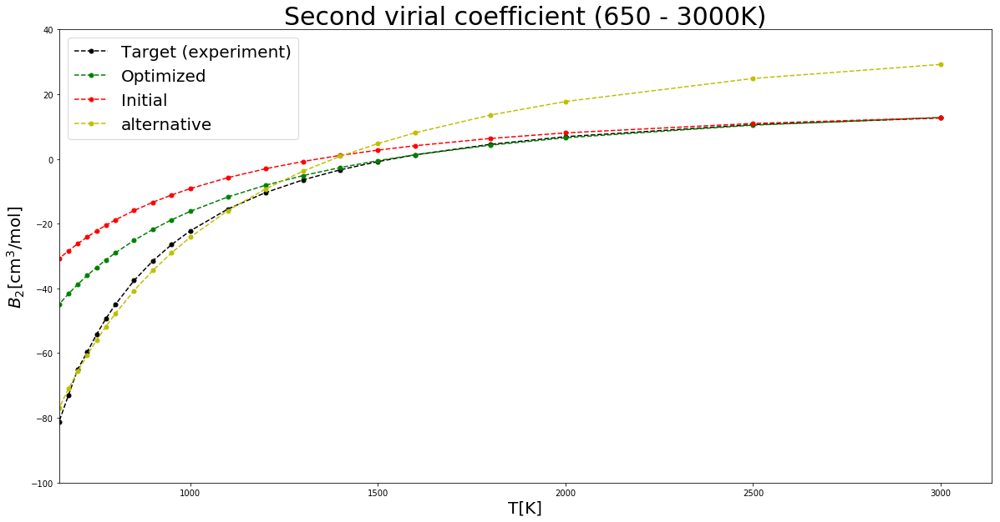

In [373]:
plt.figure(figsize=(20,10))
Temp = np.array(target_eos)[:,1]
plt.plot(Temp, np.array(target_eos)[:,2]*1e6, 'ko--', ms=5, label='Target (experiment)')
plt.plot(Temp, b2_model*1e6, 'go--', ms=5, label='Optimized')
plt.plot(Temp, b2_start*1e6, 'ro--', ms=5, label='Initial')
plt.plot(Temp, b2_dens*1e6, 'yo--', ms=5, label='alternative')

#plt.plot(Temp, b2_b2opt*1e6, 'yo--', ms=2)
plt.xlabel('T[K]', fontsize=20)
plt.ylabel('$B_2$[cm$^3$/mol]', fontsize=20)
plt.legend(fontsize=20)

plt.ylim(-100,40)
plt.xlim(650,)
plt.title('Second virial coefficient (650 - 3000K)', fontsize=30)

In [411]:
print(np.linspace(2.83, 4.0, 40))
print(np.linspace(352., 469., 40))

[2.83 2.86 2.89 2.92 2.95 2.98 3.01 3.04 3.07 3.1  3.13 3.16 3.19 3.22
 3.25 3.28 3.31 3.34 3.37 3.4  3.43 3.46 3.49 3.52 3.55 3.58 3.61 3.64
 3.67 3.7  3.73 3.76 3.79 3.82 3.85 3.88 3.91 3.94 3.97 4.  ]
[352. 355. 358. 361. 364. 367. 370. 373. 376. 379. 382. 385. 388. 391.
 394. 397. 400. 403. 406. 409. 412. 415. 418. 421. 424. 427. 430. 433.
 436. 439. 442. 445. 448. 451. 454. 457. 460. 463. 466. 469.]


In [408]:
sig_list = np.linspace(2.83, 4.0, 40)
eps_list = np.linspace(352., 469., 40)

n_sig = len(sig_list)
n_eps = len(eps_list)

s2_profiles = np.empty((n_sig, n_eps), dtype=float)
pars_profiles = np.empty((n_sig, n_eps, 2), dtype=float)
for i, j in product(range(n_sig), range(n_eps)):
    sig = sig_list[i]
    eps = eps_list[j]
    pars_in = np.array([sig, eps])
    print(pars_in)
    s2 = loss_rho(pars_in, target_eos)
    s2_profiles[i, j] = s2
    pars_profiles[i, j, :] = pars_in

[  2.83 352.  ]
rho 0.01850344615965223 0.018503425833548887
fac -27.910335782925287 0.9999999999993211
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -21.829695222539772 -2.0326103342127588e-08 7.563018825258676e-13 2.83 352.0
rho 0.01781812975658029 0.01781811289294224
fac -19.950322762122568 0.9999999999994962
dat 100.0 675.0 0.01781812975658029 -73.04 -19.926262237220218 -1.686363804848101e-08 2.166131970265861e-09 2.83 352.0
rho 0.0171817647899747 0.017181750984501715
fac -13.86578234310796 0.9999999999996368
dat 100.0 700.0 0.0171817647899747 -64.94 -18.179338933643812 -1.380547298354684e-08 9.509709296036807e-07 2.83 352.0
rho 0.01658928806727122 0.016589276192736237
fac -10.624661266161025 0.9999999999997117
dat 100.0 725.0 0.01658928806727122 -59.72 -16.57077210198621 -1.1874534983774554e-08 2.4309064167488774e-05 2.83 352.0
rho 0.016036309856603446 0.01603629979052148
fac -7.89816409319039 0.9999999999997783
dat 100.0 750.0 0.016036309856603446 -54.23 -15.085100414810

fac -3.9620972601304025 0.9999999999998813
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -14.4623735434377 -6.903121537935042e-09 0.01902317587730536 2.83 370.0
rho 0.01414968038663429 0.014149675268714298
fac -2.313929598558273 0.9999999999999264
dat 100.0 850.0 0.01414968038663429 -37.58 -12.01025755907577 -5.117919992317366e-09 0.09887196006920186 2.83 370.0
rho 0.013363585552865114 0.013363581688093833
fac -1.3971223230399203 0.9999999999999528
dat 100.0 900.0 0.013363585552865114 -31.51 -9.86763197382371 -3.864771280781554e-09 0.24730761236103882 2.83 370.0
rho 0.012660237856176829 0.012660234891917341
fac -0.8675618502765001 0.9999999999999691
dat 100.0 950.0 0.012660237856176829 -26.47 -7.980823052857466 -2.9642594871759353e-09 0.4199742621084908 2.83 370.0
rho 0.012027225147907982 0.012027222847344034
fac -0.550063824209251 0.9999999999999795
dat 100.0 1000.0 0.012027225147907982 -22.22 -6.307846203270036 -2.30056394767697e-09 0.5769129881901358 2.83 370.0
rho 0.010933

dat 100.0 1200.0 0.010022685988919037 -10.43 -2.1957620810192098 -8.202342763330428e-10 0.9195161479270044 2.83 385.0
rho 0.009251709740190414 0.009251709139448942
fac -0.048759947607622506 0.9999999999999979
dat 100.0 1300.0 0.009251709740190414 -6.5 -0.19657069222528767 -6.007414721925786e-10 0.9524097304936499 2.83 385.0
rho 0.008590873067328336 0.008590872684357672
fac -0.021340457645573144 0.999999999999999
dat 100.0 1400.0 0.008590873067328336 -3.37 1.4791045969737207 -3.829706638619479e-10 0.9788856387311654 2.83 385.0
rho 0.00801814798419221 0.008018147792559426
fac -0.005725001137139215 0.9999999999999997
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.9006791927595414 -1.916327842937937e-10 0.994291355453152 2.83 385.0
rho 0.007517013642936963 0.007517013482709627
fac -0.0042691156437546654 0.9999999999999997
dat 100.0 1600.0 0.007517013642936963 1.26 4.119206708950504 -1.6022733573956005e-10 0.9957399840765766 2.83 385.0
rho 0.006681789766372782 0.0066817896920836

dat 100.0 1000.0 0.012027225147907982 -22.22 -9.156940203932557 -1.8913699304651255e-09 0.6894992001945649 2.83 403.0
rho 0.010933839971426681 0.010933838834703438
fac -0.14772251775714523 0.9999999999999939
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -5.998149492501216 -1.1367232433112662e-09 0.8626704574672367 2.83 403.0
rho 0.010022685988919037 0.010022685283885937
fac -0.061993314530960915 0.9999999999999972
dat 100.0 1200.0 0.010022685988919037 -10.43 -3.4326720369406525 -7.050330996100085e-10 0.9398891703700307 2.83 403.0
rho 0.009251709740190414 0.009251709307512236
fac -0.02529402697287473 0.9999999999999988
dat 100.0 1300.0 0.009251709740190414 -6.5 -1.31255618132585 -4.3267817800840547e-10 0.9750231867618298 2.83 403.0
rho 0.008590873067328336 0.008590872840323253
fac -0.007497972959135508 0.9999999999999994
dat 100.0 1400.0 0.008590873067328336 -3.37 0.46497654291999563 -2.2700508313377998e-10 0.9925300667161032 2.83 403.0
rho 0.00801814798419221 0.008018147810

dat 100.0 900.0 0.013363585552865114 -31.51 -14.943102219597348 -2.9589949396974236e-09 0.44087950946629106 2.83 421.0
rho 0.012660237856176829 0.012660235649642006
fac -0.480717067580513 0.999999999999983
dat 100.0 950.0 0.012660237856176829 -26.47 -12.714542884683734 -2.2065348229127757e-09 0.6183398413433404 2.83 421.0
rho 0.012027225147907982 0.012027223486617998
fac -0.28683710017525005 0.9999999999999892
dat 100.0 1000.0 0.012027225147907982 -22.22 -10.739526434686328 -1.6612899840506845e-09 0.750633997024623 2.83 421.0
rho 0.010933839971426681 0.010933839005710336
fac -0.10661943448795494 0.9999999999999956
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -7.39850577231558 -9.657163454329654e-10 0.8988676859481691 2.83 421.0
rho 0.010022685988919037 0.010022685409742452
fac -0.04183577586466328 0.9999999999999981
dat 100.0 1200.0 0.010022685988919037 -10.43 -4.685281983883212 -5.791765851637098e-10 0.9590272630639569 2.83 421.0
rho 0.009251709740190414 0.009251709396661

dat 100.0 1600.0 0.007517013642936963 1.26 1.3811135331372333 -1.3602825463254753e-12 0.9999996923032792 2.83 442.0
rho 0.006681789766372782 0.006681789788766908
fac -9.381785144154856e-05 1.0
dat 100.0 1800.0 0.006681789766372782 4.49 3.7473211243270175 2.2394126483749055e-11 0.9999061865493154 2.83 442.0
rho 0.006013610712397289 0.006013610763963284
fac -0.0005527153726271496 0.9999999999999999
dat 100.0 2000.0 0.006013610712397289 6.85 5.574651506378421 5.156599539729578e-11 0.9994474373463763 2.83 442.0
rho 0.004810888531865921 0.0048108885714395755
fac -0.00040690878589909275 0.9999999999999999
dat 100.0 2500.0 0.004810888531865921 10.57 8.68466908236952 3.9573654249391854e-11 0.9995931739902529 2.83 442.0
rho 0.004009073769164794 0.004009073811460154
fac -0.0005577652734018916 1.0
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 10.59394355396514 4.229536079009e-11 0.9994423902487319 2.83 442.0
s2: 0.5836089062171003
[  2.83 445.  ]
rho 0.01850344615965223 0.0185034307083

fac -0.0003574525044233074 1.0
dat 100.0 1400.0 0.008590873067328336 -3.37 -2.8318533571268514 -4.956473946549078e-11 0.9996426113741117 2.83 460.0
rho 0.00801814798419221 0.008018148026308257
fac -0.0002765229213240383 1.0
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -1.0425561422639014 4.2116046761186965e-11 0.9997235153076152 2.83 460.0
rho 0.007517013642936963 0.007517013635155455
fac -1.0069136437480859e-05 1.0
dat 100.0 1600.0 0.007517013642936963 1.26 0.4933301252744913 -7.781508076787347e-12 0.9999899309142561 2.83 460.0
rho 0.006681789766372782 0.006681789810543805
fac -0.0003649994024711561 1.0
dat 100.0 1800.0 0.006681789766372782 4.49 2.9858655854338494 4.4171023609596016e-11 0.999635067201707 2.83 460.0
rho 0.006013610712397289 0.006013610798663154
fac -0.0015468659995354788 0.9999999999999999
dat 100.0 2000.0 0.006013610712397289 6.85 4.912245691268883 8.626586511101264e-11 0.9984543297810244 2.83 460.0
rho 0.004810888531865921 0.004810888576547572
fac -0.0005

rho 0.01781812975658029 0.017818113649064892
fac -18.201386195193283 0.9999999999995404
dat 100.0 675.0 0.01781812975658029 -73.04 -22.306869907773574 -1.610751539787847e-08 1.2451979942002168e-08 2.86 364.0
rho 0.0171817647899747 0.017181751647769167
fac -12.565456829873796 0.9999999999996708
dat 100.0 700.0 0.0171817647899747 -64.94 -20.42252602194564 -1.3142205532168383e-08 3.490530491960802e-06 2.86 364.0
rho 0.01658928806727122 0.01658927677363997
fac -9.610567959731297 0.9999999999997394
dat 100.0 725.0 0.01658928806727122 -59.72 -18.687777290006547 -1.1293631248937563e-08 6.701675067596735e-05 2.86 364.0
rho 0.016036309856603446 0.016036300305051973
fac -7.1113662679340655 0.9999999999998004
dat 100.0 750.0 0.016036309856603446 -54.23 -17.085850827856888 -9.551551473363507e-09 0.0008157796567686054 2.86 364.0
rho 0.015519007928333299 0.015518999801861121
fac -5.319243108133944 0.9999999999998457
dat 100.0 775.0 0.015519007928333299 -49.35 -15.602381018034707 -8.126472177474864e-

dat 100.0 900.0 0.013363585552865114 -31.51 -11.705024295971747 -3.53788861054416e-09 0.3101250859504049 2.86 385.0
rho 0.012660237856176829 0.012660235162470468
fac -0.7164213156779109 0.9999999999999745
dat 100.0 950.0 0.012660237856176829 -26.47 -9.655498790840758 -2.6937063603987843e-09 0.48849730926214646 2.86 385.0
rho 0.012027225147907982 0.012027223065251738
fac -0.4507955683158412 0.9999999999999831
dat 100.0 1000.0 0.012027225147907982 -22.22 -7.838441009759898 -2.0826562436432328e-09 0.6371210766001995 2.86 385.0
rho 0.010933839971426681 0.010933838688187708
fac -0.18825751053205583 0.9999999999999922
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -4.763627594702012 -1.2832389734152017e-09 0.8284013576896015 2.86 385.0
rho 0.010022685988919037 0.010022685170839443
fac -0.08346741637388823 0.9999999999999962
dat 100.0 1200.0 0.010022685988919037 -10.43 -2.266334832410935 -8.180795936507668e-10 0.9199210605467908 2.86 385.0
rho 0.009251709740190414 0.009251709148587

dat 100.0 1600.0 0.007517013642936963 1.26 3.2244575910885915 -1.0212394992159535e-10 0.998267220266586 2.86 406.0
rho 0.006681789766372782 0.00668178971290809
fac -0.0005347507138336273 1.0
dat 100.0 1800.0 0.006681789766372782 4.49 5.40889345971399 -5.346469187511582e-11 0.9994653922398467 2.86 406.0
rho 0.006013610712397289 0.006013610706437653
fac -7.382681706517511e-06 1.0
dat 100.0 2000.0 0.006013610712397289 6.85 7.0925456436328025 -5.959635562824417e-12 0.9999926173455455 2.86 406.0
rho 0.004810888531865921 0.004810888539966302
fac -1.704887049522137e-05 1.0
dat 100.0 2500.0 0.004810888531865921 10.57 9.946765713752754 8.100380609332714e-12 0.9999829512748359 2.86 406.0
rho 0.004009073769164794 0.004009073790059222
fac -0.0001361215866010923 1.0
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 11.686683702529727 2.0894428548468014e-11 0.9998638876775218 2.86 406.0
s2: 0.6337946721901233
[  2.86 409.  ]
rho 0.01850344615965223 0.018503429107592433
fac -19.643115999210764

dat 100.0 725.0 0.01658928806727122 -59.72 -27.69044898683817 -8.814917722838045e-09 0.0028658687549285413 2.86 430.0
rho 0.016036309856603446 0.01603630251727314
fac -4.198730343805696 0.9999999999998822
dat 100.0 750.0 0.016036309856603446 -54.23 -25.694019970035004 -7.339330306693759e-09 0.015014628139226376 2.86 430.0
rho 0.015519007928333299 0.015519001784885324
fac -3.0399750570968185 0.9999999999999118
dat 100.0 775.0 0.015519007928333299 -49.35 -23.847110957569026 -6.1434479742966674e-09 0.04783608265009183 2.86 430.0
rho 0.01503403758768624 0.015034032419582104
fac -2.220733937414288 0.9999999999999335
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -22.133837818357467 -5.168104135616636e-09 0.10852942578121205 2.86 430.0
rho 0.01414968038663429 0.014149676676653296
fac -1.2159240859436014 0.9999999999999614
dat 100.0 850.0 0.01414968038663429 -37.58 -19.055115797215024 -3.7099809942903184e-09 0.2964359553869932 2.86 430.0
rho 0.013363585552865114 0.013363582848022432
f

dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -10.084051754338539 -6.438249777057647e-10 0.9537168199492672 2.86 451.0
rho 0.010022685988919037 0.010022685650087994
fac -0.014318324666137791 0.9999999999999993
dat 100.0 1200.0 0.010022685988919037 -10.43 -7.025203079886903 -3.3883104308407574e-10 0.9857836950469281 2.86 451.0
rho 0.009251709740190414 0.00925170956635622
fac -0.00408280273516273 0.9999999999999997
dat 100.0 1300.0 0.009251709740190414 -6.5 -4.49730988308125 -1.738341953022582e-10 0.9959255205725965 2.86 451.0
rho 0.008590873067328336 0.008590872998665108
fac -0.0006859952725682278 1.0
dat 100.0 1400.0 0.008590873067328336 -3.37 -2.3771282444962916 -6.866322788123824e-11 0.9993142399683943 2.86 451.0
rho 0.00801814798419221 0.008018148002696745
fac -5.338168508912682e-05 0.9999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -0.5766381841344348 1.8504534710084286e-11 0.9999466197396876 2.86 451.0
rho 0.007517013642936963 0.007517013633583

fac -0.0727602253708805 0.9999999999999966
dat 100.0 1300.0 0.009251709740190414 -6.5 1.9273450065119482 -7.33842755659686e-10 0.9298237514444203 2.89 352.0
rho 0.008590873067328336 0.008590872538482943
fac -0.04069398073377042 0.999999999999998
dat 100.0 1400.0 0.008590873067328336 -3.37 3.5157237550273126 -5.288453928248282e-10 0.9601229011013733 2.89 352.0
rho 0.00801814798419221 0.008018147635684616
fac -0.018934788633284606 0.9999999999999988
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.8619395927901365 -3.485075943110427e-10 0.9812433483762986 2.89 352.0
rho 0.007517013642936963 0.007517013378818175
fac -0.01160014174502173 0.9999999999999992
dat 100.0 1600.0 0.007517013642936963 1.26 6.0145886498685 -2.641187876045725e-10 0.9884668804930826 2.89 352.0
rho 0.006681789766372782 0.006681789609039653
fac -0.004630816828640248 0.9999999999999997
dat 100.0 1800.0 0.006681789766372782 4.49 7.87691705104368 -1.5733312829641077e-10 0.9953798888718551 2.89 352.0
rho 0.006013

rho 0.012027225147907982 0.012027222907641143
fac -0.5216076615764104 0.9999999999999805
dat 100.0 1000.0 0.012027225147907982 -22.22 -6.7176182121426375 -2.240266838357541e-09 0.5935655280089663 2.89 370.0
rho 0.010933839971426681 0.010933838572480958
fac -0.22373759538685353 0.9999999999999906
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -3.702545729291383 -1.398945723152245e-09 0.7995249058692748 2.89 370.0
rho 0.010022685988919037 0.01002268508563453
fac -0.1017595035526521 0.9999999999999953
dat 100.0 1200.0 0.010022685988919037 -10.43 -1.2539414981832613 -9.032845062206807e-10 0.9032467531849487 2.89 370.0
rho 0.009251709740190414 0.009251709119202136
fac -0.05210204990981474 0.9999999999999974
dat 100.0 1300.0 0.009251709740190414 -6.5 0.768860673251573 -6.209882781604836e-10 0.9492319928607159 2.89 370.0
rho 0.008590873067328336 0.008590872621772506
fac -0.028885306499593845 0.9999999999999986
dat 100.0 1400.0 0.008590873067328336 -3.37 2.4638012471285586 -4.455558

rho 0.00801814798419221 0.00801814779326595
fac -0.005682864394214623 0.9999999999999996
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.9255125046768806 -1.9092626091232745e-10 0.9943332525350859 2.89 388.0
rho 0.007517013642936963 0.0075170134751214954
fac -0.0046830486587684335 0.9999999999999997
dat 100.0 1600.0 0.007517013642936963 1.26 4.236492652020339 -1.6781546725158636e-10 0.9953278997163427 2.89 388.0
rho 0.006681789766372782 0.006681789676472256
fac -0.0015119648680603363 0.9999999999999999
dat 100.0 1800.0 0.006681789766372782 4.49 6.358881884096134 -8.990052539209481e-11 0.9984891775749702 2.89 388.0
rho 0.006013610712397289 0.006013610679853083
fac -0.00022015173062708712 0.9999999999999999
dat 100.0 2000.0 0.006013610712397289 6.85 7.992707369842271 -3.254420604531516e-11 0.9997798725009868 2.89 388.0
rho 0.004810888531865921 0.00481088851990046
fac -3.720006330499927e-05 1.0
dat 100.0 2500.0 0.004810888531865921 10.57 10.755822966713682 -1.1965461607643668e-

dat 100.0 675.0 0.01781812975658029 -73.04 -30.389419343089493 -1.3541176194231674e-08 2.590845489513809e-06 2.89 412.0
rho 0.0171817647899747 0.017181753912223142
fac -8.608350822344068 0.9999999999997746
dat 100.0 700.0 0.0171817647899747 -64.94 -28.096706653880766 -1.0877751557142323e-08 0.00018257476048253544 2.89 412.0
rho 0.01658928806727122 0.01658927878481351
fac -6.492436747797589 0.9999999999998239
dat 100.0 725.0 0.01658928806727122 -59.72 -25.987921585569236 -9.28245771220082e-09 0.0015148531918314466 2.89 412.0
rho 0.016036309856603446 0.016036302094079156
fac -4.696897450362751 0.9999999999998682
dat 100.0 750.0 0.016036309856603446 -54.23 -24.042176520047793 -7.762524290022554e-09 0.009123539470397351 2.89 412.0
rho 0.015519007928333299 0.015519001399982715
fac -3.432832430265091 0.9999999999999004
dat 100.0 775.0 0.015519007928333299 -49.35 -22.241613788994176 -6.5283505840812994e-09 0.032295336813820276 2.89 412.0
rho 0.01503403758768624 0.0150340320661153
fac -2.53489

rho 0.004810888531865921 0.004810888551517127
fac -0.00010033747709572711 1.0
dat 100.0 2500.0 0.004810888531865921 10.57 9.590955290914458 1.965120600966319e-11 0.9998996675565406 2.89 430.0
rho 0.004009073769164794 0.004009073797195761
fac -0.0002449865126864187 1.0
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 11.544615717211862 2.803096730424892e-11 0.9997550434940589 2.89 430.0
s2: 0.5862074950557437
[  2.89 433.  ]
rho 0.01850344615965223 0.018503430816284572
fac -15.903693992466776 0.9999999999996132
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -36.387508427073726 -1.5343367656267537e-08 1.2391202580266816e-07 2.89 433.0
rho 0.01781812975658029 0.017818117270704942
fac -10.936672606208354 0.9999999999997238
dat 100.0 675.0 0.01781812975658029 -73.04 -33.71134159581835 -1.2485875347523212e-08 1.7793584157888156e-05 2.89 433.0
rho 0.0171817647899747 0.017181754847760355
fac -7.19130808709099 0.9999999999998116
dat 100.0 700.0 0.0171817647899747 -64.94 -31.2594

fac -0.47833337690206856 0.9999999999999839
dat 100.0 900.0 0.013363585552865114 -31.51 -18.856597312318762 -2.261371754783137e-09 0.6198155303535946 2.89 448.0
rho 0.012660237856176829 0.012660236225160357
fac -0.26265437219321386 0.9999999999999906
dat 100.0 950.0 0.012660237856176829 -26.47 -16.28363369956329 -1.631016471187463e-09 0.7690076418088039 2.89 448.0
rho 0.012027225147907982 0.012027223960683816
fac -0.14649063468011617 0.9999999999999944
dat 100.0 1000.0 0.012027225147907982 -22.22 -14.00428421859008 -1.1872241661992078e-09 0.8637338214404112 2.89 448.0
rho 0.010933839971426681 0.01093383933317054
fac -0.04657224724174259 0.9999999999999981
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -10.149954283037959 -6.382561406476084e-10 0.9544955984045953 2.89 448.0
rho 0.010022685988919037 0.010022685649952848
fac -0.014329748892539447 0.9999999999999993
dat 100.0 1200.0 0.010022685988919037 -10.43 -7.020751708125742 -3.389661884511952e-10 0.9857724332951414 2.89 448

dat 100.0 775.0 0.015519007928333299 -49.35 -29.8389402986087 -4.698912682565837e-09 0.16890065211201907 2.89 469.0
rho 0.01503403758768624 0.015034033712748399
fac -1.2484278319887285 0.9999999999999626
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -27.854241287601166 -3.874937841083503e-09 0.2869555848012177 2.89 469.0
rho 0.01414968038663429 0.014149677726753627
fac -0.6250105496201176 0.9999999999999801
dat 100.0 850.0 0.01414968038663429 -37.58 -24.290709620962552 -2.6598806629474225e-09 0.5352557817440309 2.89 469.0
rho 0.013363585552865114 0.013363583709980866
fac -0.3176748654645184 0.9999999999999892
dat 100.0 900.0 0.013363585552865114 -31.51 -21.18351503688183 -1.8428842479822904e-09 0.7278393956717248 2.89 469.0
rho 0.012660237856176829 0.012660236572663613
fac -0.16265544737089957 0.9999999999999942
dat 100.0 950.0 0.012660237856176829 -26.47 -18.451792931618773 -1.2835132158495188e-09 0.8498839677282588 2.89 469.0
rho 0.012027225147907982 0.012027224252388757
fac

fac -0.049065496888357756 0.9999999999999976
dat 100.0 1300.0 0.009251709740190414 -6.5 0.7930538424015964 -6.026207727272137e-10 0.9521187668396632 2.92 370.0
rho 0.008590873067328336 0.008590872629901951
fac -0.027840861508268554 0.9999999999999984
dat 100.0 1400.0 0.008590873067328336 -3.37 2.5413278555213847 -4.3742638504429276e-10 0.9725431235328651 2.92 370.0
rho 0.00801814798419221 0.00801814768773348
fac -0.013701384522623294 0.9999999999999992
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.023910596673203 -2.9645873082795315e-10 0.9863920522219101 2.92 370.0
rho 0.007517013642936963 0.007517013419420453
fac -0.00830775953965151 0.9999999999999994
dat 100.0 1600.0 0.007517013642936963 1.26 5.294149035452763 -2.2351650998814199e-10 0.9917266545274258 2.92 370.0
rho 0.006681789766372782 0.006681789634831309
fac -0.0032369996045343184 0.9999999999999997
dat 100.0 1800.0 0.006681789766372782 4.49 7.348692081357773 -1.3154147302657515e-10 0.9967682338302868 2.92 370.0
rh

rho 0.01850344615965223 0.018503428933743567
fac -20.04568833786486 0.9999999999995125
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -30.885920257325672 -1.7225908661294698e-08 1.9691017987974513e-09 2.92 394.0
rho 0.01781812975658029 0.017818115602144097
fac -14.055051225702496 0.9999999999996451
dat 100.0 675.0 0.01781812975658029 -73.04 -28.456775669102985 -1.4154436192570508e-08 7.869892676173658e-07 2.92 394.0
rho 0.0171817647899747 0.017181753362681854
fac -9.500105360638841 0.9999999999997512
dat 100.0 700.0 0.0171817647899747 -64.94 -26.229264040736858 -1.1427292844617964e-08 7.4843943866512e-05 2.92 394.0
rho 0.01658928806727122 0.016589278287466477
fac -7.206794793577334 0.9999999999998044
dat 100.0 725.0 0.01658928806727122 -59.72 -24.17972560794387 -9.77980474381468e-09 0.0007415301075939161 2.92 394.0
rho 0.016036309856603446 0.01603630164226837
fac -5.259566870499369 0.9999999999998523
dat 100.0 750.0 0.016036309856603446 -54.23 -22.28804324420936 -8.214335076722

dat 100.0 850.0 0.01414968038663429 -37.58 -18.478257861200724 -3.824695357299013e-09 0.27464374055649193 2.92 415.0
rho 0.013363585552865114 0.013363582736079996
fac -0.7421543223819573 0.999999999999975
dat 100.0 900.0 0.013363585552865114 -31.51 -15.747853559160442 -2.8167851176541525e-09 0.4760871647073064 2.92 415.0
rho 0.012660237856176829 0.012660235754464406
fac -0.4361285798598299 0.9999999999999845
dat 100.0 950.0 0.012660237856176829 -26.47 -13.344911157766587 -2.101712422153401e-09 0.6465345892638306 2.92 415.0
rho 0.012027225147907982 0.012027223554070795
fac -0.26401727070607695 0.9999999999999901
dat 100.0 1000.0 0.012027225147907982 -22.22 -11.215188992380773 -1.5938371872303847e-09 0.7679602763259542 2.92 415.0
rho 0.010933839971426681 0.01093383902854038
fac -0.10163794177413754 0.9999999999999958
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -7.612204572865918 -9.428863020216616e-10 0.9033565601407331 2.92 415.0
rho 0.010022685988919037 0.0100226854116949

dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 0.26535820187999193 -2.9427193320996636e-10 0.9865907203726823 2.92 436.0
rho 0.007517013642936963 0.0075170136098816395
fac -0.00018169689353539958 1.0
dat 100.0 1600.0 0.007517013642936963 1.26 1.8395988099901017 -3.305532323555349e-11 0.9998183196123455 2.92 436.0
rho 0.006681789766372782 0.006681789770037148
fac -2.511973494252449e-06 1.0
dat 100.0 1800.0 0.006681789766372782 4.49 4.392791829125569 3.664366553246534e-12 0.9999974880296607 2.92 436.0
rho 0.006013610712397289 0.006013610731507417
fac -7.591051652707512e-05 1.0
dat 100.0 2000.0 0.006013610712397289 6.85 6.363959140429823 1.9110128410271265e-11 0.9999240923646033 2.92 436.0
rho 0.004810888531865921 0.004810888543701511
fac -3.639691464547174e-05 1.0
dat 100.0 2500.0 0.004810888531865921 10.57 9.716810736580461 1.1835589799891189e-11 0.9999636037477142 2.92 436.0
rho 0.004009073769164794 0.00400907378891115
fac -0.0001215737889491649 1.0
dat 100.0 3000.0 0.0040090

dat 100.0 700.0 0.0171817647899747 -64.94 -36.51990174478496 -8.390719848094808e-09 0.0059640504143399845 2.92 460.0
rho 0.01658928806727122 0.01658928098732019
fac -3.7769582979243803 0.9999999999998976
dat 100.0 725.0 0.01658928806727122 -59.72 -33.996027375875194 -7.079951031691012e-09 0.022892216937313106 2.92 460.0
rho 0.016036309856603446 0.016036304054115436
fac -2.6244213233827844 0.9999999999999263
dat 100.0 750.0 0.016036309856603446 -54.23 -31.66938506714584 -5.802488010908657e-09 0.07248168835896707 2.92 460.0
rho 0.015519007928333299 0.015519003152579878
fac -1.837085562996444 0.9999999999999467
dat 100.0 775.0 0.015519007928333299 -49.35 -29.518120178220293 -4.775753421198958e-09 0.15928096463918748 2.92 460.0
rho 0.01503403758768624 0.01503403363617252
fac -1.2982578381486571 0.9999999999999611
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -27.523468588268564 -3.951513720401589e-09 0.2730070013518121 2.92 460.0
rho 0.01414968038663429 0.014149677654660927
fac -0

dat 100.0 1000.0 0.012027225147907982 -22.22 -6.278353181900884 -2.309803709410474e-09 0.5743644559745268 2.95 361.0
rho 0.010933839971426681 0.010933838494039134
fac -0.249531920274285 0.9999999999999898
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -3.171187731436331 -1.4773875473689246e-09 0.779165409258729 2.95 361.0
rho 0.010022685988919037 0.01002268496581393
fac -0.1305468413748867 0.9999999999999944
dat 100.0 1200.0 0.010022685988919037 -10.43 -0.6479891641643816 -1.0231051075781927e-09 0.8776153832747501 2.95 361.0
rho 0.009251709740190414 0.009251709015948939
fac -0.07086875371999389 0.9999999999999968
dat 100.0 1300.0 0.009251709740190414 -6.5 1.4361039613896283 -7.242414758190652e-10 0.9315841510587378 2.95 361.0
rho 0.008590873067328336 0.0085908725689958
fac -0.03613359811968003 0.9999999999999981
dat 100.0 1400.0 0.008590873067328336 -3.37 3.1820137557356345 -4.983325366941793e-10 0.9645114279620316 2.95 361.0
rho 0.00801814798419221 0.008018147651188986
fac 

fac -0.000732429962178417 1.0
dat 100.0 2000.0 0.006013610712397289 6.85 8.737390450861739 -5.936024415065244e-11 0.9992678381991725 2.95 382.0
rho 0.004810888531865921 0.004810888503730261
fac -0.00020568328270480023 1.0
dat 100.0 2500.0 0.004810888531865921 10.57 11.611990741774711 -2.8135660468109336e-11 0.9997943378686515 2.95 382.0
rho 0.004009073769164794 0.004009073763908536
fac -8.614284934877898e-06 1.0
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 13.354191741277722 -5.256257235020101e-12 0.999991385752168 2.95 382.0
s2: 0.6811536584144928
[  2.95 385.  ]
rho 0.01850344615965223 0.01850342873147901
fac -20.519200548871865 0.9999999999995011
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -30.29903848049239 -1.7428173217093335e-08 1.2263782187144823e-09 2.95 385.0
rho 0.01781812975658029 0.017818115416473546
fac -14.426203623333537 0.9999999999996356
dat 100.0 675.0 0.01781812975658029 -73.04 -27.87062424475911 -1.4340106744420433e-08 5.429744218699164e-07 2.

rho 0.015519007928333299 0.015519001539186155
fac -3.2879972169496416 0.9999999999999046
dat 100.0 775.0 0.015519007928333299 -49.35 -22.825543497621897 -6.389147143640028e-09 0.037328535539449766 2.95 406.0
rho 0.01503403758768624 0.015034032182611963
fac -2.429055068963343 0.9999999999999272
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -21.082517641558066 -5.405074277042843e-09 0.08812006063403395 2.95 406.0
rho 0.01414968038663429 0.014149676454616148
fac -1.365822075492552 0.9999999999999566
dat 100.0 850.0 0.01414968038663429 -37.58 -17.948879267843978 -3.9320181416391264e-09 0.25517082006359015 2.95 406.0
rho 0.013363585552865114 0.013363582641900242
fac -0.7926121402969942 0.9999999999999732
dat 100.0 900.0 0.013363585552865114 -31.51 -15.21251354458213 -2.910964871927213e-09 0.4526608360110736 2.95 406.0
rho 0.012660237856176829 0.01266023566648579
fac -0.4734058836797525 0.9999999999999832
dat 100.0 950.0 0.012660237856176829 -26.47 -12.803978209084507 -2.18969103786

dat 100.0 1200.0 0.010022685988919037 -10.43 -5.783698304982003 -4.6012421130170456e-10 0.9739411660946101 2.95 427.0
rho 0.009251709740190414 0.009251709451510826
fac -0.01125952678198782 0.9999999999999994
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.197314302415545 -2.8867958891398704e-10 0.9888036244498017 2.95 427.0
rho 0.008590873067328336 0.008590872854348069
fac -0.006600113962237488 0.9999999999999997
dat 100.0 1400.0 0.008590873067328336 -3.37 -1.0283261608352243 -2.1298026710303564e-10 0.9934216189503999 2.95 427.0
rho 0.00801814798419221 0.008018147970485225
fac -2.9290031150877565e-05 0.9999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 0.8131521596014243 -1.3706985199646304e-11 0.9999707103977978 2.95 427.0
rho 0.007517013642936963 0.007517013602554112
fac -0.000271180610749999 0.9999999999999999
dat 100.0 1600.0 0.007517013642936963 1.26 2.39310093913402 -4.0382850709230755e-11 0.9997288561553882 2.95 427.0
rho 0.006681789766372782 0.0066817897432

dat 100.0 3000.0 0.004009073769164794 12.639999999999999 11.858540891062999 1.5718573144474224e-11 0.9999229672290897 2.95 448.0
s2: 0.5271750099169734
[  2.95 451.  ]
rho 0.01850344615965223 0.018503432718095344
fac -12.205503766304597 0.9999999999997031
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -41.94293145306771 -1.3441556884902228e-08 5.0028452053387735e-06 2.95 451.0
rho 0.01781812975658029 0.017818118927671763
fac -8.226527079183336 0.9999999999997922
dat 100.0 675.0 0.01781812975658029 -73.04 -38.933029560858465 -1.0828908526827608e-08 0.00026746359905586287 2.95 451.0
rho 0.0171817647899747 0.01718175629820178
fac -5.2461214512066405 0.9999999999998626
dat 100.0 700.0 0.0171817647899747 -64.94 -36.17643304081282 -8.491772920254936e-09 0.005267910675992597 2.95 451.0
rho 0.01658928806727122 0.016589280890712335
fac -3.8807368192239795 0.9999999999998948
dat 100.0 725.0 0.01658928806727122 -59.72 -33.64299687469922 -7.176558885352291e-09 0.020635614861041946 2.95 451

dat 100.0 850.0 0.01414968038663429 -37.58 -11.830098851251845 -5.153948136327191e-09 0.09569180795365409 2.98 352.0
rho 0.013363585552865114 0.013363581617660405
fac -1.448510004741744 0.9999999999999513
dat 100.0 900.0 0.013363585552865114 -31.51 -9.483835986074142 -3.935204708968576e-09 0.23492005722323606 2.98 352.0
rho 0.012660237856176829 0.012660234798368213
fac -0.9231847333882038 0.9999999999999672
dat 100.0 950.0 0.012660237856176829 -26.47 -7.417382906384047 -3.0578086156890505e-09 0.3972518830398061 2.98 352.0
rho 0.012027225147907982 0.012027222743218293
fac -0.6009835053480429 0.9999999999999775
dat 100.0 1000.0 0.012027225147907982 -22.22 -5.584979273744484 -2.404689688692563e-09 0.548272142255872 2.98 352.0
rho 0.010933839971426681 0.010933838418862807
fac -0.2755727045141963 0.9999999999999886
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -2.48406303645358 -1.5525638743379977e-09 0.75913723738356 2.98 352.0
rho 0.010022685988919037 0.010022682794292165
fac 

dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.099919142255673 -3.036523324451146e-10 0.9857284353434075 2.98 373.0
rho 0.007517013642936963 0.007517013401580549
fac -0.009686845939772178 0.9999999999999994
dat 100.0 1600.0 0.007517013642936963 1.26 5.46455539487984 -2.413564140213431e-10 0.9903599204243505 2.98 373.0
rho 0.006681789766372782 0.006681789624594484
fac -0.0037604235117622347 0.9999999999999997
dat 100.0 1800.0 0.006681789766372782 4.49 7.672143656233199 -1.4177829743555748e-10 0.9962466380265 2.98 373.0
rho 0.006013610712397289 0.0060136106312684914
fac -0.00136812198724317 0.9999999999999998
dat 100.0 2000.0 0.006013610712397289 6.85 9.369564544902895 -8.112879725657995e-11 0.9986328134649897 2.98 373.0
rho 0.004810888531865921 0.004810888492678599
fac -0.000399002809363937 0.9999999999999999
dat 100.0 2500.0 0.004810888531865921 10.57 12.233737434308212 -3.918732265767444e-11 0.9996010767816709 2.98 373.0
rho 0.004009073769164794 0.004009073753752874
fac -7

fac -8.484615276464137 0.9999999999997778
dat 100.0 700.0 0.0171817647899747 -64.94 -28.363990391062128 -1.0799290788010563e-08 0.00020662287701315343 2.98 397.0
rho 0.01658928806727122 0.016589278831984067
fac -6.4266192947273595 0.9999999999998257
dat 100.0 725.0 0.01658928806727122 -59.72 -26.163449225236228 -9.235287153075422e-09 0.001617911280402879 2.98 397.0
rho 0.016036309856603446 0.01603630211514409
fac -4.671440362785187 0.9999999999998689
dat 100.0 750.0 0.016036309856603446 -54.23 -24.13250027437384 -7.741459355503633e-09 0.009358779776165135 2.98 397.0
rho 0.015519007928333299 0.015519001401338392
fac -3.4314068531328066 0.9999999999999005
dat 100.0 775.0 0.015519007928333299 -49.35 -22.252639712166413 -6.526994906358441e-09 0.03234140913948581 2.98 397.0
rho 0.01503403758768624 0.015034032050563962
fac -2.5491903284556856 0.9999999999999237
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -20.507949071556208 -5.537122278048701e-09 0.07814491210507113 2.98 397.0
rho

rho 0.012027225147907982 0.01202722370328285
fac -0.21689760159053964 0.9999999999999919
dat 100.0 1000.0 0.012027225147907982 -22.22 -12.229770218400448 -1.444625131324928e-09 0.805012397073743 2.98 418.0
rho 0.010933839971426681 0.010933839123448719
fac -0.0822065333992613 0.9999999999999967
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -8.36450400194675 -8.479779621539674e-10 0.9210817049146283 2.98 418.0
rho 0.010022685988919037 0.010022685469176893
fac -0.03369005331551273 0.9999999999999984
dat 100.0 1200.0 0.010022685988919037 -10.43 -5.225476785166919 -5.197421434205429e-10 0.9668711367032713 2.98 418.0
rho 0.009251709740190414 0.009251709403123011
fac -0.015350463612408471 0.9999999999999992
dat 100.0 1300.0 0.009251709740190414 -6.5 -2.6312135038706046 -3.370674035024779e-10 0.9847667542050758 2.98 418.0
rho 0.008590873067328336 0.008590872867103597
fac -0.005833217585926898 0.9999999999999997
dat 100.0 1400.0 0.008590873067328336 -3.37 -0.45578167555470384 -2.002

rho 0.006013610712397289 0.006013610723227319
fac -2.438002194916757e-05 1.0
dat 100.0 2000.0 0.006013610712397289 6.85 6.636782659996839 1.0830030448827355e-11 0.9999756202752411 2.98 439.0
rho 0.004810888531865921 0.004810888539162777
fac -1.3834271442045236e-05 1.0
dat 100.0 2500.0 0.004810888531865921 10.57 10.234280170950399 7.296855827898518e-12 0.999986165824251 2.98 439.0
rho 0.004009073769164794 0.004009073782122985
fac -5.235458949480224e-05 0.9999999999999999
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 12.441665963009445 1.2958190943879178e-11 0.9999476467809827 2.98 439.0
s2: 0.5361930637632251
[  2.98 442.  ]
rho 0.01850344615965223 0.018503432587585106
fac -12.44367221858759 0.9999999999996974
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -41.55838811965245 -1.3572067122935572e-08 3.94259185943296e-06 2.98 442.0
rho 0.01781812975658029 0.01781811880306946
fac -8.416932606285602 0.9999999999997874
dat 100.0 675.0 0.01781812975658029 -73.04 -38.5405161

dat 100.0 750.0 0.016036309856603446 -54.23 -34.127445390828164 -5.169058063525522e-09 0.12459267886375355 2.98 463.0
rho 0.015519007928333299 0.015519003706789497
fac -1.4354503304287574 0.9999999999999584
dat 100.0 775.0 0.015519007928333299 -49.35 -31.820716673824606 -4.221543802029881e-09 0.23800815756168242 2.98 463.0
rho 0.01503403758768624 0.015034034126001072
fac -0.9963434685622257 0.9999999999999701
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -29.682024308808714 -3.4616851676827487e-09 0.3692270662285759 2.98 463.0
rho 0.01414968038663429 0.014149678035984643
fac -0.4881337522345981 0.9999999999999845
dat 100.0 850.0 0.01414968038663429 -37.58 -25.84149339881131 -2.350649647153702e-09 0.6137707743398885 2.98 463.0
rho 0.013363585552865114 0.013363583943346963
fac -0.24231398767300033 0.9999999999999918
dat 100.0 900.0 0.013363585552865114 -31.51 -22.492259055936994 -1.609518150702538e-09 0.7848097182840699 2.98 463.0
rho 0.012660237856176829 0.012660236747049946
fa

dat 100.0 1200.0 0.010022685988919037 -10.43 -0.9305566413194055 -9.212102261568766e-10 0.8995699861855799 3.0100000000000002 364.0
rho 0.009251709740190414 0.009251709047159407
fac -0.06489232610394192 0.9999999999999971
dat 100.0 1300.0 0.009251709740190414 -6.5 1.3071042961704915 -6.930310075814461e-10 0.9371683665142713 3.0100000000000002 364.0
rho 0.008590873067328336 0.008590872556948457
fac -0.03790179795281566 0.9999999999999981
dat 100.0 1400.0 0.008590873067328336 -3.37 3.1818072977818503 -5.103798789846126e-10 0.9628074859150256 3.0100000000000002 364.0
rho 0.00801814798419221 0.00801814764608246
fac -0.017821791494863525 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.771322450862844 -3.38109750266935e-10 0.9823360774044743 3.0100000000000002 364.0
rho 0.007517013642936963 0.007517013360433129
fac -0.013271297914594705 0.9999999999999992
dat 100.0 1600.0 0.007517013642936963 1.26 6.132899074789236 -2.825038336942698e-10 0.9868163774756004 3.010

dat 100.0 3000.0 0.004009073769164794 12.639999999999999 14.11651200269858 -1.930983237891093e-11 0.9998837487113124 3.0100000000000002 385.0
s2: 0.6417116109480762
[  3.01 388.  ]
rho 0.01850344615965223 0.018503429565477354
fac -18.602357930543583 0.9999999999995476
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -32.73255834099981 -1.659417487448467e-08 8.338704815444688e-09 3.0100000000000002 388.0
rho 0.01781812975658029 0.017818116132671716
fac -13.02119085582655 0.9999999999996712
dat 100.0 675.0 0.01781812975658029 -73.04 -30.125999111173684 -1.3623908574206256e-08 2.2129350296382875e-06 3.0100000000000002 388.0
rho 0.0171817647899747 0.017181753806317184
fac -8.776788963250747 0.9999999999997702
dat 100.0 700.0 0.0171817647899747 -64.94 -27.735494980971175 -1.098365751475705e-08 0.00015427266591499576 3.0100000000000002 388.0
rho 0.01658928806727122 0.016589278660347585
fac -6.667714722517928 0.9999999999998191
dat 100.0 725.0 0.01658928806727122 -59.72 -25.535734537884

fac -1.1629194269020342 0.9999999999999629
dat 100.0 850.0 0.01414968038663429 -37.58 -19.456816896139557 -3.6282171243101624e-09 0.31257231552334325 3.0100000000000002 409.0
rho 0.013363585552865114 0.013363582875656168
fac -0.6704267193764463 0.9999999999999775
dat 100.0 900.0 0.013363585552865114 -31.51 -16.52215421122403 -2.6772089458532156e-09 0.5114902684030304 3.0100000000000002 409.0
rho 0.012660237856176829 0.012660235848180709
fac -0.39810139440448417 0.9999999999999859
dat 100.0 950.0 0.012660237856176829 -26.47 -13.939199991890204 -2.0079961200736296e-09 0.6715939283431942 3.0100000000000002 409.0
rho 0.012027225147907982 0.012027223618287498
fac -0.2431710132904776 0.9999999999999908
dat 100.0 1000.0 0.012027225147907982 -22.22 -11.649769121188427 -1.5296204840947736e-09 0.7841374043869217 3.0100000000000002 409.0
rho 0.010933839971426681 0.010933839050748326
fac -0.09690653685562464 0.9999999999999959
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -7.7763438218

fac -8.341875403033634e-06 1.0
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 0.6731318991933474 7.314992361839856e-12 0.9999916581593903 3.0100000000000002 430.0
rho 0.007517013642936963 0.007517013602426332
fac -0.00027289946942383276 1.0
dat 100.0 1600.0 0.007517013642936963 1.26 2.366773532859445 -4.051063044047121e-11 0.9997271377642493 3.0100000000000002 430.0
rho 0.006681789766372782 0.006681789722058306
fac -0.00036737404156583385 0.9999999999999999
dat 100.0 1800.0 0.006681789766372782 4.49 5.113119019370457 -4.431447570008018e-11 0.9996326934320143 3.0100000000000002 430.0
rho 0.006013610712397289 0.006013610700145946
fac -3.1199101554268586e-05 1.0
dat 100.0 2000.0 0.006013610712397289 6.85 7.232768474826589 -1.225134230176117e-11 0.9999688013851327 3.0100000000000002 430.0
rho 0.004810888531865921 0.004810888526169141
fac -8.43225317020324e-06 1.0
dat 100.0 2500.0 0.004810888531865921 10.57 10.835970773774045 -5.696779853403555e-12 0.9999915677823812 3.01000000000

dat 100.0 675.0 0.01781812975658029 -73.04 -41.90696600707566 -9.883682178246644e-09 0.00105621644849635 3.0100000000000002 454.0
rho 0.0171817647899747 0.017181757117548074
fac -4.282595464830635 0.9999999999998878
dat 100.0 700.0 0.0171817647899747 -64.94 -38.952042570611276 -7.672426624583117e-09 0.013806780528673629 3.0100000000000002 454.0
rho 0.01658928806727122 0.016589281603733394
fac -3.14790956523236 0.9999999999999146
dat 100.0 725.0 0.01658928806727122 -59.72 -36.236504135773714 -6.463537826489896e-09 0.04294180013831331 3.0100000000000002 454.0
rho 0.016036309856603446 0.016036304585784675
fac -2.165515020475045 0.9999999999999392
dat 100.0 750.0 0.016036309856603446 -54.23 -33.73288683118686 -5.2708187710248655e-09 0.11469085124731757 3.0100000000000002 454.0
rho 0.015519007928333299 0.015519003608395867
fac -1.5031436536746756 0.9999999999999565
dat 100.0 775.0 0.015519007928333299 -49.35 -31.417740711615473 -4.319937432079035e-09 0.2224298175945247 3.0100000000000002 45

dat 100.0 950.0 0.012660237856176829 -26.47 -8.20886171194993 -2.927889892340163e-09 0.42895486584993775 3.04 355.0
rho 0.012027225147907982 0.012027222836544053
fac -0.5552404885823254 0.9999999999999792
dat 100.0 1000.0 0.012027225147907982 -22.22 -6.242263530497989 -2.311363928378385e-09 0.5739342199715112 3.04 355.0
rho 0.010933839971426681 0.010933838470126392
fac -0.2576750556840678 0.9999999999999895
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -2.9142274889026853 -1.5013002889474603e-09 0.7728463233292328 3.04 355.0
rho 0.010022685988919037 0.010022685024802292
fac -0.11592713821212709 0.9999999999999943
dat 100.0 1200.0 0.010022685988919037 -10.43 -0.21185393655775062 -9.641167447727028e-10 0.8905401072780463 3.04 355.0
rho 0.009251709740190414 0.009251709011660468
fac -0.07171051306492152 0.9999999999999964
dat 100.0 1300.0 0.009251709740190414 -6.5 2.01995939422235 -7.285299464393491e-10 0.9308003113424833 3.04 355.0
rho 0.008590873067328336 0.008590872508278278

dat 100.0 1800.0 0.006681789766372782 4.49 7.997049362216192 -1.6135734415279046e-10 0.9951411053411715 3.04 376.0
rho 0.006013610712397289 0.006013610608895111
fac -0.002226761588691165 0.9999999999999998
dat 100.0 2000.0 0.006013610712397289 6.85 9.818957904437106 -1.0350217731491806e-10 0.9977757158056983 3.04 376.0
rho 0.004810888531865921 0.004810888473978658
fac -0.0008706644465427497 1.0
dat 100.0 2500.0 0.004810888531865921 10.57 12.894645423241144 -5.788726355898666e-11 0.9991297144717682 3.04 376.0
rho 0.004009073769164794 0.00400907373773795
fac -0.0003079410227646173 0.9999999999999999
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 14.755701710201144 -3.142684376622462e-11 0.9996921063862055 3.04 376.0
s2: 0.6545938851698481
[  3.04 379.  ]
rho 0.01850344615965223 0.01850342932762294
fac -19.139458046245743 0.9999999999995345
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -32.03528021145481 -1.6832029287733308e-08 4.873477708199367e-09 3.04 379.0
rho 0.017

dat 100.0 750.0 0.016036309856603446 -54.23 -26.090201671605097 -7.237262403952949e-09 0.016860881269956222 3.04 400.0
rho 0.015519007928333299 0.015519001840712515
fac -2.9849759101814373 0.9999999999999134
dat 100.0 775.0 0.015519007928333299 -49.35 -24.074623260560482 -6.087620784203662e-09 0.050540721051265704 3.04 400.0
rho 0.01503403758768624 0.015034032433293446
fac -2.2089660409722995 0.9999999999999338
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -22.204052196876116 -5.154392794526341e-09 0.10981413315050251 3.04 400.0
rho 0.01414968038663429 0.014149676635027541
fac -1.2433623451036433 0.9999999999999605
dat 100.0 850.0 0.01414968038663429 -37.58 -18.84074475776006 -3.751606749216596e-09 0.288412842295995 3.04 400.0
rho 0.013363585552865114 0.013363582767080022
fac -0.7259087054928591 0.9999999999999755
dat 100.0 900.0 0.013363585552865114 -31.51 -15.903475361853575 -2.785785092190851e-09 0.4838846604631169 3.04 400.0
rho 0.012660237856176829 0.012660235749721522
fa

fac -0.025848931268893895 0.9999999999999989
dat 100.0 1200.0 0.010022685988919037 -10.43 -5.807606441811201 -4.552588341033559e-10 0.974482292292989 3.04 421.0
rho 0.009251709740190414 0.009251709441681015
fac -0.012039376729975645 0.9999999999999994
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.028093740765413 -2.985093994906096e-10 0.9880328065949019 3.04 421.0
rho 0.008590873067328336 0.008590872873770278
fac -0.0054512388930147695 0.9999999999999998
dat 100.0 1400.0 0.008590873067328336 -3.37 -0.6972567079988439 -1.935580584699892e-10 0.9945635921482986 3.04 421.0
rho 0.00801814798419221 0.008018147921899735
fac -0.0006049327846334263 0.9999999999999998
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 1.2814705868777485 -6.229247499767165e-11 0.9993952501503137 3.04 421.0
rho 0.007517013642936963 0.007517013544200819
fac -0.0016211268945873413 0.9999999999999999
dat 100.0 1600.0 0.007517013642936963 1.26 2.9789923440246175 -9.873614339322989e-11 0.9983801864218367 3.04 421

fac -4.964984453348708e-07 1.0
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 13.131643952238544 1.2619029085558786e-12 0.9999995035016779 3.04 442.0
s2: 0.5024246235836883
[  3.04 445.  ]
rho 0.01850344615965223 0.018503433666612036
fac -10.543694196987007 0.9999999999997435
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -44.711518323841574 -1.2493040192629312e-08 2.635917366234605e-05 3.04 445.0
rho 0.01781812975658029 0.017818119736844443
fac -7.043032235915762 0.9999999999998221
dat 100.0 675.0 0.01781812975658029 -73.04 -41.47777305942959 -1.0019735846578115e-08 0.0008734739635142775 3.04 445.0
rho 0.0171817647899747 0.017181756988479416
fac -4.427894560486682 0.9999999999998841
dat 100.0 700.0 0.0171817647899747 -64.94 -38.515773337364536 -7.801495283121795e-09 0.011939601336394361 3.04 445.0
rho 0.01658928806727122 0.01658928148280883
fac -3.2667981835395197 0.9999999999999114
dat 100.0 725.0 0.01658928806727122 -59.72 -35.79322408468112 -6.584462391989732e-09 

rho 0.006013610712397289 0.0060136107512447304
fac -0.00031368921180364485 1.0
dat 100.0 2000.0 0.006013610712397289 6.85 6.088937617523685 3.8847441756473255e-11 0.999686359983513 3.04 460.0
rho 0.004810888531865921 0.004810888537745849
fac -8.983151456379627e-06 1.0
dat 100.0 2500.0 0.004810888531865921 10.57 10.159467893324795 5.8799276211884965e-12 0.999991016888892 3.04 460.0
rho 0.004009073769164794 0.004009073775538992
fac -1.2668264273212517e-05 1.0
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 12.665766954099817 6.374198044389878e-12 0.9999873318159689 3.04 460.0
s2: 0.44856626930044247
[  3.04 463.  ]
rho 0.01850344615965223 0.018503434893759902
fac -8.574082858914567 0.9999999999997915
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -48.295425585522246 -1.1265892326667304e-08 0.00018893965890853388 3.04 463.0
rho 0.01781812975658029 0.01781812081566544
fac -5.608038800827361 0.9999999999998583
dat 100.0 675.0 0.01781812975658029 -73.04 -44.879896211332984 -

dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 5.446297734585438 -3.8047755224202007e-10 0.977684702746301 3.0700000000000003 358.0
rho 0.007517013642936963 0.007517013323932025
fac -0.016922305123336704 0.9999999999999989
dat 100.0 1600.0 0.007517013642936963 1.26 6.859429196745814 -3.190049379167559e-10 0.9832200728296758 3.0700000000000003 358.0
rho 0.006681789766372782 0.0066817895547777876
fac -0.008375833402047747 0.9999999999999994
dat 100.0 1800.0 0.006681789766372782 4.49 9.143488581663552 -2.1159499413031524e-10 0.9916591461614145 3.0700000000000003 358.0
rho 0.006013610712397289 0.006013610574301223
fac -0.003964033956631328 0.9999999999999997
dat 100.0 2000.0 0.006013610712397289 6.85 10.897373976272164 -1.380960658325936e-10 0.9960438124547354 3.0700000000000003 358.0
rho 0.004810888531865921 0.0048108884506104874
fac -0.001715495565558463 0.9999999999999999
dat 100.0 2500.0 0.004810888531865921 10.57 13.849296869193612 -8.125543380504974e-11 0.9982859750558908 3

dat 100.0 700.0 0.0171817647899747 -64.94 -28.377432952265668 -1.0792659824870876e-08 0.00020878635533349172 3.0700000000000003 382.0
rho 0.01658928806727122 0.01658927881251115
fac -6.453749368171401 0.9999999999998248
dat 100.0 725.0 0.01658928806727122 -59.72 -26.091083911525846 -9.254760069410395e-09 0.0015746073046529977 3.0700000000000003 382.0
rho 0.016036309856603446 0.01603630207869035
fac -4.715538631410215 0.9999999999998677
dat 100.0 750.0 0.016036309856603446 -54.23 -23.980400265350763 -7.77791309483633e-09 0.00895504130108461 3.0700000000000003 382.0
rho 0.015519007928333299 0.01551900134752634
fac -3.488220834979425 0.9999999999998989
dat 100.0 775.0 0.015519007928333299 -49.35 -22.02629094901343 -6.580806958395025e-09 0.03055518655888043 3.0700000000000003 382.0
rho 0.01503403758768624 0.015034031985042676
fac -2.609876904371695 0.9999999999999218
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -20.212323293043447 -5.602643564361909e-09 0.07354359610105815 3.0700

fac -0.02556398668779435 0.9999999999999988
dat 100.0 1300.0 0.009251709740190414 -6.5 -1.4368725828876014 -4.349810078102534e-10 0.9747600053060853 3.0700000000000003 400.0
rho 0.008590873067328336 0.008590872811668718
fac -0.0095103605218873 0.9999999999999993
dat 100.0 1400.0 0.008590873067328336 -3.37 0.8105700903059219 -2.556596184755122e-10 0.9905347199330914 3.0700000000000003 400.0
rho 0.00801814798419221 0.008018147775553531
fac -0.006786183634103072 0.9999999999999996
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.717827036745945 -2.086386792499173e-10 0.9932367905117543 3.0700000000000003 400.0
rho 0.007517013642936963 0.00751701345242623
fac -0.006035365759154403 0.9999999999999997
dat 100.0 1600.0 0.007517013642936963 1.26 4.353304755180299 -1.905107330571476e-10 0.9939828104756432 3.0700000000000003 400.0
rho 0.006681789766372782 0.006681789655897184
fac -0.002283231568597568 0.9999999999999999
dat 100.0 1800.0 0.006681789766372782 4.49 7.002443254393325 -1.10

dat 100.0 2500.0 0.004810888531865921 10.57 12.002868136540734 -3.783541969309967e-11 0.9996281214626895 3.0700000000000003 415.0
rho 0.004009073769164794 0.004009073749252193
fac -0.0001236294571474397 1.0
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 14.225929712847172 -1.9912600214555543e-11 0.999876378184659 3.0700000000000003 415.0
s2: 0.5604972550241869
[  3.07 418.  ]
rho 0.01850344615965223 0.01850343226564726
fac -13.04101744875083 0.9999999999996828
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -40.61692267355876 -1.389400496737414e-08 2.1694921528390955e-06 3.0700000000000003 418.0
rho 0.01781812975658029 0.01781811849166734
fac -8.902312949749334 0.9999999999997752
dat 100.0 675.0 0.01781812975658029 -73.04 -37.55929784948432 -1.1264912950365025e-08 0.00013607383028996502 3.0700000000000003 418.0
rho 0.0171817647899747 0.017181755879073397
fac -5.776767371569263 0.9999999999998487
dat 100.0 700.0 0.0171817647899747 -64.94 -34.75693524453331 -8.9109013015

fac -1.1214671659741413 0.9999999999999664
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -28.74867907521463 -3.6726226226857506e-09 0.32580143900965564 3.0700000000000003 439.0
rho 0.01414968038663429 0.01414967783431074
fac -0.5754856437016758 0.9999999999999817
dat 100.0 850.0 0.01414968038663429 -37.58 -24.835417363604645 -2.5523235504254504e-09 0.5624316610776832 3.0700000000000003 439.0
rho 0.013363585552865114 0.013363583752335673
fac -0.3032404907060832 0.9999999999999897
dat 100.0 900.0 0.013363585552865114 -31.51 -21.42074995320013 -1.800529440820764e-09 0.7384214915092916 3.0700000000000003 439.0
rho 0.012660237856176829 0.012660236564480539
fac -0.16473608761794717 0.9999999999999941
dat 100.0 950.0 0.012660237856176829 -26.47 -18.416891161081846 -1.2916962898595896e-09 0.8481175032654723 3.0700000000000003 439.0
rho 0.012027225147907982 0.012027224210350632
fac -0.0913566310501787 0.9999999999999966
dat 100.0 1000.0 0.012027225147907982 -22.22 -15.755451263563895 -

rho 0.016036309856603446 0.01603630524465609
fac -1.6579586246996603 0.9999999999999535
dat 100.0 750.0 0.016036309856603446 -54.23 -36.297200777552014 -4.611947355265267e-09 0.19052752156366679 3.0700000000000003 457.0
rho 0.015519007928333299 0.015519004187825617
fac -1.1269551995899931 0.9999999999999672
dat 100.0 775.0 0.015519007928333299 -49.35 -33.818993548046116 -3.740507681371241e-09 0.3240183271246485 3.0700000000000003 457.0
rho 0.01503403758768624 0.01503403454144698
fac -0.7715462201080141 0.9999999999999768
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -31.5210886386363 -3.0462392608399114e-09 0.4622977013946015 3.0700000000000003 457.0
rho 0.01414968038663429 0.014149678346545881
fac -0.36767236753486554 0.9999999999999882
dat 100.0 850.0 0.01414968038663429 -37.58 -27.394118074462753 -2.0400884089694094e-09 0.6923439788981566 3.0700000000000003 457.0
rho 0.013363585552865114 0.013363584175363704
fac -0.17748874562337236 0.999999999999994
dat 100.0 900.0 0.01336

dat 100.0 675.0 0.01781812975658029 -73.04 -26.742764563581495 -1.4699696637004989e-08 2.609928269297976e-07 3.1 355.0
rho 0.0171817647899747 0.017181752828514925
fac -10.409026066413656 0.9999999999997272
dat 100.0 700.0 0.0171817647899747 -64.94 -24.420889661441215 -1.1961459774056937e-08 3.0159033339554984e-05 3.1 355.0
rho 0.01658928806727122 0.01658927776351587
fac -7.999684977730435 0.999999999999783
dat 100.0 725.0 0.01658928806727122 -59.72 -22.283014515454045 -1.0303755348939347e-08 0.00033556832274807616 3.1 355.0
rho 0.016036309856603446 0.016036301133801206
fac -5.930853899624293 0.9999999999998335
dat 100.0 750.0 0.016036309856603446 -54.23 -20.308560015949382 -8.72280224092914e-09 0.0026562128809375584 3.1 355.0
rho 0.015519007928333299 0.015519000494645998
fac -4.4509660517422995 0.9999999999998709
dat 100.0 775.0 0.015519007928333299 -49.35 -18.479894020057426 -7.433687301133807e-09 0.011667290318216368 3.1 355.0
rho 0.01503403758768624 0.015034031208489876
fac -3.38349

dat 100.0 3000.0 0.004009073769164794 12.639999999999999 15.795480586166816 -4.6305826360837354e-11 0.9993316681960485 3.1 370.0
s2: 0.6568619041418626
[  3.1 373. ]
rho 0.01850344615965223 0.01850342958368557
fac -18.56155684765223 0.9999999999995486
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -32.78601195730214 -1.6575966658299857e-08 8.685969209757599e-09 3.1 373.0
rho 0.01781812975658029 0.0178181161185027
fac -13.048289321700503 0.9999999999996704
dat 100.0 675.0 0.01781812975658029 -73.04 -30.08455628695691 -1.3638077590860664e-08 2.153773104269081e-06 3.1 373.0
rho 0.0171817647899747 0.017181753767284546
fac -8.839280006258267 0.9999999999997685
dat 100.0 700.0 0.0171817647899747 -64.94 -27.60625109048978 -1.1022690152989734e-08 0.0001449270557003404 3.1 373.0
rho 0.01658928806727122 0.01658927860231235
fac -6.750240370120343 0.9999999999998169
dat 100.0 725.0 0.01658928806727122 -59.72 -25.325060540292878 -9.464958872218432e-09 0.0011705982101383144 3.1 373.0
rho 0.0

dat 100.0 2000.0 0.006013610712397289 6.85 9.864735974653083 -1.0678741224623423e-10 0.9976324440093627 3.1 388.0
rho 0.004810888531865921 0.00481088846938237
fac -0.0010144162125179774 0.9999999999999998
dat 100.0 2500.0 0.004810888531865921 10.57 13.275020446399022 -6.248355131910355e-11 0.9989860981336728 3.1 388.0
rho 0.004009073769164794 0.004009073728818955
fac -0.000507532094957311 0.9999999999999999
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 15.345084491357913 -4.0345838649147314e-11 0.99949259667767 3.1 388.0
s2: 0.6169966243676949
[  3.1 391. ]
rho 0.01850344615965223 0.018503430805932027
fac -15.925162468463855 0.9999999999996126
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -36.35640488422882 -1.5353720201477516e-08 1.2128017544233258e-07 3.1 391.0
rho 0.01781812975658029 0.01781811719629019
fac -11.067424423908442 0.9999999999997204
dat 100.0 675.0 0.01781812975658029 -73.04 -33.479432243104654 -1.2560290099661309e-08 1.5612722614039795e-05 3.1 391.0

dat 100.0 775.0 0.015519007928333299 -49.35 -27.45097969012229 -5.274964279614047e-09 0.10632861036137341 3.1 412.0
rho 0.01503403758768624 0.01503403315484605
fac -1.6337971537657647 0.999999999999951
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -25.388929998364393 -4.432840190402021e-09 0.1951870101137623 3.1 412.0
rho 0.01414968038663429 0.01414967720335468
fac -0.8951846829535769 0.9999999999999715
dat 100.0 850.0 0.01414968038663429 -37.58 -21.682160427074844 -3.1832796103942185e-09 0.40853214275058863 3.1 412.0
rho 0.013363585552865114 0.013363583220610374
fac -0.5087901927811971 0.9999999999999828
dat 100.0 900.0 0.013363585552865114 -31.51 -18.445724075548526 -2.3322547400284055e-09 0.6012225023283582 3.1 412.0
rho 0.012660237856176829 0.012660236112575324
fac -0.30016663502335256 0.9999999999999893
dat 100.0 950.0 0.012660237856176829 -26.47 -15.597299272929105 -1.7436015044974829e-09 0.7406947847048707 3.1 412.0
rho 0.012027225147907982 0.012027223822111657
fac -0.1

dat 100.0 725.0 0.01658928806727122 -59.72 -35.26281508828274 -6.731580026037021e-09 0.032895803101125276 3.1 430.0
rho 0.016036309856603446 0.016036304325513027
fac -2.384660507544612 0.9999999999999332
dat 100.0 750.0 0.016036309856603446 -54.23 -32.720432792861146 -5.531090419008677e-09 0.0921202484005307 3.1 430.0
rho 0.015519007928333299 0.015519003356627377
fac -1.6834575020450158 0.9999999999999512
dat 100.0 775.0 0.015519007928333299 -49.35 -30.368458976097582 -4.571705921815883e-09 0.18573070034045608 3.1 430.0
rho 0.01503403758768624 0.015034033786205164
fac -1.2015438479335787 0.999999999999964
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -28.186665754454427 -3.801481076107227e-09 0.30072957260902644 3.1 430.0
rho 0.01414968038663429 0.014149677721516884
fac -0.62747400015105 0.99999999999998
dat 100.0 850.0 0.01414968038663429 -37.58 -24.266021297177016 -2.6651174062780614e-09 0.5339388283950262 3.1 430.0
rho 0.013363585552865114 0.013363583646914453
fac -0.339789

fac -0.011329821073053942 0.9999999999999996
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -12.841686045716818 -3.1480595560906544e-10 0.9887341196429418 3.1 451.0
rho 0.010022685988919037 0.010022685839358341
fac -0.0027897209220869874 0.9999999999999998
dat 100.0 1200.0 0.010022685988919037 -10.43 -8.946349598066705 -1.49560695425488e-10 0.9972141667333262 3.1 451.0
rho 0.009251709740190414 0.00925170967109116
fac -0.000645111353531568 1.0
dat 100.0 1300.0 0.009251709740190414 -6.5 -5.7271663192308875 -6.909925409637196e-11 0.999355096686059 3.1 451.0
rho 0.008590873067328336 0.008590873032993659
fac -0.00017152942500251234 1.0
dat 100.0 1400.0 0.008590873067328336 -3.37 -3.027189402622191 -3.4334677462277696e-11 0.9998284852853282 3.1 451.0
rho 0.00801814798419221 0.008018148047948603
fac -0.0006336995663679261 1.0
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -0.7343284924574829 6.37563925265372e-11 0.999366501178796 3.1 451.0
rho 0.007517013642936963 0.00751

fac -0.002700180644378786 0.9999999999999998
dat 100.0 2500.0 0.004810888531865921 10.57 14.875013722345209 -1.0194220467774073e-10 0.9973034615644324 3.13 352.0
rho 0.004009073769164794 0.0040090737116034595
fac -0.0010330651778912576 0.9999999999999998
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 16.708633134320156 -5.7561334171341016e-11 0.998967468250235 3.13 352.0
s2: 0.724013489937174
[  3.13 355.  ]
rho 0.01850344615965223 0.018503428673555082
fac -20.6558217172294 0.9999999999994976
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -30.13091094786283 -1.748609714663507e-08 1.0697704788500055e-09 3.13 355.0
rho 0.01781812975658029 0.017818115307615193
fac -14.64605894260126 0.99999999999963
dat 100.0 675.0 0.01781812975658029 -73.04 -27.526705218983526 -1.4448965097307864e-08 4.358102291454195e-07 3.13 355.0
rho 0.0171817647899747 0.017181753038402223
fac -10.04693717652436 0.9999999999997369
dat 100.0 700.0 0.0171817647899747 -64.94 -25.1367665933558 -1.1751572

dat 100.0 775.0 0.015519007928333299 -49.35 -22.374582221953517 -6.496623248045119e-09 0.0333883968407956 3.13 376.0
rho 0.01503403758768624 0.01503403204718352
fac -2.5523038672363074 0.9999999999999236
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -20.491401153812113 -5.540502719808549e-09 0.07790198327114485 3.13 376.0
rho 0.01414968038663429 0.014149676288355317
fac -1.483768495029416 0.9999999999999527
dat 100.0 850.0 0.01414968038663429 -37.58 -17.10405879675642 -4.098278973130309e-09 0.2267814512626121 3.13 376.0
rho 0.013363585552865114 0.013363582452265458
fac -0.8992453256195654 0.9999999999999697
dat 100.0 900.0 0.013363585552865114 -31.51 -14.144524323838661 -3.1005996554978044e-09 0.4068766032532898 3.13 376.0
rho 0.012660237856176829 0.012660235462593705
fac -0.565672424392814 0.9999999999999798
dat 100.0 950.0 0.012660237856176829 -26.47 -11.538508072098374 -2.393583123372345e-09 0.5679780959954673 3.13 376.0
rho 0.012027225147907982 0.012027223267832695
fac -0.

dat 100.0 1300.0 0.009251709740190414 -6.5 -1.270306508643948 -4.5306164722647146e-10 0.9726476725679717 3.13 397.0
rho 0.008590873067328336 0.008590872687122232
fac -0.021033467886715784 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 1.0884763155229644 -3.802061044472227e-10 0.9791861927284877 3.13 397.0
rho 0.00801814798419221 0.00801814774172143
fac -0.009165470787132113 0.9999999999999994
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 3.0901007049319276 -2.424707795656289e-10 0.9908764041082104 3.13 397.0
rho 0.007517013642936963 0.007517013429088083
fac -0.0076046399880907185 0.9999999999999996
dat 100.0 1600.0 0.007517013642936963 1.26 4.806373303412905 -2.1384887957665022e-10 0.9924242021289689 3.13 397.0
rho 0.006681789766372782 0.006681789619325793
fac -0.004045102342920111 0.9999999999999997
dat 100.0 1800.0 0.006681789766372782 4.49 7.586028633794338 -1.4704698830109164e-10 0.9959630680631397 3.13 397.0
rho 0.006013610712397289 0.006013610620891252


dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -43.67820156711591 -1.284719042954352e-08 1.4376026998310366e-05 3.13 421.0
rho 0.01781812975658029 0.01781811939613296
fac -7.530159209605056 0.9999999999998098
dat 100.0 675.0 0.01781812975658029 -73.04 -40.40615032811162 -1.036044732991015e-08 0.0005366528096016662 3.13 421.0
rho 0.0171817647899747 0.01718175666260902
fac -4.805528795044307 0.9999999999998741
dat 100.0 700.0 0.0171817647899747 -64.94 -37.40746107211575 -8.127365679760912e-09 0.008184372014535046 3.13 421.0
rho 0.01658928806727122 0.01658928116821361
fac -3.5864205786534233 0.9999999999999026
dat 100.0 725.0 0.01658928806727122 -59.72 -34.649833447387444 -6.8990576099214884e-09 0.02769729348588124 3.13 421.0
rho 0.016036309856603446 0.016036304167388715
fac -2.5229561442679755 0.9999999999999292
dat 100.0 750.0 0.016036309856603446 -54.23 -32.105829152642755 -5.689214731263714e-09 0.08022210775782648 3.13 421.0
rho 0.015519007928333299 0.015519003208406677
fac -1

dat 100.0 2500.0 0.004810888531865921 10.57 11.967631327779857 -3.189129169078875e-11 0.9997357764002985 3.13 436.0
rho 0.004009073769164794 0.004009073743378138
fac -0.00020732709409887655 0.9999999999999999
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 14.500100455845386 -2.5786655796777858e-11 0.9997926943966777 3.13 436.0
s2: 0.47300974128968015
[  3.13 439.  ]
rho 0.01850344615965223 0.018503434625759638
fac -8.986866675395477 0.9999999999997814
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -47.51065786286981 -1.153389259100912e-08 0.00012504127497127792 3.13 439.0
rho 0.01781812975658029 0.01781812055179147
fac -5.943944699834633 0.9999999999998499
dat 100.0 675.0 0.01781812975658029 -73.04 -44.04624224058649 -9.204788820049714e-09 0.0026216675352386688 3.13 439.0
rho 0.0171817647899747 0.01718175768509691
fac -3.6724404983185055 0.9999999999999037
dat 100.0 700.0 0.0171817647899747 -64.94 -40.872530537666336 -7.1048777902649185e-09 0.02541437047226588 3.13 43

fac -0.5234225817970408 0.9999999999999842
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -33.899057402248715 -2.5090497717678018e-09 0.5924892309220268 3.13 460.0
rho 0.01414968038663429 0.014149678767045442
fac -0.23172481879744078 0.9999999999999926
dat 100.0 850.0 0.01414968038663429 -37.58 -29.487187301234773 -1.6195888484504817e-09 0.7931643572000094 3.13 460.0
rho 0.013363585552865114 0.01336358450385955
fac -0.10293007344189979 0.9999999999999966
dat 100.0 900.0 0.013363585552865114 -31.51 -25.639410710608807 -1.0490055629697181e-09 0.9021900583213655 3.13 460.0
rho 0.012660237856176829 0.01266023718043943
fac -0.04508414130837164 0.9999999999999984
dat 100.0 950.0 0.012660237856176829 -26.47 -22.25595906790974 -6.757373983284909e-10 0.9559170463381984 3.13 460.0
rho 0.012027225147907982 0.012027224719609578
fac -0.019065020411738718 0.9999999999999992
dat 100.0 1000.0 0.012027225147907982 -22.22 -19.25919462039951 -4.2829840368741046e-10 0.9811155676306811 3.13 460.0
r

fac -0.04272685454085108 0.9999999999999978
dat 100.0 1400.0 0.008590873067328336 -3.37 3.911084982488183 -5.418936948470288e-10 0.9581730749508843 3.16 361.0
rho 0.00801814798419221 0.008018147581878524
fac -0.025232808208761445 0.9999999999999984
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 5.730402483000162 -4.0231368583776295e-10 0.9750828783034073 3.16 361.0
rho 0.007517013642936963 0.007517013295519667
fac -0.020070933993608656 0.9999999999999988
dat 100.0 1600.0 0.007517013642936963 1.26 7.288660490694214 -3.474172954529009e-10 0.9801291463662675 3.16 361.0
rho 0.006681789766372782 0.006681789527437096
fac -0.010680197646051513 0.9999999999999992
dat 100.0 1800.0 0.006681789766372782 4.49 9.807750378619176 -2.389356854731739e-10 0.98937663316346 3.16 361.0
rho 0.006013610712397289 0.006013610541526505
fac -0.006068905560022668 0.9999999999999994
dat 100.0 2000.0 0.006013610712397289 6.85 11.742652307477815 -1.7087078366812003e-10 0.9939494730491816 3.16 361.0
rho 0.0

dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -37.2412325909287 -1.5050895033758005e-08 2.2590182014923647e-07 3.16 385.0
rho 0.01781812975658029 0.017818117443970702
fac -10.635243393057653 0.9999999999997313
dat 100.0 675.0 0.01781812975658029 -73.04 -34.25641380077825 -1.2312609588144285e-08 2.4053178858995355e-05 3.16 385.0
rho 0.0171817647899747 0.017181754922843635
fac -7.083101125956213 0.9999999999998145
dat 100.0 700.0 0.0171817647899747 -64.94 -31.51883101131814 -9.867131063601153e-09 0.0008391667472965465 3.16 385.0
rho 0.01658928806727122 0.016589279612559998
fac -5.386160528660247 0.9999999999998539
dat 100.0 725.0 0.01658928806727122 -59.72 -28.999543333693673 -8.454711222793954e-09 0.0045795225699420275 3.16 385.0
rho 0.016036309856603446 0.016036302771534103
fac -3.912851056139539 0.9999999999998902
dat 100.0 750.0 0.016036309856603446 -54.23 -26.673934913651202 -7.085069343715222e-09 0.019983445840557584 3.16 385.0
rho 0.015519007928333299 0.01551900194920171


dat 100.0 900.0 0.013363585552865114 -31.51 -18.698044017838736 -2.2881958550158288e-09 0.6127804648638487 3.16 406.0
rho 0.012660237856176829 0.012660236137206692
fac -0.29174579744785134 0.9999999999999897
dat 100.0 950.0 0.012660237856176829 -26.47 -15.73765883299244 -1.718970136371789e-09 0.7469583905707975 3.16 406.0
rho 0.012027225147907982 0.012027223828468797
fac -0.18093524235999078 0.9999999999999932
dat 100.0 1000.0 0.012027225147907982 -22.22 -13.113597710844026 -1.3194391846466091e-09 0.8344893965100151 3.16 406.0
rho 0.010933839971426681 0.010933839158327567
fac -0.07558300891489891 0.9999999999999969
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -8.673887489276433 -8.130991140803401e-10 0.9272027612443694 3.16 406.0
rho 0.010022685988919037 0.010022685451528944
fac -0.03601680162317399 0.9999999999999984
dat 100.0 1200.0 0.010022685988919037 -10.43 -5.068120726638209 -5.373900924948716e-10 0.9646240860965675 3.16 406.0
rho 0.009251709740190414 0.0092517093495

dat 100.0 1600.0 0.007517013642936963 1.26 2.9414144196437095 -7.988610727788226e-11 0.9989393385431526 3.16 427.0
rho 0.006681789766372782 0.006681789702757989
fac -0.0007570655169287394 1.0
dat 100.0 1800.0 0.006681789766372782 4.49 6.090109174864424 -6.361479225336364e-11 0.999243220984865 3.16 427.0
rho 0.006013610712397289 0.006013610655690817
fac -0.0006684054786227187 0.9999999999999999
dat 100.0 2000.0 0.006013610712397289 6.85 8.519914026428454 -5.6706471983358764e-11 0.9993318178545573 3.16 427.0
rho 0.004810888531865921 0.004810888482352634
fac -0.0006369836663069181 0.9999999999999999
dat 100.0 2500.0 0.004810888531865921 10.57 12.649043167171286 -4.951328756719331e-11 0.9993632191647196 3.16 427.0
rho 0.004009073769164794 0.004009073731221043
fac -0.00044889682060818666 1.0
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 15.177048602188954 -3.794375057208921e-11 0.9995512039184952 3.16 427.0
s2: 0.48678273933930094
[  3.16 430.  ]
rho 0.01850344615965223 0.0185034

dat 100.0 725.0 0.01658928806727122 -59.72 -41.351367386566665 -5.055280492827219e-09 0.14578435333626433 3.16 451.0
rho 0.016036309856603446 0.016036305806231704
fac -1.2787768105095398 0.999999999999964
dat 100.0 750.0 0.016036309856603446 -54.23 -38.480308326279214 -4.050371742864156e-09 0.2783776008405535 3.16 451.0
rho 0.015519007928333299 0.015519004670731217
fac -0.8547548964911108 0.9999999999999751
dat 100.0 775.0 0.015519007928333299 -49.35 -35.82524080446956 -3.257602082182287e-09 0.4253874422603122 3.16 451.0
rho 0.01503403758768624 0.01503403495733922
fac -0.5752544733708891 0.9999999999999827
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -33.36310347567929 -2.630347020055046e-09 0.5625616936200738 3.16 451.0
rho 0.01414968038663429 0.014149678657190991
fac -0.2642260645671955 0.9999999999999916
dat 100.0 850.0 0.01414968038663429 -37.58 -28.940608991817605 -1.7294432986397767e-09 0.7677999476730772 3.16 451.0
rho 0.013363585552865114 0.013363584405734534
fac -0.1

fac -0.2564379127125253 0.9999999999999895
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -3.0470941219984162 -1.4976919513604026e-09 0.7738030363996247 3.19 352.0
rho 0.010022685988919037 0.010022683006607977
fac -1.1092559997173306 0.9999999999999839
dat 100.0 1200.0 0.010022685988919037 -10.43 0.04144816390884762 -2.98231105956559e-09 0.32980424426944843 3.19 352.0
rho 0.009251709740190414 0.009251708948373719
fac -0.0847105158278075 0.9999999999999959
dat 100.0 1300.0 0.009251709740190414 -6.5 2.5920178254589046 -7.918166955445116e-10 0.9187782176596296 3.19 352.0
rho 0.008590873067328336 0.00859087246179533
fac -0.05335171339649715 0.9999999999999972
dat 100.0 1400.0 0.008590873067328336 -3.37 4.728171973170604 -6.055330056820019e-10 0.9480465131784597 3.19 352.0
rho 0.00801814798419221 0.008018147529075108
fac -0.03229105902573986 0.9999999999999981
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 6.538649825660218 -4.5511710199119815e-10 0.9682247305167035 3.1

fac -0.0029711740658181856 0.9999999999999997
dat 100.0 2500.0 0.004810888531865921 10.57 15.006603648582228 -1.0693543966988628e-10 0.9970332355035657 3.19 373.0
rho 0.004009073769164794 0.004009073706529967
fac -0.0012232008811915677 0.9999999999999998
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 17.130707514778443 -6.263482701246437e-11 0.9987775469240696 3.19 373.0
s2: 0.633049936510419
[  3.19 376.  ]
rho 0.01850344615965223 0.018503430810516273
fac -15.915654152577417 0.9999999999996129
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -36.36935971464269 -1.5349135955300408e-08 1.2243884543192203e-07 3.19 376.0
rho 0.01781812975658029 0.017818117168878028
fac -11.115785290607057 0.9999999999997193
dat 100.0 675.0 0.01781812975658029 -73.04 -33.39415681676192 -1.258770226247874e-08 1.4875644338342939e-05 3.19 376.0
rho 0.0171817647899747 0.017181754670970193
fac -7.449330394302059 0.9999999999998049
dat 100.0 700.0 0.0171817647899747 -64.94 -30.664884146314414 -1.

dat 100.0 775.0 0.015519007928333299 -49.35 -27.296363526545278 -5.311955056375162e-09 0.10302698830008793 3.19 397.0
rho 0.01503403758768624 0.015034033102197588
fac -1.672836564521042 0.9999999999999499
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -25.15622597057615 -4.4854886523809645e-09 0.1877138473027903 3.19 397.0
rho 0.01414968038663429 0.01414967713010956
fac -0.93685382054189 0.9999999999999701
dat 100.0 850.0 0.01414968038663429 -37.58 -21.308029891143004 -3.2565247304328082e-09 0.39185875596309083 3.19 397.0
rho 0.013363585552865114 0.013363583130818524
fac -0.5487212163336933 0.9999999999999815
dat 100.0 900.0 0.013363585552865114 -31.51 -17.947098434181747 -2.422046589331539e-09 0.5776880763148721 3.19 397.0
rho 0.012660237856176829 0.012660236015670198
fac -0.33445887477328123 0.9999999999999881
dat 100.0 950.0 0.012660237856176829 -26.47 -14.988427415996217 -1.8405066307819462e-09 0.7157252785870043 3.19 397.0
rho 0.012027225147907982 0.012027223718789653
fac 

dat 100.0 1300.0 0.009251709740190414 -6.5 -3.2275973208849775 -2.785907563668255e-10 0.9895685108701832 3.19 418.0
rho 0.008590873067328336 0.008590872873936733
fac -0.005441867055716868 0.9999999999999997
dat 100.0 1400.0 0.008590873067328336 -3.37 -0.5590879313916638 -1.9339160307885184e-10 0.9945729130801435 3.19 418.0
rho 0.00801814798419221 0.008018147837831224
fac -0.0033395396542850735 0.9999999999999998
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 1.706201627887322 -1.4636098583098445e-10 0.9966660304060616 3.19 418.0
rho 0.007517013642936963 0.007517013514763182
fac -0.002731889212316433 0.9999999999999998
dat 100.0 1600.0 0.007517013642936963 1.26 3.649449887069643 -1.2817378061691365e-10 0.9972718390012226 3.19 418.0
rho 0.006681789766372782 0.0066817896633490255
fac -0.0019856010877393588 0.9999999999999999
dat 100.0 1800.0 0.006681789766372782 4.49 6.799293719124261 -1.0302375619275495e-10 0.9980163689140055 3.19 418.0
rho 0.006013610712397289 0.00601361063471

dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -50.977901245175666 -1.0347079169165108e-08 0.0007226690586234283 3.19 442.0
rho 0.01781812975658029 0.017818121577383435
fac -4.69319269436895 0.9999999999998814
dat 100.0 675.0 0.01781812975658029 -73.04 -47.27600649591976 -8.179196854529724e-09 0.009157402646606016 3.19 442.0
rho 0.0171817647899747 0.017181758574817615
fac -2.810255000231713 0.9999999999999264
dat 100.0 700.0 0.0171817647899747 -64.94 -43.88497030436734 -6.2151570834334535e-09 0.06018964206261078 3.19 442.0
rho 0.01658928806727122 0.016589282851832556
fac -2.0495725375567218 0.9999999999999444
dat 100.0 725.0 0.01658928806727122 -59.72 -40.76787506095561 -5.21543866427443e-09 0.12878994468738322 3.19 442.0
rho 0.016036309856603446 0.016036305656448004
fac -1.3751045396967179 0.9999999999999614
dat 100.0 750.0 0.016036309856603446 -54.23 -37.89338013718255 -4.200155442196651e-09 0.2528131654116097 3.19 442.0
rho 0.015519007928333299 0.015519004529271768
fac -0.93

dat 100.0 900.0 0.013363585552865114 -31.51 -27.590294350041145 -6.996191941749386e-10 0.9552486378824361 3.19 463.0
rho 0.012660237856176829 0.01266023745829363
fac -0.01563072342244445 0.9999999999999993
dat 100.0 950.0 0.012660237856176829 -26.47 -23.97792756158913 -3.9788319861067123e-10 0.9844908023325285 3.19 463.0
rho 0.012027225147907982 0.012027224939004912
fac -0.00453559216778317 0.9999999999999998
dat 100.0 1000.0 0.012027225147907982 -22.22 -20.778571943889546 -2.089030701896144e-10 0.9954746780972613 3.19 463.0
rho 0.010933839971426681 0.010933839958744659
fac -1.8387139235684677e-05 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.369952558287329 -1.2682022099141932e-11 0.9999816130298067 3.19 463.0
rho 0.010022685988919037 0.010022686047031363
fac -0.00042117473167081515 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -10.979830507945485 5.811232571539815e-11 0.9995789139499558 3.19 463.0
rho 0.009251709740190414 0.009251709809062115
fac

dat 100.0 1600.0 0.007517013642936963 1.26 7.508167385811122 -3.662373911084149e-10 0.977942527543344 3.22 364.0
rho 0.006681789766372782 0.006681789503264807
fac -0.012950462544626812 0.9999999999999991
dat 100.0 1800.0 0.006681789766372782 4.49 10.203372525345937 -2.631079746434617e-10 0.9871330338677271 3.22 364.0
rho 0.006013610712397289 0.006013610520891502
fac -0.007623221925355266 0.9999999999999994
dat 100.0 2000.0 0.006013610712397289 6.85 12.274112351502946 -1.9150578692284093e-10 0.9924057611360402 3.22 364.0
rho 0.004810888531865921 0.004810888407976328
fac -0.003987993408408743 0.9999999999999997
dat 100.0 2500.0 0.004810888531865921 10.57 15.763004377694074 -1.238895930288919e-10 0.9960199480769325 3.22 364.0
rho 0.004009073769164794 0.004009073689619025
fac -0.0019728777994836378 0.9999999999999998
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 17.86676483338593 -7.954576840968342e-11 0.9980290670447317 3.22 364.0
s2: 0.649615885349458
[  3.22 367.  ]
rho 0.018

rho 0.01658928806727122 0.016589280235279214
fac -4.621959998812035 0.9999999999998747
dat 100.0 725.0 0.01658928806727122 -59.72 -31.261980165010968 -7.831992006324118e-09 0.009833503505480186 3.22 388.0
rho 0.016036309856603446 0.01603630331048162
fac -3.3402059949209213 0.9999999999999062
dat 100.0 750.0 0.016036309856603446 -54.23 -28.776099175080102 -6.546121825157236e-09 0.03542965864010443 3.22 388.0
rho 0.015519007928333299 0.015519002418397704
fac -2.4453367171957483 0.9999999999999291
dat 100.0 775.0 0.015519007928333299 -49.35 -26.474831661747043 -5.5099355945886774e-09 0.08669693763666926 3.22 388.0
rho 0.01503403758768624 0.015034032917356764
fac -1.8135479186413652 0.9999999999999457
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -24.338772038234325 -4.67032947558399e-09 0.16307453403971003 3.22 388.0
rho 0.01414968038663429 0.014149676966201516
fac -1.033535019904595 0.9999999999999671
dat 100.0 850.0 0.01414968038663429 -37.58 -20.497313403665355 -3.420432773820

rho 0.010933839971426681 0.010933839258169056
fac -0.05816075575853267 0.9999999999999976
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -9.520145424255887 -7.132576248375377e-10 0.9434982624661495 3.22 409.0
rho 0.010022685988919037 0.010022685511521174
fac -0.02842410309018636 0.9999999999999987
dat 100.0 1200.0 0.010022685988919037 -10.43 -5.6689021106731365 -4.773978625610686e-10 0.9719760613262168 3.22 409.0
rho 0.009251709740190414 0.00925170940152731
fac -0.015496148027953034 0.9999999999999992
dat 100.0 1300.0 0.009251709740190414 -6.5 -2.486124145530131 -3.3866310450436643e-10 0.9846232994858538 3.22 409.0
rho 0.008590873067328336 0.008590872707142318
fac -0.018876714542173288 0.9999999999999992
dat 100.0 1400.0 0.008590873067328336 -3.37 0.18255689270049413 -3.601860181640104e-10 0.9813003348466176 3.22 409.0
rho 0.00801814798419221 0.008018147826945394
fac -0.003854780716606848 0.9999999999999997
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.447664779

dat 100.0 2000.0 0.006013610712397289 6.85 8.854676346305617 -7.329408174133745e-11 0.9988839847997224 3.22 430.0
rho 0.004810888531865921 0.004810888466907848
fac -0.0010963546067724035 1.0
dat 100.0 2500.0 0.004810888531865921 10.57 13.265876605029371 -6.49580736422628e-11 0.9989042461703646 3.22 430.0
rho 0.004009073769164794 0.004009073719811009
fac -0.0007594635704144609 1.0
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 15.968111925419375 -4.935378494774767e-11 0.999240824749049 3.22 430.0
s2: 0.44082952990307067
[  3.22 433.  ]
rho 0.01850344615965223 0.018503435589713006
fac -7.547470766094612 0.9999999999998165
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -50.3299392100494 -1.0569939222493385e-08 0.000527442466876634 3.22 433.0
rho 0.01781812975658029 0.01781812137064558
fac -4.933441986429712 0.9999999999998753
dat 100.0 675.0 0.01781812975658029 -73.04 -46.628358097317374 -8.38593471053084e-09 0.007201672513244996 3.22 433.0
rho 0.0171817647899747 0.01718

dat 100.0 775.0 0.015519007928333299 -49.35 -38.462993320158 -2.621445366335351e-09 0.5749270549387686 3.22 454.0
rho 0.01503403758768624 0.015034035516525192
fac -0.356665927647019 0.9999999999999893
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -35.834770684326784 -2.0711610482226916e-09 0.7000063114326448 3.22 454.0
rho 0.01414968038663429 0.014149679092277401
fac -0.14800318439876706 0.9999999999999952
dat 100.0 850.0 0.01414968038663429 -37.58 -31.11425537025714 -1.294356889031123e-09 0.8624283686218349 3.22 454.0
rho 0.013363585552865114 0.013363584746200472
fac -0.060865715256765644 0.999999999999998
dat 100.0 900.0 0.013363585552865114 -31.51 -26.996680606661084 -8.066646413340539e-10 0.9409495864662166 3.22 454.0
rho 0.012660237856176829 0.012660237360029043
fac -0.024304685058018905 0.9999999999999991
dat 100.0 950.0 0.012660237856176829 -26.47 -23.375544047164894 -4.961477860498942e-10 0.9759882954009439 3.22 454.0
rho 0.012027225147907982 0.012027224848871419
fac -

dat 100.0 1300.0 0.009251709740190414 -6.5 2.4681523940015047 -7.741269309607945e-10 0.9222233814714041 3.25 355.0
rho 0.008590873067328336 0.008590872448731699
fac -0.05567854035228114 0.9999999999999972
dat 100.0 1400.0 0.008590873067328336 -3.37 4.752280822886104 -6.185966374555596e-10 0.945843137427417 3.25 355.0
rho 0.00801814798419221 0.00801814753181915
fac -0.03190284745112884 0.999999999999998
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 6.688374060742942 -4.523730608857468e-10 0.9686006795330729 3.25 355.0
rho 0.007517013642936963 0.007517013245217108
fac -0.026303846471033274 0.9999999999999983
dat 100.0 1600.0 0.007517013642936963 1.26 8.346279180023268 -3.9771985444608804e-10 0.9740390863022236 3.25 355.0
rho 0.006681789766372782 0.006681789466918039
fac -0.01677566136827682 0.9999999999999989
dat 100.0 1800.0 0.006681789766372782 4.49 11.025464832858686 -2.994547422530136e-10 0.9833642664854969 3.25 355.0
rho 0.006013610712397289 0.006013610491608836
fac -0.01

fac -14.007746120795579 0.9999999999996593
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -39.14333811489861 -1.4399779233592591e-08 8.251124797650424e-07 3.25 379.0
rho 0.01781812975658029 0.017818117985589837
fac -9.720155453937783 0.9999999999997545
dat 100.0 675.0 0.01781812975658029 -73.04 -35.96356945490109 -1.177099045318597e-08 6.006066315441301e-05 3.25 379.0
rho 0.0171817647899747 0.017181755374413913
fac -6.449618318662054 0.999999999999831
dat 100.0 700.0 0.0171817647899747 -64.94 -33.046820534789866 -9.415560785902555e-09 0.0015811255396923586 3.25 379.0
rho 0.01658928806727122 0.016589279988095507
fac -4.91830920506976 0.9999999999998664
dat 100.0 725.0 0.01658928806727122 -59.72 -30.36235311249654 -8.079175713854303e-09 0.007311482619433207 3.25 379.0
rho 0.016036309856603446 0.016036303081142417
fac -3.578349836559789 0.9999999999998996
dat 100.0 750.0 0.016036309856603446 -54.23 -27.884016463579314 -6.775461029034924e-09 0.027921735687572415 3.25 379.0
rho 0.01

fac -0.4350542489372854 0.9999999999999853
dat 100.0 900.0 0.013363585552865114 -31.51 -19.432173190993414 -2.1566433482805847e-09 0.6472295546101094 3.25 400.0
rho 0.012660237856176829 0.012660236220802323
fac -0.2640598591632664 0.9999999999999906
dat 100.0 950.0 0.012660237856176829 -26.47 -16.27287035077845 -1.6353745059538571e-09 0.7679275707790474 3.25 400.0
rho 0.012027225147907982 0.012027223879121873
fac -0.16730974568708457 0.9999999999999938
dat 100.0 1000.0 0.012027225147907982 -22.22 -13.472307776177908 -1.2687861091625896e-09 0.8459375452461747 3.25 400.0
rho 0.010933839971426681 0.010933839162808748
fac -0.07475219299926153 0.9999999999999969
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -8.733710876253875 -8.086179330291099e-10 0.9279734161472845 3.25 400.0
rho 0.010022685988919037 0.0100226854375231
fac -0.03791865798505102 0.9999999999999981
dat 100.0 1200.0 0.010022685988919037 -10.43 -4.885131760299339 -5.513959375896826e-10 0.9627912530866201 3.25 400.0

rho 0.007517013642936963 0.007517013508150276
fac -0.0030210554172210623 0.9999999999999998
dat 100.0 1600.0 0.007517013642936963 1.26 3.6399776681882963 -1.347866870199388e-10 0.9969835033787484 3.25 421.0
rho 0.006681789766372782 0.006681789652214798
fac -0.0024379782110701357 0.9999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 7.0023871804214375 -1.141579834135209e-10 0.9975649912441625 3.25 421.0
rho 0.006013610712397289 0.006013610627374257
fac -0.0015026157090242413 0.9999999999999998
dat 100.0 2000.0 0.006013610712397289 6.85 9.596268217438825 -8.502303201762818e-11 0.9984985126527246 3.25 421.0
rho 0.004810888531865921 0.004810888449024155
fac -0.0017831319231843275 0.9999999999999998
dat 100.0 2500.0 0.004810888531865921 10.57 14.001338946220537 -8.284176643280627e-11 0.9982184569120353 3.25 421.0
rho 0.004009073769164794 0.004009073710286638
fac -0.001080872374107775 0.9999999999999999
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 16.695126440859266 -5.88

dat 100.0 700.0 0.0171817647899747 -64.94 -47.061737201916955 -5.278232847322206e-09 0.13175175242025153 3.25 445.0
rho 0.01658928806727122 0.016589283668320267
fac -1.4580748408048985 0.9999999999999605
dat 100.0 725.0 0.01658928806727122 -59.72 -43.73510277796878 -4.398950953499181e-09 0.2326837971672308 3.25 445.0
rho 0.016036309856603446 0.01603630636836917
fac -0.9484539532549575 0.9999999999999734
dat 100.0 750.0 0.016036309856603446 -54.23 -40.66755182475601 -3.4882342778153053e-09 0.3873394055991699 3.25 445.0
rho 0.015519007928333299 0.01551900515318808
fac -0.6203216479702314 0.999999999999982
dat 100.0 775.0 0.015519007928333299 -49.35 -37.83047605634999 -2.775145219527375e-09 0.5377714366824029 3.25 445.0
rho 0.01503403758768624 0.015034035371471584
fac -0.40837348365902254 0.9999999999999878
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -35.19930250689011 -2.2162146562365592e-09 0.6647305664507515 3.25 445.0
rho 0.01414968038663429 0.014149678964002176
fac -0.1787

dat 100.0 1000.0 0.012027225147907982 -22.22 -22.38691924795567 2.263059184492988e-11 0.9999467739050477 3.25 466.0
rho 0.010933839971426681 0.010933840108318351
fac -0.0021423537652077874 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -16.619389835326874 1.3689166987462809e-10 0.9978599394367109 3.25 466.0
rho 0.010022685988919037 0.010022686144075272
fac -0.0030023702887788505 0.9999999999999998
dat 100.0 1200.0 0.010022685988919037 -10.43 -11.938170460221068 1.5515623508211007e-10 0.9970021323176053 3.25 466.0
rho 0.009251709740190414 0.009251709869776572
fac -0.0022688468371918702 0.9999999999999999
dat 100.0 1300.0 0.009251709740190414 -6.5 -8.069868009277345 1.2958615777658444e-10 0.9977337250503526 3.25 466.0
rho 0.008590873067328336 0.008590873168511001
fac -0.0014896522696067375 0.9999999999999999
dat 100.0 1400.0 0.008590873067328336 -3.37 -4.825415065095658 1.0118266467740167e-10 0.9985114567116015 3.25 466.0
rho 0.00801814798419221 0.008018148070012053
fac -0

dat 100.0 2000.0 0.006013610712397289 6.85 12.813826975972272 -2.09168472473098e-10 0.9909469709379679 3.2800000000000002 367.0
rho 0.004810888531865921 0.004810888388261874
fac -0.00535819038216965 0.9999999999999996
dat 100.0 2500.0 0.004810888531865921 10.57 16.545231617540367 -1.4360404705648921e-10 0.9946561391151004 3.2800000000000002 367.0
rho 0.004009073769164794 0.0040090736760850275
fac -0.0027013234701297874 0.9999999999999997
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 18.79724841899701 -9.307976611694357e-11 0.9973023218210061 3.2800000000000002 367.0
s2: 0.6309499954378873
[  3.28 370.  ]
rho 0.01850344615965223 0.018503431416122575
fac -14.68451277926502 0.9999999999996428
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -38.13688217638065 -1.47435296540821e-08 4.19369778794917e-07 3.2800000000000002 370.0
rho 0.01781812975658029 0.017818117671043042
fac -10.246584588438756 0.9999999999997412
dat 100.0 675.0 0.01781812975658029 -73.04 -34.9711723487881

fac -2.022773192862369 0.9999999999999413
dat 100.0 775.0 0.015519007928333299 -49.35 -28.544526259056685 -5.0113045085148356e-09 0.13228809551996148 3.2800000000000002 391.0
rho 0.01503403758768624 0.015034033353821101
fac -1.490417762602474 0.9999999999999554
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -26.26398562555434 -4.2338651386891746e-09 0.22527852293623374 3.2800000000000002 391.0
rho 0.01414968038663429 0.014149677299668283
fac -0.8418345728300214 0.9999999999999732
dat 100.0 850.0 0.01414968038663429 -37.58 -22.16290272839023 -3.0869660074678285e-09 0.43091924508315904 3.2800000000000002 391.0
rho 0.013363585552865114 0.01336358324311091
fac -0.49902039305487506 0.9999999999999831
dat 100.0 900.0 0.013363585552865114 -31.51 -18.580701391556506 -2.3097542038719165e-09 0.6071251124767992 3.2800000000000002 391.0
rho 0.012660237856176829 0.012660236088330248
fac -0.30857241089028226 0.9999999999999889
dat 100.0 950.0 0.012660237856176829 -26.47 -15.426981003059126 -

fac -0.013040987851523427 0.9999999999999993
dat 100.0 1300.0 0.009251709740190414 -6.5 -2.920716584187513 -3.1067853845101467e-10 0.9870436773914609 3.2800000000000002 412.0
rho 0.008590873067328336 0.008590872972478705
fac -0.001309013113638768 0.9999999999999997
dat 100.0 1400.0 0.008590873067328336 -3.37 -0.0733872405789793 -9.484963162109672e-11 0.9986918432703134 3.2800000000000002 412.0
rho 0.00801814798419221 0.0080181477951397
fac -0.005571868399115619 0.9999999999999997
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.343474494574212 -1.8905250975809196e-10 0.9944436256692857 3.2800000000000002 412.0
rho 0.007517013642936963 0.007517013450752146
fac -0.006141901485390737 0.9999999999999997
dat 100.0 1600.0 0.007517013642936963 1.26 4.41649644923091 -1.9218481667193643e-10 0.9938769214356458 3.2800000000000002 412.0
rho 0.006681789766372782 0.006681789617107234
fac -0.004168083444983017 0.9999999999999997
dat 100.0 1800.0 0.006681789766372782 4.49 7.775961758517733 -

[  3.28 436.  ]
rho 0.01850344615965223 0.018503436824896313
fac -5.886570490665462 0.9999999999998567
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -53.93405259026834 -9.334755916162729e-09 0.002776482359888157 3.2800000000000002 436.0
rho 0.01781812975658029 0.0178181224361125
fac -3.7594533593014305 0.9999999999999051
dat 100.0 675.0 0.01781812975658029 -73.04 -49.98456133665693 -7.320467790977725e-09 0.023296471694410306 3.2800000000000002 436.0
rho 0.0171817647899747 0.017181759306606953
fac -2.1874403983712223 0.9999999999999427
dat 100.0 700.0 0.0171817647899747 -64.94 -46.36623495848401 -5.483367745973133e-09 0.11220357783704163 3.2800000000000002 436.0
rho 0.01658928806727122 0.016589283476432706
fac -1.5880552839594322 0.999999999999957
dat 100.0 725.0 0.01658928806727122 -59.72 -43.03979991235903 -4.590838514895168e-09 0.20432257500774262 3.2800000000000002 436.0
rho 0.016036309856603446 0.016036306189766203
fac -1.0480650408753296 0.9999999999999707
dat 100.0 750.0

dat 100.0 850.0 0.01414968038663429 -37.58 -33.40901934924908 -8.344719255870547e-10 0.9403381224483345 3.2800000000000002 457.0
rho 0.013363585552865114 0.013363585108367913
fac -0.018480968726573406 0.9999999999999993
dat 100.0 900.0 0.013363585552865114 -31.51 -29.01909016865371 -4.444972011991011e-10 0.9816887572011714 3.2800000000000002 457.0
rho 0.012660237856176829 0.012660237647613785
fac -0.00429479638971897 0.9999999999999999
dat 100.0 950.0 0.012660237856176829 -26.47 -25.158671296630665 -2.0856304357164124e-10 0.995714413059342 3.2800000000000002 457.0
rho 0.012027225147907982 0.012027225078629572
fac -0.0004988157519703808 1.0
dat 100.0 1000.0 0.012027225147907982 -22.22 -21.73928070850685 -6.927840939807695e-11 0.9995013086359238 3.2800000000000002 457.0
rho 0.010933839971426681 0.01093384002951307
fac -0.00038573219995093966 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.958057358343341 5.8086388129985345e-11 0.9996143421851496 3.2800000000000002 457.0

dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 6.82606208934939 -4.578849417680164e-10 0.9678433667833569 3.31 358.0
rho 0.007517013642936963 0.0075170132253744365
fac -0.028993974427486094 0.9999999999999982
dat 100.0 1600.0 0.007517013642936963 1.26 8.597196091051936 -4.175625262226035e-10 0.9714223178245858 3.31 358.0
rho 0.006681789766372782 0.0066817894513998355
fac -0.01855939299092393 0.9999999999999988
dat 100.0 1800.0 0.006681789766372782 4.49 11.459898781395475 -3.1497294616239513e-10 0.9816117720013595 3.31 358.0
rho 0.006013610712397289 0.006013610474233215
fac -0.011790365379640325 0.999999999999999
dat 100.0 2000.0 0.006013610712397289 6.85 13.658113272163256 -2.381640735321655e-10 0.9882788686130934 3.31 358.0
rho 0.004810888531865921 0.004810888373497344
fac -0.006516626236566016 0.9999999999999994
dat 100.0 2500.0 0.004810888531865921 10.57 17.357875924156325 -1.583685769329657e-10 0.993504560924269 3.31 358.0
rho 0.004009073769164794 0.004009073663884297
fac

dat 100.0 700.0 0.0171817647899747 -64.94 -35.56656809972571 -8.671605652293968e-09 0.004208404975830975 3.31 382.0
rho 0.01658928806727122 0.01658928063111992
fac -4.166564707957103 0.9999999999998871
dat 100.0 725.0 0.01658928806727122 -59.72 -32.700995692454 -7.436151298889637e-09 0.015505434432502291 3.31 382.0
rho 0.016036309856603446 0.016036303640644647
fac -3.011766688363956 0.9999999999999155
dat 100.0 750.0 0.016036309856603446 -54.23 -30.0555917277987 -6.215958799765664e-09 0.04920467260416422 3.31 382.0
rho 0.015519007928333299 0.015519002690299362
fac -2.2099488830152008 0.9999999999999359
dat 100.0 775.0 0.015519007928333299 -49.35 -27.6064286131953 -5.238033937149389e-09 0.1097062562252104 3.31 382.0
rho 0.01503403758768624 0.015034033142660802
fac -1.642791653442874 0.9999999999999508
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -25.332910628841994 -4.445025438004624e-09 0.19343927241022152 3.31 382.0
rho 0.01414968038663429 0.014149677115112835
fac -0.9455023

dat 100.0 1000.0 0.012027225147907982 -22.22 -14.651262617029856 -1.0948691675505273e-09 0.8828624311113551 3.31 403.0
rho 0.010933839971426681 0.010933839268633042
fac -0.056466756082825316 0.9999999999999977
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -9.597142874548679 -7.02793639256738e-10 0.9450979027293094 3.31 403.0
rho 0.010022685988919037 0.01002268549669148
fac -0.030217440681825716 0.9999999999999986
dat 100.0 1200.0 0.010022685988919037 -10.43 -5.4923345977244 -4.922275573249202e-10 0.9702345421499053 3.31 403.0
rho 0.009251709740190414 0.009251709347007564
fac -0.02088705081776851 0.999999999999999
dat 100.0 1300.0 0.009251709740190414 -6.5 -2.10011257952215 -3.9318285086076266e-10 0.9793295727971691 3.31 403.0
rho 0.008590873067328336 0.008590872816280836
fac -0.009170320424733088 0.9999999999999993
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7439705064529967 -2.510475004963153e-10 0.9908715987283953 3.31 403.0
rho 0.00801814798419221 0.008018147738418805


fac -0.002186711755453967 0.9999999999999998
dat 100.0 2000.0 0.006013610712397289 6.85 9.964875079516851 -1.0256717523915437e-10 0.9978156773569459 3.31 424.0
rho 0.004810888531865921 0.004810888431727741
fac -0.0026054585141146655 0.9999999999999997
dat 100.0 2500.0 0.004810888531865921 10.57 14.664385724577231 -1.0013817986626039e-10 0.9973979327470166 3.31 424.0
rho 0.004009073769164794 0.004009073694169734
fac -0.0017536032097362241 0.9999999999999998
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 17.539931187533245 -7.499505964153608e-11 0.9982479334540081 3.31 424.0
s2: 0.4055944954559494
[  3.31 427.  ]
rho 0.01850344615965223 0.01850343655818799
fac -6.227752755692741 0.9999999999998486
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -53.158410487820326 -9.601464238256918e-09 0.0019738827129011836 3.31 427.0
rho 0.01781812975658029 0.01781812219194668
fac -4.014420279910938 0.9999999999998986
dat 100.0 675.0 0.01781812975658029 -73.04 -49.213523596561934 -7.56

rho 0.015519007928333299 0.015519005813608077
fac -0.3602080144686516 0.9999999999999896
dat 100.0 775.0 0.015519007928333299 -49.35 -40.568099517824244 -2.1147252213249423e-09 0.6975312143939527 3.31 448.0
rho 0.01503403758768624 0.015034035951947975
fac -0.22246489618799523 0.9999999999999932
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -37.763505079137836 -1.6357382653237051e-09 0.8005431083717613 3.31 448.0
rho 0.01414968038663429 0.014149679415153583
fac -0.08337413205833864 0.9999999999999973
dat 100.0 850.0 0.01414968038663429 -37.58 -32.72556865796735 -9.71480706643546e-10 0.9200068787559688 3.31 448.0
rho 0.013363585552865114 0.013363584985621702
fac -0.030097165601875028 0.999999999999999
dat 100.0 900.0 0.013363585552865114 -31.51 -28.330470017203055 -5.672434119641245e-10 0.9703512442050676 3.31 448.0
rho 0.012660237856176829 0.012660237535819725
fac -0.01013296611904836 0.9999999999999997
dat 100.0 950.0 0.012660237856176829 -26.47 -24.464806065260724 -3.20357103

dat 100.0 1200.0 0.010022685988919037 -10.43 -12.957785849159063 2.578423221460957e-10 0.9917427591516398 3.31 469.0
rho 0.009251709740190414 0.009251709932516703
fac -0.004997643230657348 0.9999999999999997
dat 100.0 1300.0 0.009251709740190414 -6.5 -8.837505896574356 1.9232628857557277e-10 0.9950148242103518 3.31 469.0
rho 0.008590873067328336 0.008590873213676967
fac -0.003116377094788094 0.9999999999999998
dat 100.0 1400.0 0.008590873067328336 -3.37 -5.381718233106471 1.4634863113038854e-10 0.9968884737679626 3.31 469.0
rho 0.00801814798419221 0.008018148099409815
fac -0.0020695389976894585 0.9999999999999998
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -2.446675968307952 1.1521760455435182e-10 0.9979326010216027 3.31 469.0
rho 0.007517013642936963 0.007517012614362721
fac -0.17592841773966233 0.9999999999999991
dat 100.0 1600.0 0.007517013642936963 1.26 0.0729155212748144 -1.0285742414045673e-09 0.8386780156564793 3.31 469.0
rho 0.006681789766372782 0.00668178979012717

dat 100.0 3000.0 0.004009073769164794 12.639999999999999 19.75546074916323 -1.0832832113977231e-10 0.9963477897086821 3.34 370.0
s2: 0.6075200619311443
[  3.34 373.  ]
rho 0.01850344615965223 0.018503432398395837
fac -12.79301015340362 0.9999999999996889
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -41.00557553856996 -1.3761256391353616e-08 2.780137549067398e-06 3.34 373.0
rho 0.01781812975658029 0.01781811851351015
fac -8.867823009283837 0.9999999999997761
dat 100.0 675.0 0.01781812975658029 -73.04 -37.62685583643896 -1.1243070141553346e-08 0.00014084888086074668 3.34 373.0
rho 0.0171817647899747 0.017181755811158828
fac -5.8651584050193 0.9999999999998465
dat 100.0 700.0 0.0171817647899747 -64.94 -34.527231183287775 -8.978815871363288e-09 0.00283657368238645 3.34 373.0
rho 0.01658928806727122 0.01658928034873305
fac -4.489022883969863 0.9999999999998782
dat 100.0 725.0 0.01658928806727122 -59.72 -31.67413848187011 -7.718538169720901e-09 0.011231613038754609 3.34 373.0
rho 0

dat 100.0 850.0 0.01414968038663429 -37.58 -23.928884332506637 -2.7335091985075666e-09 0.5168040558912068 3.34 394.0
rho 0.013363585552865114 0.013363583516941686
fac -0.38771234385429487 0.9999999999999869
dat 100.0 900.0 0.013363585552865114 -31.51 -20.10889348144627 -2.0359234281092098e-09 0.6786075208146224 3.34 394.0
rho 0.012660237856176829 0.012660236299033754
fac -0.2394004563333385 0.9999999999999915
dat 100.0 950.0 0.012660237856176829 -26.47 -16.745964475680744 -1.5571430742045145e-09 0.7870996202246451 3.34 394.0
rho 0.012027225147907982 0.012027223926203184
fac -0.15512327502320164 0.9999999999999941
dat 100.0 1000.0 0.012027225147907982 -22.22 -13.764717641715558 -1.2217047980905837e-09 0.8563096093898223 3.34 394.0
rho 0.010933839971426681 0.010933839166394798
fac -0.07409064277949388 0.9999999999999969
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -8.720159759304517 -8.050318831692715e-10 0.928587520272638 3.34 394.0
rho 0.010022685988919037 0.01002268540870

dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.2166923891744736 -1.6964911420114248e-10 0.9955232255896983 3.34 415.0
rho 0.007517013642936963 0.007517013454100598
fac -0.00592974424296465 0.9999999999999997
dat 100.0 1600.0 0.007517013642936963 1.26 4.426350519293234 -1.8883636494770872e-10 0.9940878019917362 3.34 415.0
rho 0.006681789766372782 0.006681789612589137
fac -0.004424228470730434 0.9999999999999997
dat 100.0 1800.0 0.006681789766372782 4.49 8.007638758505076 -1.5378364467272254e-10 0.9955855440108409 3.34 415.0
rho 0.006013610712397289 0.0060136105741214335
fac -0.003974362343345056 0.9999999999999997
dat 100.0 2000.0 0.006013610712397289 6.85 10.769424561133006 -1.3827585517572905e-10 0.9960335249821831 3.34 415.0
rho 0.004810888531865921 0.004810888414175322
fac -0.003598887973524972 0.9999999999999997
dat 100.0 2500.0 0.004810888531865921 10.57 15.456434185325053 -1.1769059945349047e-10 0.9964075802619862 3.34 415.0
rho 0.004009073769164794 0.0040090736836696

fac -1.4799724192368953 0.9999999999999613
dat 100.0 700.0 0.0171817647899747 -64.94 -49.66356768473799 -4.51030683981668e-09 0.22764396689154356 3.34 439.0
rho 0.01658928806727122 0.016589284324559483
fac -1.055490452665105 0.9999999999999714
dat 100.0 725.0 0.01658928806727122 -59.72 -46.11855029434934 -3.7427117377530905e-09 0.34802169727316806 3.34 439.0
rho 0.016036309856603446 0.016036306929414264
fac -0.6678924287035524 0.9999999999999811
dat 100.0 750.0 0.016036309856603446 -54.23 -42.84925214290133 -2.927189182017065e-09 0.5127881773641436 3.34 439.0
rho 0.015519007928333299 0.015519005634446931
fac -0.42382765358658225 0.9999999999999877
dat 100.0 775.0 0.015519007928333299 -49.35 -39.82527154919929 -2.2938863673133136e-09 0.6545366792375806 3.34 439.0
rho 0.01503403758768624 0.015034035783753721
fac -0.2705667636351992 0.9999999999999918
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -37.02049051828958 -1.8039325189872502e-09 0.7629469611832096 3.34 439.0
rho 0.01414

rho 0.012027225147907982 0.012027225319092729
fac -0.0030456112002593193 0.9999999999999999
dat 100.0 1000.0 0.012027225147907982 -22.22 -23.401543848681023 1.7118474693322838e-10 0.9969590219687281 3.34 460.0
rho 0.010933839971426681 0.010933840182145061
fac -0.005076238033536959 0.9999999999999998
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -17.245429064919943 2.1071838024466771e-10 0.9949366242894748 3.34 460.0
rho 0.010022685988919037 0.01002268617212573
fac -0.00418608899029704 0.9999999999999998
dat 100.0 1200.0 0.010022685988919037 -10.43 -12.248338629920557 1.8320669287197333e-10 0.9958226604672931 3.34 460.0
rho 0.009251709740190414 0.009251709873109942
fac -0.0023870720729248637 0.9999999999999999
dat 100.0 1300.0 0.009251709740190414 -6.5 -8.118848161417704 1.32919527814912e-10 0.9976157747180001 3.34 460.0
rho 0.008590873067328336 0.008590873153460427
fac -0.0010794503219566697 1.0
dat 100.0 1400.0 0.008590873067328336 -3.37 -4.655334097086987 8.61320910428009

rho 0.006013610712397289 0.0060136104464102065
fac -0.0147060438836608 0.9999999999999988
dat 100.0 2000.0 0.006013610712397289 6.85 14.242776412241806 -2.6598708218611433e-10 0.9854015618490163 3.37 361.0
rho 0.004810888531865921 0.004810888347708528
fac -0.008811769030535587 0.9999999999999991
dat 100.0 2500.0 0.004810888531865921 10.57 18.194832095108545 -1.8415739332783287e-10 0.9912269408219844 3.37 361.0
rho 0.004009073769164794 0.004009073649377236
fac -0.004473932720416804 0.9999999999999996
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 20.57568119419403 -1.197875574773799e-10 0.99553606040816 3.37 361.0
s2: 0.6300345550688257
[  3.37 364.  ]
rho 0.01850344615965223 0.018503432004100023
fac -13.536619364192589 0.9999999999996707
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -39.85455997151853 -1.4155552206102096e-08 1.3216635308214782e-06 3.37 364.0
rho 0.01781812975658029 0.0178181181539048
fac -9.444163154750932 0.9999999999997614
dat 100.0 675.0 0.0178181

dat 100.0 750.0 0.016036309856603446 -54.23 -32.353073314441424 -5.62552335270361e-09 0.08485742402927543 3.37 385.0
rho 0.015519007928333299 0.015519003205702065
fac -1.796443907152562 0.9999999999999479
dat 100.0 775.0 0.015519007928333299 -49.35 -29.741685281622107 -4.722631233994301e-09 0.165887752823717 3.37 385.0
rho 0.01503403758768624 0.01503403358925661
fac -1.3292690139951793 0.9999999999999603
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -27.317671905258777 -3.998429630794331e-09 0.26467066115409854 3.37 385.0
rho 0.01414968038663429 0.014149677459095705
fac -0.7571262633297536 0.9999999999999759
dat 100.0 850.0 0.01414968038663429 -37.58 -22.958143907941412 -2.9275385848154256e-09 0.46901231010120364 3.37 385.0
rho 0.013363585552865114 0.013363583345781839
fac -0.455642468406757 0.9999999999999847
dat 100.0 900.0 0.013363585552865114 -31.51 -19.149785896600584 -2.207083274821664e-09 0.6340404860842088 3.37 385.0
rho 0.012660237856176829 0.012660236144938644
fac -0

dat 100.0 1200.0 0.010022685988919037 -10.43 -6.147172585003565 -4.3230543797512233e-10 0.9769614172015209 3.37 406.0
rho 0.009251709740190414 0.009251709393505149
fac -0.016238980272651065 0.9999999999999992
dat 100.0 1300.0 0.009251709740190414 -6.5 -2.532866053191023 -3.466852655648056e-10 0.9838921611403042 3.37 406.0
rho 0.008590873067328336 0.008590872786134405
fac -0.01150494623002026 0.9999999999999993
dat 100.0 1400.0 0.008590873067328336 -3.37 0.4975318530425381 -2.8119393098713363e-10 0.9885609825858107 3.37 406.0
rho 0.00801814798419221 0.008018147780804046
fac -0.006448924767367836 0.9999999999999996
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 3.069520306409028 -2.0338816394960268e-10 0.9935718249196087 3.37 406.0
rho 0.007517013642936963 0.007517013401361396
fac -0.009704445320958334 0.9999999999999994
dat 100.0 1600.0 0.007517013642936963 1.26 5.275313484250118 -2.415755668422337e-10 0.9903424908559748 3.37 406.0
rho 0.006681789766372782 0.006681789565696929

dat 100.0 3000.0 0.004009073769164794 12.639999999999999 18.408388852750907 -8.551299598980044e-11 0.9977226212051019 3.37 427.0
s2: 0.342124869974981
[  3.37 430.  ]
rho 0.01850344615965223 0.018503437839311455
fac -4.676690267920253 0.9999999999998862
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -56.89811651588016 -8.320340773998458e-09 0.009309775815783933 3.37 430.0
rho 0.01781812975658029 0.017818123297604595
fac -2.9266736808321503 0.9999999999999261
dat 100.0 675.0 0.01781812975658029 -73.04 -52.694854627625446 -6.458975694567659e-09 0.05357494946756266 3.37 430.0
rho 0.0171817647899747 0.017181760037888193
fac -1.642896219237073 0.9999999999999569
dat 100.0 700.0 0.0171817647899747 -64.94 -48.84352130211066 -4.75208650554948e-09 0.19341904633656998 3.37 430.0
rho 0.01658928806727122 0.016589284098921492
fac -1.1865920611123826 0.9999999999999678
dat 100.0 725.0 0.01658928806727122 -59.72 -45.30244073574297 -3.96834972868354e-09 0.30525980017160254 3.37 430.0
rho 0.016

fac -0.021784684298976946 0.9999999999999992
dat 100.0 850.0 0.01414968038663429 -37.58 -35.10234419885566 -4.965856476024655e-10 0.9784508882108408 3.37 451.0
rho 0.013363585552865114 0.013363585358491107
fac -0.0035339714076301257 0.9999999999999999
dat 100.0 900.0 0.013363585552865114 -31.51 -30.42305476240629 -1.943740064735966e-10 0.9964722657198847 3.37 451.0
rho 0.012660237856176829 0.012660237830132566
fac -6.69718008495437e-05 1.0
dat 100.0 950.0 0.012660237856176829 -26.47 -26.30767889058576 -2.6044262232960413e-11 0.9999330304417114 3.37 451.0
rho 0.012027225147907982 0.012027225210964283
fac -0.0004132390215924538 1.0
dat 100.0 1000.0 0.012027225147907982 -22.22 -22.66210321558592 6.305630149971986e-11 0.999586846349892 3.37 451.0
rho 0.010933839971426681 0.01093384009287418
fac -0.0016862202533030684 0.9999999999999999
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -16.49782411235831 1.2144749962639256e-10 0.9983152006173224 3.37 451.0
rho 0.010022685988919037 0

rho 0.00801814798419221 0.008018147449813573
fac -0.044517847790278925 0.9999999999999972
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 7.916856654248135 -5.343786368267045e-10 0.9564585292700395 3.4 352.0
rho 0.007517013642936963 0.007517013160627819
fac -0.03868260526037479 0.9999999999999977
dat 100.0 1600.0 0.007517013642936963 1.26 9.793753144503967 -4.823091440120386e-10 0.9620560122105086 3.4 352.0
rho 0.006681789766372782 0.006681789393381108
fac -0.02602648648822379 0.9999999999999982
dat 100.0 1800.0 0.006681789766372782 4.49 12.82624392598197 -3.729916740052852e-10 0.9743092832356323 3.4 352.0
rho 0.006013610712397289 0.006013610421289066
fac -0.017615043311960038 0.9999999999999987
dat 100.0 2000.0 0.006013610712397289 6.85 15.153482130318432 -2.911082225970363e-10 0.9825391945998099 3.4 352.0
rho 0.004810888531865921 0.004810888334735973
fac -0.010096945380730835 0.9999999999999991
dat 100.0 2500.0 0.004810888531865921 10.57 19.06606694238111 -1.9712994864945488

dat 100.0 675.0 0.01781812975658029 -73.04 -40.432927233734034 -1.0351602734715026e-08 0.0005435940231376357 3.4 376.0
rho 0.0171817647899747 0.017181756579601342
fac -4.904191258229382 0.9999999999998714
dat 100.0 700.0 0.0171817647899747 -64.94 -37.128382552736646 -8.210373356881684e-09 0.00741543783280748 3.4 376.0
rho 0.01658928806727122 0.01658928101268199
fac -3.749947113402341 0.9999999999998983
dat 100.0 725.0 0.01658928806727122 -59.72 -34.086834506671295 -7.054589228755459e-09 0.023518989662459706 3.4 376.0
rho 0.016036309856603446 0.016036303954450177
fac -2.7153513005787837 0.9999999999999238
dat 100.0 750.0 0.016036309856603446 -54.23 -31.27869846433957 -5.902153269593535e-09 0.06618169925352614 3.4 376.0
rho 0.015519007928333299 0.015519002949271896
fac -1.99682757780897 0.999999999999942
dat 100.0 775.0 0.015519007928333299 -49.35 -28.678647994169285 -4.979061402760054e-09 0.13576530563802366 3.4 376.0
rho 0.01503403758768624 0.01503403335246488
fac -1.491372757240301 0.

dat 100.0 950.0 0.012660237856176829 -26.47 -18.147665724408693 -1.3356673805170471e-09 0.8384983496635539 3.4 397.0
rho 0.012027225147907982 0.012027224100182565
fac -0.11408783950339023 0.9999999999999957
dat 100.0 1000.0 0.012027225147907982 -22.22 -14.972043912708447 -1.0477254168417272e-09 0.8921795838287953 3.4 397.0
rho 0.010933839971426681 0.010933839270303539
fac -0.056198639122120586 0.9999999999999976
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -9.598707829259016 -7.011231421827357e-10 0.9453513334795806 3.4 397.0
rho 0.010022685988919037 0.01002268547588149
fac -0.032826466103385195 0.9999999999999984
dat 100.0 1200.0 0.010022685988919037 -10.43 -5.234585703624546 -5.130375464734716e-10 0.9677064748944783 3.4 397.0
rho 0.009251709740190414 0.00925170932678673
fac -0.02309067758342832 0.9999999999999988
dat 100.0 1300.0 0.009251709740190414 -6.5 -1.628216913491992 -4.134036845487854e-10 0.977173871990484 3.4 397.0
rho 0.008590873067328336 0.008590872734812344
f

dat 100.0 1800.0 0.006681789766372782 4.49 8.232438677659458 -1.758537837917573e-10 0.9942314715080272 3.4 418.0
rho 0.006013610712397289 0.006013610558373211
fac -0.004931192841579215 0.9999999999999996
dat 100.0 2000.0 0.006013610712397289 6.85 11.174012459111449 -1.5402407734649293e-10 0.9950809455294284 3.4 418.0
rho 0.004810888531865921 0.004810888398074495
fac -0.004650946510489311 0.9999999999999997
dat 100.0 2500.0 0.004810888531865921 10.57 16.167865062273844 -1.337914258547901e-10 0.9953598523930378 3.4 418.0
rho 0.004009073769164794 0.0040090736694594
fac -0.0030995834101482087 0.9999999999999996
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 19.219858917359222 -9.970539324721805e-11 0.996905215339188 3.4 418.0
s2: 0.36653035327759814
[  3.4 421. ]
rho 0.01850344615965223 0.01850343752609101
fac -5.03542737933549 0.9999999999998774
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -55.98458801758685 -8.633561220106056e-09 0.006503418096248813 3.4 421.0
rho 0.0

dat 100.0 750.0 0.016036309856603446 -54.23 -45.880490114901754 -2.1473768457846987e-09 0.6980700044247423 3.4 442.0
rho 0.015519007928333299 0.015519006316825125
fac -0.2091753409433743 0.9999999999999939
dat 100.0 775.0 0.015519007928333299 -49.35 -42.661437249844006 -1.6115081734324743e-09 0.811252977309559 3.4 442.0
rho 0.01503403758768624 0.015034036383977878
fac -0.12046930391878333 0.9999999999999964
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -39.67586606924081 -1.2037083621518896e-09 0.8865042991356906 3.4 442.0
rho 0.01414968038663429 0.01414967973268488
fac -0.03777906941477295 0.9999999999999988
dat 100.0 850.0 0.01414968038663429 -37.58 -34.31216406561469 -6.539494102481003e-10 0.9629256571215304 3.4 442.0
rho 0.013363585552865114 0.013363585218203272
fac -0.010476086086576368 0.9999999999999997
dat 100.0 900.0 0.013363585552865114 -31.51 -29.63219182922303 -3.3466184164165913e-10 0.9895785969818375 3.4 442.0
rho 0.012660237856176829 0.012660237702339844
fac -0.

fac -0.01064000301130983 0.9999999999999996
dat 100.0 1200.0 0.010022685988919037 -10.43 -13.294142756844735 2.9208414679959827e-10 0.9894164015950857 3.4 463.0
rho 0.009251709740190414 0.00925170994395336
fac -0.005609683622580398 0.9999999999999997
dat 100.0 1300.0 0.009251709740190414 -6.5 -8.901640609720921 2.0376294575241705e-10 0.9944060212723718 3.4 463.0
rho 0.008590873067328336 0.008590873198990734
fac -0.0025222968461721144 0.9999999999999998
dat 100.0 1400.0 0.008590873067328336 -3.37 -5.2175262913952825 1.3166239799800028e-10 0.9974808814717357 3.4 463.0
rho 0.00801814798419221 0.008018148093066219
fac -0.001847925083431997 0.9999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -2.088662692885045 1.0887400876680164e-10 0.9981537812788864 3.4 463.0
rho 0.007517013642936963 0.007517013668832034
fac -0.00011150617406495731 1.0
dat 100.0 1600.0 0.007517013642936963 1.26 0.5971575720748855 2.5895071677217718e-11 0.9998885000425174 3.4 463.0
rho 0.00668178976

fac -0.0059471597731806485 0.9999999999999993
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 21.595370837953283 -1.3810893834814708e-10 0.9940704895763357 3.43 364.0
s2: 0.6047237685723788
[  3.43 367.  ]
rho 0.01850344615965223 0.018503433017855182
fac -11.667184394806277 0.9999999999997162
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -42.81563228183241 -1.3141797046423154e-08 8.570500764426398e-06 3.43 367.0
rho 0.01781812975658029 0.017818119024023617
fac -8.0807847522255 0.9999999999997959
dat 100.0 675.0 0.01781812975658029 -73.04 -39.23436471503026 -1.0732556673248572e-08 0.0003094281157127021 3.43 367.0
rho 0.0171817647899747 0.017181756231515855
fac -5.3288406312891645 0.9999999999998603
dat 100.0 700.0 0.0171817647899747 -64.94 -35.94852604103517 -8.558458844398764e-09 0.004849689332256057 3.43 367.0
rho 0.01658928806727122 0.01658928069243671
fac -4.098134918161346 0.9999999999998889
dat 100.0 725.0 0.01658928806727122 -59.72 -32.923704857610005 -7.3748345

dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -29.418017912449958 -3.522153345023038e-09 0.3564877399853638 3.43 388.0
rho 0.01414968038663429 0.01414967782291419
fac -0.5806363970769783 0.9999999999999816
dat 100.0 850.0 0.01414968038663429 -37.58 -24.774887242416217 -2.56372010079553e-09 0.5595421622372231 3.43 388.0
rho 0.013363585552865114 0.013363583625153334
fac -0.34759293893227466 0.9999999999999883
dat 100.0 900.0 0.013363585552865114 -31.51 -20.718998342918745 -1.927711780133623e-09 0.7063863600846236 3.43 388.0
rho 0.012660237856176829 0.012660236364241854
fac -0.21976965367005644 0.9999999999999921
dat 100.0 950.0 0.012660237856176829 -26.47 -17.148108021534835 -1.4919349748676591e-09 0.802703676514524 3.43 388.0
rho 0.012027225147907982 0.012027223955850699
fac -0.14768577119488405 0.9999999999999944
dat 100.0 1000.0 0.012027225147907982 -22.22 -13.982327750374612 -1.1920572827450737e-09 0.8627021582233567 3.43 388.0
rho 0.010933839971426681 0.0109338391519705
fac

dat 100.0 1400.0 0.008590873067328336 -3.37 0.22065459716158903 -3.739877938585545e-10 0.9798546008293166 3.43 409.0
rho 0.00801814798419221 0.008018147756664054
fac -0.008070607998581414 0.9999999999999994
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.9584666893120968 -2.2752815603821475e-10 0.9919618719218487 3.43 409.0
rho 0.007517013642936963 0.007517013414628279
fac -0.00866781358318226 0.9999999999999994
dat 100.0 1600.0 0.007517013642936963 1.26 5.306628738629889 -2.2830868359052792e-10 0.9913696436108549 3.43 409.0
rho 0.006681789766372782 0.006681789559725513
fac -0.0079887088101785 0.9999999999999994
dat 100.0 1800.0 0.006681789766372782 4.49 9.111543883721826 -2.066472687412002e-10 0.9920431161209573 3.43 409.0
rho 0.006013610712397289 0.006013610532899268
fac -0.006697212599674757 0.9999999999999994
dat 100.0 2000.0 0.006013610712397289 6.85 12.044727610412123 -1.794980206137886e-10 0.9933251637477091 3.43 409.0
rho 0.004810888531865921 0.0048108883807102005
fa

dat 100.0 675.0 0.01781812975658029 -73.04 -56.359206273026324 -5.295967785839961e-09 0.13979143876448738 3.43 433.0
rho 0.0171817647899747 0.017181761046593354
fac -1.0194585196998063 0.9999999999999732
dat 100.0 700.0 0.0171817647899747 -64.94 -52.26001996603732 -3.7433813444842645e-09 0.360790248102448 3.43 433.0
rho 0.01658928806727122 0.016589284976967277
fac -0.7195880083214046 0.9999999999999805
dat 100.0 725.0 0.01658928806727122 -59.72 -48.49128411167913 -3.0903039432983448e-09 0.48695283515459764 3.43 433.0
rho 0.016036309856603446 0.016036307487221423
fac -0.437597762935508 0.9999999999999877
dat 100.0 750.0 0.016036309856603446 -54.23 -45.015274549932364 -2.369382023914568e-09 0.6455854090179559 3.43 433.0
rho 0.015519007928333299 0.015519006109477072
fac -0.26646625095865767 0.9999999999999922
dat 100.0 775.0 0.015519007928333299 -49.35 -41.799761157858406 -1.8188562270898823e-09 0.7660818578182014 3.43 433.0
rho 0.01503403758768624 0.015034036190703344
fac -0.162261703728

dat 100.0 950.0 0.012660237856176829 -26.47 -28.253774365136252 2.847883838474896e-10 0.9920241922678351 3.43 454.0
rho 0.012027225147907982 0.012027225458785673
fac -0.010044387063747768 0.9999999999999996
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.376779207220252 3.108776916449507e-10 0.9900058893193728 3.43 454.0
rho 0.010933839971426681 0.010933840249867599
fac -0.008863459193421937 0.9999999999999997
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -17.821531310668124 2.7844091789186454e-10 0.9911757054641499 3.43 454.0
rho 0.010022685988919037 0.010022686199270252
fac -0.005518433796753508 0.9999999999999997
dat 100.0 1200.0 0.010022685988919037 -10.43 -12.499980672596118 2.1035121561263637e-10 0.9944967647887161 3.43 454.0
rho 0.009251709740190414 0.009251709870950357
fac -0.002310135192787761 0.9999999999999999
dat 100.0 1300.0 0.009251709740190414 -6.5 -8.102210861968993 1.3075994280409287e-10 0.9976925311159436 3.43 454.0
rho 0.008590873067328336 0.008590873127

dat 100.0 1800.0 0.006681789766372782 4.49 13.303782061617305 -3.954837932834687e-10 0.9711639073744163 3.46 355.0
rho 0.006013610712397289 0.006013610398488156
fac -0.020482486420730698 0.9999999999999983
dat 100.0 2000.0 0.006013610712397289 6.85 15.785487459608312 -3.139091330622845e-10 0.9797258548306844 3.46 355.0
rho 0.004810888531865921 0.004810888311818733
fac -0.01258103695845378 0.9999999999999988
dat 100.0 2500.0 0.004810888531865921 10.57 19.960103244312588 -2.2004718793627864e-10 0.9874977734353102 3.46 355.0
rho 0.004009073769164794 0.004009073614747984
fac -0.007434558585102232 0.9999999999999991
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 22.47023129156062 -1.544168100678367e-10 0.9925930093847068 3.46 355.0
s2: 0.6305252551366357
[  3.46 358.  ]
rho 0.01850344615965223 0.01850343257021792
fac -12.475539130379104 0.9999999999996966
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -41.50984013120087 -1.3589434307015313e-08 3.818934387628773e-06 3.46 35

rho 0.016036309856603446 0.01603630456224387
fac -2.184901692986195 0.9999999999999386
dat 100.0 750.0 0.016036309856603446 -54.23 -33.64600800579804 -5.294359575747087e-09 0.11248879154792311 3.46 379.0
rho 0.015519007928333299 0.01551900347791189
fac -1.595320153650915 0.9999999999999537
dat 100.0 775.0 0.015519007928333299 -49.35 -30.8772607308666 -4.450421408133676e-09 0.20284357699411887 3.46 379.0
rho 0.01503403758768624 0.015034033815313737
fac -1.1832134514274464 0.9999999999999646
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -28.306978490658054 -3.77237250291651e-09 0.30629289812352145 3.46 379.0
rho 0.01414968038663429 0.014149677604547887
fac -0.6837609220772922 0.9999999999999782
dat 100.0 850.0 0.01414968038663429 -37.58 -23.683941175146945 -2.7820864032662707e-09 0.5047152237776291 3.46 379.0
rho 0.013363585552865114 0.013363583435334496
fac -0.41941711580963914 0.9999999999999859
dat 100.0 900.0 0.013363585552865114 -31.51 -19.644974259629816 -2.117530617865015

rho 0.010022685988919037 0.010022685535801946
fac -0.025606293210829557 0.9999999999999988
dat 100.0 1200.0 0.010022685988919037 -10.43 -5.894602111252347 -4.5311709072348716e-10 0.9747187674717879 3.46 400.0
rho 0.009251709740190414 0.009251709363873532
fac -0.01913354280610185 0.999999999999999
dat 100.0 1300.0 0.009251709740190414 -6.5 -2.0569864363384607 -3.763168821696583e-10 0.9810483415461123 3.46 400.0
rho 0.008590873067328336 0.008590872755901096
fac -0.01411191343824019 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 1.1603893771222082 -3.1142723989907584e-10 0.9859871928712594 3.46 400.0
rho 0.00801814798419221 0.008018147703923692
fac -0.012245727737013174 0.9999999999999993
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 3.890764857984403 -2.8026851846274514e-10 0.9878289460644111 3.46 400.0
rho 0.007517013642936963 0.007517013359610426
fac -0.01334870738757582 0.9999999999999991
dat 100.0 1600.0 0.007517013642936963 1.26 6.232068828718179 -2.833265

dat 100.0 2500.0 0.004810888531865921 10.57 16.89459489782402 -1.4930027179838046e-10 0.9942250406050901 3.46 421.0
rho 0.004009073769164794 0.004009073656117515
fac -0.00398461399245639 0.9999999999999994
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 20.145030348144328 -1.1304727900313116e-10 0.9960233140483211 3.46 421.0
s2: 0.2947623179124487
[  3.46 424.  ]
rho 0.01850344615965223 0.018503438852442315
fac -3.6071110374366016 0.9999999999999122
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -59.85835328710793 -7.307209913542945e-09 0.02713011163677778 3.46 424.0
rho 0.01781812975658029 0.017818124154895084
fac -2.2013260298601387 0.9999999999999444
dat 100.0 675.0 0.01781812975658029 -73.04 -55.39553609816758 -5.6016852059692646e-09 0.11065632743835145 3.46 424.0
rho 0.0171817647899747 0.017181760764479404
fac -1.178908431316946 0.999999999999969
dat 100.0 700.0 0.0171817647899747 -64.94 -51.30583446265897 -4.0254952947405e-09 0.30761433758049217 3.46 424.0
rho 0.

dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -42.47293482602211 -5.715582642590311e-10 0.9732039903086758 3.46 445.0
rho 0.01414968038663429 0.01414968022354629
fac -0.0023496703717005465 0.9999999999999999
dat 100.0 850.0 0.01414968038663429 -37.58 -36.76948376543774 -1.630879997022161e-10 0.9976530879429275 3.46 445.0
rho 0.013363585552865114 0.013363585602560851
fac -0.0002310068827694355 1.0
dat 100.0 900.0 0.013363585552865114 -31.51 -31.793428895862068 4.969573710877917e-11 0.9997690197972661 3.46 445.0
rho 0.012660237856176829 0.012660238008199633
fac -0.002281840723853673 0.9999999999999999
dat 100.0 950.0 0.012660237856176829 -26.47 -27.416533373783285 1.5202280406745317e-10 0.9977207606956395 3.46 445.0
rho 0.012027225147907982 0.01202722533699541
fac -0.0037159480919518677 0.9999999999999998
dat 100.0 1000.0 0.012027225147907982 -22.22 -23.53892654821701 1.890874280069399e-10 0.996290947499295 3.46 445.0
rho 0.010933839971426681 0.010933840152857326
fac -0.00376320

dat 100.0 1400.0 0.008590873067328336 -3.37 -5.822545475956381 1.691417405441653e-10 0.9958459601406282 3.46 466.0
rho 0.00801814798419221 0.008018148115394917
fac -0.002683623087579612 0.9999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -2.497631219635262 1.3120270668520728e-10 0.9973199746098508 3.46 466.0
rho 0.007517013642936963 0.007517013678482489
fac -0.00021010412729290657 0.9999999999999999
dat 100.0 1600.0 0.007517013642936963 1.26 0.35656501430327653 3.554552659157384e-11 0.9997899179430334 3.46 466.0
rho 0.006681789766372782 0.006681789734349101
fac -0.00019184908185263587 1.0
dat 100.0 1800.0 0.006681789766372782 4.49 4.9891456818760975 -3.202368058230487e-11 0.9998081693200056 3.46 466.0
rho 0.006013610712397289 0.006013610656948571
fac -0.0006390837254706367 0.9999999999999999
dat 100.0 2000.0 0.006013610712397289 6.85 8.570310631598023 -5.5448717665995684e-11 0.999361120445037 3.46 466.0
rho 0.004810888531865921 0.004810888434437586
fac -0.002466

fac -6.756493309726184 0.9999999999998294
dat 100.0 675.0 0.01781812975658029 -73.04 -42.12742763725591 -9.81379797565518e-09 0.0011633013673613042 3.49 370.0
rho 0.0171817647899747 0.017181757022720883
fac -4.3891109888994135 0.999999999999885
dat 100.0 700.0 0.0171817647899747 -64.94 -38.628707726522535 -7.767253815821329e-09 0.012411758508227545 3.49 370.0
rho 0.01658928806727122 0.01658928137592026
fac -3.3737219352155585 0.9999999999999085
dat 100.0 725.0 0.01658928806727122 -59.72 -35.40808814945785 -6.691350959431297e-09 0.03426187924236235 3.49 370.0
rho 0.016036309856603446 0.01603630425092064
fac -2.4494133806468317 0.9999999999999312
dat 100.0 750.0 0.016036309856603446 -54.23 -32.434336381730475 -5.605682806830714e-09 0.0863442228379354 3.49 370.0
rho 0.015519007928333299 0.015519003191118952
fac -1.807555593251335 0.9999999999999476
dat 100.0 775.0 0.015519007928333299 -49.35 -29.6807089247339 -4.73721434648966e-09 0.1640546634046744 3.49 370.0
rho 0.01503403758768624 0.01

rho 0.012660237856176829 0.01266023659160042
fac -0.15789125367825446 0.9999999999999943
dat 100.0 950.0 0.012660237856176829 -26.47 -18.583850131927765 -1.2645764088659028e-09 0.8539426400404845 3.49 391.0
rho 0.012027225147907982 0.012027224132293585
fac -0.1072018034733811 0.999999999999996
dat 100.0 1000.0 0.012027225147907982 -22.22 -15.215862693522132 -1.0156143964018538e-09 0.8983443656834079 3.49 391.0
rho 0.010933839971426681 0.010933839257970406
fac -0.05819315709798811 0.9999999999999976
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -9.516782528335108 -7.134562749616657e-10 0.9434676923539308 3.49 391.0
rho 0.010022685988919037 0.010022685435691226
fac -0.038171026761393737 0.9999999999999982
dat 100.0 1200.0 0.010022685988919037 -10.43 -4.888084617332833 -5.532278107844846e-10 0.9625483052937133 3.49 391.0
rho 0.009251709740190414 0.009251709290587218
fac -0.027311576848311044 0.9999999999999987
dat 100.0 1300.0 0.009251709740190414 -6.5 -1.0632771104385583 -4.4

rho 0.006681789766372782 0.0066817895497015495
fac -0.008782532375323665 0.9999999999999993
dat 100.0 1800.0 0.006681789766372782 4.49 9.367180002570796 -2.1667123217133932e-10 0.9912559214059359 3.49 412.0
rho 0.006013610712397289 0.006013610514560225
fac -0.008135609118583926 0.9999999999999993
dat 100.0 2000.0 0.006013610712397289 6.85 12.487494711397824 -1.9783706357162645e-10 0.9918973953847201 3.49 412.0
rho 0.004810888531865921 0.0048108883655881675
fac -0.007183780981272945 0.9999999999999992
dat 100.0 2500.0 0.004810888531865921 10.57 17.78109060541964 -1.6627775371869102e-10 0.9928419606955801 3.49 412.0
rho 0.004009073769164794 0.004009073640734368
fac -0.005142826549836533 0.9999999999999993
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 21.012239996764215 -1.284304260162905e-10 0.9948703751415915 3.49 412.0
s2: 0.32389204535118343
[  3.49 415.  ]
rho 0.01850344615965223 0.01850343848863085
fac -3.975234412176983 0.9999999999999032
dat 100.0 650.0 0.01850344615965

dat 100.0 725.0 0.01658928806727122 -59.72 -51.8471625213534 -2.166901422184786e-09 0.7020142299461645 3.49 436.0
rho 0.016036309856603446 0.016036308293169325
fac -0.1905303013061411 0.9999999999999946
dat 100.0 750.0 0.016036309856603446 -54.23 -48.15148086023844 -1.5634341217485304e-09 0.8265207126924577 3.49 436.0
rho 0.015519007928333299 0.015519006816290358
fac -0.09960670051057224 0.9999999999999971
dat 100.0 775.0 0.015519007928333299 -49.35 -44.73293407757494 -1.1120429403710386e-09 0.9051933601218177 3.49 436.0
rho 0.01503403758768624 0.015034036810602433
fac -0.05020760968028412 0.9999999999999984
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -41.56203803119497 -7.77083807024237e-10 0.9510319605624369 3.49 436.0
rho 0.01414968038663429 0.014149680042881063
fac -0.010438942494271894 0.9999999999999997
dat 100.0 850.0 0.01414968038663429 -37.58 -35.86468683143356 -3.4375322727209223e-10 0.9896153541684398 3.49 436.0
rho 0.013363585552865114 0.013363585442905172
fac -0

dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -19.22360222556522 4.4686578222485895e-10 0.9774293818464086 3.49 457.0
rho 0.010022685988919037 0.010022686307486213
fac -0.012656913997733471 0.9999999999999993
dat 100.0 1200.0 0.010022685988919037 -10.43 -13.570268304926572 3.1856717611078444e-10 0.9874228478705682 3.49 457.0
rho 0.009251709740190414 0.009251709940571506
fac -0.0054250210197191754 0.9999999999999998
dat 100.0 1300.0 0.009251709740190414 -6.5 -8.898387312722194 2.003810919276594e-10 0.9945896678323649 3.49 457.0
rho 0.008590873067328336 0.008590873168997294
fac -0.001504005491061277 1.0
dat 100.0 1400.0 0.008590873067328336 -3.37 -4.9799677964825335 1.0166895797469877e-10 0.9984971249583922 3.49 457.0
rho 0.00801814798419221 0.008018148061277713
fac -0.000926363329710497 1.0
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -1.6522388145087865 7.708550291141147e-11 0.9990740656123366 3.49 457.0
rho 0.007517013642936963 0.007517013660419454
fac -5.08242

dat 100.0 2500.0 0.004810888531865921 10.57 20.87567796991146 -2.438247633310131e-10 0.9846718235535388 3.52 358.0
rho 0.004009073769164794 0.004009073600736237
fac -0.008844992963127222 0.999999999999999
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 23.553717618832618 -1.6842855669191303e-10 0.9911940089119863 3.52 358.0
s2: 0.603964712411562
[  3.52 361.  ]
rho 0.01850344615965223 0.018503433615136042
fac -10.63076116625186 0.9999999999997414
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -44.56071250700286 -1.2544516186235866e-08 2.4161232641919873e-05 3.52 361.0
rho 0.01781812975658029 0.017818119512087425
fac -7.3625468017195015 0.999999999999814
dat 100.0 675.0 0.01781812975658029 -73.04 -40.77372529880764 -1.0244492865130184e-08 0.0006345802497121437 3.52 361.0
rho 0.0171817647899747 0.01718175662889467
fac -4.845480579146403 0.9999999999998731
dat 100.0 700.0 0.0171817647899747 -64.94 -37.29872502656094 -8.161080030516521e-09 0.007863837350497239 3.52 361.0
r

fac -0.8974146769599989 0.9999999999999731
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -30.46695843656095 -3.285334664038242e-09 0.4076221335554636 3.52 382.0
rho 0.01414968038663429 0.014149677978303275
fac -0.5123837990029149 0.9999999999999837
dat 100.0 850.0 0.01414968038663429 -37.58 -25.549189370119155 -2.408331015515963e-09 0.5990658228526928 3.52 382.0
rho 0.013363585552865114 0.013363583721914462
fac -0.3135739787881786 0.9999999999999893
dat 100.0 900.0 0.013363585552865114 -31.51 -21.25294458786168 -1.830950651510177e-09 0.7308303110629041 3.52 382.0
rho 0.012660237856176829 0.012660236413446003
fac -0.20551264705589467 0.9999999999999927
dat 100.0 950.0 0.012660237856176829 -26.47 -17.470153997764967 -1.4427308254322257e-09 0.8142297968922778 3.52 382.0
rho 0.012027225147907982 0.012027223974369346
fac -0.14313280689316182 0.9999999999999947
dat 100.0 1000.0 0.012027225147907982 -22.22 -14.116345403487806 -1.1735386360595124e-09 0.8666389656238821 3.52 382.0
rho 

fac -0.02009855213821534 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.8947459228125327 -3.7166017832768183e-10 0.9801020773915694 3.52 403.0
rho 0.00801814798419221 0.008018147715304328
fac -0.011271414607781388 0.9999999999999992
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 3.7976439048184663 -2.6888788244583406e-10 0.9887918697944388 3.52 403.0
rho 0.007517013642936963 0.007517013345450185
fac -0.014716347758404198 0.9999999999999991
dat 100.0 1600.0 0.007517013642936963 1.26 6.2870622675244 -2.974867773994361e-10 0.9853914084470612 3.52 403.0
rho 0.006681789766372782 0.00668178949752761
fac -0.013521402487967871 0.9999999999999991
dat 100.0 1800.0 0.006681789766372782 4.49 10.319909032167834 -2.6884517181913203e-10 0.986569601047757 3.52 403.0
rho 0.006013610712397289 0.006013610480273718
fac -0.011199876851488214 0.9999999999999992
dat 100.0 2000.0 0.006013610712397289 6.85 13.427626460435178 -2.3212357036506148e-10 0.9888626082764508 3.52 403.0
rho 

dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -63.93166212184679 -5.91182947040636e-09 0.09432374540371866 3.52 427.0
rho 0.01781812975658029 0.017818125359179097
fac -1.356560308584243 0.9999999999999657
dat 100.0 675.0 0.01781812975658029 -73.04 -59.18729197370966 -4.397401193179107e-09 0.2575451309052094 3.52 427.0
rho 0.0171817647899747 0.01718176180782904
fac -0.6469922697726792 0.999999999999983
dat 100.0 700.0 0.0171817647899747 -64.94 -54.83986608943075 -2.982145658886326e-09 0.5236183133212011 3.52 427.0
rho 0.01658928806727122 0.016589285623564015
fac -0.4499661444210476 0.9999999999999878
dat 100.0 725.0 0.01658928806727122 -59.72 -50.84241219093687 -2.443707205340706e-09 0.637649739257424 3.52 427.0
rho 0.016036309856603446 0.016036308037724996
fac -0.2578767852901649 0.9999999999999928
dat 100.0 750.0 0.016036309856603446 -54.23 -47.155036130217866 -1.818878450632333e-09 0.7726904330692256 3.52 427.0
rho 0.015519007928333299 0.015519006578006615
fac -0.14686663658

dat 100.0 900.0 0.013363585552865114 -31.51 -34.072012693229844 4.575808586204655e-10 0.9806055955170714 3.52 448.0
rho 0.012660237856176829 0.01266023833048101
fac -0.022211696895724817 0.9999999999999992
dat 100.0 950.0 0.012660237856176829 -26.47 -29.422921055909264 4.743041810001403e-10 0.9780331665488288 3.52 448.0
rho 0.012027225147907982 0.012027225592918939
fac -0.020581912335493197 0.9999999999999992
dat 100.0 1000.0 0.012027225147907982 -22.22 -25.30436121386976 4.4501095690374637e-10 0.9796284495337378 3.52 448.0
rho 0.010933839971426681 0.010933840314396984
fac -0.013447766730320426 0.9999999999999994
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -18.33996693249881 3.42970303199297e-10 0.9866422505225692 3.52 448.0
rho 0.010022685988919037 0.010022686220529913
fac -0.006690270581763822 0.9999999999999997
dat 100.0 1200.0 0.010022685988919037 -10.43 -12.685806317717882 2.316108763111835e-10 0.9933320594527224 3.52 448.0
rho 0.009251709740190414 0.0092517098675204

dat 100.0 1600.0 0.007517013642936963 1.26 0.0876928114817849 -2.6008565353480284e-10 0.9888144543878586 3.52 469.0
rho 0.006681789766372782 0.006681789729991908
fac -0.00024760732667389773 1.0
dat 100.0 1800.0 0.006681789766372782 4.49 5.006278783241234 -3.638087400781309e-11 0.9997524233254903 3.52 469.0
rho 0.006013610712397289 0.00601361064399254
fac -0.0009726290826433999 0.9999999999999999
dat 100.0 2000.0 0.006013610712397289 6.85 8.808960103240443 -6.840474887914727e-11 0.9990278437677076 3.52 469.0
rho 0.004810888531865921 0.004810888420010919
fac -0.003250840009181003 0.9999999999999997
dat 100.0 2500.0 0.004810888531865921 10.57 15.296136305467941 -1.1185500182336883e-10 0.99675443825006 3.52 469.0
rho 0.004009073769164794 0.004009073668601227
fac -0.003153169851747711 0.9999999999999997
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 19.295787891563503 -1.0056356702231595e-10 0.9968517961673704 3.52 469.0
s2: 0.062457464689921784
[  3.55 352.  ]
rho 0.0185034461596

dat 100.0 725.0 0.01658928806727122 -59.72 -38.03211432578952 -5.969885114032181e-09 0.06819197098858647 3.55 373.0
rho 0.016036309856603446 0.016036304877648212
fac -1.932330744567127 0.9999999999999458
dat 100.0 750.0 0.016036309856603446 -54.23 -34.86906438791433 -4.978955234213878e-09 0.1448102890518288 3.55 373.0
rho 0.015519007928333299 0.015519003735790047
fac -1.415795970902742 0.9999999999999589
dat 100.0 775.0 0.015519007928333299 -49.35 -31.940274327583182 -4.192543251804737e-09 0.24273232866363395 3.55 373.0
rho 0.01503403758768624 0.015034034021208051
fac -1.0575796683904568 0.9999999999999682
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -29.22121591283561 -3.566478189165334e-09 0.34729536386823895 3.55 373.0
rho 0.01414968038663429 0.014149677733959993
fac -0.6216284776701082 0.9999999999999801
dat 100.0 850.0 0.01414968038663429 -37.58 -24.330127181981727 -2.652674297234925e-09 0.5370691200013002 3.55 373.0
rho 0.013363585552865114 0.013363583507545412
fac -0.3

dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -10.470564593093789 -5.965590053197412e-10 0.9601306530700975 3.55 394.0
rho 0.010022685988919037 0.010022685501734485
fac -0.0296014405618053 0.9999999999999986
dat 100.0 1200.0 0.010022685988919037 -10.43 -5.55104373024734 -4.871845513815254e-10 0.9708323908628523 3.55 394.0
rho 0.009251709740190414 0.009251709309627055
fac -0.02504736991464331 0.9999999999999988
dat 100.0 1300.0 0.009251709740190414 -6.5 -1.4858115495682016 -4.305633592716074e-10 0.9752637127752839 3.55 394.0
rho 0.008590873067328336 0.008590872704487426
fac -0.019156016820062734 0.999999999999999
dat 100.0 1400.0 0.008590873067328336 -3.37 1.9220903121904513 -3.6284091009530783e-10 0.9810262936997408 3.55 394.0
rho 0.00801814798419221 0.008018147639043991
fac -0.01857151110459603 0.9999999999999988
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.813799902470312 -3.451482190330868e-10 0.9815998767903984 3.55 394.0
rho 0.007517013642936963 0.0075170

fac -0.008948804069503272 0.9999999999999991
dat 100.0 2500.0 0.004810888531865921 10.57 18.559016919806574 -1.8558381827821213e-10 0.9910911173060261 3.55 415.0
rho 0.004009073769164794 0.004009073620832445
fac -0.006860215878824268 0.9999999999999991
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 21.99634847582362 -1.4833234900785142e-10 0.9931632616843982 3.55 415.0
s2: 0.2443165950092702
[  3.55 418.  ]
rho 0.01850344615965223 0.018503439860683858
fac -2.6803725662420144 0.9999999999999348
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -62.80250241475224 -6.298968371204472e-09 0.06853761459547368 3.55 418.0
rho 0.01781812975658029 0.017818125005355713
fac -1.583645811928597 0.99999999999996
dat 100.0 675.0 0.01781812975658029 -73.04 -58.074756496119434 -4.751224576965418e-09 0.2052255189775704 3.55 418.0
rho 0.0171817647899747 0.01718176148364903
fac -0.7953030667526009 0.9999999999999791
dat 100.0 700.0 0.0171817647899747 -64.94 -53.74170089565125 -3.306325668112

rho 0.01503403758768624 0.015034037463282099
fac -0.0012867775525792094 1.0
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -44.45164399954555 -1.2440414150216572e-10 0.9987140499906629 3.55 439.0
rho 0.01414968038663429 0.014149680550390566
fac -0.002368965957068377 0.9999999999999999
dat 100.0 850.0 0.01414968038663429 -37.58 -38.400899336584345 1.6375627590048403e-10 0.9976338378283234 3.55 439.0
rho 0.013363585552865114 0.013363585840784462
fac -0.007754045329196912 0.9999999999999998
dat 100.0 900.0 0.013363585552865114 -31.51 -33.121088750955956 2.879193480853637e-10 0.9922759397284011 3.55 439.0
rho 0.012660237856176829 0.012660238178314383
fac -0.010245910431964387 0.9999999999999996
dat 100.0 950.0 0.012660237856176829 -26.47 -28.476476687118033 3.221375544787408e-10 0.9898064000995478 3.55 439.0
rho 0.012027225147907982 0.012027225457199931
fac -0.009942178489130914 0.9999999999999996
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.361317916131203 3.0929194969053775e-

dat 100.0 1300.0 0.009251709740190414 -6.5 -9.748551224068947 2.7202634762801825e-10 0.9900518879028957 3.55 460.0
rho 0.008590873067328336 0.008590873228565013
fac -0.0037826865053164345 0.9999999999999998
dat 100.0 1400.0 0.008590873067328336 -3.37 -5.589803135655954 1.6123667678780151e-10 0.9962244588409078 3.55 460.0
rho 0.00801814798419221 0.00801814807426294
fac -0.0012647459635557162 0.9999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -2.057904438610054 9.007073038802549e-11 0.9987360534905494 3.55 460.0
rho 0.007517013642936963 0.007517013728272888
fac -0.0012109563244379806 1.0
dat 100.0 1600.0 0.007517013642936963 1.26 0.9737856920567127 8.533592495835185e-11 0.9987897765873006 3.55 460.0
rho 0.006681789766372782 0.00668178971214963
fac -0.0005500304807236572 0.9999999999999999
dat 100.0 1800.0 0.006681789766372782 4.49 5.893808296994276 -5.422315201009109e-11 0.9994501207583111 3.55 460.0
rho 0.006013610712397289 0.006013610612340946
fac -0.0020809612

dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -47.77903740187995 -1.1443003065936264e-08 0.00014398695756823738 3.58 364.0
rho 0.01781812975658029 0.01781812045819157
fac -6.065442654593944 0.9999999999998467
dat 100.0 675.0 0.01781812975658029 -73.04 -43.75116431565215 -9.2983887187148e-09 0.00232173006255447 3.58 364.0
rho 0.0171817647899747 0.017181757443146945
fac -3.926822482361385 0.9999999999998971
dat 100.0 700.0 0.0171817647899747 -64.94 -40.055341489908095 -7.346827753801355e-09 0.01970618994153893 3.58 364.0
rho 0.01658928806727122 0.01658928171881631
fac -3.0368107774972897 0.9999999999999176
dat 100.0 725.0 0.01658928806727122 -59.72 -36.65292433630345 -6.348454911070389e-09 0.04798768912668496 3.58 364.0
rho 0.016036309856603446 0.016036304527760236
fac -2.2134561331690423 0.9999999999999378
dat 100.0 750.0 0.016036309856603446 -54.23 -33.5110156706382 -5.3288432104448e-09 0.10932216289061208 3.58 364.0
rho 0.015519007928333299 0.015519003413098548
fac -1.6421251

dat 100.0 900.0 0.013363585552865114 -31.51 -22.9574316526273 -1.5280277997770098e-09 0.8038052299815988 3.58 385.0
rho 0.012660237856176829 0.012660236649101535
fac -0.1438588687584837 0.9999999999999948
dat 100.0 950.0 0.012660237856176829 -26.47 -18.937632930761005 -1.2070752938853069e-09 0.8660099604958914 3.58 385.0
rho 0.012027225147907982 0.01202722415814261
fac -0.10181432927304869 0.9999999999999962
dat 100.0 1000.0 0.012027225147907982 -22.22 -15.373780454829404 -9.897653720919442e-10 0.9031972333885019 3.58 385.0
rho 0.010933839971426681 0.010933839239378225
fac -0.06126562312600961 0.9999999999999974
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -9.343052364408761 -7.320484565753738e-10 0.9405733685532923 3.58 385.0
rho 0.010022685988919037 0.010022685395413346
fac -0.043931457506012274 0.999999999999998
dat 100.0 1200.0 0.010022685988919037 -10.43 -4.445033662591227 -5.935056907740988e-10 0.9570195517318928 3.58 385.0
rho 0.009251709740190414 0.0092517092074372

dat 100.0 1600.0 0.007517013642936963 1.26 6.324229911226002 -2.880236830288263e-10 0.9862997337210129 3.58 406.0
rho 0.006681789766372782 0.006681789491875664
fac -0.014095900842776963 0.999999999999999
dat 100.0 1800.0 0.006681789766372782 4.49 10.608632564774855 -2.7449711774429897e-10 0.9860029812117165 3.58 406.0
rho 0.006013610712397289 0.006013610461482996
fac -0.01308656199319937 0.999999999999999
dat 100.0 2000.0 0.006013610712397289 6.85 13.910832454476484 -2.509142928153185e-10 0.9869986947480972 3.58 406.0
rho 0.004810888531865921 0.0048108883199984714
fac -0.011663080393350884 0.9999999999999989
dat 100.0 2500.0 0.004810888531865921 10.57 19.508903891533336 -2.1186744979945216e-10 0.9884046696814587 3.58 406.0
rho 0.004009073769164794 0.004009073606923489
fac -0.008207084328186384 0.999999999999999
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 22.921459670872533 -1.6224130459235875e-10 0.9918265018440761 3.58 406.0
s2: 0.27955029466607045
[  3.58 409.  ]
rho 0.0

rho 0.01658928806727122 0.016589286578539784
fac -0.16699911929798203 0.9999999999999954
dat 100.0 725.0 0.01658928806727122 -59.72 -54.31014699086743 -1.488731436738444e-09 0.8462003565872178 3.58 430.0
rho 0.016036309856603446 0.01603630887078785
fac -0.07575237047954239 0.9999999999999979
dat 100.0 750.0 0.016036309856603446 -54.23 -50.39448807862118 -9.858155958220038e-10 0.9270457420308693 3.58 430.0
rho 0.015519007928333299 0.015519007307377599
fac -0.031057511515695503 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -46.7720874453392 -6.209557000536048e-10 0.9694198186696633 3.58 430.0
rho 0.01503403758768624 0.015034037228361226
fac -0.010735164704893194 0.9999999999999997
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -43.41179104601709 -3.5932501418756146e-10 0.9893222515344615 3.58 430.0
rho 0.01414968038663429 0.01414968034541945
fac -0.00015006180683715235 1.0
dat 100.0 850.0 0.01414968038663429 -37.58 -37.373396883764876 -4.1214840568182254e-11 0.99

rho 0.01781812975658029 0.0178181283662506
fac -0.13560709462602624 0.9999999999999964
dat 100.0 675.0 0.01781812975658029 -73.04 -68.66009195636917 -1.3903296916528696e-09 0.8731856444308594 3.58 448.0
rho 0.0171817647899747 0.0171817644465442
fac -0.008580626730921581 0.9999999999999998
dat 100.0 700.0 0.0171817647899747 -64.94 -63.77811748609813 -3.434304993166215e-10 0.9914560817775896 3.58 448.0
rho 0.01658928806727122 0.016589287948699592
fac -0.001059358549054786 1.0
dat 100.0 725.0 0.01658928806727122 -59.72 -59.29108439957489 -1.1857162821038436e-10 0.9989412023731229 3.58 448.0
rho 0.016036309856603446 0.016036310094341165
fac -0.0044055586740070415 0.9999999999999998
dat 100.0 750.0 0.016036309856603446 -54.23 -55.153745083634774 2.3773771840041036e-10 0.9956041315640808 3.58 448.0
rho 0.015519007928333299 0.015519008404742973
fac -0.01828127644337275 0.9999999999999994
dat 100.0 775.0 0.015519007928333299 -49.35 -51.32745861707933 4.764096738635315e-10 0.9818848124451977 3.

dat 100.0 900.0 0.013363585552865114 -31.51 -40.26739890769109 1.563869036005916e-09 0.795516398704472 3.58 469.0
rho 0.012660237856176829 0.012660239235449271
fac -0.18783127409656633 0.9999999999999933
dat 100.0 950.0 0.012660237856176829 -26.47 -35.07471282485405 1.37927244278635e-09 0.8287545277930948 3.58 469.0
rho 0.012027225147907982 0.012027226341748803
fac -0.1481279882850614 0.9999999999999944
dat 100.0 1000.0 0.012027225147907982 -22.22 -30.476194445975892 1.1938408213396645e-09 0.8623207409260968 3.58 469.0
rho 0.010933839971426681 0.010933840835756643
fac -0.0854075447490923 0.9999999999999964
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -22.70312045121984 8.643299617694389e-10 0.9181380258117112 3.58 469.0
rho 0.010022685988919037 0.01002268658985466
fac -0.045038265541583085 0.9999999999999979
dat 100.0 1200.0 0.010022685988919037 -10.43 -16.394413956943435 6.009356224440099e-10 0.955960900771605 3.58 469.0
rho 0.009251709740190414 0.00925171013761016
fac -0

dat 100.0 1600.0 0.007517013642936963 1.26 10.003897062908543 -5.016009439404168e-10 0.9590241599334355 3.6100000000000003 370.0
rho 0.006681789766372782 0.006681789341907994
fac -0.03370548729678963 0.9999999999999978
dat 100.0 1800.0 0.006681789766372782 4.49 13.88618994981261 -4.244647879708685e-10 0.9668562141474072 3.6100000000000003 370.0
rho 0.006013610712397289 0.006013610359181082
fac -0.025933194674737665 0.999999999999998
dat 100.0 2000.0 0.006013610712397289 6.85 16.87054171839578 -3.5321620628359085e-10 0.9744001825555767 3.6100000000000003 370.0
rho 0.004810888531865921 0.004810888266115039
fac -0.01834992224571636 0.9999999999999983
dat 100.0 2500.0 0.004810888531865921 10.57 21.903796017211004 -2.6575088223762533e-10 0.9818174124878257 3.6100000000000003 370.0
rho 0.004009073769164794 0.004009073576709226
fac -0.011548537844192535 0.9999999999999987
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 24.944187841784917 -1.924555679752582e-10 0.9885178905561038 3.61

dat 100.0 725.0 0.01658928806727122 -59.72 -45.69034312623147 -3.861424371226496e-09 0.32513682941238387 3.6100000000000003 394.0
rho 0.016036309856603446 0.016036306741995104
fac -0.75615674407594 0.9999999999999788
dat 100.0 750.0 0.016036309856603446 -54.23 -42.11579403141153 -3.114608342069669e-09 0.46946724706556137 3.6100000000000003 394.0
rho 0.015519007928333299 0.01551900538882767
fac -0.5194501293853663 0.9999999999999849
dat 100.0 775.0 0.015519007928333299 -49.35 -38.807011959326815 -2.539505628354477e-09 0.5948475472447169 3.6100000000000003 394.0
rho 0.01503403758768624 0.015034035493125262
fac -0.3647706616216191 0.9999999999999891
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -35.73601762106777 -2.094560977786153e-09 0.6943558750695722 3.6100000000000003 394.0
rho 0.01414968038663429 0.01414967891174266
fac -0.1921689474215297 0.9999999999999939
dat 100.0 850.0 0.01414968038663429 -37.58 -30.213751691904804 -1.4748916307011362e-09 0.8251674468020741 3.610000000

dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -14.384126789554898 -1.2915089310505667e-10 0.9980948991453991 3.6100000000000003 415.0
rho 0.010022685988919037 0.010022685834588166
fac -0.00297051276342612 0.9999999999999998
dat 100.0 1200.0 0.010022685988919037 -10.43 -8.854963829907158 -1.5433087099947507e-10 0.9970338948442474 3.6100000000000003 415.0
rho 0.009251709740190414 0.009251709543994095
fac -0.005200794430924234 0.9999999999999997
dat 100.0 1300.0 0.009251709740190414 -6.5 -4.285399561287625 -1.9619631960732242e-10 0.9948127062854748 3.6100000000000003 415.0
rho 0.008590873067328336 0.008590872878249464
fac -0.005201860583362989 0.9999999999999997
dat 100.0 1400.0 0.008590873067328336 -3.37 -0.4536821386243807 -1.8907887235075638e-10 0.9948116456640472 3.6100000000000003 415.0
rho 0.00801814798419221 0.008018147782801013
fac -0.00632290890371778 0.9999999999999996
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.7989016325708875 -2.0139119712159204e-10

fac -0.008898783105275 0.9999999999999991
dat 100.0 2500.0 0.004810888531865921 10.57 18.361019634612962 -1.8506441431392906e-10 0.9911406938792754 3.6100000000000003 436.0
rho 0.004009073769164794 0.0040090736201177255
fac -0.006926485176324229 0.9999999999999991
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 22.24639294792077 -1.4904706809037993e-10 0.9930974476334932 3.6100000000000003 436.0
s2: 0.058775130628402894
[  3.61 439.  ]
rho 0.01850344615965223 0.018503443315445397
fac -0.5464853674583423 0.9999999999999868
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -72.8919614902076 -2.844206831859042e-09 0.5789811445645304 3.6100000000000003 439.0
rho 0.01781812975658029 0.017818128022114646
fac -0.21104653801146578 0.9999999999999947
dat 100.0 675.0 0.01781812975658029 -73.04 -67.57677408837405 -1.7344656440265727e-09 0.809736382483348 3.6100000000000003 439.0
rho 0.0171817647899747 0.01718176413060008
fac -0.031630477586573384 0.9999999999999991
dat 100.0 700.0 0

rho 0.01503403758768624 0.015034039171162163
fac -0.20847628224714237 0.9999999999999938
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -52.00872599682827 1.583475923300215e-09 0.8118202890271832 3.6100000000000003 460.0
rho 0.01414968038663429 0.014149681920439862
fac -0.2078277198154737 0.9999999999999933
dat 100.0 850.0 0.01414968038663429 -37.58 -45.23993179424928 1.5338055721347832e-09 0.8123469759441241 3.6100000000000003 460.0
rho 0.013363585552865114 0.013363586950635957
fac -0.18275048370426006 0.9999999999999938
dat 100.0 900.0 0.013363585552865114 -31.51 -39.33658303666404 1.3977708435142233e-09 0.8329759708880706 3.6100000000000003 460.0
rho 0.012660237856176829 0.012660239086678238
fac -0.14949684392348414 0.9999999999999947
dat 100.0 950.0 0.012660237856176829 -26.47 -34.14561246422029 1.230501409099638e-09 0.8611411558427865 3.6100000000000003 460.0
rho 0.012027225147907982 0.012027226207448519
fac -0.11667543709324435 0.9999999999999956
dat 100.0 1000.0 0.012027

dat 100.0 1300.0 0.009251709740190414 -6.5 2.697888414704678 -8.105408219605259e-10 0.9150613271678454 3.64 361.0
rho 0.008590873067328336 0.008590872364938251
fac -0.07178430226542996 0.9999999999999962
dat 100.0 1400.0 0.008590873067328336 -3.37 5.977783139545963 -7.023900853303511e-10 0.930731630865646 3.64 361.0
rho 0.00801814798419221 0.008018147393216345
fac -0.05444719112471244 0.9999999999999968
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 8.758465617358699 -5.909758654665254e-10 0.9470085179920702 3.64 361.0
rho 0.007517013642936963 0.0075170130809329066
fac -0.05252228733522389 0.9999999999999969
dat 100.0 1600.0 0.007517013642936963 1.26 11.140139369568999 -5.620040561399309e-10 0.9488331738571245 3.64 361.0
rho 0.006681789766372782 0.006681789295064718
fac -0.04155535707435366 0.9999999999999972
dat 100.0 1800.0 0.006681789766372782 4.49 14.990368430421183 -4.713080637569478e-10 0.9592962300388727 3.64 361.0
rho 0.006013610712397289 0.0060136103164956205
fac -0.

dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -56.92026976522899 -8.31352587118972e-09 0.009381342779841238 3.64 385.0
rho 0.01781812975658029 0.017818123190716555
fac -3.0243408532038893 0.9999999999999236
dat 100.0 675.0 0.01781812975658029 -73.04 -52.35821102238619 -6.565863734653288e-09 0.048589838553208094 3.64 385.0
rho 0.0171817647899747 0.017181759839771316
fac -1.7827381044901491 0.9999999999999533
dat 100.0 700.0 0.0171817647899747 -64.94 -48.174032894010466 -4.950203382619867e-09 0.1681770299820887 3.64 385.0
rho 0.01658928806727122 0.016589283829610228
fac -1.3531127674582701 0.9999999999999634
dat 100.0 725.0 0.01658928806727122 -59.72 -44.32350152729271 -4.2376609929450915e-09 0.2584345606276261 3.64 385.0
rho 0.016036309856603446 0.01603630639435804
fac -0.93437380530047 0.9999999999999738
dat 100.0 750.0 0.016036309856603446 -54.23 -40.7689935417179 -3.4622454070376563e-09 0.3928317777060289 3.64 385.0
rho 0.015519007928333299 0.015519005069569
fac -0.658267194

dat 100.0 900.0 0.013363585552865114 -31.51 -28.578477014124143 -5.22350595069665e-10 0.9748011532177341 3.64 406.0
rho 0.012660237856176829 0.01266023746915248
fac -0.01478919219205072 0.9999999999999994
dat 100.0 950.0 0.012660237856176829 -26.47 -24.053763098734475 -3.8702434833337573e-10 0.9853196307823264 3.64 406.0
rho 0.012027225147907982 0.012027224833375049
fac -0.010281976467270243 0.9999999999999996
dat 100.0 1000.0 0.012027225147907982 -22.22 -20.043093833466404 -3.1453293268535187e-10 0.9897707023507178 3.64 406.0
rho 0.010933839971426681 0.010933839706228413
fac -0.008040416290896303 0.9999999999999997
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -13.257348950451245 -2.651982678597564e-10 0.9919918213968314 3.64 406.0
rho 0.010022685988919037 0.010022685725034213
fac -0.008684696459466956 0.9999999999999996
dat 100.0 1200.0 0.010022685988919037 -10.43 -7.746220489846608 -2.6388482371464406e-10 0.9913529065810945 3.64 406.0
rho 0.009251709740190414 0.009251709

dat 100.0 1600.0 0.007517013642936963 1.26 4.495718605678922 -1.7730985863578796e-10 0.9947857034405247 3.64 427.0
rho 0.006681789766372782 0.006681789552001452
fac -0.008597073835163218 0.9999999999999993
dat 100.0 1800.0 0.006681789766372782 4.49 9.30824876127803 -2.143713297153571e-10 0.9914397753301584 3.64 427.0
rho 0.006013610712397289 0.006013610492545968
fac -0.010046919399320503 0.9999999999999992
dat 100.0 2000.0 0.006013610712397289 6.85 13.02201272680197 -2.198513203086061e-10 0.9900033822954161 3.64 427.0
rho 0.004810888531865921 0.004810888324221325
fac -0.011202786418723683 0.999999999999999
dat 100.0 2500.0 0.004810888531865921 10.57 19.333059065364875 -2.076445959620088e-10 0.9888597311183908 3.64 427.0
rho 0.004009073769164794 0.004009073604751879
fac -0.008428259404992875 0.999999999999999
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 23.19691483270113 -1.6441291470631336e-10 0.9916071587988535 3.64 427.0
s2: 0.07364805655301271
[  3.64 430.  ]
rho 0.01850

fac -0.06910991406496465 0.999999999999998
dat 100.0 725.0 0.01658928806727122 -59.72 -63.20228475407102 9.577000130434055e-10 0.9332240999864534 3.64 451.0
rho 0.016036309856603446 0.016036311035974204
fac -0.10841902088203728 0.999999999999997
dat 100.0 750.0 0.016036309856603446 -54.23 -58.8140987340607 1.1793707573037882e-09 0.8972515505142828 3.64 451.0
rho 0.015519007928333299 0.015519009230454472
fac -0.13656774539442393 0.999999999999996
dat 100.0 775.0 0.015519007928333299 -49.35 -54.75603864656738 1.3021211730385174e-09 0.872347220751237 3.64 451.0
rho 0.01503403758768624 0.01503403894187269
fac -0.1524721987412545 0.9999999999999954
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -50.992857054454355 1.3541864504751366e-09 0.8585827633061474 3.64 451.0
rho 0.01414968038663429 0.014149681718751446
fac -0.15676449321379637 0.999999999999995
dat 100.0 850.0 0.01414968038663429 -37.58 -44.233425060843025 1.3321171561664347e-09 0.8549053711280054 3.64 451.0
rho 0.0133635855

rho 0.010933839971426681 0.010933838676564478
fac -0.19168332681726427 0.999999999999992
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -4.639936242906893 -1.2948622035713342e-09 0.8255682624304956 3.67 352.0
rho 0.010022685988919037 0.010022685082786689
fac -0.10240216354639003 0.9999999999999943
dat 100.0 1200.0 0.010022685988919037 -10.43 0.06311483341921771 -9.061323479747641e-10 0.9026664591180652 3.67 352.0
rho 0.009251709740190414 0.009251708827392714
fac -0.1125737412926838 0.9999999999999947
dat 100.0 1300.0 0.009251709740190414 -6.5 3.946972744878583 -9.127977002726384e-10 0.8935314545145286 3.67 352.0
rho 0.008590873067328336 0.008590872277860545
fac -0.09068627804975356 0.9999999999999952
dat 100.0 1400.0 0.008590873067328336 -3.37 7.199783013798971 -7.894677914871417e-10 0.9133041895311023 3.67 352.0
rho 0.00801814798419221 0.008018147315337194
fac -0.06974289532873053 0.9999999999999959
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 9.956672518491194 

rho 0.004810888531865921 0.004810888243417719
fac -0.021618246954915515 0.999999999999998
dat 100.0 2500.0 0.004810888531865921 10.57 22.85117602679412 -2.8844820195578214e-10 0.9786137525309444 3.67 373.0
rho 0.004009073769164794 0.004009073556178628
fac -0.014143888894280227 0.9999999999999983
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 26.08563683366893 -2.129861660302157e-10 0.9859556659851628 3.67 373.0
s2: 0.45038374844925366
[  3.67 376.  ]
rho 0.01850344615965223 0.018503437319207613
fac -5.279643687167097 0.9999999999998715
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -55.38112822081583 -8.84044461593736e-09 0.005094245614443587 3.67 376.0
rho 0.01781812975658029 0.01781812271191245
fac -3.481513344348764 0.9999999999999121
dat 100.0 675.0 0.01781812975658029 -73.04 -50.85066371818838 -7.044667838657093e-09 0.030760824071310484 3.67 376.0
rho 0.0171817647899747 0.017181759403579563
fac -2.1107553420814464 0.9999999999999447
dat 100.0 700.0 0.017181764789

dat 100.0 775.0 0.015519007928333299 -49.35 -41.56530167939626 -1.8755927332081423e-09 0.7532564277170045 3.67 397.0
rho 0.01503403758768624 0.015034036073848924
fac -0.19054268113955064 0.9999999999999942
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -38.30642570997437 -1.5138373159195861e-09 0.8265104805670609 3.67 397.0
rho 0.01414968038663429 0.014149679358363247
fac -0.0934067324896032 0.999999999999997
dat 100.0 850.0 0.01414968038663429 -37.58 -32.44661838408063 -1.0282710429659891e-09 0.9108229636550056 3.67 397.0
rho 0.013363585552865114 0.013363584806924591
fac -0.05204692628185127 0.9999999999999982
dat 100.0 900.0 0.013363585552865114 -31.51 -27.32878905137435 -7.45940522892119e-10 0.9492843194141437 3.67 397.0
rho 0.012660237856176829 0.012660237273020746
fac -0.03357666103589191 0.9999999999999988
dat 100.0 950.0 0.012660237856176829 -26.47 -22.8234983256931 -5.831560824509641e-10 0.9669807786417192 3.67 397.0
rho 0.012027225147907982 0.01202722465697544
fac -0.0

dat 100.0 1300.0 0.009251709740190414 -6.5 -4.914795929198796 -1.4336327611164101e-10 0.9972269292899849 3.67 418.0
rho 0.008590873067328336 0.00859087284352782
fac -0.007287773539673604 0.9999999999999997
dat 100.0 1400.0 0.008590873067328336 -3.37 -0.8513463161862158 -2.238005163135437e-10 0.992738717888335 3.67 418.0
rho 0.00801814798419221 0.008018147798004896
fac -0.00540425868773901 0.9999999999999996
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.5981037847787363 -1.8618731383035492e-10 0.9946103180476048 3.67 418.0
rho 0.007517013642936963 0.007517013390855999
fac -0.010566832059454977 0.9999999999999994
dat 100.0 1600.0 0.007517013642936963 1.26 5.557168278931065 -2.5208096374185196e-10 0.9894888007836976 3.67 418.0
rho 0.006681789766372782 0.006681789494856418
fac -0.013791429270871148 0.9999999999999991
dat 100.0 1800.0 0.006681789766372782 4.49 10.353565754917714 -2.7151636407957147e-10 0.9863032367966353 3.67 418.0
rho 0.006013610712397289 0.0060136104623467355

dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.62615859719149 -1.2237120865232765e-09 0.903787192316953 3.67 442.0
rho 0.01781812975658029 0.017818129422674016
fac -0.007821606025332214 0.9999999999999998
dat 100.0 675.0 0.01781812975658029 -73.04 -71.98913035756689 -3.3390627415808005e-10 0.9922089031396994 3.67 442.0
rho 0.0171817647899747 0.01718176534641195
fac -0.022525458784205057 0.9999999999999993
dat 100.0 700.0 0.0171817647899747 -64.94 -66.82545930041101 5.564372504429649e-10 0.9777263451524436 3.67 442.0
rho 0.01658928806727122 0.016589288716548706
fac -0.03176450309408775 0.9999999999999991
dat 100.0 725.0 0.01658928806727122 -59.72 -62.07892945478444 6.492774859423456e-10 0.9687346892408432 3.67 442.0
rho 0.016036309856603446 0.016036310749078592
fac -0.062086480714327444 0.9999999999999982
dat 100.0 750.0 0.016036309856603446 -54.23 -57.70181714946475 8.924751458694313e-10 0.9398016085622037 3.67 442.0
rho 0.015519007928333299 0.015519008964117948
fac -0.0864

fac -0.32889460295099393 0.9999999999999889
dat 100.0 900.0 0.013363585552865114 -31.51 -42.012882300880804 1.875146029770014e-09 0.7197188689946017 3.67 463.0
rho 0.012660237856176829 0.01266023946559268
fac -0.2557433339280442 0.9999999999999909
dat 100.0 950.0 0.012660237856176829 -26.47 -36.51218198991732 1.6094158505897127e-09 0.7743406902719473 3.67 463.0
rho 0.012027225147907982 0.012027226510329765
fac -0.19291563354067934 0.9999999999999928
dat 100.0 1000.0 0.012027225147907982 -22.22 -31.640390870194313 1.3624217830299212e-09 0.824551535698324 3.67 463.0
rho 0.010933839971426681 0.010933840918774298
fac -0.1026020009068116 0.9999999999999957
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -23.40446243917961 9.473476170196449e-10 0.902486090658314 3.67 463.0
rho 0.010022685988919037 0.010022686624807611
fac -0.050429864395636896 0.9999999999999977
dat 100.0 1200.0 0.010022685988919037 -10.43 -16.719442024120557 6.35888574435084e-10 0.9508206127121481 3.67 463.0
rho 0

fac -0.055176028541699 0.9999999999999967
dat 100.0 1600.0 0.007517013642936963 1.26 11.391253146909193 -5.760270160165559e-10 0.9463185542162033 3.7 364.0
rho 0.006681789766372782 0.006681789274365169
fac -0.045285683278150385 0.9999999999999969
dat 100.0 1800.0 0.006681789766372782 4.49 15.48036869930241 -4.920076126027628e-10 0.9557244083467049 3.7 364.0
rho 0.006013610712397289 0.00601361029546576
fac -0.03613301980941578 0.9999999999999971
dat 100.0 2000.0 0.006013610712397289 6.85 18.62205699007204 -4.1693152836447256e-10 0.9645119857490507 3.7 364.0
rho 0.004810888531865921 0.004810888221508075
fac -0.025027084691096508 0.9999999999999977
dat 100.0 2500.0 0.004810888531865921 10.57 23.915339655517382 -3.10357846193543e-10 0.9752834964183708 3.7 364.0
rho 0.004009073769164794 0.004009073544061615
fac -0.01579898914579212 0.9999999999999981
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 27.10712623669175 -2.2510317828489113e-10 0.9843251602118801 3.7 364.0
s2: 0.49657138

dat 100.0 700.0 0.0171817647899747 -64.94 -51.51593734549263 -3.9631662188122085e-09 0.3189619017667813 3.7 388.0
rho 0.01658928806727122 0.01658928468522012
fac -0.8618702048268003 0.9999999999999766
dat 100.0 725.0 0.01658928806727122 -59.72 -47.43010000100342 -3.3820511009807763e-09 0.42237142212757683 3.7 388.0
rho 0.016036309856603446 0.01603630713818822
fac -0.5760186126607113 0.9999999999999838
dat 100.0 750.0 0.016036309856603446 -54.23 -43.65856718956057 -2.718415225561044e-09 0.5621319823275807 3.7 388.0
rho 0.015519007928333299 0.015519005716509016
fac -0.39404582373438934 0.9999999999999886
dat 100.0 775.0 0.015519007928333299 -49.35 -40.16712654151711 -2.211824282755126e-09 0.6743231555272774 3.7 388.0
rho 0.01503403758768624 0.015034035762095502
fac -0.2771026761126124 0.9999999999999917
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -36.92633625835054 -1.8255907376085734e-09 0.7579766670173044 3.7 388.0
rho 0.01414968038663429 0.014149679088495551
fac -0.14886931

dat 100.0 1000.0 0.012027225147907982 -22.22 -21.63829333308632 -8.339744693441897e-11 0.9992774084147761 3.7 409.0
rho 0.010933839971426681 0.01093383984782547
fac -0.0017465563851640788 0.9999999999999999
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -14.443789136617967 -1.2360121086352205e-10 0.9982549679568602 3.7 409.0
rho 0.010022685988919037 0.010022685810619875
fac -0.003964828563172358 0.9999999999999998
dat 100.0 1200.0 0.010022685988919037 -10.43 -8.60075377778079 -1.7829916189315842e-10 0.9960430209921214 3.7 409.0
rho 0.009251709740190414 0.009251709497727521
fac -0.007942889958316369 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.7719017226355502 -2.424628935127071e-10 0.9920885714388831 3.7 409.0
rho 0.008590873067328336 0.008590872629650912
fac -0.027872825847808563 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.2769719522229071 -4.3767742381739527e-10 0.9725120373310755 3.7 409.0
rho 0.00801814798419221 0.0080181477315484

dat 100.0 2000.0 0.006013610712397289 6.85 13.4341517192773 -2.303551906515655e-10 0.989030726562508 3.7 430.0
rho 0.004810888531865921 0.004810888308728825
fac -0.012936844202612409 0.9999999999999988
dat 100.0 2500.0 0.004810888531865921 10.57 20.126743432641867 -2.2313709647364677e-10 0.9871464770745325 3.7 430.0
rho 0.004009073769164794 0.004009073590454053
fac -0.009957890554938436 0.9999999999999989
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 24.226525045829273 -1.787107406503452e-10 0.9900915250760426 3.7 430.0
s2: 0.035409174518919936
[  3.7 433. ]
rho 0.01850344615965223 0.01850344450225546
fac -0.1855705782364237 0.9999999999999953
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -76.3596559519546 -1.6573967684396784e-09 0.8306302090967878 3.7 433.0
rho 0.01781812975658029 0.017818129027565428
fac -0.03728374737551857 0.999999999999999
dat 100.0 675.0 0.01781812975658029 -73.04 -70.74368532526974 -7.290148623662063e-10 0.9634027335651509 3.7 433.0
rho 0.017

dat 100.0 775.0 0.015519007928333299 -49.35 -58.35534441144638 2.1686919031427276e-09 0.6846639937346994 3.7 454.0
rho 0.01503403758768624 0.015034039704571093
fac -0.372587407532765 0.9999999999999888
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -54.367853478869634 2.1168848531732953e-09 0.6889494295561458 3.7 454.0
rho 0.01414968038663429 0.014149682313989241
fac -0.3281604509859695 0.9999999999999896
dat 100.0 850.0 0.01414968038663429 -37.58 -47.20597466566578 1.9273549509840615e-09 0.7202474460207299 3.7 454.0
rho 0.013363585552865114 0.01336358723996391
fac -0.2662365013455634 0.9999999999999909
dat 100.0 900.0 0.013363585552865114 -31.51 -40.958866140609864 1.6870987957356975e-09 0.7662578850489523 3.7 454.0
rho 0.012660237856176829 0.012660239298116606
fac -0.2052872739503851 0.9999999999999927
dat 100.0 950.0 0.012660237856176829 -26.47 -35.464944507122915 1.4419397776493925e-09 0.8144133230703574 3.7 454.0
rho 0.012027225147907982 0.012027226358338281
fac -0.1522733

fac -0.10635755912765875 0.9999999999999948
dat 100.0 1300.0 0.009251709740190414 -6.5 3.731198754972437 -8.872380712066086e-10 0.899103108071566 3.73 355.0
rho 0.008590873067328336 0.008590872275873965
fac -0.09114324957350863 0.9999999999999952
dat 100.0 1400.0 0.008590873067328336 -3.37 7.1842015641847805 -7.914543707909782e-10 0.9128869308688847 3.73 355.0
rho 0.00801814798419221 0.008018147304751696
fac -0.07196790755390034 0.9999999999999958
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 10.11106649203882 -6.794405142673821e-10 0.9305607593030134 3.73 355.0
rho 0.007517013642936963 0.007517012995810679
fac -0.06963744330923861 0.9999999999999958
dat 100.0 1600.0 0.007517013642936963 1.26 12.617383983598627 -6.471262839827241e-10 0.9327319268115326 3.73 355.0
rho 0.006681789766372782 0.00668178921764716
fac -0.056328445109783506 0.9999999999999962
dat 100.0 1800.0 0.006681789766372782 4.49 16.66760964895656 -5.487256213645986e-10 0.9452286291800972 3.73 355.0
rho 0.00601

rho 0.01850344615965223 0.018503438618606146
fac -3.8416654532334937 0.9999999999999065
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -59.17445567572428 -7.54104608272077e-09 0.021457834549458325 3.73 379.0
rho 0.01781812975658029 0.017818123828687422
fac -2.465174544211182 0.9999999999999377
dat 100.0 675.0 0.01781812975658029 -73.04 -54.36747986089302 -5.92789286754658e-09 0.08499400586520982 3.73 379.0
rho 0.0171817647899747 0.017181760367194498
fac -1.4230893077347362 0.9999999999999628
dat 100.0 700.0 0.0171817647899747 -64.94 -49.95812087409151 -4.4227802011020945e-09 0.24096844016598523 3.73 379.0
rho 0.01658928806727122 0.016589284263640782
fac -1.0901297242409997 0.9999999999999704
dat 100.0 725.0 0.01658928806727122 -59.72 -45.899910559295684 -3.803630438392602e-09 0.3361728811061326 3.73 379.0
rho 0.016036309856603446 0.016036306750635967
fac -0.7519669499186346 0.9999999999999789
dat 100.0 750.0 0.016036309856603446 -54.23 -42.15331588332817 -3.1059674797384584e-09

dat 100.0 850.0 0.01414968038663429 -37.58 -34.80196858609207 -5.561959903060965e-10 0.9730413698108753 3.73 400.0
rho 0.013363585552865114 0.013363585172364252
fac -0.013542472326823877 0.9999999999999996
dat 100.0 900.0 0.013363585552865114 -31.51 -29.376346692715273 -3.8050086172136677e-10 0.9865488144042295 3.73 400.0
rho 0.012660237856176829 0.0126602375575455
fac -0.008805187397231608 0.9999999999999997
dat 100.0 950.0 0.012660237856176829 -26.47 -24.60030982698527 -2.986313279995656e-10 0.9912334647356995 3.73 400.0
rho 0.012027225147907982 0.012027224879331323
fac -0.0074968856932987535 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -20.366594106283475 -2.68576659176456e-10 0.9925311458607237 3.73 400.0
rho 0.010933839971426681 0.010933839698823307
fac -0.008495708880592204 0.9999999999999996
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -13.20307904283637 -2.7260337390200284e-10 0.9915402776715664 3.73 400.0
rho 0.010022685988919037 0.0100226856883

dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.3670879087808685 -1.7416057658536932e-10 0.9952825287923764 3.73 421.0
rho 0.007517013642936963 0.007517013394074447
fac -0.010298730123785543 0.9999999999999994
dat 100.0 1600.0 0.007517013642936963 1.26 5.502691072350117 -2.488625156643609e-10 0.9897541202112478 3.73 421.0
rho 0.006681789766372782 0.006681789484288056
fac -0.014885944627925297 0.999999999999999
dat 100.0 1800.0 0.006681789766372782 4.49 10.58577192920588 -2.8208472536983553e-10 0.9852243033195892 3.73 421.0
rho 0.006013610712397289 0.006013610439874781
fac -0.015437590691675891 0.9999999999999988
dat 100.0 2000.0 0.006013610712397289 6.85 14.507039400123638 -2.725225080324467e-10 0.9846809580916585 3.73 421.0
rho 0.004810888531865921 0.004810888286712514
fac -0.015615671443391288 0.9999999999999986
dat 100.0 2500.0 0.004810888531865921 10.57 21.166350412985604 -2.45153407123222e-10 0.9845056209789872 3.73 421.0
rho 0.004009073769164794 0.004009073570781135
fa

dat 100.0 700.0 0.0171817647899747 -64.94 -71.1449972381752 1.831494535892153e-09 0.783460062390327 3.73 445.0
rho 0.01658928806727122 0.016589289827015925
fac -0.2333354197017444 0.9999999999999937
dat 100.0 725.0 0.01658928806727122 -59.72 -66.11599892711048 1.7597447041217684e-09 0.7918879141651239 3.73 445.0
rho 0.016036309856603446 0.016036311721210065
fac -0.2710061743572012 0.9999999999999925
dat 100.0 750.0 0.016036309856603446 -54.23 -61.47866683803082 1.8646066184124788e-09 0.7626117877529397 3.73 445.0
rho 0.015519007928333299 0.015519009816504727
fac -0.28716278509370746 0.9999999999999917
dat 100.0 775.0 0.015519007928333299 -49.35 -57.18975274967629 1.888171428238161e-09 0.7503895666583151 3.73 445.0
rho 0.01503403758768624 0.015034039444116725
fac -0.28654385292997336 0.9999999999999913
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -53.21210878582666 1.8564304850310354e-09 0.7508541506546081 3.73 445.0
rho 0.01414968038663429 0.014149682085608182
fac -0.25499769

dat 100.0 1000.0 0.012027225147907982 -22.22 -33.84314737965477 1.680288783112438e-09 0.7456975951766976 3.73 466.0
rho 0.010933839971426681 0.010933841123363902
fac -0.15170318768782692 0.9999999999999938
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -25.12415635788144 1.15193722095841e-09 0.8592432768799793 3.73 466.0
rho 0.010022685988919037 0.010022686756911816
fac -0.07355971217667194 0.9999999999999967
dat 100.0 1200.0 0.010022685988919037 -10.43 -18.047381055595554 7.679927787468399e-10 0.9290806667062314 3.73 466.0
rho 0.009251709740190414 0.009251710220795057
fac -0.031207850128880617 0.9999999999999984
dat 100.0 1300.0 0.009251709740190414 -6.5 -12.199522826137605 4.806046428884603e-10 0.9692740883932479 3.73 466.0
rho 0.008590873067328336 0.008590873346235617
fac -0.011318591016325406 0.9999999999999993
dat 100.0 1400.0 0.008590873067328336 -3.37 -7.294761347341336 2.7890728095114614e-10 0.9887452232455415 3.73 466.0
rho 0.00801814798419221 0.008018148148249549
f

dat 100.0 2000.0 0.006013610712397289 6.85 19.302824365960575 -4.405993694889254e-10 0.9604515270861655 3.76 367.0
rho 0.004810888531865921 0.00481088819434805
fac -0.029599089683320604 0.9999999999999972
dat 100.0 2500.0 0.004810888531865921 10.57 24.92383427733046 -3.375178712905491e-10 0.9708346731745138 3.76 367.0
rho 0.004009073769164794 0.004009073520745021
fac -0.019241475405806438 0.9999999999999978
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 28.316285640160853 -2.484197725999282e-10 0.9809424601623015 3.76 367.0
s2: 0.4344838879788457
[  3.76 370.  ]
rho 0.01850344615965223 0.018503438027608433
fac -4.467409786337692 0.9999999999998914
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -57.44962374600436 -8.132043795294752e-09 0.011477005278799223 3.76 370.0
rho 0.01781812975658029 0.01781812329348879
fac -2.930404755181398 0.999999999999926
dat 100.0 675.0 0.01781812975658029 -73.04 -52.68077983152056 -6.463091499486762e-09 0.053375429790674285 3.76 370.0
rho

rho 0.015519007928333299 0.01551900639791605
fac -0.18865362779647343 0.9999999999999944
dat 100.0 775.0 0.015519007928333299 -49.35 -42.9996423411448 -1.5304172495261836e-09 0.8280732785931426 3.76 391.0
rho 0.01503403758768624 0.015034036359051867
fac -0.12551024270745437 0.9999999999999962
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -39.564222509858055 -1.228634373059978e-09 0.8820467298341454 3.76 391.0
rho 0.01414968038663429 0.014149679546365663
fac -0.06237337687369729 0.999999999999998
dat 100.0 850.0 0.01414968038663429 -37.58 -33.386327098702246 -8.40268627247398e-10 0.9395320217636951 3.76 391.0
rho 0.013363585552865114 0.013363584923857792
fac -0.03700821012666081 0.9999999999999988
dat 100.0 900.0 0.013363585552865114 -31.51 -27.990077923645483 -6.290073219228365e-10 0.9636682234783998 3.76 391.0
rho 0.012660237856176829 0.012660237339238236
fac -0.026384313318630694 0.999999999999999
dat 100.0 950.0 0.012660237856176829 -26.47 -23.239294970772434 -5.16938592626

rho 0.009251709740190414 0.009251709549343453
fac -0.004921057896139302 0.9999999999999997
dat 100.0 1300.0 0.009251709740190414 -6.5 -4.399784650833563 -1.9084696149807012e-10 0.9950910306716259 3.76 412.0
rho 0.008590873067328336 0.00859087298227786
fac -0.001052509944853081 0.9999999999999997
dat 100.0 1400.0 0.008590873067328336 -3.37 -0.11055097109199467 -8.50504770777416e-11 0.9989480437494653 3.76 412.0
rho 0.00801814798419221 0.008018147716345654
fac -0.011184281626960724 0.9999999999999993
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 3.530223769971101 -2.678465556987808e-10 0.9888780299311056 3.76 412.0
rho 0.007517013642936963 0.007517013334767967
fac -0.01579219852337885 0.999999999999999
dat 100.0 1600.0 0.007517013642936963 1.26 6.653036242197597 -3.081689955303224e-10 0.9843318444150708 3.76 412.0
rho 0.006681789766372782 0.006681789442875406
fac -0.019577570070229755 0.9999999999999987
dat 100.0 1800.0 0.006681789766372782 4.49 11.713754554556466 -3.234973755

dat 100.0 3000.0 0.004009073769164794 12.639999999999999 25.280570149561914 -1.9938212105635733e-10 0.9876817289576023 3.76 433.0
s2: 0.0648816238939421
[  3.76 436.  ]
rho 0.01850344615965223 0.01850344617538763
fac -1.67267591242259e-05 1.0
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -81.24657422381317 1.5735402564276413e-11 0.9999832733807672 3.76 436.0
rho 0.01781812975658029 0.017818130473272274
fac -0.03603394676788911 0.9999999999999991
dat 100.0 675.0 0.01781812975658029 -73.04 -75.29703735662179 7.166919835377428e-10 0.9646075476187941 3.76 436.0
rho 0.0171817647899747 0.017181766238183377
fac -0.1525820728496708 0.999999999999996
dat 100.0 700.0 0.0171817647899747 -64.94 -69.84636920669583 1.4482086779787906e-09 0.858488432472881 3.76 436.0
rho 0.01658928806727122 0.016589289474882047
fac -0.14929544088472124 0.9999999999999959
dat 100.0 725.0 0.01658928806727122 -59.72 -64.83540787714702 1.407610826509309e-09 0.8613146097548642 3.76 436.0
rho 0.016036309856603446 

dat 100.0 850.0 0.01414968038663429 -37.58 -50.32754335974645 2.5517754975029616e-09 0.56257084041521 3.76 457.0
rho 0.013363585552865114 0.013363587731978191
fac -0.44416678302389173 0.999999999999985
dat 100.0 900.0 0.013363585552865114 -31.51 -43.71452820736978 2.1791130774828638e-09 0.6413584442058928 3.76 457.0
rho 0.012660237856176829 0.012660239687806312
fac -0.3312401814917764 0.9999999999999882
dat 100.0 950.0 0.012660237856176829 -26.47 -37.89917049999397 1.8316294835007962e-09 0.718032690165606 3.76 457.0
rho 0.012027225147907982 0.01202722667100829
fac -0.2411022536780084 0.999999999999991
dat 100.0 1000.0 0.012027225147907982 -22.22 -32.74818039493486 1.5231003090698803e-09 0.7857612752998753 3.76 457.0
rho 0.010933839971426681 0.010933840995163023
fac -0.11981559076004764 0.999999999999995
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -24.03931151775627 1.0237363422260781e-09 0.887084008122362 3.76 457.0
rho 0.010022685988919037 0.010022686650450311
fac -0.054

dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 10.247168623452314 -6.891496869693148e-10 0.9286350680395986 3.79 358.0
rho 0.007517013642936963 0.007517012982019202
fac -0.07263728203351194 0.9999999999999957
dat 100.0 1600.0 0.007517013642936963 1.26 12.905964944466394 -6.609177606239913e-10 0.9299380741070475 3.79 358.0
rho 0.006681789766372782 0.006681789196399157
fac -0.0607752573006821 0.9999999999999959
dat 100.0 1800.0 0.006681789766372782 4.49 17.203405665454156 -5.699736247213871e-10 0.9410347066924268 3.79 358.0
rho 0.006013610712397289 0.006013610226366833
fac -0.04910229131483915 0.9999999999999961
dat 100.0 2000.0 0.006013610712397289 6.85 20.503327972425254 -4.860304554654693e-10 0.9520837348201893 3.79 358.0
rho 0.004810888531865921 0.004810888170829601
fac -0.03386776990651597 0.9999999999999968
dat 100.0 2500.0 0.004810888531865921 10.57 26.057348909456838 -3.6103632063133606e-10 0.9666993229284468 3.79 358.0
rho 0.004009073769164794 0.004009073505922424
fac 

fac -0.8455376417351803 0.9999999999999779
dat 100.0 700.0 0.0171817647899747 -64.94 -53.39192874381349 -3.409147339428209e-09 0.4293264723198089 3.79 382.0
rho 0.01658928806727122 0.016589285141313755
fac -0.6450858800271634 0.9999999999999825
dat 100.0 725.0 0.01658928806727122 -59.72 -49.09018005244989 -2.925957465899076e-09 0.5246174860079531 3.79 382.0
rho 0.016036309856603446 0.016036307513453786
fac -0.4279617656833552 0.999999999999988
dat 100.0 750.0 0.016036309856603446 -54.23 -45.118944492599326 -2.343149660410937e-09 0.6518363368391858 3.79 382.0
rho 0.015519007928333299 0.015519006023623036
fac -0.29221554566734764 0.9999999999999915
dat 100.0 775.0 0.015519007928333299 -49.35 -41.44230236816873 -1.904710262776166e-09 0.7466075905970726 3.79 382.0
rho 0.01503403758768624 0.015034036011884895
fac -0.20646041490121417 0.9999999999999938
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -38.0293357339405 -1.5758013453132103e-09 0.8134584616531905 3.79 382.0
rho 0.0141496

fac -0.00010516259183481841 1.0
dat 100.0 1000.0 0.012027225147907982 -22.22 -21.9942269229341 -3.1809619174816284e-11 0.9998948429375567 3.79 403.0
rho 0.010933839971426681 0.010933839843606727
fac -0.0018678176546410106 0.9999999999999999
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -14.407068094547254 -1.2781995427368908e-10 0.9981339256312054 3.79 403.0
rho 0.010022685988919037 0.0100226857726191
fac -0.005834969568149705 0.9999999999999997
dat 100.0 1200.0 0.010022685988919037 -10.43 -8.244999535986835 -2.1629993629534994e-10 0.9941820208046156 3.79 403.0
rho 0.009251709740190414 0.009251709448291252
fac -0.011512076873747742 0.9999999999999994
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.152653381834097 -2.91899162827014e-10 0.9885539335347733 3.79 403.0
rho 0.008590873067328336 0.008590872729161791
fac -0.016639259388272803 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 1.116835904905415 -3.381665451135385e-10 0.9834984084669189 3.79 403.0
rho 0.008

rho 0.006013610712397289 0.006013610428416124
fac -0.01676308095021488 0.9999999999999987
dat 100.0 2000.0 0.006013610712397289 6.85 14.959101443095648 -2.839811649724133e-10 0.9833766376968937 3.79 424.0
rho 0.004810888531865921 0.004810888262175026
fac -0.01889806635126989 0.9999999999999982
dat 100.0 2500.0 0.004810888531865921 10.57 22.013927109387357 -2.6969089548384284e-10 0.9812793825328863 3.79 424.0
rho 0.004009073769164794 0.004009073555432673
fac -0.014243136425368275 0.9999999999999982
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 26.33064718277919 -2.1373212054365265e-10 0.9858578171752581 3.79 424.0
s2: 0.04232207201931504
[  3.79 427.  ]
rho 0.01850344615965223 0.018503445680203307
fac -0.015528903680699433 0.9999999999999996
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -79.80050414034687 -4.794489215365072e-10 0.9845910480351817 3.79 427.0
rho 0.01781812975658029 0.017818130023227137
fac -0.004987922084630434 0.9999999999999999
dat 100.0 675.0 0.017

dat 100.0 750.0 0.016036309856603446 -54.23 -65.44004020456828 2.8827121696661795e-09 0.5232218248964431 3.79 448.0
rho 0.015519007928333299 0.015519010709781974
fac -0.6231425069398993 0.9999999999999819
dat 100.0 775.0 0.015519007928333299 -49.35 -60.90014287165116 2.7814486755484147e-09 0.5362565968808229 3.79 448.0
rho 0.01503403758768624 0.015034040229370011
fac -0.5802235280742412 0.9999999999999826
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -56.68993327240688 2.641683771037462e-09 0.5597732275483059 3.79 448.0
rho 0.01414968038663429 0.01414968269804474
fac -0.4719727877386298 0.9999999999999849
dat 100.0 850.0 0.01414968038663429 -37.58 -49.12706857146681 2.3114104501925636e-09 0.6237704868923158 3.79 448.0
rho 0.013363585552865114 0.013363587520426618
fac -0.3621122249256615 0.9999999999999878
dat 100.0 900.0 0.013363585552865114 -31.51 -42.52922104252492 1.967561504348514e-09 0.6962042319892691 3.79 448.0
rho 0.012660237856176829 0.012660239500433514
fac -0.266935

dat 100.0 1200.0 0.010022685988919037 -10.43 -19.452008324110164 9.094664223108229e-10 0.9019852704329143 3.79 469.0
rho 0.009251709740190414 0.00925171031430268
fac -0.04453296082567846 0.9999999999999978
dat 100.0 1300.0 0.009251709740190414 -6.5 -13.266713948331958 5.741122646729657e-10 0.9564440743876578 3.79 469.0
rho 0.008590873067328336 0.008590873402427686
fac -0.01633878765780254 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 -8.07894412572009 3.3509934931064134e-10 0.9837939663367944 3.79 469.0
rho 0.00801814798419221 0.00801814818757342
fac -0.0064484832430696986 0.9999999999999996
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -3.672908462599361 2.033812094431875e-10 0.9935722636058082 3.79 469.0
rho 0.007517013642936963 0.007517013072061366
fac -0.05419355648170848 0.9999999999999998
dat 100.0 1600.0 0.007517013642936963 1.26 0.10945954372957704 -5.708755967948065e-10 0.947248742622812 3.79 469.0
rho 0.006681789766372782 0.006681789687629366
fac -

dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.555468727445138 -2.658825026466416e-10 0.9781994193483485 3.8200000000000003 370.0
s2: 0.35693946345540306
[  3.82 373.  ]
rho 0.01850344615965223 0.018503439361844363
fac -3.121721082223374 0.9999999999999241
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -61.347038212329565 -6.797807865221994e-09 0.0440812356640893 3.8200000000000003 373.0
rho 0.01781812975658029 0.017818124439142123
fac -1.9835897555524535 0.9999999999999499
dat 100.0 675.0 0.01781812975658029 -73.04 -56.29225129730583 -5.317438166868582e-09 0.13757449104000175 3.8200000000000003 373.0
rho 0.0171817647899747 0.017181760867765464
fac -1.1191877263938328 0.9999999999999707
dat 100.0 700.0 0.0171817647899747 -64.94 -51.65500893347444 -3.922209234480389e-09 0.32654493075539126 3.8200000000000003 373.0
rho 0.01658928806727122 0.016589284673239148
fac -0.8679874005534138 0.9999999999999764
dat 100.0 725.0 0.01658928806727122 -59.72 -47.3865945854657 -3.39

fac -0.011287806898600717 0.9999999999999996
dat 100.0 850.0 0.01414968038663429 -37.58 -35.79918492166817 -3.574565973080146e-10 0.9887756613633967 3.8200000000000003 394.0
rho 0.013363585552865114 0.013363585298279725
fac -0.00606252597965231 0.9999999999999998
dat 100.0 900.0 0.013363585552865114 -31.51 -30.084227342537893 -2.545853892282901e-10 0.9939558140499558 3.8200000000000003 394.0
rho 0.012660237856176829 0.012660237630235336
fac -0.005040340273483885 0.9999999999999999
dat 100.0 950.0 0.012660237856176829 -26.47 -25.05306434793494 -2.2594149294563604e-10 0.9949723409267515 3.8200000000000003 394.0
rho 0.012027225147907982 0.01202722491235007
fac -0.0057668644535922246 0.9999999999999998
dat 100.0 1000.0 0.012027225147907982 -22.22 -20.592922988094216 -2.3555791171803175e-10 0.9942497319907464 3.8200000000000003 394.0
rho 0.010933839971426681 0.010933839679654141
fac -0.009732535640047736 0.9999999999999996
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -13.045932

fac -0.009596693631488937 0.9999999999999993
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 3.3163176206551794 -2.481091807698954e-10 0.9904492076818736 3.8200000000000003 415.0
rho 0.007517013642936963 0.007517013334988988
fac -0.015769554076002563 0.999999999999999
dat 100.0 1600.0 0.007517013642936963 1.26 6.622111527073491 -3.079479744122482e-10 0.9843541343180928 3.8200000000000003 415.0
rho 0.006681789766372782 0.006681789424747824
fac -0.021833152397665815 0.9999999999999986
dat 100.0 1800.0 0.006681789766372782 4.49 11.979954297836295 -3.416249574894614e-10 0.9784034657058768 3.8200000000000003 415.0
rho 0.006013610712397289 0.00601361038295983
fac -0.022559046177983117 0.9999999999999982
dat 100.0 2000.0 0.006013610712397289 6.85 16.111767519399816 -3.2943745908314837e-10 0.9776935064241674 3.8200000000000003 415.0
rho 0.004810888531865921 0.004810888240184185
fac -0.022105649235888678 0.9999999999999979
dat 100.0 2500.0 0.004810888531865921 10.57 23.12384221266709 -

dat 100.0 675.0 0.01781812975658029 -73.04 -80.06928291026081 2.2316502361341417e-09 0.705124620399868 3.8200000000000003 439.0
rho 0.0171817647899747 0.01718176755296256
fac -0.5553913659184545 0.9999999999999855
dat 100.0 700.0 0.0171817647899747 -64.94 -74.29996395613301 2.762987862808819e-09 0.5738476328374744 3.8200000000000003 439.0
rho 0.01658928806727122 0.0165892906199926
fac -0.49100750975084195 0.9999999999999867
dat 100.0 725.0 0.01658928806727122 -59.72 -68.99638476098218 2.552721378029643e-09 0.6120094779453918 3.8200000000000003 439.0
rho 0.016036309856603446 0.016036312396354994
fac -0.502790638221332 0.9999999999999858
dat 100.0 750.0 0.016036309856603446 -54.23 -64.10529968315585 2.539751547958602e-09 0.6048404116036326 3.8200000000000003 439.0
rho 0.015519007928333299 0.015519010392566528
fac -0.4891126648520091 0.9999999999999858
dat 100.0 775.0 0.015519007928333299 -49.35 -59.58122580786813 2.4642332289298574e-09 0.6131702403677872 3.8200000000000003 439.0
rho 0.01

dat 100.0 950.0 0.012660237856176829 -26.47 -40.457904974368155 2.2426315127860308e-09 0.6086124718495866 3.8200000000000003 460.0
rho 0.012027225147907982 0.012027226997115512
fac -0.3553984637869654 0.9999999999999867
dat 100.0 1000.0 0.012027225147907982 -22.22 -35.01024887121013 1.849207530157937e-09 0.7008941066395121 3.8200000000000003 460.0
rho 0.010933839971426681 0.010933841205985052
fac -0.17424500449187086 0.9999999999999928
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -25.80029622651062 1.234558370463712e-09 0.8400910463622697 3.8200000000000003 460.0
rho 0.010022685988919037 0.01002268678457519
fac -0.07895444746789554 0.9999999999999964
dat 100.0 1200.0 0.010022685988919037 -10.43 -18.324320244219486 7.956561538097207e-10 0.9240820177621288 3.8200000000000003 460.0
rho 0.009251709740190414 0.009251710217628302
fac -0.030797941399150576 0.9999999999999984
dat 100.0 1300.0 0.009251709740190414 -6.5 -12.146330879568074 4.774378878358299e-10 0.9696714837459292 3.

dat 100.0 1800.0 0.006681789766372782 4.49 17.737415706157 -5.991014559447727e-10 0.9350589772833102 3.85 361.0
rho 0.006013610712397289 0.006013610201760258
fac -0.054200014960339916 0.9999999999999959
dat 100.0 2000.0 0.006013610712397289 6.85 21.236705404396922 -5.106370309232444e-10 0.9472426248568012 3.85 361.0
rho 0.004810888531865921 0.00481088814741542
fac -0.03840304639477122 0.9999999999999963
dat 100.0 2500.0 0.004810888531865921 10.57 27.12942181372538 -3.8445050094815247e-10 0.9623250010952898 3.85 361.0
rho 0.004009073769164794 0.00400907348531685
fac -0.02512103682296877 0.999999999999997
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 30.679389142156108 -2.8384794341362873e-10 0.9751918707589822 3.85 361.0
s2: 0.42013205999327213
[  3.85 364.  ]
rho 0.01850344615965223 0.018503438704433432
fac -3.7547163780925255 0.9999999999999086
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -59.42517979918137 -7.455218796470486e-09 0.023407088430917794 3.85 364.0
rh

dat 100.0 750.0 0.016036309856603446 -54.23 -48.240080937808045 -1.539867719446697e-09 0.8312458498836486 3.85 385.0
rho 0.015519007928333299 0.015519006722390694
fac -0.11713824699748226 0.9999999999999966
dat 100.0 775.0 0.015519007928333299 -49.35 -44.34636831153348 -1.2059426044569443e-09 0.8894622191820364 3.85 385.0
rho 0.01503403758768624 0.015034036622242895
fac -0.07749745167054352 0.9999999999999977
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -40.73204084614551 -9.65443345060657e-10 0.9254293826925857 3.85 385.0
rho 0.01414968038663429 0.014149679716442909
fac -0.039678991846830665 0.9999999999999987
dat 100.0 850.0 0.01414968038663429 -37.58 -34.23176245227321 -6.70191381557661e-10 0.961097909903933 3.85 385.0
rho 0.013363585552865114 0.013363585025000384
fac -0.026063453671021346 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -28.55330659363841 -5.278647293577299e-10 0.9742732664319823 3.85 385.0
rho 0.012660237856176829 0.012660237388026154
fac -

dat 100.0 1200.0 0.010022685988919037 -10.43 -9.165747567693368 -1.2123270616559711e-10 0.9981686665303605 3.85 406.0
rho 0.009251709740190414 0.009251709501313122
fac -0.00770970420591929 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.776632353378972 -2.3887729294624904e-10 0.9923199393336585 3.85 406.0
rho 0.008590873067328336 0.008590872711880033
fac -0.01838338994893936 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7418453457772852 -3.554483027357058e-10 0.9817845538639006 3.85 406.0
rho 0.00801814798419221 0.008018147647953276
fac -0.017625115378322134 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.576811191390624 -3.362389342648209e-10 0.9825292984496762 3.85 406.0
rho 0.007517013642936963 0.007517013272191767
fac -0.022856818474956183 0.9999999999999986
dat 100.0 1600.0 0.007517013642936963 1.26 7.865761220865008 -3.7074519582819265e-10 0.9774024197239527 3.85 406.0
rho 0.006681789766372782 0.006681789375202175


fac -0.016855760600441614 0.999999999999998
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 27.447845821650613 -2.3250974149485737e-10 0.9832855029173051 3.85 427.0
s2: 0.12386733085960433
[  3.85 430.  ]
rho 0.01850344615965223 0.01850344740523459
fac -0.10480957106029734 0.9999999999999974
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -84.83799110082411 1.2455823629464735e-09 0.9004959867558395 3.85 430.0
rho 0.01781812975658029 0.017818131512296047
fac -0.2162495013306237 0.9999999999999946
dat 100.0 675.0 0.01781812975658029 -73.04 -78.57071343846665 1.755715756807108e-09 0.8055342949203212 3.85 430.0
rho 0.0171817647899747 0.017181767118383127
fac -0.39442052902442926 0.9999999999999897
dat 100.0 700.0 0.0171817647899747 -64.94 -72.82817919649156 2.328408427870743e-09 0.674070530406646 3.85 430.0
rho 0.01658928806727122 0.01658929022156047
fac -0.3496949398972968 0.9999999999999905
dat 100.0 725.0 0.01658928806727122 -59.72 -67.54824762805455 2.1542892504611277e-

rho 0.01414968038663429 0.01414968334099437
fac -0.7710625986239512 0.9999999999999755
dat 100.0 850.0 0.01414968038663429 -37.58 -52.339383921951494 2.9543600794934566e-09 0.4625213325670892 3.85 451.0
rho 0.013363585552865114 0.013363588025918484
fac -0.572075706826695 0.9999999999999807
dat 100.0 900.0 0.013363585552865114 -31.51 -45.36232492814676 2.47305336972814e-09 0.5643527911430521 3.85 451.0
rho 0.012660237856176829 0.012660239901559707
fac -0.4130636555190935 0.9999999999999852
dat 100.0 950.0 0.012660237856176829 -26.47 -39.22608979472873 2.0453828786931583e-09 0.6616201657122682 3.85 451.0
rho 0.012027225147907982 0.012027226821231843
fac -0.29100755055187705 0.9999999999999891
dat 100.0 1000.0 0.012027225147907982 -22.22 -33.790350694530275 1.6733238614174972e-09 0.7475100338834854 3.85 451.0
rho 0.010933839971426681 0.010933841061114983
fac -0.13575057089463213 0.9999999999999944
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -24.5990964364625 1.08968830139777

dat 100.0 1400.0 0.008590873067328336 -3.37 8.507782759192139 -8.909663579831362e-10 0.8909174019873171 3.88 352.0
rho 0.00801814798419221 0.008018147199166086
fac -0.09607363518990528 0.9999999999999943
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 11.765522187181121 -7.850261239672474e-10 0.9083971236112054 3.88 352.0
rho 0.007517013642936963 0.007517012883889448
fac -0.09580819839106486 0.9999999999999943
dat 100.0 1600.0 0.007517013642936963 1.26 14.554844801390379 -7.590475149463205e-10 0.9086382776399333 3.88 352.0
rho 0.006681789766372782 0.0066817891131870435
fac -0.07981613299302162 0.9999999999999947
dat 100.0 1800.0 0.006681789766372782 4.49 19.061537183240773 -6.531857381364414e-10 0.9232860926312225 3.88 352.0
rho 0.006013610712397289 0.006013610152223561
fac -0.06522592878652528 0.999999999999995
dat 100.0 2000.0 0.006013610712397289 6.85 22.52012863232096 -5.601737277163843e-10 0.9368557767764545 3.88 352.0
rho 0.004810888531865921 0.0048108881180842986
fac -0

dat 100.0 675.0 0.01781812975658029 -73.04 -60.088810905261525 -4.111701142756052e-09 0.30543615875113306 3.88 376.0
rho 0.0171817647899747 0.017181761907378308
fac -0.6045177548276246 0.9999999999999841
dat 100.0 700.0 0.0171817647899747 -64.94 -55.17780954944646 -2.882596390751946e-09 0.546337831903559 3.88 376.0
rho 0.01658928806727122 0.01658928557275286
fac -0.4688726614591536 0.9999999999999872
dat 100.0 725.0 0.01658928806727122 -59.72 -50.65765684462806 -2.4945183592361975e-09 0.6257072547323786 3.88 376.0
rho 0.016036309856603446 0.016036307865061696
fac -0.3091603072753567 0.9999999999999913
dat 100.0 750.0 0.016036309856603446 -54.23 -46.48438601839069 -1.9915417509563937e-09 0.7340630849405346 3.88 376.0
rho 0.015519007928333299 0.015519006307772608
fac -0.2115319930244849 0.9999999999999939
dat 100.0 775.0 0.015519007928333299 -49.35 -42.6203585601994 -1.6205606908487047e-09 0.8093433872957068 3.88 376.0
rho 0.01503403758768624 0.015034036238834717
fac -0.15127325285898624

dat 100.0 950.0 0.012660237856176829 -26.47 -26.969891340839812 8.138160978443665e-11 0.9993463001017929 3.88 397.0
rho 0.012027225147907982 0.012027225152141961
fac -1.8631243366583472e-06 1.0
dat 100.0 1000.0 0.012027225147907982 -22.22 -22.250486845419665 4.2339794864565405e-12 0.9999981368773989 3.88 397.0
rho 0.010933839971426681 0.01093383982825451
fac -0.002343442967436355 0.9999999999999998
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -14.264981022842763 -1.431721720346335e-10 0.9976593007513662 3.88 397.0
rho 0.010022685988919037 0.010022685729031845
fac -0.008423557940956379 0.9999999999999996
dat 100.0 1200.0 0.010022685988919037 -10.43 -7.779303949332992 -2.59887191628172e-10 0.9916118208152087 3.88 397.0
rho 0.009251709740190414 0.009251709398332234
fac -0.015789920387132023 0.9999999999999991
dat 100.0 1300.0 0.009251709740190414 -6.5 -2.419751052452638 -3.4185818065246565e-10 0.9843340868596789 3.88 397.0
rho 0.008590873067328336 0.008590872677934345
fac -0.

dat 100.0 1800.0 0.006681789766372782 4.49 12.234519853866052 -3.4669561839451024e-10 0.9777648364309796 3.88 418.0
rho 0.006013610712397289 0.006013610364066233
fac -0.025220818010651364 0.9999999999999981
dat 100.0 2000.0 0.006013610712397289 6.85 16.60609724908548 -3.4833105583970125e-10 0.9750945698103832 3.88 418.0
rho 0.004810888531865921 0.004810888219161634
fac -0.025406946627123086 0.9999999999999976
dat 100.0 2500.0 0.004810888531865921 10.57 24.027639177660337 -3.12704286943577e-10 0.9749130936966478 3.88 418.0
rho 0.004009073769164794 0.004009073518938995
fac -0.019522265644877367 0.9999999999999977
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 28.563315770703014 -2.502257984149381e-10 0.9806670597610793 3.88 418.0
s2: 0.08073896106239582
[  3.88 421.  ]
rho 0.01850344615965223 0.018503446844689367
fac -0.03170182734805134 0.9999999999999992
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -83.20068699332388 6.850371381261766e-10 0.9687954073129582 3.88 421

fac -1.0037131941898203 0.9999999999999718
dat 100.0 750.0 0.016036309856603446 -54.23 -68.18462781133762 3.5884134864938577e-09 0.36651596635790834 3.88 442.0
rho 0.015519007928333299 0.01551901131225319
fac -0.9223280086109038 0.9999999999999732
dat 100.0 775.0 0.015519007928333299 -49.35 -63.400678883170166 3.3839198908258705e-09 0.39759236439942075 3.88 442.0
rho 0.01503403758768624 0.015034040743325289
fac -0.8279579868337414 0.9999999999999751
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -58.963715388580844 3.1556390486797703e-09 0.4369406144474923 3.88 442.0
rho 0.01414968038663429 0.014149683072029504
fac -0.6370583586956026 0.9999999999999798
dat 100.0 850.0 0.01414968038663429 -37.58 -50.992527114604925 2.6853952134892056e-09 0.5288458128532864 3.88 442.0
rho 0.013363585552865114 0.013363587789539406
fac -0.4679420054595754 0.9999999999999841
dat 100.0 900.0 0.013363585552865114 -31.51 -44.037453960272686 2.236674291958285e-09 0.6262898439960203 3.88 442.0
rho 0.012

rho 0.010022685988919037 0.010022686928575258
fac -0.11011937143145986 0.999999999999995
dat 100.0 1200.0 0.010022685988919037 -10.43 -19.756898273670267 9.396562208885406e-10 0.8957272046758005 3.88 463.0
rho 0.009251709740190414 0.009251710311339647
fac -0.044074471753046844 0.9999999999999979
dat 100.0 1300.0 0.009251709740190414 -6.5 -13.229044641067892 5.711492320759071e-10 0.9568826940878341 3.88 463.0
rho 0.008590873067328336 0.008590873377174619
fac -0.013968997534393526 0.9999999999999992
dat 100.0 1400.0 0.008590873067328336 -3.37 -7.753951350208191 3.098462823120096e-10 0.986128116191962 3.88 463.0
rho 0.00801814798419221 0.00801814815871775
fac -0.004748472282254441 0.9999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -3.104035898072009 1.7452553985330965e-10 0.9952627838886667 3.88 463.0
rho 0.007517013642936963 0.007517013678657235
fac -0.0002121749949659402 1.0
dat 100.0 1600.0 0.007517013642936963 1.26 0.8874571020204385 3.572027222620289e-11 0.99

rho 0.004009073769164794 0.004009073462012936
fac -0.029415237052258975 0.9999999999999967
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 31.989582954236546 -3.0715185776741816e-10 0.9710131800924826 3.91 364.0
s2: 0.3342446018076604
[  3.91 367.  ]
rho 0.01850344615965223 0.01850344007334032
fac -2.5024459836678914 0.9999999999999392
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -63.42351010757526 -6.086311909320186e-09 0.0818844654083457 3.91 367.0
rho 0.01781812975658029 0.01781812501943509
fac -1.5742740326735292 0.9999999999999603
dat 100.0 675.0 0.01781812975658029 -73.04 -58.118518738397555 -4.7371452004119075e-09 0.20715788796337245 3.91 367.0
rho 0.0171817647899747 0.01718176133866241
fac -0.866582512213004 0.9999999999999774
dat 100.0 700.0 0.0171817647899747 -64.94 -53.25115111481074 -3.4513122880441838e-09 0.4203857603541242 3.91 367.0
rho 0.01658928806727122 0.016589285053419913
fac -0.6844238992889673 0.9999999999999813
dat 100.0 725.0 0.016589288067271

dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -43.57740051889404 -3.2207387104521423e-10 0.9914123703516625 3.91 388.0
rho 0.01414968038663429 0.014149680209533494
fac -0.0027707921892088042 0.9999999999999999
dat 100.0 850.0 0.01414968038663429 -37.58 -36.69945362689792 -1.771007958339954e-10 0.9972330429125612 3.91 388.0
rho 0.013363585552865114 0.013363585405494774
fac -0.0020314532222920185 0.9999999999999999
dat 100.0 900.0 0.013363585552865114 -31.51 -30.691397762646865 -1.4737033988965198e-10 0.99797060878228 3.91 388.0
rho 0.012660237856176829 0.012660237685284443
fac -0.0028834557363671045 0.9999999999999999
dat 100.0 950.0 0.012660237856176829 -26.47 -25.401778380161776 -1.7089238531220463e-10 0.9971206974293424 3.91 388.0
rho 0.012027225147907982 0.012027224928618449
fac -0.004997814767540725 0.9999999999999998
dat 100.0 1000.0 0.012027225147907982 -22.22 -20.712255270830276 -2.1928953271299623e-10 0.9950146535286247 3.91 388.0
rho 0.010933839971426681 0.01093383965

dat 100.0 1400.0 0.008590873067328336 -3.37 0.326859334488895 -3.5300653546121996e-10 0.9820317035813855 3.91 409.0
rho 0.00801814798419221 0.008018147677926283
fac -0.014622894061417662 0.9999999999999991
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.382426043305884 -3.062659275493429e-10 0.9854835012202974 3.91 409.0
rho 0.007517013642936963 0.00751701327154915
fac -0.022936123133398725 0.9999999999999987
dat 100.0 1600.0 0.007517013642936963 1.26 7.860797645734029 -3.7138781286416567e-10 0.9773249102323682 3.91 409.0
rho 0.006681789766372782 0.0066817893637966825
fac -0.030318886418974983 0.999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 13.497081902257838 -4.0257609919269743e-10 0.970136120983857 3.91 409.0
rho 0.006013610712397289 0.006013610319157155
fac -0.0321432992645888 0.9999999999999976
dat 100.0 2000.0 0.006013610712397289 6.85 17.8420558714045 -3.932401340320246e-10 0.968367805741745 3.91 409.0
rho 0.004810888531865921 0.004810888191167142
fac -0.0

fac -0.7716523691832711 0.9999999999999805
dat 100.0 675.0 0.01781812975658029 -73.04 -83.48583211811965 3.3165574522819874e-09 0.4622486315255134 3.91 433.0
rho 0.0171817647899747 0.017181768472014223
fac -0.9863204252619662 0.9999999999999741
dat 100.0 700.0 0.0171817647899747 -64.94 -77.41363908210862 3.6820395239722803e-09 0.372946453754271 3.91 433.0
rho 0.01658928806727122 0.016589291399728513
fac -0.836778393694583 0.9999999999999772
dat 100.0 725.0 0.01658928806727122 -59.72 -71.83094781228723 3.3324572927539986e-09 0.43310356748838896 3.91 433.0
rho 0.016036309856603446 0.016036313058488134
fac -0.7991274757496367 0.9999999999999776
dat 100.0 750.0 0.016036309856603446 -54.23 -66.68187688131746 3.201884687942247e-09 0.44972118562129815 3.91 433.0
rho 0.015519007928333299 0.015519010955461167
fac -0.7380857118382108 0.9999999999999786
dat 100.0 775.0 0.015519007928333299 -49.35 -61.9186832706095 3.027127867816226e-09 0.47802812379118914 3.91 433.0
rho 0.01503403758768624 0.0150

fac -0.6003645889896507 0.9999999999999786
dat 100.0 950.0 0.012660237856176829 -26.47 -41.852787136924626 2.4658898291340936e-09 0.5486115818850995 3.91 454.0
rho 0.012027225147907982 0.01202722715632234
fac -0.41922856466513103 0.9999999999999842
dat 100.0 1000.0 0.012027225147907982 -22.22 -36.10972955537296 2.0084143584342407e-09 0.6575538845071787 3.91 454.0
rho 0.010933839971426681 0.010933841276652524
fac -0.1947638732137793 0.999999999999992
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -26.399331528597813 1.3052258423379426e-09 0.8230289743001419 3.91 454.0
rho 0.010022685988919037 0.010022686804439143
fac -0.08294593192335588 0.9999999999999962
dat 100.0 1200.0 0.010022685988919037 -10.43 -18.51642982437735 8.155201063064776e-10 0.9204009101817704 3.91 454.0
rho 0.009251709740190414 0.009251710208090201
fac -0.029579690330169283 0.9999999999999986
dat 100.0 1300.0 0.009251709740190414 -6.5 -12.001940065143986 4.678997866242041e-10 0.9708535069218721 3.91 454.0
rho

rho 0.006681789766372782 0.006681789086590238
fac -0.08644847054422268 0.9999999999999942
dat 100.0 1800.0 0.006681789766372782 4.49 19.644251737160083 -6.797825436236082e-10 0.9171828094980522 3.94 355.0
rho 0.006013610712397289 0.00601361012292471
fac -0.07222740574258484 0.9999999999999946
dat 100.0 2000.0 0.006013610712397289 6.85 23.308716875705638 -5.894725783883725e-10 0.9303193118004619 3.94 355.0
rho 0.004810888531865921 0.004810888091805038
fac -0.05031649198616887 0.9999999999999953
dat 100.0 2500.0 0.004810888531865921 10.57 29.472919130435255 -4.400608835664066e-10 0.9509284156468046 3.94 355.0
rho 0.004009073769164794 0.004009073445248579
fac -0.032713833641252056 0.9999999999999963
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 33.17935291176646 -3.2391621503091717e-10 0.967815476195793 3.94 355.0
s2: 0.4084700699727165
[  3.94 358.  ]
rho 0.01850344615965223 0.018503439343642937
fac -3.1384605554472604 0.9999999999999236
dat 100.0 650.0 0.01850344615965223 -81

dat 100.0 725.0 0.01658928806727122 -59.72 -54.09710310778628 -1.5478172771254961e-09 0.8348375384328629 3.94 379.0
rho 0.016036309856603446 0.016036308686803752
fac -0.10666645782038238 0.999999999999997
dat 100.0 750.0 0.016036309856603446 -54.23 -49.681410004701334 -1.1697996946113953e-09 0.8988254191879356 3.94 379.0
rho 0.015519007928333299 0.015519007023239993
fac -0.06598301200714472 0.999999999999998
dat 100.0 775.0 0.015519007928333299 -49.35 -45.59310126562108 -9.050933058585287e-10 0.9361467674111318 3.94 379.0
rho 0.01503403758768624 0.015034036863339893
fac -0.04362408925638174 0.9999999999999987
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -41.79784431324806 -7.243463467920819e-10 0.95731375436833 3.94 379.0
rho 0.01414968038663429 0.014149679864636017
fac -0.024071384882075202 0.9999999999999992
dat 100.0 850.0 0.01414968038663429 -37.58 -34.971506630056595 -5.219982727316941e-10 0.9762160202050656 3.94 379.0
rho 0.013363585552865114 0.01336358510575216
fac -0.

dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.560996080762976 1.025328086323718e-11 0.999987981223748 3.94 400.0
rho 0.010022685988919037 0.010022685820233811
fac -0.0035487867373373387 0.9999999999999998
dat 100.0 1200.0 0.010022685988919037 -10.43 -8.703919473990505 -1.6868522551005682e-10 0.9964575027640832 3.94 400.0
rho 0.009251709740190414 0.009251709444606937
fac -0.01180451890891126 0.9999999999999994
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.037328722629739 -2.9558347783287253e-10 0.9882648810781859 3.94 400.0
rho 0.008590873067328336 0.008590872683074543
fac -0.021483698168315322 0.9999999999999989
dat 100.0 1400.0 0.008590873067328336 -3.37 1.7134211107592303 -3.8425379371431756e-10 0.9787454326824022 3.94 400.0
rho 0.00801814798419221 0.008018147576652618
fac -0.025892595524245814 0.9999999999999984
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 5.745070384222001 -4.0753959235084736e-10 0.9744397431782864 3.94 400.0
rho 0.007517013642936963 0.0

dat 100.0 2500.0 0.004810888531865921 10.57 24.946415510496525 -3.339093914561664e-10 0.9714460233641896 3.94 421.0
rho 0.004009073769164794 0.004009073498827375
fac -0.02278653960885511 0.9999999999999973
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.745980923229922 -2.70337418249722e-10 0.9774711128715443 3.94 421.0
s2: 0.2066347641160463
[  3.94 424.  ]
rho 0.01850344615965223 0.01850344861978337
fac -0.4088580163808091 0.99999999999999
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -88.3863366896484 2.4601311404692794e-09 0.6644085607575831 3.94 424.0
rho 0.01781812975658029 0.017818132536773203
fac -0.5422462128135976 0.9999999999999862
dat 100.0 675.0 0.01781812975658029 -73.04 -81.79657868621553 2.780192912693602e-09 0.5814407448022777 3.94 424.0
rho 0.0171817647899747 0.017181767983631982
fac -0.7420236921225881 0.9999999999999805
dat 100.0 700.0 0.0171817647899747 -64.94 -75.75775994386761 3.1936572830737475e-09 0.4761493601593326 3.94 424.0
rho 0.0165892

dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -62.71517526926039 4.003894762613647e-09 0.2637102872935008 3.94 445.0
rho 0.01414968038663429 0.014149683733068926
fac -0.9892987497829749 0.9999999999999685
dat 100.0 850.0 0.01414968038663429 -37.58 -54.29350781516565 3.3464346363420994e-09 0.3718373506403799 3.94 445.0
rho 0.013363585552865114 0.013363588309261827
fac -0.7106732378884548 0.999999999999976
dat 100.0 900.0 0.013363585552865114 -31.51 -46.945907406264894 2.7563967133076295e-09 0.49131331535326705 3.94 445.0
rho 0.012660237856176829 0.01266024010256669
fac -0.49823932397126125 0.9999999999999822
dat 100.0 950.0 0.012660237856176829 -26.47 -40.483020607252506 2.2463898605856736e-09 0.6075995043743445 3.94 445.0
rho 0.012027225147907982 0.012027226961806295
fac -0.34195591105693757 0.9999999999999872
dat 100.0 1000.0 0.012027225147907982 -22.22 -34.757379262080484 1.813898312802431e-09 0.71037952390113 3.94 445.0
rho 0.010933839971426681 0.010933841119898199
fac -0.1

fac -0.020615532190687094 0.9999999999999989
dat 100.0 1400.0 0.008590873067328336 -3.37 -8.597521257563724 3.7640982171460724e-10 0.9795955151207486 3.94 466.0
rho 0.00801814798419221 0.00801814819416878
fac -0.006873494584963513 0.9999999999999997
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -3.6879810716878705 2.0997656911825313e-10 0.9931500738488575 3.94 466.0
rho 0.007517013642936963 0.007517013650505613
fac -9.52580287743943e-06 0.9999999999999999
dat 100.0 1600.0 0.007517013642936963 1.26 0.52650087540491 7.568650567391089e-12 0.9999904742424928 3.94 466.0
rho 0.006681789766372782 0.006681789631067236
fac -0.003424904272584168 0.9999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 7.366930191295142 -1.3530554541368867e-10 0.9965809540221126 3.94 466.0
rho 0.006013610712397289 0.006013610509772539
fac -0.008534139587341996 0.9999999999999993
dat 100.0 2000.0 0.006013610712397289 6.85 12.654847977290467 -2.0262474944438003e-10 0.9915021728101274 3.94 466.0
rho 

rho 0.01781812975658029 0.017818126254775378
fac -0.8602620972514027 0.9999999999999782
dat 100.0 675.0 0.01781812975658029 -73.04 -62.00977859217601 -3.5018049120150163e-09 0.42305118723234963 3.9699999999999998 370.0
rho 0.0171817647899747 0.017181762404595395
fac -0.413957979565246 0.9999999999999891
dat 100.0 700.0 0.0171817647899747 -64.94 -56.859811950758115 -2.385379303804225e-09 0.6610287273968287 3.9699999999999998 370.0
rho 0.01658928806727122 0.016589285974820525
fac -0.3299073208832111 0.999999999999991
dat 100.0 725.0 0.01658928806727122 -59.72 -52.1191971517004 -2.0924506953512445e-09 0.7189903657362366 3.9699999999999998 370.0
rho 0.016036309856603446 0.01603630818813894
fac -0.21698955553512728 0.9999999999999938
dat 100.0 750.0 0.016036309856603446 -54.23 -47.741961249886415 -1.6684645054443337e-09 0.8049383764116896 3.9699999999999998 370.0
rho 0.015519007928333299 0.01551900656482749
fac -0.14974744963180706 0.9999999999999956
dat 100.0 775.0 0.015519007928333299 -49

dat 100.0 900.0 0.013363585552865114 -31.51 -32.94671302083707 2.5643758123916616e-10 0.993867818803395 3.9699999999999998 391.0
rho 0.012660237856176829 0.01266023799919525
fac -0.002019536988645192 0.9999999999999999
dat 100.0 950.0 0.012660237856176829 -26.47 -27.354635606848674 1.430184217582342e-10 0.9979825009040815 3.9699999999999998 391.0
rho 0.012027225147907982 0.012027225172763853
fac -6.420994609502258e-05 1.0
dat 100.0 1000.0 0.012027225147907982 -22.22 -22.39710159468255 2.4855870833784266e-11 0.9999357921153195 3.9699999999999998 391.0
rho 0.010933839971426681 0.010933839795005828
fac -0.0035582544520102936 0.9999999999999998
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -14.008298407711393 -1.7642085362035154e-10 0.9964480686334232 3.9699999999999998 391.0
rho 0.010022685988919037 0.01002268567101696
fac -0.012604120530734956 0.9999999999999993
dat 100.0 1200.0 0.010022685988919037 -10.43 -7.195052293973253 -3.1790207619120103e-10 0.9874749787221729 3.969999

dat 100.0 1600.0 0.007517013642936963 1.26 7.831192052657354 -3.729848357253429e-10 0.9771317301743798 3.9699999999999998 412.0
rho 0.006681789766372782 0.006681789349803627
fac -0.032463212252929946 0.9999999999999978
dat 100.0 1800.0 0.006681789766372782 4.49 13.788089863782377 -4.1656915503868186e-10 0.9680580618513854 3.9699999999999998 412.0
rho 0.006013610712397289 0.006013610302726922
fac -0.03488541428490051 0.9999999999999973
dat 100.0 2000.0 0.006013610712397289 6.85 18.381060170404158 -4.096703670741775e-10 0.9657160671840764 3.9699999999999998 412.0
rho 0.004810888531865921 0.004810888166044131
fac -0.034771542248699376 0.9999999999999968
dat 100.0 2500.0 0.004810888531865921 10.57 26.173007786366554 -3.658217903948491e-10 0.9658260415004191 3.9699999999999998 412.0
rho 0.004009073769164794 0.004009073481262678
fac -0.025843764122788625 0.9999999999999969
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 30.92912202340884 -2.8790211534235333e-10 0.9744873275983774 3.

dat 100.0 725.0 0.01658928806727122 -59.72 -76.31681422053971 4.56730496825597e-09 0.20766805948206243 3.9699999999999998 436.0
rho 0.016036309856603446 0.01603631413772228
fac -1.428628174236482 0.9999999999999598
dat 100.0 750.0 0.016036309856603446 -54.23 -70.87692827435308 4.281118834437159e-09 0.23963743767016188 3.9699999999999998 436.0
rho 0.015519007928333299 0.015519011900562835
fac -1.270907371906043 0.9999999999999631
dat 100.0 775.0 0.015519007928333299 -49.35 -65.8449730615812 3.9722295366168e-09 0.2805769186271564 3.9699999999999998 436.0
rho 0.01503403758768624 0.015034041243706942
fac -1.1113501886690085 0.9999999999999667
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -61.17754918116039 3.656020701459095e-09 0.32911429455956226 3.9699999999999998 436.0
rho 0.01414968038663429 0.014149683432302286
fac -0.8194602657052666 0.9999999999999739
dat 100.0 850.0 0.01414968038663429 -37.58 -52.79129095763107 3.0456679955825905e-09 0.44066943473771125 3.9699999999999998 

dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -28.296323431273443 1.5328508427836507e-09 0.7644343894660671 3.9699999999999998 457.0
rho 0.010022685988919037 0.010022686952569075
fac -0.11581489602619091 0.9999999999999948
dat 100.0 1200.0 0.010022685988919037 -10.43 -19.97485676720358 9.63650038238173e-10 0.8906400690562106 3.9699999999999998 457.0
rho 0.009251709740190414 0.009251710301808429
fac -0.04261573482378934 0.9999999999999979
dat 100.0 1300.0 0.009251709740190414 -6.5 -13.098046997803198 5.616180142470339e-10 0.9582795527876531 3.9699999999999998 457.0
rho 0.008590873067328336 0.00859087334655472
fac -0.011344505399048174 0.9999999999999992
dat 100.0 1400.0 0.008590873067328336 -3.37 -7.330300418887943 2.792263833345521e-10 0.9887196008554066 3.9699999999999998 457.0
rho 0.00801814798419221 0.008018148115995853
fac -0.0027082625021792955 0.9999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 -2.4320251393294634 1.3180364265286126e-10 0.99729

dat 100.0 2500.0 0.004810888531865921 10.57 30.633214526659135 -4.667039714759125e-10 0.9449779690884493 4.0 358.0
rho 0.004009073769164794 0.004009073421909547
fac -0.037597909467374985 0.9999999999999957
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 34.56300129547892 -3.472552462593925e-10 0.9631001164849672 4.0 358.0
s2: 0.3152509229246837
[  4. 361.]
rho 0.01850344615965223 0.018503440746230233
fac -1.979703013622969 0.9999999999999519
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -65.38891180709237 -5.413421995392742e-09 0.13811024808297345 4.0 361.0
rho 0.01781812975658029 0.017818125563149538
fac -1.2336326923917513 0.9999999999999688
dat 100.0 675.0 0.01781812975658029 -73.04 -59.83184239236186 -4.193430751947558e-09 0.29123269493729054 4.0 361.0
rho 0.0171817647899747 0.017181761776843985
fac -0.6605068612559123 0.9999999999999827
dat 100.0 700.0 0.0171817647899747 -64.94 -54.73258626408852 -3.0131307136860297e-09 0.5165894289556614 4.0 361.0
rho 0.01658928

rho 0.01503403758768624 0.01503403752138533
fac -0.00036548769893606295 1.0
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -44.70757189812779 -6.630090920722864e-11 0.9996345790835567 4.0 382.0
rho 0.01414968038663429 0.014149680369187054
fac -2.6891573277677012e-05 1.0
dat 100.0 850.0 0.01414968038663429 -37.58 -37.49117993126519 -1.7447236363987706e-11 0.9999731087882975 4.0 382.0
rho 0.013363585552865114 0.013363585496406049
fac -0.0002981631807879198 1.0
dat 100.0 900.0 0.013363585552865114 -31.51 -31.18681998359679 -5.6459064853853214e-11 0.9997018812654358 4.0 382.0
rho 0.012660237856176829 0.012660237723535962
fac -0.0017370909906177926 0.9999999999999999
dat 100.0 950.0 0.012660237856176829 -26.47 -25.635908735450553 -1.3264086703990152e-10 0.9982644168787085 4.0 382.0
rho 0.012027225147907982 0.01202722493025069
fac -0.004923691034702789 0.9999999999999998
dat 100.0 1000.0 0.012027225147907982 -22.22 -20.714490695858085 -2.176572914958097e-10 0.9950884104625086 4.0 382

rho 0.008590873067328336 0.008590872667611622
fac -0.023247557547822623 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 1.3129606540144458 -3.997167145886049e-10 0.9770205850123816 4.0 403.0
rho 0.00801814798419221 0.00801814760367617
fac -0.0225726168831129 0.9999999999999984
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 5.572707176257373 -3.8051604055178156e-10 0.9776802385239123 4.0 403.0
rho 0.007517013642936963 0.007517013186197291
fac -0.03468983162569208 0.999999999999998
dat 100.0 1600.0 0.007517013642936963 1.26 9.2257088589471 -4.5673967125764436e-10 0.9659049629723054 4.0 403.0
rho 0.006681789766372782 0.006681789284143965
fac -0.04350343971386804 0.9999999999999971
dat 100.0 1800.0 0.006681789766372782 4.49 15.14355546840931 -4.822288167741218e-10 0.9574292608025942 4.0 403.0
rho 0.006013610712397289 0.006013610255756501
fac -0.04334352108961019 0.9999999999999967
dat 100.0 2000.0 0.006013610712397289 6.85 19.703856446684785 -4.56640787682705e-10 0

dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -93.81407030934032 4.3187941729805335e-09 0.2836454649194537 4.0 427.0
rho 0.01781812975658029 0.017818134141465842
fac -1.3488483655388572 0.999999999999966
dat 100.0 675.0 0.01781812975658029 -73.04 -86.8521259475219 4.384885551877993e-09 0.2595389826400142 4.0 427.0
rho 0.0171817647899747 0.01718176937534326
fac -1.5296412909341786 0.9999999999999599
dat 100.0 700.0 0.0171817647899747 -64.94 -80.47266225087859 4.585368560544589e-09 0.21661335455566388 4.0 427.0
rho 0.01658928806727122 0.016589292163733487
fac -1.264442721063015 0.9999999999999657
dat 100.0 725.0 0.01658928806727122 -59.72 -74.60675154802671 4.096462266622858e-09 0.2823966259896761 4.0 427.0
rho 0.016036309856603446 0.016036313705401293
fac -1.1546619747236817 0.9999999999999676
dat 100.0 750.0 0.016036309856603446 -54.23 -69.19585269859634 3.848797846400798e-09 0.3151640523158077 4.0 427.0
rho 0.015519007928333299 0.0155190115015802
fac -1.0284218480919598 0.999

dat 100.0 900.0 0.013363585552865114 -31.51 -49.99767076744142 3.3020811970180253e-09 0.360627281336562 4.0 448.0
rho 0.012660237856176829 0.012660240533209612
fac -0.7075792656699489 0.9999999999999748
dat 100.0 950.0 0.012660237856176829 -26.47 -43.17553920910802 2.6770327829495066e-09 0.4928357791173437 4.0 448.0
rho 0.012027225147907982 0.012027227303946376
fac -0.4831224334054548 0.9999999999999819
dat 100.0 1000.0 0.012027225147907982 -22.22 -37.13191622527375 2.1560383946933603e-09 0.6168542951780154 4.0 448.0
rho 0.010933839971426681 0.010933841338981315
fac -0.21380922635766159 0.9999999999999911
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -26.912282430530972 1.3675546337715838e-09 0.8075024205072091 4.0 448.0
rho 0.010022685988919037 0.010022686814730489
fac -0.08505259078343917 0.9999999999999962
dat 100.0 1200.0 0.010022685988919037 -10.43 -18.615300874750364 8.258114522069482e-10 0.9184639803910027 4.0 448.0
rho 0.009251709740190414 0.009251710186092393
fac -

dat 100.0 1600.0 0.007517013642936963 1.26 0.1286814593729234 -3.5585878167820884e-10 0.9791620317835429 4.0 469.0
rho 0.006681789766372782 0.006681789633256463
fac -0.00331497181132936 0.9999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 7.346272162673202 -1.3311631831547377e-10 0.9966905166413618 4.0 469.0
rho 0.006013610712397289 0.006013610502753687
fac -0.009135619168051482 0.9999999999999992
dat 100.0 2000.0 0.006013610712397289 6.85 12.926371301007878 -2.0964360195746545e-10 0.9909059838146805 4.0 469.0
rho 0.004810888531865921 0.004810888251106161
fac -0.02048115882507401 0.9999999999999981
dat 100.0 2500.0 0.004810888531865921 10.57 22.445729693175853 -2.8075976005875747e-10 0.9797271555113372 4.0 469.0
rho 0.004009073769164794 0.004009073520423305
fac -0.01929134497907645 0.9999999999999977
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 28.314865308572468 -2.487414883442507e-10 0.9808935422001798 4.0 469.0
s2: 0.7361251888925339


In [423]:
sig_list[::5]

array([2.83, 2.98, 3.13, 3.28, 3.43, 3.58, 3.73, 3.88])

[  3.88 406.  ]


Text(0.5, 1.05, 'Total\n Optimal parameters: [  3.87866192 405.63812395]')

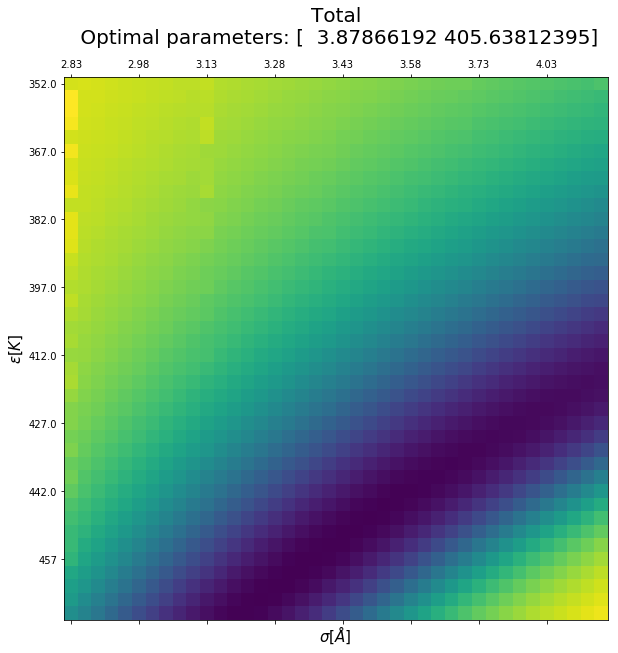

In [430]:
import matplotlib.ticker as ticker

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10,10))
im = axes.matshow(s2_profiles)
indices = np.unravel_index(np.argmin(s2_profiles, axis=None), s2_profiles.shape)
axes.xaxis.set_major_locator(ticker.MultipleLocator(5))
axes.yaxis.set_major_locator(ticker.MultipleLocator(5))
axes.set_xticklabels([str(round(v-0.15, 2)) for v in sig_list[::5]]+[3.88+0.15])
axes.set_yticklabels([str(round(v-15, 2)) for v in eps_list[::5]]+[442+15])

#axes.set_yticklabels(ticklabels)
axes.set_xlabel('$\sigma [\AA]$ ', fontsize=15)
axes.set_ylabel('$\epsilon [K]$', fontsize=15)
pars_optimal = pars_profiles[indices]
print(pars_optimal)
axes.set_title('Total\n Optimal parameters: ' + str(params_dens), fontsize=20)

In [417]:
np.min(s2_profiles)

0.02936732219798665

In [366]:
result = minimize(loss_rho, pars_in, method='Nelder-Mead', args=(target_eos,), tol=1e-16)#, options={'maxiter':1e5})
result

rho 0.01850344615965223 0.01850347014303847
fac -38.85762440489208 0.9999999999990551
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -151.2493465554125 2.3983386242265592e-08 1.3315213703921865e-17 4.0 550.0
rho 0.01781812975658029 0.017818151437968575
fac -32.977683603562745 0.9999999999991672
dat 100.0 675.0 0.01781812975658029 -73.04 -141.33033960597513 2.1681388285427206e-08 4.764024486327638e-15 4.0 550.0
rho 0.0171817647899747 0.017181784665231407
fac -28.738626901163638 0.9999999999992472
dat 100.0 700.0 0.0171817647899747 -64.94 -132.2655887895285 1.987525670779644e-08 3.3034894131927297e-13 4.0 550.0
rho 0.01658928806727122 0.01658930574386962
fac -23.543883498862193 0.9999999999993613
dat 100.0 725.0 0.01658928806727122 -59.72 -123.95154069026832 1.7676598400295784e-08 5.956913775581472e-11 4.0 550.0
rho 0.016036309856603446 0.01603632581898483
fac -19.860927955051547 0.9999999999994426
dat 100.0 750.0 0.016036309856603446 -54.23 -116.30045811628378 1.5962381381962043

fac -0.0045109236358398174 0.9999999999999997
dat 100.0 1800.0 0.006681789766372782 4.49 7.813372225587104 -1.5528307199114133e-10 0.9954992352990504 4.049999999999999 467.5
rho 0.006013610712397289 0.006013610475873328
fac -0.011628536244630306 0.999999999999999
dat 100.0 2000.0 0.006013610712397289 6.85 13.581002417292021 -2.3652396100720674e-10 0.9884388138691019 4.049999999999999 467.5
rho 0.004810888531865921 0.0048108882330026295
fac -0.02320758523754439 0.9999999999999978
dat 100.0 2500.0 0.004810888531865921 10.57 23.41910981628418 -2.9886329175332627e-10 0.9770596395628978 4.049999999999999 467.5
rho 0.004009073769164794 0.004009073503871787
fac -0.021944094030547652 0.9999999999999974
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.483441133333166 -2.6529300631294994e-10 0.9782949260486677 4.049999999999999 467.5
s2: 0.7528427285917481
rho 0.01850344615965223 0.018503456856555217
fac -7.729863500318329 0.999999999999812
dat 100.0 650.0 0.01850344615965223 -81.1999

dat 100.0 750.0 0.016036309856603446 -54.23 -33.14872327086568 -5.420234049785533e-09 0.10126345213197337 4.6249999999999964 288.75
rho 0.015519007928333299 0.015519002904851979
fac -2.032615284480737 0.999999999999941
dat 100.0 775.0 0.015519007928333299 -49.35 -28.49483507541813 -5.023481320157175e-09 0.1309924901555917 4.6249999999999964 288.75
rho 0.01503403758768624 0.015034032878636217
fac -1.843743938044664 0.9999999999999447
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -24.17129763903189 -4.709050023185557e-09 0.15822393519301073 4.6249999999999964 288.75
rho 0.01414968038663429 0.014149676143251523
fac -1.590697259795219 0.9999999999999494
dat 100.0 850.0 0.01414968038663429 -37.58 -16.388417844681083 -4.243382766694337e-09 0.20378347216378798 4.6249999999999964 288.75
rho 0.013363585552865114 0.01336358163787543
fac -1.4336663227810944 0.9999999999999517
dat 100.0 900.0 0.013363585552865114 -31.51 -9.584317354072304 -3.914989683134751e-09 0.23843314491260245 4.62499

dat 100.0 700.0 0.0171817647899747 -64.94 -65.04397059482068 3.075114121675604e-11 0.9999312062775698 4.237499999999999 360.9375
rho 0.01658928806727122 0.016589287995864094
fac -0.000384206336787217 1.0
dat 100.0 725.0 0.01658928806727122 -59.72 -59.463683707801394 -7.140712673936456e-11 0.9996158674610159 4.237499999999999 360.9375
rho 0.016036309856603446 0.01603630987792234
fac -3.542698399792292e-05 1.0
dat 100.0 750.0 0.016036309856603446 -54.23 -54.31041429374631 2.1318894566357827e-11 0.9999645736435303 4.237499999999999 360.9375
rho 0.015519007928333299 0.015519007972680642
fac -0.00015840927655682858 1.0
dat 100.0 775.0 0.015519007928333299 -49.35 -49.53801566675441 4.434734350577951e-11 0.9998416032695301 4.237499999999999 360.9375
rho 0.01503403758768624 0.015034037611670202
fac -4.7827277656786826e-05 1.0
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -45.106734545075874 2.3983962385565327e-11 0.9999521738660492 4.237499999999999 360.9375
rho 0.01414968038663429 0.

dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -79.48569232397612 -5.870046428102516e-10 0.9769911820776845 4.19375 369.53125
rho 0.01781812975658029 0.017818129705753496
fac -0.0001812308816220109 1.0
dat 100.0 675.0 0.01781812975658029 -73.04 -72.87988824996393 -5.082679416235081e-11 0.9998187855397022 4.19375 369.53125
rho 0.0171817647899747 0.01718176534489312
fac -0.022402657322751863 0.9999999999999993
dat 100.0 700.0 0.0171817647899747 -64.94 -66.81932327276608 5.549184202424673e-10 0.9778464187489854 4.19375 369.53125
rho 0.01658928806727122 0.016589288485572565
fac -0.013184385999346302 0.9999999999999997
dat 100.0 725.0 0.01658928806727122 -59.72 -61.24044341644895 4.18301344951022e-10 0.9869021473041217 4.19375 369.53125
rho 0.016036309856603446 0.016036310334605033
fac -0.017809981758512394 0.9999999999999994
dat 100.0 750.0 0.016036309856603446 -54.23 -56.08915916547122 4.780015862293485e-10 0.9823476786030605 4.19375 369.53125
rho 0.015519007928333299 0.0155190084

rho 0.004009073769164794 0.004009073469067958
fac -0.02807946896199532 0.9999999999999968
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 31.63334624638485 -3.000968354024969e-10 0.9723110951774663 3.964843750000001 396.81640625
s2: 0.032414411229760125
rho 0.01850344615965223 0.018503444370972566
fac -0.2161331028589608 0.9999999999999947
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -75.97712927407864 -1.7886796627175627e-09 0.8056280633382664 3.806250000000002 414.21875
rho 0.01781812975658029 0.017818128861910136
fac -0.05615296555684796 0.9999999999999986
dat 100.0 675.0 0.01781812975658029 -73.04 -70.22128054462735 -8.946701539336299e-10 0.9453945120314685 3.806250000000002 414.21875
rho 0.0171817647899747 0.01718176479128428
fac -1.2476878604760565e-07 1.0
dat 100.0 700.0 0.0171817647899747 -64.94 -64.94551309159262 1.3095809159313632e-12 0.9999998752312217 3.806250000000002 414.21875
rho 0.01658928806727122 0.01658928816971567
fac -0.0007907847029425803 1.0
da

fac -0.022992321611219668 0.9999999999999982
dat 100.0 2000.0 0.006013610712397289 6.85 16.23378028486202 -3.325860472441766e-10 0.9772699876033748 3.8217773437500018 413.86962890625
rho 0.004810888531865921 0.004810888237865345
fac -0.02245852172078556 0.9999999999999979
dat 100.0 2500.0 0.004810888531865921 10.57 23.229077703644432 -2.940005764881515e-10 0.9777917934732494 3.8217773437500018 413.86962890625
rho 0.004009073769164794 0.004009073538254997
fac -0.016624583164969887 0.999999999999998
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 27.500609680592007 -2.3090979649198484e-10 0.9835128426150977 3.8217773437500018 413.86962890625
s2: 0.029592134392372765
rho 0.01850344615965223 0.018503445139194972
fac -0.07034702894774453 0.9999999999999983
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -78.22040291075155 -1.0204572568894843e-09 0.9320703083969172 3.9362304687500007 400.22705078125
rho 0.01781812975658029 0.01781812947198629
fac -0.0056819611343739 0.9999999

dat 100.0 775.0 0.015519007928333299 -49.35 -51.73357345117775 5.74027540778399e-10 0.9738085009863534 3.8387451171875018 410.7208251953125
rho 0.01503403758768624 0.015034038227475144
fac -0.03403354384031645 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.8341088867838 6.39788904147065e-10 0.9665390826610814 3.8387451171875018 410.7208251953125
rho 0.01414968038663429 0.014149681036038508
fac -0.037255732034724716 0.9999999999999988
dat 100.0 850.0 0.01414968038663429 -37.58 -40.82420761319345 6.494042179006065e-10 0.9634297239991246 3.8387451171875018 410.7208251953125
rho 0.013363585552865114 0.013363586123093288
fac -0.030414729840634196 0.9999999999999989
dat 100.0 900.0 0.013363585552865114 -31.51 -34.70359352364637 5.702281737074433e-10 0.9700431442742218 3.8387451171875018 410.7208251953125
rho 0.012660237856176829 0.012660238312636837
fac -0.020571847758604114 0.9999999999999993
dat 100.0 950.0 0.012660237856176829 -26.47 -29.316659898599863 4.56

dat 100.0 725.0 0.01658928806727122 -59.72 -60.74999045294823 2.8279101282890906e-10 0.9939923478709523 3.8827255249023453 405.4080581665039
rho 0.016036309856603446 0.016036310345656717
fac -0.01864305724040298 0.9999999999999994
dat 100.0 750.0 0.016036309856603446 -54.23 -56.13143757936831 4.890532701029571e-10 0.9815296496245772 3.8827255249023453 405.4080581665039
rho 0.015519007928333299 0.01551900853158392
fac -0.02931169434064477 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.85704253411192 6.032506213310418e-10 0.9711137266355059 3.8827255249023453 405.4080581665039
rho 0.01503403758768624 0.015034038240350258
fac -0.035417108860358745 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.890467452925854 6.526640183163179e-10 0.9652027376690757 3.8827255249023453 405.4080581665039
rho 0.01414968038663429 0.014149681023279683
fac -0.0358061884182481 0.9999999999999988
dat 100.0 850.0 0.01414968038663429 -37.58 -40.75922089658932 6.366

rho 0.004810888531865921 0.004810888201234798
fac -0.028403527033342837 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.811323873479896 -3.3063112317432974e-10 0.9719960609666601 3.8782884597778335 405.8753538131714
rho 0.004009073769164794 0.004009073511262304
fac -0.02073848945444599 0.9999999999999974
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.147956968610863 -2.579024892951365e-10 0.9794750741413157 3.8782884597778335 405.8753538131714
s2: 0.02898193034864942
rho 0.01850344615965223 0.018503444714653414
fac -0.14105585573182533 0.9999999999999966
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -76.98029862489591 -1.4449988150477822e-09 0.8684408029463361 3.870980072021486 406.79636001586914
rho 0.01781812975658029 0.017818129132076612
fac -0.02736004384737168 0.9999999999999993
dat 100.0 675.0 0.01781812975658029 -73.04 -71.07205379208222 -6.245036779373159e-10 0.9730108518796582 3.870980072021486 406.79636001586914
rho 0.0171817647899747 0

fac -0.008700825327814335 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.217118067560108 2.893397240549822e-10 0.9913369173095233 3.8773586511611953 405.96382081508636
rho 0.010933839971426681 0.01093384003432474
fac -0.00045228441845538884 0.9999999999999999
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -16.016404395047818 6.289805828951778e-11 0.9995478178467239 3.8773586511611953 405.96382081508636
rho 0.010022685988919037 0.010022685881191047
fac -0.0014473811640368164 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.35609025346244 -1.077279897232497e-10 0.9985536657869069 3.8773586511611953 405.96382081508636
rho 0.009251709740190414 0.009251709504877461
fac -0.0074813443780291766 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.8518988723555525 -2.3531295315071254e-10 0.9925465712200411 3.8773586511611953 405.96382081508636
rho 0.008590873067328336 0.008590872716217312
fac -0.01793748870477071 0.9999999999999992
d

dat 100.0 2000.0 0.006013610712397289 6.85 17.69378143339582 -3.8360517887192636e-10 0.9698755832860322 3.878096807003023 405.8837166428566
rho 0.004810888531865921 0.004810888199653972
fac -0.02867578433535058 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.80708702811371 -3.322119489224118e-10 0.9717314639624068 3.878096807003023 405.8837166428566
rho 0.004009073769164794 0.0040090735117789215
fac -0.02065548809647601 0.9999999999999976
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.143210121517683 -2.5738587216411757e-10 0.979556375276573 3.878096807003023 405.8837166428566
s2: 0.029105037294057105
rho 0.01850344615965223 0.018503444735467077
fac -0.13702160317515727 0.9999999999999967
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.04122518103556 -1.4241851517549087e-09 0.8719513890100511 3.8779132843017594 405.90540885925293
rho 0.01781812975658029 0.017818129146557928
fac -0.02610587771590735 0.9999999999999993
dat 100.0 675.0 0.017818129

dat 100.0 1600.0 0.007517013642936963 1.26 8.061944365236474 -3.917118348434334e-10 0.9748076118502429 3.878459787368776 405.8336675167084
rho 0.006681789766372782 0.0066817893572211585
fac -0.03131740930456054 0.999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 13.506770005127654 -4.09151623172177e-10 0.9691679013401046 3.878459787368776 405.8336675167084
rho 0.006013610712397289 0.006013610322579722
fac -0.03158621547455745 0.9999999999999977
dat 100.0 2000.0 0.006013610712397289 6.85 17.703320886697764 -3.8981756711464755e-10 0.9689074180397886 3.878459787368776 405.8336675167084
rho 0.004810888531865921 0.004810888199156755
fac -0.028761685992781585 0.9999999999999972
dat 100.0 2500.0 0.004810888531865921 10.57 24.817398059904615 -3.3270916664079886e-10 0.9716479942042211 3.878459787368776 405.8336675167084
rho 0.004009073769164794 0.004009073508964596
fac -0.02110966277000419 0.9999999999999976
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.15394338419735 -2.

dat 100.0 725.0 0.01658928806727122 -59.72 -60.69673644943492 2.6876824377186637e-10 0.9945717991738913 3.878903948143126 405.7755859475583
rho 0.016036309856603446 0.016036310334050664
fac -0.017768694962219545 0.9999999999999994
dat 100.0 750.0 0.016036309856603446 -54.23 -56.086272844179454 4.774472171786837e-10 0.982388237428822 3.878903948143126 405.7755859475583
rho 0.015519007928333299 0.01551900852297987
fac -0.028481522849116384 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.819389486628516 5.946465715667149e-10 0.971920252297376 3.878903948143126 405.7755859475583
rho 0.01503403758768624 0.015034038233155389
fac -0.03464054722504797 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.85980611307095 6.454691486162956e-10 0.9659525681925732 3.878903948143126 405.7755859475583
rho 0.01414968038663429 0.014149681019791848
fac -0.035414937704642456 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.74117755936714 6.33157

rho 0.0171817647899747 0.01718176501230706
fac -0.0035962230901521184 1.0
dat 100.0 700.0 0.0171817647899747 -64.94 -65.69317157870276 2.2233236085522634e-10 0.9964102355755178 3.8789693617261958 405.76690515270457
rho 0.01658928806727122 0.01658928833593097
fac -0.005438593610979045 0.9999999999999999
dat 100.0 725.0 0.01658928806727122 -59.72 -60.69683182669866 2.686597506962318e-10 0.994576168764941 3.8789693617261958 405.76690515270457
rho 0.016036309856603446 0.01603631033381444
fac -0.01775111665063978 0.9999999999999996
dat 100.0 750.0 0.016036309856603446 -54.23 -56.08626572797407 4.77210992944066e-10 0.9824055063071303 3.8789693617261958 405.76690515270457
rho 0.015519007928333299 0.015519008523278938
fac -0.028510178713472858 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.81928691936428 5.949456396286967e-10 0.9718924014815074 3.8789693617261958 405.76690515270457
rho 0.01503403758768624 0.015034038233858996
fac -0.034716109709967226 0.9999999999999989
dat

dat 100.0 1000.0 0.012027225147907982 -22.22 -24.20365152443075 2.86491511070075e-10 0.9915059109233467 3.878907241614071 405.7753152833902
rho 0.010933839971426681 0.010933840032520542
fac -0.000426709480689434 0.9999999999999999
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.997998759927162 6.109386087305158e-11 0.999573381546853 3.878907241614071 405.7753152833902
rho 0.010022685988919037 0.010022685883810042
fac -0.0013778615072249558 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333668631459252 -1.0510899442484067e-10 0.9986230873081128 3.878907241614071 405.7753152833902
rho 0.009251709740190414 0.009251709510144502
fac -0.007150180766391648 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.8261639816265633 -2.3004591287456577e-10 0.9928753209592558 3.878907241614071 405.7753152833902
rho 0.008590873067328336 0.008590872713225554
fac -0.018244475694698666 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7915638750

dat 100.0 2000.0 0.006013610712397289 6.85 17.715228797099027 -3.8562775108580416e-10 0.9695619786316274 3.878924453404035 405.7729773350002
rho 0.004810888531865921 0.004810888199119253
fac -0.028768170096317065 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.830376086544806 -3.327466678929025e-10 0.9716416939584526 3.878924453404035 405.7729773350002
rho 0.004009073769164794 0.004009073508684851
fac -0.021155077776486453 0.9999999999999976
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.16751535769047 -2.6047994230310456e-10 0.9790671212438053 3.878924453404035 405.7729773350002
s2: 0.02911077898824221
rho 0.01850344615965223 0.018503444738109307
fac -0.1365136540575603 0.9999999999999967
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.04895556081075 -1.4215429215702624e-09 0.8723944084548289 3.8789258220247587 405.7727798045016
rho 0.01781812975658029 0.017818129148293955
fac -0.025957502670094862 0.9999999999999993
dat 100.0 675.0 0.01781812

dat 100.0 775.0 0.015519007928333299 -49.35 -51.81936964849346 5.947110703202751e-10 0.9719142469457178 3.8789319487978 405.7719467077777
rho 0.01503403758768624 0.015034038233117922
fac -0.03463652588841079 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.85974716458868 6.454316820586614e-10 0.9659564526208357 3.8789319487978 405.7719467077777
rho 0.01414968038663429 0.01414968101983632
fac -0.035419912983128354 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.741047821065585 6.332020307392439e-10 0.9652000311258965 3.8789319487978 405.7719467077777
rho 0.013363585552865114 0.013363586090588148
fac -0.02704605359399234 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.5248056602367 5.377230345021689e-10 0.9733164157731122 3.8789319487978 405.7719467077777
rho 0.012660237856176829 0.012660238270887655
fac -0.016980817008689024 0.9999999999999994
dat 100.0 950.0 0.012660237856176829 -26.47 -29.0532813464839 4.147108264435095

fac -0.015570792806911286 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920614836411836 -3.2712897148068354e-10 0.9845498052403214 3.878931460576474 405.77201625812506
rho 0.00801814798419221 0.008018147652935388
fac -0.01710667604015359 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.71128017675402 -3.312568223196033e-10 0.983038812353509 3.878931460576474 405.77201625812506
rho 0.007517013642936963 0.0075170132499230045
fac -0.02568506483047781 0.9999999999999984
dat 100.0 1600.0 0.007517013642936963 1.26 8.072470110122199 -3.9301395818314155e-10 0.9746419903197422 3.878931460576474 405.77201625812506
rho 0.006681789766372782 0.0066817893574428475
fac -0.03128348132733922 0.9999999999999979
dat 100.0 1800.0 0.006681789766372782 4.49 13.518189345756868 -4.0892993418556456e-10 0.9692007838043993 3.878931460576474 405.77201625812506
rho 0.006013610712397289 0.006013610328339454
fac -0.03065970973792665 0.9999999999999977
dat 100.0 2000.0

dat 100.0 675.0 0.01781812975658029 -73.04 -71.1244640037583 -6.078220565752801e-10 0.974415092258422 3.878932189906568 405.7719171629652
rho 0.0171817647899747 0.017181765011917895
fac -0.0035836446500995957 0.9999999999999999
dat 100.0 700.0 0.0171817647899747 -64.94 -65.69308312686258 2.2194319646007266e-10 0.9964227689407584 3.878932189906568 405.7719171629652
rho 0.01658928806727122 0.016589288335923966
fac -0.005438310011845538 0.9999999999999998
dat 100.0 725.0 0.01658928806727122 -59.72 -60.6968047525837 2.6865274588283583e-10 0.9945764508259206 3.878932189906568 405.7719171629652
rho 0.016036309856603446 0.01603631033390654
fac -0.01775796911015744 0.9999999999999994
dat 100.0 750.0 0.016036309856603446 -54.23 -56.086295705032015 4.773030928828526e-10 0.9823987744362334 3.878932189906568 405.7719171629652
rho 0.015519007928333299 0.015519008522586308
fac -0.028443834804328424 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.819370039913565 5.942530096475496e-

dat 100.0 950.0 0.012660237856176829 -26.47 -29.05327778140663 4.1485406949981485e-10 0.9831510095334349 3.8789323722390914 405.77189238917526
rho 0.012027225147907982 0.012027225433683732
fac -0.008487798710663425 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.20335037648175 2.8577575028609914e-10 0.9915481209546749 3.8789323722390914 405.77189238917526
rho 0.010933839971426681 0.010933840032882457
fac -0.00043178004379417303 0.9999999999999999
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.997626924690621 6.145577623184462e-11 0.9995683131597939 3.8789323722390914 405.77189238917526
rho 0.010022685988919037 0.010022685880302903
fac -0.0014713448801817494 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333239302911304 -1.0861613344848031e-10 0.9985297370170166 3.8789323722390914 405.77189238917526
rho 0.009251709740190414 0.009251709514797889
fac -0.006863837589161044 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -

rho 0.006013610712397289 0.00601361032534527
fac -0.031139630468492177 0.9999999999999976
dat 100.0 2000.0 0.006013610712397289 6.85 17.71543719852739 -3.8705201890754104e-10 0.969340214197895 3.8789324026278456 405.77188826021035
rho 0.004810888531865921 0.004810888195801856
fac -0.029344651857917264 0.9999999999999972
dat 100.0 2500.0 0.004810888531865921 10.57 24.83060154579491 -3.3606406546482503e-10 0.97108172166549 3.8789324026278456 405.77188826021035
rho 0.004009073769164794 0.004009073508328702
fac -0.021212967175306952 0.9999999999999974
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.16775016717665 -2.6083609144106346e-10 0.9790104452772361 3.8789324026278456 405.77188826021035
s2: 0.02929444371079103
rho 0.01850344615965223 0.018503444737987457
fac -0.13653705815265166 0.9999999999999967
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.04899395288318 -1.421664772016662e-09 0.872373991092062 3.8789324094746958 405.7718873148483
rho 0.01781812975658029 0

fac -0.02850791748139822 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.8193694367473 5.949220456547e-10 0.9718945991582634 3.8789324254194106 405.7718851634866
rho 0.01503403758768624 0.01503403823316441
fac -0.03464151544916028 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.85974628196554 6.454781691783706e-10 0.9659516329344581 3.8789324254194106 405.7718851634866
rho 0.01414968038663429 0.014149681019113196
fac -0.03533905920596842 0.9999999999999988
dat 100.0 850.0 0.01414968038663429 -37.58 -40.741045724268844 6.324789060541125e-10 0.9652780743491299 3.8789324254194106 405.7718851634866
rho 0.013363585552865114 0.013363586092010193
fac -0.027189292965395916 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.524802495436354 5.391450792757713e-10 0.9731770085260817 3.8789324254194106 405.7718851634866
rho 0.012660237856176829 0.012660238269672908
fac -0.01688148424163987 0.9999999999999993
dat 100.0 950.0 0.01266023

dat 100.0 1300.0 0.009251709740190414 -6.5 -3.8256859705507336 -2.267181251763839e-10 0.9930792479958886 3.8789324394726457 405.77188325656437
rho 0.008590873067328336 0.008590872812608931
fac -0.00944053858786791 0.9999999999999993
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920815468276206 -2.547194052904267e-10 0.9906038833974858 3.8789324394726457 405.77188325656437
rho 0.00801814798419221 0.00801814765193597
fac -0.0172100550638797 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.7113015423023565 -3.3225623988220043e-10 0.9829371920135993 3.8789324394726457 405.77188325656437
rho 0.007517013642936963 0.0075170132561488915
fac -0.024877736270197126 0.9999999999999984
dat 100.0 1600.0 0.007517013642936963 1.26 8.072492582569739 -3.8678807118969205e-10 0.9754291643458575 3.8789324394726457 405.77188325656437
rho 0.006681789766372782 0.006681789359979408
fac -0.03089658702042914 0.9999999999999979
dat 100.0 1800.0 0.006681789766372782 4.49 13.5182135828

dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.0489941016731 -1.4213736368451357e-09 0.8724227718336706 3.87893243459495 405.7718839174988
rho 0.01781812975658029 0.01781812914864551
fac -0.025927507361245748 0.9999999999999993
dat 100.0 675.0 0.01781812975658029 -73.04 -71.12446492637582 -6.079347789067491e-10 0.9744057242906415 3.87893243459495 405.7718839174988
rho 0.0171817647899747 0.017181765011813607
fac -0.003580277629060462 0.9999999999999998
dat 100.0 700.0 0.0171817647899747 -64.94 -65.69308361834561 2.2183890835414388e-10 0.9964261239228334 3.87893243459495 405.7718839174988
rho 0.01658928806727122 0.016589288335579516
fac -0.005424373613117322 0.9999999999999998
dat 100.0 725.0 0.01658928806727122 -59.72 -60.69680484419149 2.683082957199989e-10 0.9945903117364904 3.87893243459495 405.7718839174988
rho 0.016036309856603446 0.01603631033383215
fac -0.01775243432861047 0.9999999999999994
dat 100.0 750.0 0.016036309856603446 -54.23 -56.08629542490329 4.772287044707

dat 100.0 1000.0 0.012027225147907982 -22.22 -24.20334963372788 2.879028959679175e-10 0.9914223742835108 3.878932434621696 405.771883913806
rho 0.010933839971426681 0.01093384003277261
fac -0.00043023787013389813 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.99762600591359 6.134592833717534e-11 0.9995698546689068 3.878932434621696 405.771883913806
rho 0.010022685988919037 0.010022685884684947
fac -0.0013550189362037356 1.0
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333238240967562 -1.0423409010917872e-10 0.9986458986874424 3.878932434621696 405.771883913806
rho 0.009251709740190414 0.00925170950992881
fac -0.007163595133358521 0.9999999999999997
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.8256860620174513 -2.3026160492212178e-10 0.9928620022546794 3.878932434621696 405.771883913806
rho 0.008590873067328336 0.008590872766693246
fac -0.013150796207512305 0.9999999999999992
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920814476747782 -3.0063508973943165e-10 0.

dat 100.0 850.0 0.01414968038663429 -37.58 -40.741045670370724 6.334851671008224e-10 0.9651694510638303 3.8789324340259137 405.7718839944995
rho 0.013363585552865114 0.013363586090952183
fac -0.027082686013644195 0.999999999999999
dat 100.0 900.0 0.013363585552865114 -31.51 -34.524802423399315 5.380870696930495e-10 0.9732807614907708 3.8789324340259137 405.7718839944995
rho 0.012660237856176829 0.012660238269850669
fac -0.01689600194883739 0.9999999999999993
dat 100.0 950.0 0.012660237856176829 -26.47 -29.053277148335816 4.1367383997459317e-10 0.98324593497895 3.8789324340259137 405.7718839944995
rho 0.012027225147907982 0.012027225434607436
fac -0.008542757067949939 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.20334964076512 2.866994541078638e-10 0.9914936285961957 3.8789324340259137 405.7718839944995
rho 0.010933839971426681 0.0109338400337494
fac -0.0004440480038972102 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.99762601463843 6.232271816

dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.711301397344759 -3.212044311085016e-10 0.9840444761026551 3.8789324328154047 405.7718841585022
rho 0.007517013642936963 0.007517013246882686
fac -0.02608399641053067 0.9999999999999984
dat 100.0 1600.0 0.007517013642936963 1.26 8.072492430056512 -3.9605427704786367e-10 0.9742532523956308 3.8789324328154047 405.7718841585022
rho 0.006681789766372782 0.006681789359190209
fac -0.031016703243103672 0.9999999999999979
dat 100.0 1800.0 0.006681789766372782 4.49 13.518213418304873 -4.071825723817035e-10 0.9694593798250841 3.8789324328154047 405.7718841585022
rho 0.006013610712397289 0.0060136103272316966
fac -0.030836831464815813 0.9999999999999976
dat 100.0 2000.0 0.006013610712397289 6.85 17.715437986829237 -3.851655921288666e-10 0.9696337738915259 3.8789324328154047 405.7718841585022
rho 0.004810888531865921 0.004810888195791169
fac -0.029346518194679906 0.9999999999999972
dat 100.0 2500.0 0.004810888531865921 10.57 24.830602399710

dat 100.0 700.0 0.0171817647899747 -64.94 -65.69308361487916 2.2190053960979839e-10 0.9964241414146328 3.878932432995965 405.7718841340412
rho 0.01658928806727122 0.01658928833580961
fac -0.005433681185803419 0.9999999999999998
dat 100.0 725.0 0.01658928806727122 -59.72 -60.69680484334963 2.685383894418525e-10 0.994581054557952 3.878932432995965 405.7718841340412
rho 0.016036309856603446 0.016036310334364975
fac -0.017792097490174814 0.9999999999999994
dat 100.0 750.0 0.016036309856603446 -54.23 -56.08629542650136 4.777615282558489e-10 0.9823652473296469 3.878932432995965 405.7718841340412
rho 0.015519007928333299 0.015519008522639814
fac -0.028448957130752985 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.81936941734074 5.943065154584426e-10 0.9719519040939629 3.878932432995965 405.7718841340412
rho 0.01503403758768624 0.015034038233125805
fac -0.03463737191744414 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.85974625254952 6.4543956

fac -0.00043781060598545383 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.997626030512137 6.188345669233541e-11 0.999562285219093 3.878932432942597 405.7718841412716
rho 0.010022685988919037 0.01002268588385471
fac -0.0013766906767585458 1.0
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333238269433442 -1.0506432703005775e-10 0.9986242565271324 3.878932432942597 405.7718841412716
rho 0.009251709740190414 0.009251709505927267
fac -0.007414739960361169 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.825686093672618 -2.342631470753087e-10 0.9926126814080164 3.878932432942597 405.7718841412716
rho 0.008590873067328336 0.00859087271838758
fac -0.017716425671637153 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920814133587203 -3.489407564977176e-10 0.9824395875070729 3.878932432942597 405.7718841412716
rho 0.00801814798419221 0.008018147658274744
fac -0.016559653288594527 0.999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399

dat 100.0 2500.0 0.004810888531865921 10.57 24.83060240502475 -3.326332664171927e-10 0.9716607434601625 3.878932433003465 405.77188413302474
rho 0.004009073769164794 0.004009073507045294
fac -0.021422231745309307 0.9999999999999974
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.16775106268226 -2.62119499716551e-10 0.9788055945121286 3.878932433003465 405.77188413302474
s2: 0.029262614753448483
rho 0.01850344615965223 0.01850344473835936
fac -0.13646563199911316 0.9999999999999966
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.04899409233664 -1.4212928681200943e-09 0.8724363036360389 3.878932432999298 405.7718841335894
rho 0.01781812975658029 0.017818129148658768
fac -0.025926376611938733 0.9999999999999993
dat 100.0 675.0 0.01781812975658029 -73.04 -71.12446492009204 -6.079215221499457e-10 0.974406826099862 3.878932432999298 405.7718841335894
rho 0.0171817647899747 0.017181765011873386
fac -0.003582207432246166 1.0
dat 100.0 700.0 0.0171817647899747 -64.94 -65.

dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.85974625251977 6.454489095975013e-10 0.9659546665436771 3.8789324330038344 405.7718841329747
rho 0.01414968038663429 0.014149681019292745
fac -0.03535912626655685 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.74104567667421 6.326584551380465e-10 0.9652587042498785 3.8789324330038344 405.7718841329747
rho 0.013363585552865114 0.013363586090891522
fac -0.027076579994550848 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.52480243186386 5.380264081478181e-10 0.9732867043798274 3.8789324330038344 405.7718841329747
rho 0.012660237856176829 0.012660238271060161
fac -0.01699494687298983 0.9999999999999993
dat 100.0 950.0 0.012660237856176829 -26.47 -29.05327715871427 4.148833325501311e-10 0.9831486525973685 3.8789324330038344 405.7718841329747
rho 0.012027225147907982 0.012027225435483993
fac -0.008595074328828526 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.20334965284753 2

fac -0.016800624466453917 0.999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.711301401502355 -3.2828022938913293e-10 0.9833397189731612 3.878932433006353 405.77188413263355
rho 0.007517013642936963 0.00751701325656252
fac -0.024824556581466407 0.9999999999999986
dat 100.0 1600.0 0.007517013642936963 1.26 8.072492434430846 -3.863744428567184e-10 0.9754810387445163 3.878932433006353 405.77188413263355
rho 0.006681789766372782 0.006681789365070052
fac -0.030127389284774313 0.999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 13.518213423024765 -4.0130272976196535e-10 0.9703219170599503 3.878932433006353 405.77188413263355
rho 0.006013610712397289 0.006013610325541422
fac -0.031108076275996252 0.9999999999999976
dat 100.0 2000.0 0.006013610712397289 6.85 17.715437991808603 -3.8685586678521844e-10 0.969370801428183 3.878932433006353 405.77188413263355
rho 0.004810888531865921 0.004810888199216843
fac -0.028751298048431455 0.9999999999999972
dat 100.0 2500.0

dat 100.0 700.0 0.0171817647899747 -64.94 -65.69308361490145 2.2189470746947215e-10 0.9964243290419887 3.878932433006407 405.7718841326263
rho 0.01658928806727122 0.01658928833580818
fac -0.0054336233397041115 0.9999999999999998
dat 100.0 725.0 0.01658928806727122 -59.72 -60.69680484335486 2.685369600297083e-10 0.9945811120905882 3.878932433006407 405.7718841326263
rho 0.016036309856603446 0.016036310334368042
fac -0.017792325923718613 0.9999999999999994
dat 100.0 750.0 0.016036309856603446 -54.23 -56.08629542649063 4.777645952469545e-10 0.9823650229244978 3.878932433006407 405.7718841326263
rho 0.015519007928333299 0.015519008522647468
fac -0.028449689878356773 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.81936941731519 5.943141690584186e-10 0.9719511918987951 3.878932433006407 405.7718841326263
rho 0.01503403758768624 0.015034038233138198
fac -0.034638702050882327 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.859746252510064 6.454

dat 100.0 1000.0 0.012027225147907982 -22.22 -24.203349652814282 2.875925313866601e-10 0.9914407786596093 3.8789324330066517 405.7718841325932
rho 0.010933839971426681 0.010933840033951647
fac -0.0004469347045325748 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.997626029573528 6.252496610736902e-11 0.9995531651559049 3.8789324330066517 405.7718841325932
rho 0.010022685988919037 0.010022685885021027
fac -0.001346295096060913 1.0
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333238268347355 -1.038980099871134e-10 0.9986546107526231 3.8789324330066517 405.7718841325932
rho 0.009251709740190414 0.00925170950884801
fac -0.00723100182969202 0.9999999999999997
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.825686092464858 -2.313424053018709e-10 0.9927950789627566 3.8789324330066517 405.7718841325932
rho 0.008590873067328336 0.008590872704187708
fac -0.019187676710827446 0.9999999999999992
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920814146679533 -3.631406286785932e-1

rho 0.004810888531865921 0.004810888199215187
fac -0.028751584273985543 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.83060240511491 -3.3265073421523406e-10 0.9716578095686034 3.878932433006656 405.77188413259273
rho 0.004009073769164794 0.004009073507032376
fac -0.0214243432329147 0.9999999999999976
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.167751062776244 -2.621324173349149e-10 0.9788035277784297 3.878932433006656 405.77188413259273
s2: 0.029268616867440287
rho 0.01850344615965223 0.01850344473834903
fac -0.1364676160656916 0.9999999999999967
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.04899409237967 -1.4213032001331172e-09 0.8724345726660443 3.878932433006684 405.7718841325888
rho 0.01781812975658029 0.01781812914865151
fac -0.02592699569486976 0.9999999999999993
dat 100.0 675.0 0.01781812975658029 -73.04 -71.12446492012101 -6.079287802329691e-10 0.9744062228614148 3.878932433006684 405.7718841325888
rho 0.0171817647899747 0.01718

fac -0.034638731841397305 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.85974625250918 6.454522350624048e-10 0.9659543217686645 3.8789324330066535 405.771884132593
rho 0.01414968038663429 0.014149681019298747
fac -0.03535979718636475 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.74104567665693 6.326644572812734e-10 0.9652580566389113 3.8789324330066535 405.771884132593
rho 0.013363585552865114 0.013363586090900534
fac -0.027077487062145137 0.999999999999999
dat 100.0 900.0 0.013363585552865114 -31.51 -34.52480243184058 5.380354200362758e-10 0.9732858215433983 3.8789324330066535 405.771884132593
rho 0.012660237856176829 0.012660238271072601
fac -0.016995966028142726 0.9999999999999994
dat 100.0 950.0 0.012660237856176829 -26.47 -29.053277158685727 4.1489577225217733e-10 0.9831476506168639 3.8789324330066535 405.771884132593
rho 0.012027225147907982 0.01202722543550053
fac -0.008596062880351186 0.9999999999999997
dat 100.0 1000.0 0.0120

dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920814146681318 -2.22977296349125e-10 0.9927918461917341 3.8789324330066606 405.77188413259205
rho 0.00801814798419221 0.008018147655900637
fac -0.016801785540167133 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.7113014015090195 -3.2829157274594234e-10 0.983338577243925 3.8789324330066606 405.77188413259205
rho 0.007517013642936963 0.00751701325655599
fac -0.024825395629162982 0.9999999999999984
dat 100.0 1600.0 0.007517013642936963 1.26 8.072492434437857 -3.86380972355882e-10 0.9754802202697409 3.8789324330066606 405.77188413259205
rho 0.006681789766372782 0.006681789365066303
fac -0.030127952152618244 0.9999999999999979
dat 100.0 1800.0 0.006681789766372782 4.49 13.51821342303235 -4.0130647849939693e-10 0.9703213708970986 3.8789324330066606 405.77188413259205
rho 0.006013610712397289 0.006013610325538701
fac -0.03110851386890593 0.9999999999999977
dat 100.0 2000.0 0.006013610712397289 6.85 17.7154379918166

dat 100.0 675.0 0.01781812975658029 -73.04 -71.12446492012103 -6.079287837024161e-10 0.9744062225730583 3.878932433006659 405.7718841325924
rho 0.0171817647899747 0.01718176501186924
fac -0.0035820735724707295 0.9999999999999999
dat 100.0 700.0 0.0171817647899747 -64.94 -65.6930836149021 2.2189454093601846e-10 0.9964243343995094 3.878932433006659 405.7718841325924
rho 0.01658928806727122 0.016589288335808115
fac -0.005433620672051619 0.9999999999999998
dat 100.0 725.0 0.01658928806727122 -59.72 -60.6968048433551 2.685368941102162e-10 0.994581114743785 3.878932433006659 405.7718841325924
rho 0.016036309856603446 0.01603631033436809
fac -0.017792329541456216 0.9999999999999996
dat 100.0 750.0 0.016036309856603446 -54.23 -56.08629542649046 4.777646438192118e-10 0.982365019370559 3.878932433006659 405.7718841325924
rho 0.015519007928333299 0.015519008522647622
fac -0.0284497046596272 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.81936941731467 5.94314323448808e-10 0.97

fac -0.008596063502556137 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.203349652814225 2.875925591422357e-10 0.9914407770145978 3.878932433006659 405.7718841325924
rho 0.010933839971426681 0.010933840033951665
fac -0.0004469349525321433 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.9976260295735 6.252498345460378e-11 0.9995531649080162 3.878932433006659 405.7718841325924
rho 0.010022685988919037 0.010022685885021133
fac -0.0013462923537107935 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333238268347255 -1.0389790416898137e-10 0.9986546134912836 3.878932433006659 405.7718841325924
rho 0.009251709740190414 0.009251709508848236
fac -0.007230987623602034 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.825686092464764 -2.3134217805309554e-10 0.9927950930664928 3.878932433006659 405.7718841325924
rho 0.008590873067328336 0.008590872844351364
fac -0.007234237017743385 0.9999999999999994
dat 100.0 1400.0 0.008590

dat 100.0 2000.0 0.006013610712397289 6.85 17.715437991816554 -3.8685856601494706e-10 0.9693703806190336 3.878932433006659 405.7718841325924
rho 0.004810888531865921 0.00481088819921517
fac -0.0287515872726893 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.830602405114995 -3.326507515624688e-10 0.9716578066548894 3.878932433006659 405.7718841325924
rho 0.004009073769164794 0.004009073507032363
fac -0.021424345359624918 0.9999999999999974
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.167751062776333 -2.6213243034534095e-10 0.9788035256967982 3.878932433006659 405.7718841325924
s2: 0.028591557984311226
rho 0.01850344615965223 0.018503444738349036
fac -0.13646761473320415 0.9999999999999966
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.04899409237963 -1.4213031931942233e-09 0.8724345738285523 3.878932433006659 405.7718841325924
rho 0.01781812975658029 0.017818129148651506
fac -0.025926995990800276 0.9999999999999993
dat 100.0 675.0 0.017818129

dat 100.0 950.0 0.012660237856176829 -26.47 -29.053277158685695 4.1489578439524166e-10 0.9831476496387623 3.878932433006659 405.7718841325924
rho 0.012027225147907982 0.012027225435500541
fac -0.008596063502556137 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.203349652814225 2.875925591422357e-10 0.9914407770145978 3.878932433006659 405.7718841325924
rho 0.010933839971426681 0.010933840033951665
fac -0.0004469349525321433 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.9976260295735 6.252498345460378e-11 0.9995531649080162 3.878932433006659 405.7718841325924
rho 0.010022685988919037 0.010022685885021133
fac -0.0013462923537107935 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333238268347255 -1.0389790416898137e-10 0.9986546134912836 3.878932433006659 405.7718841325924
rho 0.009251709740190414 0.009251709508848236
fac -0.007230987623602034 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.825686092464764 -2.3134

rho 0.008590873067328336 0.008590872844351364
fac -0.007234237017743385 0.9999999999999994
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920814146681018 -2.22976971955835e-10 0.992791867089175 3.878932433006659 405.7718841325924
rho 0.00801814798419221 0.008018147655900745
fac -0.016801774531174606 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.711301401508957 -3.2829146519308683e-10 0.9833385880694921 3.878932433006659 405.7718841325924
rho 0.007517013642936963 0.007517013256556036
fac -0.02482538972189664 0.9999999999999986
dat 100.0 1600.0 0.007517013642936963 1.26 8.072492434437807 -3.8638092638570987e-10 0.9754802260321626 3.878932433006659 405.7718841325924
rho 0.006681789766372782 0.00668178936506633
fac -0.030127948115370652 0.9999999999999979
dat 100.0 1800.0 0.006681789766372782 4.49 13.518213423032295 -4.0130645161118306e-10 0.9703213748145262 3.878932433006659 405.7718841325924
rho 0.006013610712397289 0.006013610325538723
fac -0.031108510381

dat 100.0 675.0 0.01781812975658029 -73.04 -71.12446492012103 -6.079287837024161e-10 0.9744062225730583 3.878932433006659 405.7718841325924
rho 0.0171817647899747 0.01718176501186924
fac -0.0035820735724707295 0.9999999999999999
dat 100.0 700.0 0.0171817647899747 -64.94 -65.6930836149021 2.2189454093601846e-10 0.9964243343995094 3.878932433006659 405.7718841325924
rho 0.01658928806727122 0.016589288335808115
fac -0.005433620672051619 0.9999999999999998
dat 100.0 725.0 0.01658928806727122 -59.72 -60.6968048433551 2.685368941102162e-10 0.994581114743785 3.878932433006659 405.7718841325924
rho 0.016036309856603446 0.01603631033436809
fac -0.017792329541456216 0.9999999999999996
dat 100.0 750.0 0.016036309856603446 -54.23 -56.08629542649046 4.777646438192118e-10 0.982365019370559 3.878932433006659 405.7718841325924
rho 0.015519007928333299 0.015519008522647622
fac -0.0284497046596272 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.81936941731467 5.94314323448808e-10 0.97

dat 100.0 950.0 0.012660237856176829 -26.47 -29.053277158685695 4.1489578439524166e-10 0.9831476496387623 3.878932433006659 405.7718841325924
rho 0.012027225147907982 0.012027225435500541
fac -0.008596063502556137 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.203349652814225 2.875925591422357e-10 0.9914407770145978 3.878932433006659 405.7718841325924
rho 0.010933839971426681 0.010933840033951665
fac -0.0004469349525321433 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.9976260295735 6.252498345460378e-11 0.9995531649080162 3.878932433006659 405.7718841325924
rho 0.010022685988919037 0.010022685885021133
fac -0.0013462923537107935 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333238268347255 -1.0389790416898137e-10 0.9986546134912836 3.878932433006659 405.7718841325924
rho 0.009251709740190414 0.009251709508848236
fac -0.007230987623602034 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.825686092464764 -2.3134

rho 0.006013610712397289 0.006013610325538723
fac -0.031108510381541915 0.9999999999999976
dat 100.0 2000.0 0.006013610712397289 6.85 17.715437991816554 -3.8685856601494706e-10 0.9693703806190336 3.878932433006659 405.7718841325924
rho 0.004810888531865921 0.00481088819921517
fac -0.0287515872726893 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.830602405114995 -3.326507515624688e-10 0.9716578066548894 3.878932433006659 405.7718841325924
rho 0.004009073769164794 0.004009073507032363
fac -0.021424345359624918 0.9999999999999974
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.167751062776333 -2.6213243034534095e-10 0.9788035256967982 3.878932433006659 405.7718841325924
s2: 0.028591557984311226
rho 0.01850344615965223 0.018503444738349036
fac -0.13646761473320415 0.9999999999999966
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.04899409237963 -1.4213031931942233e-09 0.8724345738285523 3.878932433006659 405.7718841325924
rho 0.01781812975658029 0.

fac -0.0284497046596272 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.81936941731467 5.94314323448808e-10 0.9719511775321218 3.878932433006659 405.7718841325924
rho 0.01503403758768624 0.015034038233138458
fac -0.034638729979489746 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.85974625250924 6.4545221771517e-10 0.9659543235671821 3.878932433006659 405.7718841325924
rho 0.01414968038663429 0.01414968101929875
fac -0.0353597975741815 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.74104567665692 6.326644607507204e-10 0.9652580562645681 3.878932433006659 405.7718841325924
rho 0.013363585552865114 0.01336358609090054
fac -0.02707748776056685 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.524802431840556 5.380354269751697e-10 0.9732858208636344 3.878932433006659 405.7718841325924
rho 0.012660237856176829 0.012660238271072613
fac -0.016995967023009987 0.9999999999999993
dat 100.0 950.0 0.01266023785617

dat 100.0 700.0 0.0171817647899747 -64.94 -65.6930836149021 2.2189454093601846e-10 0.9964243343995094 3.878932433006659 405.7718841325924
rho 0.01658928806727122 0.016589288335808115
fac -0.005433620672051619 0.9999999999999998
dat 100.0 725.0 0.01658928806727122 -59.72 -60.6968048433551 2.685368941102162e-10 0.994581114743785 3.878932433006659 405.7718841325924
rho 0.016036309856603446 0.01603631033436809
fac -0.017792329541456216 0.9999999999999996
dat 100.0 750.0 0.016036309856603446 -54.23 -56.08629542649046 4.777646438192118e-10 0.982365019370559 3.878932433006659 405.7718841325924
rho 0.015519007928333299 0.015519008522647622
fac -0.0284497046596272 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.81936941731467 5.94314323448808e-10 0.9719511775321218 3.878932433006659 405.7718841325924
rho 0.01503403758768624 0.015034038233138458
fac -0.034638729979489746 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.85974625250924 6.454522177151

dat 100.0 1000.0 0.012027225147907982 -22.22 -24.203349652814225 2.875925591422357e-10 0.9914407770145978 3.878932433006659 405.7718841325924
rho 0.010933839971426681 0.010933840033951665
fac -0.0004469349525321433 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.9976260295735 6.252498345460378e-11 0.9995531649080162 3.878932433006659 405.7718841325924
rho 0.010022685988919037 0.010022685885021133
fac -0.0013462923537107935 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333238268347255 -1.0389790416898137e-10 0.9986546134912836 3.878932433006659 405.7718841325924
rho 0.009251709740190414 0.009251709508848236
fac -0.007230987623602034 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.825686092464764 -2.3134217805309554e-10 0.9927950930664928 3.878932433006659 405.7718841325924
rho 0.008590873067328336 0.008590872844351364
fac -0.007234237017743385 0.9999999999999994
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920814146681018 -2.2297

fac -0.0287515872726893 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.830602405114995 -3.326507515624688e-10 0.9716578066548894 3.878932433006659 405.7718841325924
rho 0.004009073769164794 0.004009073507032363
fac -0.021424345359624918 0.9999999999999974
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.167751062776333 -2.6213243034534095e-10 0.9788035256967982 3.878932433006659 405.7718841325924
s2: 0.028591557984311226
rho 0.01850344615965223 0.018503444738349036
fac -0.13646761473320415 0.9999999999999966
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.04899409237963 -1.4213031931942233e-09 0.8724345738285523 3.878932433006659 405.7718841325924
rho 0.01781812975658029 0.017818129148651506
fac -0.025926995990800276 0.9999999999999993
dat 100.0 675.0 0.01781812975658029 -73.04 -71.12446492012103 -6.079287837024161e-10 0.9744062225730583 3.878932433006659 405.7718841325924
rho 0.0171817647899747 0.01718176501186924
fac -0.0035820735724707295 0.9

dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.85974625250924 6.4545221771517e-10 0.9659543235671821 3.878932433006659 405.7718841325924
rho 0.01414968038663429 0.01414968101929875
fac -0.0353597975741815 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.74104567665692 6.326644607507204e-10 0.9652580562645681 3.878932433006659 405.7718841325924
rho 0.013363585552865114 0.01336358609090054
fac -0.02707748776056685 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.524802431840556 5.380354269751697e-10 0.9732858208636344 3.878932433006659 405.7718841325924
rho 0.012660237856176829 0.012660238271072613
fac -0.016995967023009987 0.9999999999999993
dat 100.0 950.0 0.012660237856176829 -26.47 -29.053277158685695 4.1489578439524166e-10 0.9831476496387623 3.878932433006659 405.7718841325924
rho 0.012027225147907982 0.012027225435500541
fac -0.008596063502556137 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.203349652814225 2.8759

dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920814146681018 -2.22976971955835e-10 0.992791867089175 3.878932433006659 405.7718841325924
rho 0.00801814798419221 0.008018147655900745
fac -0.016801774531174606 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.711301401508957 -3.2829146519308683e-10 0.9833385880694921 3.878932433006659 405.7718841325924
rho 0.007517013642936963 0.007517013256556036
fac -0.02482538972189664 0.9999999999999986
dat 100.0 1600.0 0.007517013642936963 1.26 8.072492434437807 -3.8638092638570987e-10 0.9754802260321626 3.878932433006659 405.7718841325924
rho 0.006681789766372782 0.00668178936506633
fac -0.030127948115370652 0.9999999999999979
dat 100.0 1800.0 0.006681789766372782 4.49 13.518213423032295 -4.0130645161118306e-10 0.9703213748145262 3.878932433006659 405.7718841325924
rho 0.006013610712397289 0.006013610325538723
fac -0.031108510381541915 0.9999999999999976
dat 100.0 2000.0 0.006013610712397289 6.85 17.715437991816554 -3.

rho 0.0171817647899747 0.01718176501186924
fac -0.0035820735724707295 0.9999999999999999
dat 100.0 700.0 0.0171817647899747 -64.94 -65.6930836149021 2.2189454093601846e-10 0.9964243343995094 3.878932433006659 405.7718841325924
rho 0.01658928806727122 0.016589288335808115
fac -0.005433620672051619 0.9999999999999998
dat 100.0 725.0 0.01658928806727122 -59.72 -60.6968048433551 2.685368941102162e-10 0.994581114743785 3.878932433006659 405.7718841325924
rho 0.016036309856603446 0.01603631033436809
fac -0.017792329541456216 0.9999999999999996
dat 100.0 750.0 0.016036309856603446 -54.23 -56.08629542649046 4.777646438192118e-10 0.982365019370559 3.878932433006659 405.7718841325924
rho 0.015519007928333299 0.015519008522647622
fac -0.0284497046596272 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.81936941731467 5.94314323448808e-10 0.9719511775321218 3.878932433006659 405.7718841325924
rho 0.01503403758768624 0.015034038233138458
fac -0.034638729979489746 0.9999999999999989

dat 100.0 1000.0 0.012027225147907982 -22.22 -24.203349652814225 2.875925591422357e-10 0.9914407770145978 3.878932433006659 405.7718841325924
rho 0.010933839971426681 0.010933840033951665
fac -0.0004469349525321433 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.9976260295735 6.252498345460378e-11 0.9995531649080162 3.878932433006659 405.7718841325924
rho 0.010022685988919037 0.010022685885021133
fac -0.0013462923537107935 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333238268347255 -1.0389790416898137e-10 0.9986546134912836 3.878932433006659 405.7718841325924
rho 0.009251709740190414 0.009251709508848236
fac -0.007230987623602034 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.825686092464764 -2.3134217805309554e-10 0.9927950930664928 3.878932433006659 405.7718841325924
rho 0.008590873067328336 0.008590872844351364
fac -0.007234237017743385 0.9999999999999994
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920814146681018 -2.2297

dat 100.0 2000.0 0.006013610712397289 6.85 17.715437991816554 -3.8685856601494706e-10 0.9693703806190336 3.878932433006659 405.7718841325924
rho 0.004810888531865921 0.00481088819921517
fac -0.0287515872726893 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.830602405114995 -3.326507515624688e-10 0.9716578066548894 3.878932433006659 405.7718841325924
rho 0.004009073769164794 0.004009073507032363
fac -0.021424345359624918 0.9999999999999974
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.167751062776333 -2.6213243034534095e-10 0.9788035256967982 3.878932433006659 405.7718841325924
s2: 0.028591557984311226
rho 0.01850344615965223 0.018503444738349036
fac -0.13646761473320415 0.9999999999999966
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.04899409237963 -1.4213031931942233e-09 0.8724345738285523 3.878932433006659 405.7718841325924
rho 0.01781812975658029 0.017818129148651506
fac -0.025926995990800276 0.9999999999999993
dat 100.0 675.0 0.017818129

rho 0.01503403758768624 0.015034038233138458
fac -0.034638729979489746 0.9999999999999989
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.85974625250924 6.4545221771517e-10 0.9659543235671821 3.878932433006659 405.7718841325924
rho 0.01414968038663429 0.01414968101929875
fac -0.0353597975741815 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.74104567665692 6.326644607507204e-10 0.9652580562645681 3.878932433006659 405.7718841325924
rho 0.013363585552865114 0.01336358609090054
fac -0.02707748776056685 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.524802431840556 5.380354269751697e-10 0.9732858208636344 3.878932433006659 405.7718841325924
rho 0.012660237856176829 0.012660238271072613
fac -0.016995967023009987 0.9999999999999993
dat 100.0 950.0 0.012660237856176829 -26.47 -29.053277158685695 4.1489578439524166e-10 0.9831476496387623 3.878932433006659 405.7718841325924
rho 0.012027225147907982 0.012027225435500541
fac -0.008596063502556137 

fac -0.007234237017743385 0.9999999999999994
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7920814146681018 -2.22976971955835e-10 0.992791867089175 3.878932433006659 405.7718841325924
rho 0.00801814798419221 0.008018147655900745
fac -0.016801774531174606 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.711301401508957 -3.2829146519308683e-10 0.9833385880694921 3.878932433006659 405.7718841325924
rho 0.007517013642936963 0.007517013256556036
fac -0.02482538972189664 0.9999999999999986
dat 100.0 1600.0 0.007517013642936963 1.26 8.072492434437807 -3.8638092638570987e-10 0.9754802260321626 3.878932433006659 405.7718841325924
rho 0.006681789766372782 0.00668178936506633
fac -0.030127948115370652 0.9999999999999979
dat 100.0 1800.0 0.006681789766372782 4.49 13.518213423032295 -4.0130645161118306e-10 0.9703213748145262 3.878932433006659 405.7718841325924
rho 0.006013610712397289 0.006013610325538723
fac -0.031108510381541915 0.9999999999999976
dat 100.0 2000.0 0.0

 final_simplex: (array([[  3.87893243, 405.77188413],
       [  3.87893243, 405.77188413],
       [  3.87893243, 405.77188413]]), array([0.02859156, 0.02859156, 0.02859156]))
           fun: 0.028591557612238017
       message: 'Maximum number of function evaluations has been exceeded.'
          nfev: 403
           nit: 150
        status: 1
       success: False
             x: array([  3.87893243, 405.77188413])

In [275]:
pars_in

array([  3.2, 500. ])

In [281]:
params_dens = result['x']

In [325]:
result = minimize(loss_rho, params_optimal2, method='Nelder-Mead', args=(target_eos,))#, tol=1e-16)#, options={'maxiter':1e5})
result

1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.93827429612463 -7.113217079159767e-13 0.9663961610568905 3.027835607022634 448.8933309373188
1.0 675.0 0.0001781810680806973 -73.04 -41.704694454993444 -1.5603478795492287e-12 0.8429890102040445 3.027835607022634 448.8933309373188
1.0 700.0 0.00017181745794458798 -64.94 -38.7431044077905 3.041479828408411e-14 0.9999327026469127 3.027835607022634 448.8933309373188
1.0 725.0 0.0001658927181826863 -59.72 -36.02115109208742 -6.263423753174319e-13 0.9708725016838654 3.027835607022634 448.8933309373188
1.0 750.0 0.00016036296084760764 -54.23 -33.51137411861002 -8.462846038097965e-13 0.9457033931366724 3.027835607022634 448.8933309373188
1.0 775.0 0.00015518996197314128 -49.35 -31.190323228375217 -4.799956547681117e-13 0.9816135662586725 3.027835607022634 448.8933309373188
1.0 800.0 0.00015034027479722393 -44.99999999999999 -29.037858166134928 1.473829467756732e-13 0.998195582542567 3.027835607022634 448.8933309373188
1.0 850.0 0.0001414

1.0 950.0 0.0001266023364722781 -26.47 -19.037415002151587 8.423776541761907e-14 0.9992996262884539 3.0798765315183356 442.58076847101273
1.0 1000.0 0.00012027221902679115 -22.22 -16.321796851023752 2.776391584084076e-12 0.44881892135039336 3.0798765315183356 442.58076847101273
1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.729344322931999 -1.7561633028871648e-12 0.7028669221500444 3.0798765315183356 442.58076847101273
1.0 1200.0 0.00010022685249125172 -10.43 -8.000629654523562 -3.850311901449667e-12 0.1574073210088774 3.0798765315183356 442.58076847101273
1.0 1300.0 9.251709654788643e-05 -6.5 -4.919046272914181 -5.907817610768459e-12 0.008953983203259344 3.0798765315183356 442.58076847101273
1.0 1400.0 8.59087282024606e-05 -3.37 -2.334546576470592 1.3627957933686798e-11 1.83671345332111e-12 3.0798765315183356 442.58076847101273
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.13991326410380459 1.1235561927450816e-10 0.0 3.0798765315183356 442.58076847101273
1.0 1600.

1.0 2500.0 4.8108883638094554e-05 10.57 10.544633376862718 2.62895337010266e-13 0.9822025872932911 3.037888967436576 447.92891167163316
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.952162062809085 -3.2189967380004403e-12 0.03952676621343776 3.037888967436576 447.92891167163316
s2: 0.4801920543123109
1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.70290622811126 -1.2461811639032094e-12 0.9004047924284193 3.023695988028658 448.63030750122266
1.0 675.0 0.0001781810680806973 -73.04 -41.48516724512993 -1.7354582126840462e-12 0.8095401222358647 3.023695988028658 448.63030750122266
1.0 700.0 0.00017181745794458798 -64.94 -38.53806825783929 -7.424233753813847e-13 0.9606932214108665 3.023695988028658 448.63030750122266
1.0 725.0 0.0001658927181826863 -59.72 -35.82941869768798 -4.456691092558085e-13 0.9851453658022306 3.023695988028658 448.63030750122266
1.0 750.0 0.00016036296084760764 -54.23 -33.331895901316095 -4.1288511238440906e-13 0.986799751732464 3.023695988028658 448.6

1.0 900.0 0.00013363579962992603 -31.51 -21.761428714344657 -2.110324989843676e-13 0.9958429846778307 3.025303786477211 449.0330621377448
1.0 950.0 0.0001266023364722781 -26.47 -18.801023452098462 -1.4896048804169393e-13 0.9978115591376364 3.025303786477211 449.0330621377448
1.0 1000.0 0.00012027221902679115 -22.22 -16.178488018898005 9.34982180653826e-13 0.9131496265271176 3.025303786477211 449.0330621377448
1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.743914191572873 -6.350533299096309e-13 0.9549407011257177 3.025303786477211 449.0330621377448
1.0 1200.0 0.00010022685249125172 -10.43 -8.143680088400368 6.904018914725973e-13 0.9422854835966661 3.025303786477211 449.0330621377448
1.0 1300.0 9.251709654788643e-05 -6.5 -5.168349090771756 -5.7302500282773935e-12 0.011837938853130038 3.025303786477211 449.0330621377448
1.0 1400.0 8.59087282024606e-05 -3.37 -2.6729074551771825 5.925549086778156e-12 0.0060425481113178005 3.025303786477211 449.0330621377448
1.0 1500.0 8.018149636

1.0 2000.0 6.013611344495069e-05 6.85 6.51767287538951 -6.2837246731363254e-12 0.0002726112459426677 3.0279025986246566 448.91011238050726
1.0 2500.0 4.8108883638094554e-05 10.57 10.408442631427372 6.069153900690842e-13 0.9087307699047635 3.0279025986246566 448.91011238050726
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.799824159201584 -3.0449749845043797e-12 0.055526096106234 3.0279025986246566 448.91011238050726
s2: 0.5330238591389016
1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.93387352818228 -7.239059341117987e-13 0.965217753249096 3.027586121056479 448.92757878056045
1.0 675.0 0.0001781810680806973 -73.04 -41.70075351247657 -1.9133948169370446e-12 0.7734942618049525 3.027586121056479 448.92757878056045
1.0 700.0 0.00017181745794458798 -64.94 -38.739586883868846 -8.316496634148268e-13 0.9509269619800511 3.027586121056479 448.92757878056045
1.0 725.0 0.0001658927181826863 -59.72 -36.01802465731869 -2.911187187582681e-13 0.9936344343659178 3.027586121056479 448.9

1.0 2500.0 4.8108883638094554e-05 10.57 10.407398080432795 -3.32491551787795e-12 0.05656261543426669 3.027781609481348 448.9039905785279
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.798446051282268 -6.150188553420179e-12 7.553475205779896e-06 3.027781609481348 448.9039905785279
s2: 0.5575515098611376
1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.93707893952145 -1.3811952341395706e-12 0.8790839761643245 3.027819671250924 448.89085064429656
1.0 675.0 0.0001781810680806973 -73.04 -41.70357474089338 -1.4458487846650409e-12 0.8635926461046854 3.027819671250924 448.89085064429656
1.0 700.0 0.00017181745794458798 -64.94 -38.74205380910049 -2.5525759349102894e-13 0.9952709801770868 3.027819671250924 448.89085064429656
1.0 725.0 0.0001658927181826863 -59.72 -36.02016387644871 -2.3797690163959717e-13 0.995741800604309 3.027819671250924 448.89085064429656
1.0 750.0 0.00016036296084760764 -54.23 -33.510445226371324 -1.4530417884531244e-13 0.9983556099880989 3.027819671250924 44

1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.93806179297113 -1.5359743370853968e-12 0.8526747455546804 3.0278326444444637 448.89291947824506
1.0 675.0 0.0001781810680806973 -73.04 -41.70449552230688 -8.428287907001619e-13 0.9513871861906797 3.0278326444444637 448.89291947824506
1.0 700.0 0.00017181745794458798 -64.94 -38.74291787681493 -9.031069349383497e-13 0.9423897116609748 3.0278326444444637 448.89291947824506
1.0 725.0 0.0001658927181826863 -59.72 -36.02097593613229 6.118201648433463e-14 0.9997179870765097 3.0278326444444637 448.89291947824506
1.0 750.0 0.00016036296084760764 -54.23 -33.511209431260504 -1.2508400890585969e-12 0.8851857363539659 3.0278326444444637 448.89291947824506
1.0 775.0 0.00015518996197314128 -49.35 -31.19016820565917 -1.5659244192132993e-12 0.8207723482206847 3.0278326444444637 448.89291947824506
1.0 800.0 0.00015034027479722393 -44.99999999999999 -29.037712091828105 -5.952526069708669e-13 0.9709694166883468 3.0278326444444637 448.89291947824506
1

1.0 700.0 0.00017181745794458798 -64.94 -38.74309034902376 -6.651696608881569e-13 0.968323544697421 3.027835102297277 448.8933609804784
1.0 725.0 0.0001658927181826863 -59.72 -36.02113814735705 -1.1121237665587952e-12 0.9110165551807958 3.027835102297277 448.8933609804784
1.0 750.0 0.00016036296084760764 -54.23 -33.51136220251754 -1.4441160940681375e-13 0.9983757337771527 3.027835102297277 448.8933609804784
1.0 775.0 0.00015518996197314128 -49.35 -31.190312264795413 -1.1022453024096823e-12 0.906776316658752 3.027835102297277 448.8933609804784
1.0 800.0 0.00015034027479722393 -44.99999999999999 -29.03784808692399 7.159602229654671e-13 0.9582755585470707 3.027835102297277 448.8933609804784
1.0 850.0 0.00014149672947726423 -37.58 -25.17141631545269 -6.896823064907187e-13 0.9588500718372117 3.027835102297277 448.8933609804784
1.0 900.0 0.00013363579962992603 -31.51 -21.798412296874883 -4.995502438358973e-13 0.976927924398803 3.027835102297277 448.8933609804784
1.0 950.0 0.00012660233647227

1.0 1300.0 9.251709654788643e-05 -6.5 -5.170325756371548 8.249452553357739e-13 0.9121533553019966 3.027835897275403 448.89332743700845
1.0 1400.0 8.59087282024606e-05 -3.37 -2.6696114692405453 2.7779336041764205e-12 0.32535568315714747 3.027835897275403 448.89332743700845
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.546004011952974 1.068014032518539e-11 1.8932719969966936e-08 3.027835897275403 448.89332743700845
1.0 1600.0 7.517011704452316e-05 1.26 1.2766061110062508 4.031070655497338e-11 4.448230965636968e-118 3.027835897275403 448.89332743700845
1.0 1800.0 6.681789494380504e-05 4.49 4.2336648810291795 6.940086485639381e-12 0.00012212565658857946 3.027835897275403 448.89332743700845
1.0 2000.0 6.013611344495069e-05 6.85 6.517997498117793 -3.4641380679246124e-12 0.08254645829240448 3.027835897275403 448.89332743700845
1.0 2500.0 4.8108883638094554e-05 10.57 10.408311688349528 -2.154902904066055e-12 0.29923213228866563 3.027835897275403 448.89332743700845
1.0 3000.0 4.009074

1.0 1300.0 9.251709654788643e-05 -6.5 -5.170324357234259 -6.348556906956085e-12 0.004315665184055349 3.0278355556683874 448.8933318893546
1.0 1400.0 8.59087282024606e-05 -3.37 -2.6696108846980917 7.949289284551325e-13 0.9121550835324074 3.0278355556683874 448.8933318893546
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.5460041190853907 -5.052412467890753e-12 0.01869413533566351 3.0278355556683874 448.8933318893546
1.0 1600.0 7.517011704452316e-05 1.26 1.2766054103403783 -5.398905918141926e-12 0.007851608635705675 3.0278355556683874 448.8933318893546
1.0 1800.0 6.681789494380504e-05 4.49 4.233663217733224 6.967401698990128e-12 0.00011374772719863796 3.0278355556683874 448.8933318893546
1.0 2000.0 6.013611344495069e-05 6.85 6.517995091634032 -1.532791393268028e-11 6.17673351331544e-22 3.0278355556683874 448.8933318893546
1.0 2500.0 4.8108883638094554e-05 10.57 10.408308017763474 4.144438623939015e-12 0.011529001301306194 3.0278355556683874 448.8933318893546
1.0 3000.0 4.00907419

1.0 2500.0 4.8108883638094554e-05 10.57 10.408308459314974 2.103516071451459e-12 0.31673859793277875 3.027835597948509 448.89333172260206
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.799402667873386 -1.2863931179497336e-12 0.596929177633975 3.027835597948509 448.89333172260206
s2: 0.3912995350229492
1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.93827471230431 -1.189673766400709e-12 0.9088162889821781 3.0278356185719417 448.89333043671786
1.0 675.0 0.0001781810680806973 -73.04 -41.70469483913335 -1.870512208665409e-12 0.7823495235662979 3.0278356185719417 448.89333043671786
1.0 700.0 0.00017181745794458798 -64.94 -38.743104762552406 -1.1007828763093253e-13 0.9991188402833759 3.0278356185719417 448.89333043671786
1.0 725.0 0.0001658927181826863 -59.72 -36.021151419820214 -5.946202189487104e-13 0.9737100536654022 3.0278356185719417 448.89333043671786
1.0 750.0 0.00016036296084760764 -54.23 -33.51137442139663 -6.387313638070435e-13 0.9686992171237008 3.0278356185719417 

1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.5460040916346283 -1.0212282544131215e-12 0.8499435150111777 3.0278356029665985 448.89333108046225
1.0 1600.0 7.517011704452316e-05 1.26 1.2766055189610082 -1.1794793088179198e-11 8.977451710930341e-11 3.0278356029665985 448.89333108046225
1.0 1800.0 6.681789494380504e-05 4.49 4.233663457985117 3.175620045246276e-12 0.15158998002590265 3.0278356029665985 448.89333108046225
1.0 2000.0 6.013611344495069e-05 6.85 6.517995433490373 -1.4487394370634767e-12 0.6464432424707818 3.0278356029665985 448.89333108046225
1.0 2500.0 4.8108883638094554e-05 10.57 10.408308532369784 1.7658449165793358e-12 0.4447710896433354 3.0278356029665985 448.89333108046225
1.0 3000.0 4.009074190768474e-05 12.639999999999999 12.799402747896483 -1.537044281999314e-12 0.4787332015002744 3.0278356029665985 448.89333108046225
s2: 0.30583854640597785
1.0 650.0 0.00018503418624890675 -81.19999999999999 -44.93827423021903 -1.675229697800304e-12 0.8273013876829706 3.027

1.0 750.0 0.00016036296084760764 -54.23 -33.51137410488662 -7.806136379656659e-13 0.9536120791950639 3.0278356066164536 448.8933309358493
1.0 775.0 0.00015518996197314128 -49.35 -31.190323215596084 -4.1641207626161303e-13 0.9861304069598226 3.0278356066164536 448.8933309358493
1.0 800.0 0.00015034027479722393 -44.99999999999999 -29.037858154231504 2.0901160034496324e-13 0.9963743410004965 3.0278356066164536 448.8933309358493
1.0 850.0 0.00014149672947726423 -37.58 -25.17142479330134 1.7071695619652605e-13 0.9974286691030526 3.0278356066164536 448.8933309358493
1.0 900.0 0.00013363579962992603 -31.51 -21.798419385640678 -6.65769197584487e-13 0.959387225295574 3.0278356066164536 448.8933309358493
1.0 950.0 0.0001266023364722781 -26.47 -18.83177945865512 -5.787702673891448e-13 0.9674674069259319 3.0278356066164536 448.8933309358493
1.0 1000.0 0.00012027221902679115 -22.22 -16.203715113568595 1.5413110512289135e-12 0.7812169554238797 3.0278356066164536 448.8933309358493
1.0 1100.0 0.000109

1.0 675.0 0.0001781810680806973 -73.04 -41.70469445072914 -1.5421288920326737e-12 0.8463383907041282 3.027835606921089 448.89333093695143
1.0 700.0 0.00017181745794458798 -64.94 -38.743104403827466 -1.384810804439321e-12 0.8697792217519683 3.027835606921089 448.89333093695143
1.0 725.0 0.0001658927181826863 -59.72 -36.021151088401275 -6.093661003309797e-13 0.9724083438785079 3.027835606921089 448.89333093695143
1.0 750.0 0.00016036296084760764 -54.23 -33.511374115179166 -8.298668555725003e-13 0.9477341298046944 3.027835606921089 448.89333093695143
1.0 775.0 0.00015518996197314128 -49.35 -31.190323225180446 -4.640998143515956e-13 0.9828008344976615 3.027835606921089 448.89333093695143
1.0 800.0 0.00015034027479722393 -44.99999999999999 -29.037858163159093 1.6279000174777847e-13 0.9977990420107551 3.027835606921089 448.89333093695143
1.0 850.0 0.00014149672947726423 -37.58 -25.17142480104934 1.271629286245246e-13 0.9985725053513367 3.027835606921089 448.89333093695143
1.0 900.0 0.0001336

1.0 1100.0 0.00010933838297849689 -15.489999999999998 -11.759781840737048 -4.284697732248946e-13 0.9792303986939457 3.027835606995943 448.89333093744904
1.0 1200.0 0.00010022685249125172 -10.43 -8.151942496997316 7.076609399381609e-13 0.9394541003805805 3.027835606995943 448.89333093744904
1.0 1300.0 9.251709654788643e-05 -6.5 -5.170324545164571 1.0251360307508839e-12 0.8676318468648812 3.027835606995943 448.89333093744904
1.0 1400.0 8.59087282024606e-05 -3.37 -2.6696109522544806 -1.3790520646001642e-12 0.7582699210244437 3.027835606995943 448.89333093744904
1.0 1500.0 8.018149636309805e-05 -0.8399999999999999 -0.5460040844371966 3.5725071447119394e-14 0.999801052327125 3.027835606995943 448.89333093744904
1.0 1600.0 7.517011704452316e-05 1.26 1.276605532684546 -1.260287338898658e-11 3.3833220105311523e-12 3.027835606995943 448.89333093744904
1.0 1800.0 6.681789494380504e-05 4.49 4.233663482285972 2.7920912110124263e-12 0.23260833585314783 3.027835606995943 448.89333093744904
1.0 2000.

 final_simplex: (array([[  3.02783561, 448.89333094],
       [  3.02783561, 448.89333094],
       [  3.02783561, 448.89333094]]), array([0.27906907, 0.27913821, 0.27915321]))
           fun: 0.2790690718454343
       message: 'Optimization terminated successfully.'
          nfev: 152
           nit: 58
        status: 0
       success: True
             x: array([  3.02783561, 448.89333094])

In [326]:
params_optimal2

array([  3.02783561, 448.89333094])

In [324]:
params_optimal2 = result['x']

In [322]:
params_optimal

array([  3.03316737, 447.2336727 ])

In [299]:
params_in*1.0

array([  2.92, 393.7 ])

In [354]:
result = minimize(loss_rho, params_optimal, method='Nelder-Mead', args=(target_eos,))#, tol=1e-16)#, options={'maxiter':1e5})
result

rho 0.01850344615965223 0.018503433713870008
fac -10464076.83796999 0.9999999999997454
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -44.849515501918205 -1.244578222078796e-08 2.8543627891322033e-05 3.03316737 447.2336727
rho 0.01781812975658029 0.017818119779059404
fac -6983810.0914456155 0.9999999999998236
dat 100.0 675.0 0.01781812975658029 -73.04 -41.61534513115737 -9.977520885884328e-09 0.0009267654068719869 3.03316737 447.2336727
rho 0.0171817647899747 0.017181757030324072
fac -4380522.388986517 0.9999999999998853
dat 100.0 700.0 0.0171817647899747 -64.94 -38.65310414568977 -7.759650626909531e-09 0.012518817220403716 3.03316737 447.2336727
rho 0.01658928806727122 0.01658928151920373
fac -3230784.2354894867 0.9999999999999123
dat 100.0 725.0 0.01658928806727122 -59.72 -35.93045896945879 -6.548067491007892e-09 0.03952648855522211 3.03316737 447.2336727
rho 0.016036309856603446 0.01603630450585942
fac -2231687.5274345754 0.9999999999999374
dat 100.0 750.0 0.0160363098566034

dat 100.0 2500.0 0.004810888531865921 10.57 14.44399800832357 -8.846597759903929e-11 0.9979685981209307 3.4123132912500003 458.41451451750015
rho 0.004009073769164794 0.004009073690161686
fac -1946.0517069428624 0.9999999999999998
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 17.971088651853012 -7.900310787511966e-11 0.9980558406239564 3.4123132912500003 458.41451451750015
s2: 0.12632436517682422
rho 0.01850344615965223 0.01850344470391892
fac -143159.36936916775 0.9999999999999964
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -76.94839030186635 -1.4557333082032553e-09 0.8666159458528858 3.6018862518749994 452.8240936087502
rho 0.01781812975658029 0.017818129248555636
fac -18105.74338147771 0.9999999999999994
dat 100.0 675.0 0.01781812975658029 -73.04 -71.43914752776965 -5.080246535948962e-10 0.9820571808204861 3.6018862518749994 452.8240936087502
rho 0.0171817647899747 0.01718176521911554
fac -13398.030246445913 0.9999999999999997
dat 100.0 700.0 0.0171817647899747

dat 100.0 1800.0 0.006681789766372782 4.49 4.306454124285165 2.2165354621184186e-11 0.9999080934125836 3.419422277273437 472.73996809617205
rho 0.006013610712397289 0.006013610686700478
fac -137.2565890056816 1.0
dat 100.0 2000.0 0.006013610712397289 6.85 7.828970912886571 -2.5696810998510067e-11 0.999862752830249 3.419422277273437 472.73996809617205
rho 0.004810888531865921 0.004810888451478942
fac -1679.0212435673207 0.9999999999999999
dat 100.0 2500.0 0.004810888531865921 10.57 13.83994848438161 -8.038697919127147e-11 0.9983223875240402 3.419422277273437 472.73996809617205
rho 0.004009073769164794 0.004009073692034901
fac -1854.8614578577 0.9999999999999998
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 17.547991699881646 -7.712989275043824e-11 0.9981468577345372 3.419422277273437 472.73996809617205
s2: 0.0710418324214102
rho 0.01850344615965223 0.018503441462296176
fac -1490607.1950872443 0.9999999999999638
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -67.480304

dat 100.0 700.0 0.0171817647899747 -64.94 -70.15642443390907 1.540027886465234e-09 0.8415217544791617 3.784350226476562 432.90821912132844
rho 0.01658928806727122 0.016589289546545025
fac -164883.98644431002 0.9999999999999956
dat 100.0 725.0 0.01658928806727122 -59.72 -65.09627646259725 1.4792738041446984e-09 0.8479920769575533 3.784350226476562 432.90821912132844
rho 0.016036309856603446 0.016036311450608676
fac -198054.28255295914 0.9999999999999944
dat 100.0 750.0 0.016036309856603446 -54.23 -60.42915366247792 1.5940052298935026e-09 0.8203253225764546 3.784350226476562 432.90821912132844
rho 0.015519007928333299 0.015519009556829217
fac -213608.57017593103 0.9999999999999938
dat 100.0 775.0 0.015519007928333299 -49.35 -56.11178364303869 1.6284959179768688e-09 0.8076644671169317 3.784350226476562 432.90821912132844
rho 0.01503403758768624 0.01503403919363941
fac -214436.87937766433 0.9999999999999936
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -52.10698437358451 1.6059531

rho 0.008590873067328336 0.008590872900684707
fac -4040.639725212592 0.9999999999999998
dat 100.0 1400.0 0.008590873067328336 -3.37 -1.2991494515768873 -1.6664362945117972e-10 0.9959675126754807 3.757626733443147 420.86888737423794
rho 0.00801814798419221 0.00801814782444948
fac -3978.1225425574544 0.9999999999999997
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 2.436200907546687 -1.5974272946084334e-10 0.9960297797047484 3.757626733443147 420.86888737423794
rho 0.007517013642936963 0.007517013383939792
fac -11154.619103471747 0.9999999999999993
dat 100.0 1600.0 0.007517013642936963 1.26 5.640696518563375 -2.5899717093214036e-10 0.9889073629839402 3.757626733443147 420.86888737423794
rho 0.006681789766372782 0.00668178947912406
fac -15435.95372975082 0.9999999999999989
dat 100.0 1800.0 0.006681789766372782 4.49 10.835434634555634 -2.872487213367858e-10 0.9846825699782146 3.757626733443147 420.86888737423794
rho 0.006013610712397289 0.006013610431522643
fac -16398.33837819944

dat 100.0 675.0 0.01781812975658029 -73.04 -71.53844384604008 -4.764498448550647e-10 0.9842010702450124 3.8120005257933087 416.9850393521526
rho 0.0171817647899747 0.017181765159064537
fac -9910.725280314422 0.9999999999999997
dat 100.0 700.0 0.0171817647899747 -64.94 -66.19101310165745 3.69089838553327e-10 0.9901382241160044 3.8120005257933087 416.9850393521526
rho 0.01658928806727122 0.016589288494023524
fac -13722.496712307455 0.9999999999999997
dat 100.0 725.0 0.01658928806727122 -59.72 -61.27305885355767 4.267523036338705e-10 0.9863712275456291 3.8120005257933087 416.9850393521526
rho 0.016036309856603446 0.016036310501014076
fac -32369.067074470182 0.9999999999999991
dat 100.0 750.0 0.016036309856603446 -54.23 -56.735746166939435 6.444106290248719e-10 0.9681492041406153 3.8120005257933087 416.9850393521526
rho 0.015519007928333299 0.015519008695546531
fac -47410.82686208573 0.9999999999999987
dat 100.0 775.0 0.015519007928333299 -49.35 -52.53733104597147 7.672132321806524e-10 0.9

dat 100.0 950.0 0.012660237856176829 -26.47 -28.45125675871821 3.176720605319039e-10 0.9900856542355847 3.923535327080095 399.2728199694209
rho 0.012027225147907982 0.0120272253369127
fac -3712.697972251945 0.9999999999999998
dat 100.0 1000.0 0.012027225147907982 -22.22 -23.535257217873056 1.890047181263288e-10 0.9962941855693924 3.923535327080095 399.2728199694209
rho 0.010933839971426681 0.01093383994178778
fac -100.42950872764257 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.217255700305262 -2.963890070872832e-11 0.9998995755341467 3.923535327080095 399.2728199694209
rho 0.010022685988919037 0.010022685798071937
fac -4542.520983692418 0.9999999999999998
dat 100.0 1200.0 0.010022685988919037 -10.43 -8.461556733558492 -1.908471002759482e-10 0.99546778066037 3.923535327080095 399.2728199694209
rho 0.009251709740190414 0.009251709421761059
fac -13699.798527714884 0.9999999999999993
dat 100.0 1300.0 0.009251709740190414 -6.5 -2.878771692587794 -3.1842935580006504e-10 

rho 0.006013610712397289 0.006013610328509042
fac -30632.63890851421 0.9999999999999976
dat 100.0 2000.0 0.006013610712397289 6.85 17.662944330055034 -3.8388824671192756e-10 0.9698317861061153 3.877326746176431 406.1061583480076
rho 0.004810888531865921 0.004810888200506912
fac -28528.725630371933 0.9999999999999972
dat 100.0 2500.0 0.004810888531865921 10.57 24.777457641860398 -3.313590088080409e-10 0.9718743760410591 3.877326746176431 406.1061583480076
rho 0.004009073769164794 0.004009073508117625
fac -21247.313470827215 0.9999999999999976
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.11453055870198 -2.610471682568116e-10 0.9789768204726124 3.877326746176431 406.1061583480076
s2: 0.02936546588110876
rho 0.01850344615965223 0.018503444650551547
fac -153848.25356412563 0.9999999999999962
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -76.791451304215 -1.509100681224007e-09 0.85740211885591 3.8830188583823744 404.5118532764465
rho 0.01781812975658029 0.017818129068

fac -25009.307848635788 0.9999999999999992
dat 100.0 775.0 0.015519007928333299 -49.35 -51.662012024809094 5.572218676058727e-10 0.9753008340335461 3.861337595982028 407.5299461978494
rho 0.01503403758768624 0.015034038205370132
fac -31722.420566299712 0.999999999999999
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.73378032020804 6.176838918819927e-10 0.9687754569031194 3.861337595982028 407.5299461978494
rho 0.01414968038663429 0.014149681005761338
fac -33862.76744229447 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.671745201212396 6.191270482402977e-10 0.9667041588193204 3.861337595982028 407.5299461978494
rho 0.013363585552865114 0.013363586088250199
fac -26811.37948839274 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.50520462580536 5.353850852235498e-10 0.9735448547357555 3.861337595982028 407.5299461978494
rho 0.012660237856176829 0.012660238274210056
fac -17253.986040068117 0.9999999999999993
dat 100.0 950.0 0.0126602378561768

dat 100.0 1300.0 0.009251709740190414 -6.5 -3.86029755828102 -2.2724850126665253e-10 0.993046942779254 3.870784506106546 406.1385337411722
rho 0.008590873067328336 0.00859087276768965
fac -13063.768462748543 0.9999999999999993
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7337751109431448 -2.996386853915123e-10 0.9870211921892983 3.870784506106546 406.1385337411722
rho 0.00801814798419221 0.008018147661251996
fac -16258.490679386143 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.632910323813026 -3.2294021450052224e-10 0.9838729651913175 3.870784506106546 406.1385337411722
rho 0.007517013642936963 0.007517013261616174
fac -24179.408920023212 0.9999999999999986
dat 100.0 1600.0 0.007517013642936963 1.26 7.9769037540162895 -3.813207883132663e-10 0.9761105711042742 3.870784506106546 406.1385337411722
rho 0.006681789766372782 0.006681789359978638
fac -30896.704108612772 0.999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 13.394840205878591 -4.06394144

dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.963874349526943 5.91514216080613e-11 0.9996000730555445 3.8708571228579123 406.1045578145843
rho 0.010022685988919037 0.010022685884920918
fac -1348.890745348364 1.0
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.334063966615984 -1.0399811914418855e-10 0.9986520185988584 3.8708571228579123 406.1045578145843
rho 0.009251709740190414 0.009251709510469469
fac -7129.994054186564 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.8550772532244504 -2.2972094539108756e-10 0.9928953640499169 3.8708571228579123 406.1045578145843
rho 0.008590873067328336 0.008590872732925733
fac -16270.916173505944 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7387587205644849 -3.344026028306857e-10 0.9838607401595253 3.8708571228579123 406.1045578145843
rho 0.00801814798419221 0.008018147668142005
fac -15572.133576477298 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.637690671021928 -3.

rho 0.012027225147907982 0.012027225422083673
fac -7812.719244456173 0.9999999999999998
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.1123024733098 2.7417569083143523e-10 0.9922177207219849 3.8716072790592886 405.97626648420265
rho 0.010933839971426681 0.010933840028029673
fac -366.28228660072756 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.947706491366208 5.660299139120806e-11 0.9996337847865665 3.8716072790592886 405.97626648420265
rho 0.010022685988919037 0.010022685878817222
fac -1511.8710826382433 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.316726099557997 -1.1010181481807546e-10 0.9984892712187036 3.8716072790592886 405.97626648420265
rho 0.009251709740190414 0.009251709513140591
fac -6965.147449806549 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.836776237325672 -2.270498233869489e-10 0.9930590529705958 3.8716072790592886 405.97626648420265
rho 0.008590873067328336 0.008590872737580474
fac -15821.100449708363 0.99

rho 0.015519007928333299 0.015519008468507354
fac -23502.432358945487 0.9999999999999993
dat 100.0 775.0 0.015519007928333299 -49.35 -51.59406957434723 5.401740547916756e-10 0.9767715988068176 3.8714779609719283 406.00545580344914
rho 0.01503403758768624 0.015034038186773627
fac -29841.051387431013 0.999999999999999
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.654254653923196 5.990873873373825e-10 0.970599796779277 3.8714779609719283 406.00545580344914
rho 0.01414968038663429 0.014149680985194086
fac -31650.31075005866 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.571196225817225 5.985597954782929e-10 0.9688453176420877 3.8714779609719283 406.00545580344914
rho 0.013363585552865114 0.013363586066589325
fac -24685.770725675175 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.38610597576873 5.137242107405848e-10 0.9756164311103425 3.8714779609719283 406.00545580344914
rho 0.012660237856176829 0.012660238252988133
fac -15546.617298993137

dat 100.0 1600.0 0.007517013642936963 1.26 7.999596116562192 -3.834291885732033e-10 0.9758488865699049 3.8715641289392924 405.99245407029963
rho 0.006681789766372782 0.0066817893653822865
fac -30080.526117807694 0.9999999999999979
dat 100.0 1800.0 0.006681789766372782 4.49 13.418231247986412 -4.009904951488008e-10 0.9703673904834668 3.8715641289392924 405.99245407029963
rho 0.006013610712397289 0.006013610332541956
fac -29992.401121523988 0.9999999999999978
dat 100.0 2000.0 0.006013610712397289 6.85 17.59463791598256 -3.7985533295203933e-10 0.9704529078742014 3.8715641289392924 405.99245407029963
rho 0.004810888531865921 0.004810888202106413
fac -28253.968703306346 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.674706262637006 -3.2975950789437825e-10 0.9721414419455375 3.8715641289392924 405.99245407029963
rho 0.004009073769164794 0.00400907350958127
fac -21009.721700191123 0.9999999999999976
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 28.9906725833156 -

dat 100.0 725.0 0.01658928806727122 -59.72 -60.427002553242644 1.940985948356566e-10 0.9971652817518429 3.8715489478691127 405.9952945300886
rho 0.016036309856603446 0.016036310270957747
fac -13382.84671759645 0.9999999999999997
dat 100.0 750.0 0.016036309856603446 -54.23 -55.83942466007195 4.1435430087055636e-10 0.9867063054292275 3.8715489478691127 405.9952945300886
rho 0.015519007928333299 0.015519008468321924
fac -23486.299399098978 0.9999999999999993
dat 100.0 775.0 0.015519007928333299 -49.35 -51.5937365332769 5.39988624995158e-10 0.9767873571509144 3.8715489478691127 405.9952945300886
rho 0.01503403758768624 0.015034038186968232
fac -29860.441391726 0.9999999999999991
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.65383440313071 5.992819920863646e-10 0.9705809770275069 3.8715489478691127 405.9952945300886
rho 0.01414968038663429 0.014149680985791464
fac -31713.517921231454 0.999999999999999
dat 100.0 850.0 0.01414968038663429 -37.58 -40.57061786333029 5.9915717352809

fac -1430.4722686213056 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.319523347199489 -1.0709687997545458e-10 0.9985705503691578 3.8715570261160535 405.99407561760586
rho 0.009251709740190414 0.00925170951142169
fac -7071.007197183385 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.8394783155630514 -2.2876872445010132e-10 0.9929539335541737 3.8715570261160535 405.99407561760586
rho 0.008590873067328336 0.008590872740202773
fac -15570.468303805812 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7552387135040641 -3.2712556274905324e-10 0.9845501247298426 3.8715570261160535 405.99407561760586
rho 0.00801814798419221 0.008018147662684078
fac -16114.613495665835 0.999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.654910722033494 -3.215081326168878e-10 0.9840145322465783 3.8715570261160535 405.99407561760586
rho 0.007517013642936963 0.007517013260175977
fac -24362.398647770206 0.9999999999999986
dat 100.0 1600.0 

dat 100.0 3000.0 0.004009073769164794 12.639999999999999 28.990543215067643 -2.574572768518357e-10 0.9795451474889694 3.8715608811419697 405.9935672481597
s2: 0.028867413961366672
rho 0.01850344615965223 0.018503444618594777
fac -160433.03566198715 0.999999999999996
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -76.69803463332103 -1.54105745178712e-09 0.8517748602018657 3.871561110574992 405.99354179299405
rho 0.01781812975658029 0.017818129046545336
fac -35367.653712977284 0.9999999999999991
dat 100.0 675.0 0.01781812975658029 -73.04 -70.80287323264187 -7.100349544431062e-10 0.9652504730930918 3.871561110574992 405.99354179299405
rho 0.0171817647899747 0.017181764924932064
fac -1325.0566558017365 0.9999999999999999
dat 100.0 700.0 0.0171817647899747 -64.94 -65.3984412218983 1.3495736472801667e-10 0.9986758208441469 3.871561110574992 405.99354179299405
rho 0.01658928806727122 0.016589288261394372
fac -2839.4620143545735 1.0
dat 100.0 725.0 0.01658928806727122 -59.72 -60.426974

dat 100.0 850.0 0.01414968038663429 -37.58 -40.570507124253346 5.99387529193196e-10 0.9687604530201726 3.87156232488771 405.9933734582996
rho 0.013363585552865114 0.01336358606568717
fac -24599.145107205433 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.38525139807125 5.128220556538388e-10 0.9757009481476941 3.87156232488771 405.9933734582996
rho 0.012660237856176829 0.012660238252022482
fac -15471.043130262247 0.9999999999999994
dat 100.0 950.0 0.012660237856176829 -26.47 -28.941019885588144 3.9584565313111053e-10 0.9846480186633365 3.87156232488771 405.9933734582996
rho 0.012027225147907982 0.012027225421786593
fac -7795.797643998145 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.11529741215529 2.738786107625568e-10 0.9922345107758791 3.87156232488771 405.9933734582996
rho 0.010933839971426681 0.01093384002596345
fac -340.0290031278397 0.9999999999999999
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.950544468623965 5.4536769197

rho 0.007517013642936963 0.00751701325883776
fac -24533.0490876757 0.9999999999999986
dat 100.0 1600.0 0.007517013642936963 1.26 7.9994899690937125 -3.8409920296439415e-10 0.9757654402279289 3.8715630960045653 405.99326941939296
rho 0.006681789766372782 0.006681789367236438
fac -29802.98885243773 0.999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 13.418135139318272 -3.9913634376775864e-10 0.9706367409710958 3.8715630960045653 405.99326941939296
rho 0.006013610712397289 0.006013610332900915
fac -29935.742881689697 0.9999999999999977
dat 100.0 2000.0 0.006013610712397289 6.85 17.594549759653724 -3.7949637356204935e-10 0.9705078935854856 3.8715630960045653 405.99326941939296
rho 0.004810888531865921 0.004810888200867069
fac -28466.743188181103 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.674632306252224 -3.309988524588525e-10 0.9719346170553123 3.8715630960045653 405.99326941939296
rho 0.004009073769164794 0.004009073512969602
fac -20464.823401587048 0.99999

dat 100.0 725.0 0.01658928806727122 -59.72 -60.42697464545915 1.942188042336479e-10 0.9971617744507303 3.871563132937554 405.9932640614106
rho 0.016036309856603446 0.01603631027078279
fac -13371.547537192022 0.9999999999999997
dat 100.0 750.0 0.016036309856603446 -54.23 -55.83937674533515 4.1417934359966324e-10 0.9867174544647661 3.871563132937554 405.9932640614106
rho 0.015519007928333299 0.015519008467792611
fac -23440.278045824067 0.9999999999999993
dat 100.0 775.0 0.015519007928333299 -49.35 -51.59366996389984 5.394593122903801e-10 0.9768323112613689 3.871563132937554 405.9932640614106
rho 0.01503403758768624 0.015034038187601344
fac -29923.566860365496 0.9999999999999991
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.65375040721274 5.99915103705051e-10 0.9705197105822364 3.871563132937554 405.9932640614106
rho 0.01414968038663429 0.014149680985440269
fac -31676.351188457094 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.57050227299907 5.9880597876038

dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.950532290764802 5.673251625426534e-11 0.9996321071540195 3.8715631626833122 405.9932598684362
rho 0.010022685988919037 0.01002268588304342
fac -1398.0339441484743 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.319422915528916 -1.0587561730113215e-10 0.9986029428500557 3.8715631626833122 405.9932598684362
rho 0.009251709740190414 0.009251709508234876
fac -7269.38164657749 0.9999999999999997
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.8393659590757094 -2.3195553811028446e-10 0.9927569764006107 3.8715631626833122 405.9932598684362
rho 0.008590873067328336 0.00859087271362502
fac -18203.33553177181 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.7553610218163952 -3.5370331663564514e-10 0.9819613444250138 3.8715631626833122 405.9932598684362
rho 0.00801814798419221 0.00801814765974749
fac -16410.332765476905 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.655041

rho 0.004009073769164794 0.004009073510802511
fac -20812.501337463218 0.9999999999999976
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 28.99060954576732 -2.5836228295661456e-10 0.9794025840293082 3.8715631458003563 405.9932622211692
s2: 0.029183923774320806
rho 0.01850344615965223 0.01850344461830896
fac -160492.5515007674 0.9999999999999961
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -76.69804526066223 -1.541343268296469e-09 0.8517241676151298 3.8715631466100957 405.9932620989191
rho 0.01781812975658029 0.01781812904611503
fac -35410.534681859055 0.999999999999999
dat 100.0 675.0 0.01781812975658029 -73.04 -70.80288004156844 -7.104652595402161e-10 0.9652090831050196 3.8715631466100957 405.9932620989191
rho 0.0171817647899747 0.017181764925077527
fac -1327.9146140635753 0.9999999999999999
dat 100.0 700.0 0.0171817647899747 -64.94 -65.39844449739383 1.3510282823037123e-10 0.9986729666744123 3.8715631466100957 405.9932620989191
rho 0.01658928806727122 0.016589288261

fac -31700.04487242775 0.999999999999999
dat 100.0 850.0 0.01414968038663429 -37.58 -40.57050216250921 5.990298881930478e-10 0.9687971341686947 3.8715631457913715 405.9932622007297
rho 0.013363585552865114 0.013363586065881086
fac -24617.75222902367 0.9999999999999992
dat 100.0 900.0 0.013363585552865114 -31.51 -34.38524470146727 5.130159717176008e-10 0.9756827933301988 3.8715631457913715 405.9932622007297
rho 0.012660237856176829 0.012660238251382095
fac -15421.026455791425 0.9999999999999994
dat 100.0 950.0 0.012660237856176829 -26.47 -28.941011652614442 3.952052660821659e-10 0.984697268714406 3.8715631457913715 405.9932622007297
rho 0.012027225147907982 0.01202722542212825
fac -7815.259931662953 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.11528781131805 2.742202680205974e-10 0.9922151998103178 3.8715631457913715 405.9932622007297
rho 0.010933839971426681 0.010933840028140995
fac -367.72445502171223 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998

dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.655041035568724 -3.3059063993257087e-10 0.9831063852704102 3.8715631452151857 405.99326228136187
rho 0.007517013642936963 0.007517013248057088
fac -25929.534255276463 0.9999999999999984
dat 100.0 1600.0 0.007517013642936963 1.26 7.999491147354475 -3.948798744587978e-10 0.9744037492754962 3.8715631452151857 405.99326228136187
rho 0.006681789766372782 0.006681789369107726
fac -29524.190701505348 0.999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 13.418136398350144 -3.9726505592085903e-10 0.9709073904262363 3.8715631452151857 405.99326228136187
rho 0.006013610712397289 0.00601361032995682
fac -30402.021662498926 0.9999999999999977
dat 100.0 2000.0 0.006013610712397289 6.85 17.594551079058053 -3.824404690502825e-10 0.9700554718336272 3.8715631452151857 405.99326228136187
rho 0.004810888531865921 0.004810888203856693
fac -27954.834912101058 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.674633721711196 -

dat 100.0 700.0 0.0171817647899747 -64.94 -65.3984444914464 1.349677314355091e-10 0.9986756175383 3.87156314522779 405.99326227838407
rho 0.01658928806727122 0.01658928826116877
fac -2832.8660711895686 0.9999999999999999
dat 100.0 725.0 0.01658928806727122 -59.72 -60.42697461316728 1.9389755079313176e-10 0.997171142707561 3.87156314522779 405.99326227838407
rho 0.016036309856603446 0.016036310271014705
fac -13386.526232318149 0.9999999999999996
dat 100.0 750.0 0.016036309856603446 -54.23 -55.83937669606533 4.144112587811666e-10 0.98670267483553 3.87156314522779 405.99326227838407
rho 0.015519007928333299 0.0155190084680088
fac -23459.069180784107 0.9999999999999993
dat 100.0 775.0 0.015519007928333299 -49.35 -51.59366989879551 5.396755004688503e-10 0.9768139556460366 3.87156314522779 405.99326227838407
rho 0.01503403758768624 0.015034038187181036
fac -29881.651912473542 0.9999999999999991
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.65375032731298 5.994947958193331e-10 0.

 final_simplex: (array([[  3.87156315, 405.99326228],
       [  3.87156315, 405.99326226],
       [  3.87156315, 405.99326226]]), array([0.02872348, 0.02878607, 0.02880914]))
           fun: 0.02872347911378335
       message: 'Optimization terminated successfully.'
          nfev: 171
           nit: 68
        status: 0
       success: True
             x: array([  3.87156315, 405.99326228])

In [343]:
params_optimal

array([  3.03316737, 447.2336727 ])

In [303]:
params_in

array([  2.92, 393.7 ])

In [367]:
result = minimize(loss_rho, np.array([3.44752747, 485.70579585]), method='Nelder-Mead', args=(target_eos,))#, tol=1e-16)#, options={'maxiter':1e5})
result

rho 0.01850344615965223 0.018503444771770163
fac -0.1301251562574091 0.9999999999999968
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.14584862955047 -1.3878820662172053e-09 0.877985538659772 3.44752747 485.70579585
rho 0.01781812975658029 0.017818129369291204
fac -0.01052246032748229 0.9999999999999997
dat 100.0 675.0 0.01781812975658029 -73.04 -71.82112332790399 -3.8728908621776803e-10 0.9895327070896484 3.44752747 485.70579585
rho 0.0171817647899747 0.017181765382726387
fac -0.025561530325821275 0.9999999999999993
dat 100.0 700.0 0.0171817647899747 -64.94 -66.94828763910004 5.92751688011095e-10 0.9747623996724365 3.44752747 485.70579585
rho 0.01658928806727122 0.016589288824779877
fac -0.04323710171064159 0.9999999999999988
dat 100.0 725.0 0.01658928806727122 -59.72 -62.473164376306954 7.57508656495931e-10 0.9576842945612318 3.44752747 485.70579585
rho 0.016036309856603446 0.01603631091656689
fac -0.08757629139003803 0.9999999999999974
dat 100.0 750.0 0.01603630985660344

rho 0.01781812975658029 0.0178181301117965
fac -0.008851814542524537 0.9999999999999998
dat 100.0 675.0 0.01781812975658029 -73.04 -74.15976155584836 3.5521621061240793e-10 0.9911872474264191 3.404433376625 503.9197631943751
rho 0.0171817647899747 0.01718176605291079
fac -0.11603899962918231 0.9999999999999969
dat 100.0 700.0 0.0171817647899747 -64.94 -69.2204309937612 1.2629360925109356e-09 0.8904404957711499 3.404433376625 503.9197631943751
rho 0.01658928806727122 0.016589289433680106
fac -0.1406833512240374 0.9999999999999961
dat 100.0 725.0 0.01658928806727122 -59.72 -64.68594857607381 1.3664088853448941e-09 0.8687643613199152 3.404433376625 503.9197631943751
rho 0.016036309856603446 0.016036311471035496
fac -0.20316284886817707 0.9999999999999942
dat 100.0 750.0 0.016036309856603446 -54.23 -60.50937588044165 1.6144320498512332e-09 0.8161453222610331 3.404433376625 503.9197631943751
rho 0.015519007928333299 0.015519009686230038
fac -0.24890409417606177 0.9999999999999928
dat 100.0 

dat 100.0 3000.0 0.004009073769164794 12.639999999999999 20.89363507832344 -1.2903932523206096e-10 0.9948217463446726 3.560649465109373 447.0011152432029
s2: 0.05508426757816478
rho 0.01850344615965223 0.01850344474384424
fac -0.13541440123760715 0.9999999999999967
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -77.06557017146048 -1.4158079882087282e-09 0.8733539177434607 3.8138272636874992 415.8855876965623
rho 0.01781812975658029 0.017818129186371382
fac -0.022809448323870822 0.9999999999999993
dat 100.0 675.0 0.01781812975658029 -73.04 -71.24367394051473 -5.702089078685191e-10 0.9774487205208763 3.8138272636874992 415.8855876965623
rho 0.0171817647899747 0.017181765075747035
fac -0.005941302082597105 0.9999999999999998
dat 100.0 700.0 0.0171817647899747 -64.94 -65.90756337998538 2.857723363502984e-10 0.9940763125507369 3.8138272636874992 415.8855876965623
rho 0.01658928806727122 0.016589288418987207
fac -0.009321066506608472 0.9999999999999998
dat 100.0 725.0 0.0165892880672

rho 0.00801814798419221 0.008018148036285342
fac -0.0004230550457536662 1.0
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 0.30700114226841724 5.209313189147302e-11 0.9995770344294141 3.668384698546874 437.89413157101546
rho 0.007517013642936963 0.007517013518414473
fac -0.002578459314960127 0.9999999999999998
dat 100.0 1600.0 0.007517013642936963 1.26 3.445958363668909 -1.245224895418673e-10 0.9974248620559726 3.668384698546874 437.89413157101546
rho 0.006681789766372782 0.006681789581688599
fac -0.006380822361592293 0.9999999999999996
dat 100.0 1800.0 0.006681789766372782 4.49 8.537178070466348 -1.8468418287731492e-10 0.9936394918553109 3.668384698546874 437.89413157101546
rho 0.006013610712397289 0.006013610514081835
fac -0.008175002129100212 0.9999999999999993
dat 100.0 2000.0 0.006013610712397289 6.85 12.468165408121157 -1.98315453468767e-10 0.9918583223298003 3.668384698546874 437.89413157101546
rho 0.004810888531865921 0.004810888329922113
fac -0.010596095715870127 0.9

dat 100.0 775.0 0.015519007928333299 -49.35 -51.28338030164295 4.653521318287446e-10 0.9827087375354755 3.9027088312734364 401.08673922925755
rho 0.01503403758768624 0.015034038109408308
fac -0.022631439867058487 0.9999999999999993
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.31149409320347 5.217220683251256e-10 0.9776227301463624 3.9027088312734364 401.08673922925755
rho 0.01414968038663429 0.014149680904677268
fac -0.023707976071184658 0.9999999999999992
dat 100.0 850.0 0.01414968038663429 -37.58 -40.17013808913737 5.180429783063767e-10 0.976570850178405 3.9027088312734364 401.08673922925755
rho 0.013363585552865114 0.013363585985572428
fac -0.017513586869626178 0.9999999999999993
dat 100.0 900.0 0.013363585552865114 -31.51 -33.933527492395655 4.3270731442390797e-10 0.9826388845879586 3.9027088312734364 401.08673922925755
rho 0.012660237856176829 0.012660238173194371
fac -0.009922804395463608 0.9999999999999997
dat 100.0 950.0 0.012660237856176829 -26.47 -28.44368594454

rho 0.008590873067328336 0.008590872846778518
fac -0.007077601621335918 0.9999999999999993
dat 100.0 1400.0 0.008590873067328336 -3.37 0.6882699673032663 -2.2054981799191076e-10 0.9929473856163616 3.8711036905267315 406.4525076038211
rho 0.00801814798419221 0.008018147661043456
fac -0.01627949540945983 0.999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.592277228011773 -3.231487542831868e-10 0.9838522994222972 3.8711036905267315 406.4525076038211
rho 0.007517013642936963 0.007517013253124867
fac -0.02526826005918845 0.9999999999999984
dat 100.0 1600.0 0.007517013642936963 1.26 7.940472487147589 -3.898120957968043e-10 0.9750483104238031 3.8711036905267315 406.4525076038211
rho 0.006681789766372782 0.00668178936605055
fac -0.029980349376048723 0.999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 13.365283918842009 -4.0032223196095895e-10 0.9704646035961199 3.8711036905267315 406.4525076038211
rho 0.006013610712397289 0.006013610332305165
fac -0.0300298055

dat 100.0 675.0 0.01781812975658029 -73.04 -71.0825447693421 -6.214448435015729e-10 0.9732710346972904 3.8697780421465438 407.0009424929339
rho 0.0171817647899747 0.017181765004233174
fac -0.003339775599301657 0.9999999999999999
dat 100.0 700.0 0.0171817647899747 -64.94 -65.66760585476811 2.1425847554490396e-10 0.9966657952477065 3.8697780421465438 407.0009424929339
rho 0.01658928806727122 0.016589288332650706
fac -0.005306596788029438 0.9999999999999999
dat 100.0 725.0 0.01658928806727122 -59.72 -60.68657326580113 2.6537948574767434e-10 0.9947074583241112 3.8697780421465438 407.0009424929339
rho 0.016036309856603446 0.016036310335283792
fac -0.01786059778522426 0.9999999999999994
dat 100.0 750.0 0.016036309856603446 -54.23 -56.09023384524911 4.786803453615818e-10 0.9822979573250774 3.8697780421465438 407.0009424929339
rho 0.015519007928333299 0.01551900852673078
fac -0.028841967344714173 0.9999999999999991
dat 100.0 775.0 0.015519007928333299 -49.35 -51.8365060754679 5.983974808720927

dat 100.0 950.0 0.012660237856176829 -26.47 -29.028975815439043 4.1141825363189e-10 0.9834266239991523 3.8769777068859677 405.8533980720825
rho 0.012027225147907982 0.012027225431960909
fac -0.008385768367889087 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.185124864869554 2.8405292701316753e-10 0.9916492941106113 3.8769777068859677 405.8533980720825
rho 0.010933839971426681 0.010933840031676812
fac -0.0004150048231505307 0.9999999999999999
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.989688796921774 6.02501312729764e-11 0.9995850812794396 3.8769777068859677 405.8533980720825
rho 0.010022685988919037 0.01002268588497108
fac -0.0013475897970922942 1.0
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.333658206826119 -1.0394795614543373e-10 0.9986533177943056 3.8769777068859677 405.8533980720825
rho 0.009251709740190414 0.0092517095131245
fac -0.006966134741848515 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.833010096668784 -2.2706

rho 0.006013610712397289 0.00601361032569419
fac -0.031083512124209126 0.9999999999999976
dat 100.0 2000.0 0.006013610712397289 6.85 17.72570271816311 -3.8670309836230654e-10 0.9693946134921476 3.878867544904152 405.6497730912936
rho 0.004810888531865921 0.004810888195634747
fac -0.029373842486328475 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.837518112992953 -3.362311739793511e-10 0.9710533755935179 3.878867544904152 405.6497730912936
rho 0.004009073769164794 0.004009073507260504
fac -0.021387069298301684 0.9999999999999976
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.172507873851863 -2.6190428992212134e-10 0.9788400123170801 3.878867544904152 405.6497730912936
s2: 0.02925262178729589
rho 0.01850344615965223 0.018503444713046026
fac -0.14136984572571884 0.9999999999999966
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -76.97610195681052 -1.4466062028817284e-09 0.868168164029108 3.8782417086710943 405.6918552785199
rho 0.01781812975658029 0.

fac -0.02719348748493762 0.9999999999999992
dat 100.0 775.0 0.015519007928333299 -49.35 -51.763599385510105 5.810450020432567e-10 0.973172926524663 3.8786645837643468 405.62833537827686
rho 0.01503403758768624 0.01503403822193114
fac -0.03344627321849046 0.999999999999999
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.80663557726335 6.342448996554673e-10 0.9671068693750848 3.8786645837643468 405.62833537827686
rho 0.01414968038663429 0.01414968100930601
fac -0.0342516245974263 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.69269728228162 6.226717197410636e-10 0.9663283220684085 3.8786645837643468 405.62833537827686
rho 0.013363585552865114 0.013363586083590735
fac -0.026346730649630945 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.48059452449346 5.30725621436523e-10 0.973997316331728 3.8786645837643468 405.62833537827686
rho 0.012660237856176829 0.012660238264169097
fac -0.016435075449736797 0.9999999999999993
dat 100.0 950.0 0.012660

dat 100.0 1300.0 0.009251709740190414 -6.5 -3.8038800425391393 -2.2970775975794666e-10 0.9928961767100675 3.878610761149642 405.6423205548002
rho 0.008590873067328336 0.008590872772193163
fac -0.012674027625724104 0.9999999999999993
dat 100.0 1400.0 0.008590873067328336 -3.37 0.8108391826834811 -2.9513517324497585e-10 0.9874059496278758 3.878610761149642 405.6423205548002
rho 0.00801814798419221 0.008018147665475425
fac -0.015836012694275144 0.999999999999999
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.727462874296583 -3.187167856022466e-10 0.9842887176762091 3.878610761149642 405.6423205548002
rho 0.007517013642936963 0.00751701325239446
fac -0.025363041171693145 0.9999999999999984
dat 100.0 1600.0 0.007517013642936963 1.26 8.086417508861093 -3.905425028510878e-10 0.9749558986397103 3.878610761149642 405.6423205548002
rho 0.006681789766372782 0.006681789353749525
fac -0.0318511176858344 0.999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 13.528487170874088 -4.1

dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -76.97959862121591 -1.4449083353407222e-09 0.868456143295083 3.878636709228947 405.6413731555316
rho 0.01781812975658029 0.017818129127627525
fac -0.027751269152379333 0.9999999999999993
dat 100.0 675.0 0.01781812975658029 -73.04 -71.05899561178477 -6.28952764869517e-10 0.9726302598658235 3.878636709228947 405.6413731555316
rho 0.0171817647899747 0.017181764993396985
fac -0.0030104978920315736 0.9999999999999999
dat 100.0 700.0 0.0171817647899747 -64.94 -65.6311982633293 2.0342228596037515e-10 0.9969940291127617 3.878636709228947 405.6413731555316
rho 0.01658928806727122 0.016589288320069152
fac -0.004815356302780083 0.9999999999999999
dat 100.0 725.0 0.01658928806727122 -59.72 -60.638203480731526 2.527979318933671e-10 0.9951962189382912 3.878636709228947 405.6413731555316
rho 0.016036309856603446 0.016036310319897433
fac -0.016730854637832224 0.9999999999999996
dat 100.0 750.0 0.016036309856603446 -54.23 -56.03071375897815 4.63293

fac -0.016400232013566177 0.9999999999999993
dat 100.0 950.0 0.012660237856176829 -26.47 -29.014951656266366 4.075595538138854e-10 0.9837335196074031 3.878670436819579 405.637136705722
rho 0.012027225147907982 0.012027225428313514
fac -0.00817179531191058 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.16807878197065 2.804055321270482e-10 0.9918615030432184 3.878670436819579 405.637136705722
rho 0.010933839971426681 0.010933840030407796
fac -0.00039770688354379537 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.96751269849203 5.898111513080728e-11 0.9996023721913556 3.878670436819579 405.637136705722
rho 0.010022685988919037 0.010022685878581402
fac -0.0015183543786429449 1.0
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.307310425574189 -1.1033763486212322e-10 0.9984827977381856 3.878670436819579 405.637136705722
rho 0.009251709740190414 0.009251709507025242
fac -0.0073453981613192006 0.9999999999999997
dat 100.0 1300.0 0.009251709740190414 -6.5 

dat 100.0 1800.0 0.006681789766372782 4.49 13.5295610924337 -4.0539068022621416e-10 0.9697234871414107 3.878665928832046 405.6376017994211
rho 0.006013610712397289 0.006013610322964651
fac -0.03152386605809386 0.9999999999999977
dat 100.0 2000.0 0.006013610712397289 6.85 17.724050317817404 -3.8943263804686046e-10 0.9689678307352393 3.878665928832046 405.6376017994211
rho 0.004810888531865921 0.0048108881978650465
fac -0.0289854479155733 0.9999999999999972
dat 100.0 2500.0 0.004810888531865921 10.57 24.834458628644388 -3.3400087470075723e-10 0.9714306007038622 3.878665928832046 405.6376017994211
rho 0.004009073769164794 0.004009073506843911
fac -0.021455161263967862 0.9999999999999974
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.168578994533583 -2.6232088289751543e-10 0.9787733634457206 3.878665928832046 405.6376017994211
s2: 0.029207663687702716
rho 0.01850344615965223 0.01850344471498595
fac -0.14099094112583102 0.9999999999999966
dat 100.0 650.0 0.01850344615965223 -81

dat 100.0 750.0 0.016036309856603446 -54.23 -56.03074105088796 4.630866246024823e-10 0.9834230539817668 3.878660912295222 405.6382544927578
rho 0.015519007928333299 0.015519008509804524
fac -0.027233397469005976 0.9999999999999992
dat 100.0 775.0 0.015519007928333299 -49.35 -51.766564176569446 5.814712253360277e-10 0.9731340879836976 3.878660912295222 405.6382544927578
rho 0.01503403758768624 0.015034038222287426
fac -0.03348386056497586 0.999999999999999
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.80948453084461 6.346011858365808e-10 0.967070519077257 3.878660912295222 405.6382544927578
rho 0.01414968038663429 0.014149681010547336
fac -0.03438832529183436 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.695339276765054 6.239130462271092e-10 0.9661962333442714 3.878660912295222 405.6382544927578
rho 0.013363585552865114 0.013363586082808552
fac -0.02626912826108445 0.9999999999999991
dat 100.0 900.0 0.013363585552865114 -31.51 -34.483057044054306 5.29943

rho 0.009251709740190414 0.009251709498292767
fac -0.00790589912774933 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.8033541150787014 -2.418976477458479e-10 0.9921252702978931 3.878661986039892 405.63811668700146
rho 0.008590873067328336 0.008590872743685151
fac -0.015240725557770153 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.8114863189031755 -3.236431851683097e-10 0.9848748265226691 3.878661986039892 405.63811668700146
rho 0.00801814798419221 0.008018147665335651
fac -0.01584990554301248 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.728212586509242 -3.1885655921159994e-10 0.9842750431969293 3.878661986039892 405.63811668700146
rho 0.007517013642936963 0.007517013256335382
fac -0.024853752363386026 0.9999999999999986
dat 100.0 1600.0 0.007517013642936963 1.26 8.087254874497926 -3.866015806097689e-10 0.9754525592285852 3.878661986039892 405.63811668700146
rho 0.006681789766372782 0.006681789357919111
fac -0.0312106

fac -0.14110414145596592 0.9999999999999966
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -76.97981055774072 -1.4452461172265174e-09 0.868398870665666 3.878661890584212 405.6381278021252
rho 0.01781812975658029 0.017818129127629825
fac -0.027751066165496663 0.9999999999999993
dat 100.0 675.0 0.01781812975658029 -73.04 -71.0591561655104 -6.289504646261879e-10 0.972630457297028 3.878661890584212 405.6381278021252
rho 0.0171817647899747 0.01718176499359909
fac -0.0030164828902706597 1.0
dat 100.0 700.0 0.0171817647899747 -64.94 -65.6313113282551 2.036243916536673e-10 0.9969880621231094 3.878661890584212 405.6381278021252
rho 0.01658928806727122 0.016589288319641453
fac -0.0047990762371408445 0.9999999999999999
dat 100.0 725.0 0.01658928806727122 -59.72 -60.638272541263355 2.5237023235091804e-10 0.9952124209299439 3.878661890584212 405.6381278021252
rho 0.016036309856603446 0.016036310319164346
fac -0.016677948829146926 0.9999999999999996
dat 100.0 750.0 0.016036309856603446 -54.2

dat 100.0 900.0 0.013363585552865114 -31.51 -34.48305032447425 5.309919205720437e-10 0.973971558021371 3.878661893053895 405.6381271250377
rho 0.012660237856176829 0.01266023826515047
fac -0.01651423546258568 0.9999999999999994
dat 100.0 950.0 0.012660237856176829 -26.47 -29.014998336762034 4.0897364141090353e-10 0.9836213769856962 3.878661893053895 405.6381271250377
rho 0.012027225147907982 0.012027225430338927
fac -0.008290273966395001 0.9999999999999997
dat 100.0 1000.0 0.012027225147907982 -22.22 -24.168142263522505 2.8243094495061793e-10 0.991743995588103 3.878661893053895 405.6381271250377
rho 0.010933839971426681 0.010933840029762658
fac -0.0003890541890881008 1.0
dat 100.0 1100.0 0.010933839971426681 -15.489999999999998 -15.967604684595406 5.833597667426194e-11 0.9996110214826791 3.878661893053895 405.6381271250377
rho 0.010022685988919037 0.010022685881431704
fac -0.0014409217003695759 0.9999999999999999
dat 100.0 1200.0 0.010022685988919037 -10.43 -9.307425586006488 -1.074873

rho 0.006681789766372782 0.006681789359716448
fac -0.03093658368262816 0.999999999999998
dat 100.0 1800.0 0.006681789766372782 4.49 13.529463976496753 -4.066563336069251e-10 0.9695370555961274 3.87866190918359 405.6381248670784
rho 0.006013610712397289 0.0060136103237555085
fac -0.031395959049144335 0.9999999999999976
dat 100.0 2000.0 0.006013610712397289 6.85 17.723947446122494 -3.8864178021624785e-10 0.9690917764388299 3.87866190918359 405.6381248670784
rho 0.004810888531865921 0.004810888199568726
fac -0.02869050271947798 0.9999999999999973
dat 100.0 2500.0 0.004810888531865921 10.57 24.834346464179625 -3.3229719496874477e-10 0.9717171617507046 3.87866190918359 405.6381248670784
rho 0.004009073769164794 0.004009073509460079
fac -0.02102934368968359 0.9999999999999974
dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.168461668976434 -2.597047143310105e-10 0.9791902310936036 3.87866190918359 405.6381248670784
s2: 0.028887704613240698
rho 0.01850344615965223 0.018503444714763

fac -0.01670841719029793 0.9999999999999994
dat 100.0 750.0 0.016036309856603446 -54.23 -56.030741774721804 4.629832246749732e-10 0.9834303942305792 3.8786619139978376 405.63812418233744
rho 0.015519007928333299 0.0155190085099083
fac -0.027243119136994804 0.9999999999999992
dat 100.0 775.0 0.015519007928333299 -49.35 -51.766563403596045 5.81575001698531e-10 0.9731246275431713 3.8786619139978376 405.63812418233744
rho 0.01503403758768624 0.01503403822175469
fac -0.03342766606724378 0.999999999999999
dat 100.0 800.0 0.01503403758768624 -44.99999999999999 -47.80948236142834 6.340684505223848e-10 0.9671248646462948 3.8786619139978376 405.63812418233744
rho 0.01414968038663429 0.014149681010901518
fac -0.034427379392494975 0.9999999999999989
dat 100.0 850.0 0.01414968038663429 -37.58 -40.695334579750224 6.242672281886463e-10 0.9661585001561391 3.8786619139978376 405.63812418233744
rho 0.013363585552865114 0.01336358608287341
fac -0.026275558619768286 0.9999999999999991
dat 100.0 900.0 0.01

dat 100.0 1200.0 0.010022685988919037 -10.43 -9.307425173449177 -1.1053909176883536e-10 0.9984772566213534 3.8786619161015023 405.63812388199733
rho 0.009251709740190414 0.00925170950235858
fac -0.007642368036450226 0.9999999999999996
dat 100.0 1300.0 0.009251709740190414 -6.5 -3.8033550674226233 -2.37831834087876e-10 0.9923867606069801 3.8786619161015023 405.63812388199733
rho 0.008590873067328336 0.008590872722682191
fac -0.01728301711510697 0.9999999999999991
dat 100.0 1400.0 0.008590873067328336 -3.37 0.8114852224078136 -3.4464614495632873e-10 0.9828654775160929 3.8786619161015023 405.63812388199733
rho 0.00801814798419221 0.008018147665082813
fac -0.015875051911487845 0.9999999999999989
dat 100.0 1500.0 0.00801814798419221 -0.8399999999999999 4.728211368177083 -3.1910939689294704e-10 0.9842502925652076 3.8786619161015023 405.63812388199733
rho 0.007517013642936963 0.007517013249852958
fac -0.02569422128501339 0.9999999999999986
dat 100.0 1600.0 0.007517013642936963 1.26 8.08725355

dat 100.0 3000.0 0.004009073769164794 12.639999999999999 29.168461862728133 -2.5969129884700903e-10 0.9791923584417076 3.8786619156852016 405.6381239428349
s2: 0.028685283513819965
rho 0.01850344615965223 0.018503444714519278
fac -0.1410820446994679 0.9999999999999966
dat 100.0 650.0 0.01850344615965223 -81.19999999999999 -76.97981052126939 -1.4451329508058386e-09 0.8684180596760609 3.878661915573973 405.63812395936225
rho 0.01781812975658029 0.017818129127739443
fac -0.027741393771163195 0.9999999999999992
dat 100.0 675.0 0.01781812975658029 -73.04 -71.0591560903029 -6.288408474497409e-10 0.9726398650078492 3.878661915573973 405.63812395936225
rho 0.0171817647899747 0.017181764993945928
fac -0.0030267677026533796 0.9999999999999999
dat 100.0 700.0 0.0171817647899747 -64.94 -65.63131121708243 2.0397122879600715e-10 0.9969778083406717 3.878661915573973 405.63812395936225
rho 0.01658928806727122 0.0165892883198463
fac -0.004806870129504302 0.9999999999999999
dat 100.0 725.0 0.01658928806

 final_simplex: (array([[  3.87866192, 405.63812395],
       [  3.87866192, 405.63812395],
       [  3.87866192, 405.63812395]]), array([0.02857542, 0.02863428, 0.02864572]))
           fun: 0.028575423973626255
       message: 'Optimization terminated successfully.'
          nfev: 153
           nit: 55
        status: 0
       success: True
             x: array([  3.87866192, 405.63812395])

In [368]:
params_dens = result['x']